In [2]:
import sys
import theano
import os
import time
import numpy as np
import theano.tensor as T
import lasagne
import matplotlib
import matplotlib.pyplot as plt
import h5py
%matplotlib inline
import time
from networks import preprocessing
from util.data_loaders import get_ibd_data
from networks.Network import AbstractNetwork
from vis.viz import Viz
#enable importing of notebooks
from nbfinder import NotebookFinder
sys.meta_path.append(NotebookFinder())
from print_n_plot import plot_reconstruction
from build_denosing_convae_network import build_network
from train_val import train
from networks.preprocessing import scale, scale_min_max


/global/common/cori/software/python/2.7-anaconda/envs/deeplearning/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


importing Jupyter notebook from print_n_plot.ipynb
importing Jupyter notebook from build_denosing_convae_network.ipynb
importing Jupyter notebook from train_val.ipynb


In [3]:
class DenoisingConvAe(AbstractNetwork):
    def __init__(self, *args, **kwargs):
        network_kwargs = kwargs['network_kwargs'] if 'network_kwargs' in kwargs else {}
        self.train_kwargs = kwargs['train_kwargs'] if 'train_kwargs' in kwargs else {}
        
        self.train_fn, \
        self.val_fn, \
        self.pred_fn, \
        self.hlayer_fn,\
        self.network = build_network(**network_kwargs)
        
        

    def fit(self, x_train, y_train, x_val,y_val):
        x_train, x_val = self.preprocess_data(x_train, x_val)
        train((x_train, x_train, x_val,x_val),
                             self.network, 
                             self.train_fn, 
                             self.val_fn,
                             pred_fn = self.pred_fn,
                             **self.train_kwargs)
        

    def predict(self, x):
        return self.pred_fn(x)
        

    def extract_hidden_layer(self, data):
        return self.hlayer_fn(data)
        

    def minibatch_iterator(self, x, y):
        '''iterate over minibatches'''
        raise NotImplemented()

    def preprocess_data(self, train,val ):
        mins, maxes = scale_min_max(train)
        scale_min_max(val,mins=mins,maxes=maxes)
        return train, val


In [4]:
x_train, x_val, x_test = get_ibd_data(tot_num_pairs=200, preprocess=True, just_charges=True)

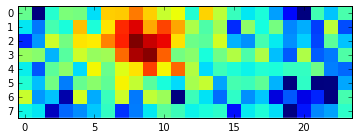

In [8]:
plt.imshow(x_train[98,0], interpolation='none')

In [4]:
x_train.shape

(100, 2, 8, 24)

In [5]:
dca = DenoisingConvAe(network_kwargs={'learning_rate':0.01}, train_kwargs={'num_epochs': 1000})

Building model and compiling functions...
(None, 2, 8, 24)
(None, 128, 11, 12)
(None, 128, 6, 6)
(None, 1024)
(None, 4608)
(None, 128, 6, 6)
(None, 128, 11, 12)
(None, 2, 8, 24)


Starting training...
Epoch 1 of 1000 took 0.373s
	training los:		0.2318
	training acc:		20.5234 %
  validation loss:		0.241269
  validation accuracy:		24.13 %


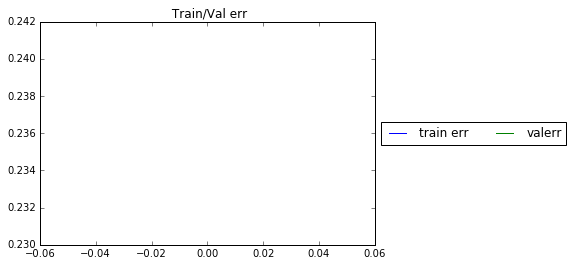

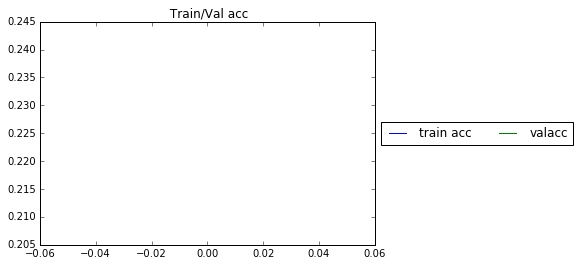

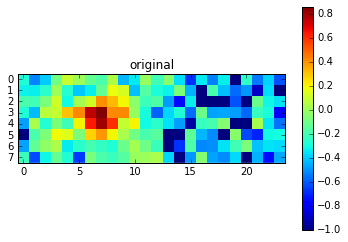

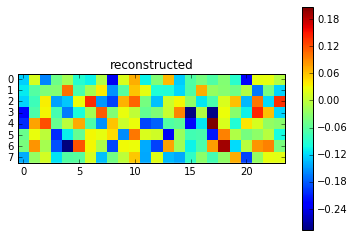

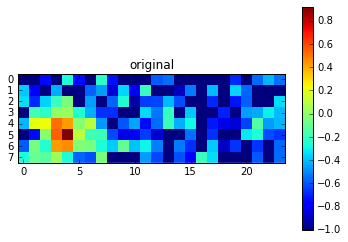

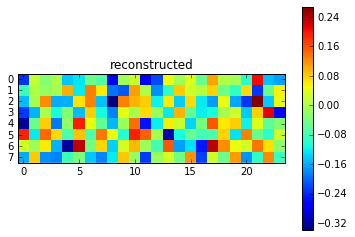

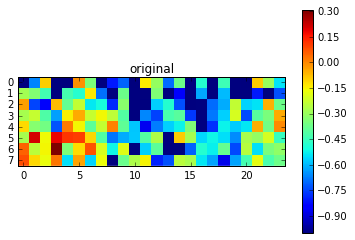

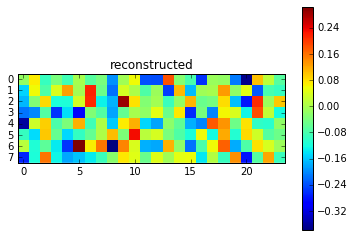

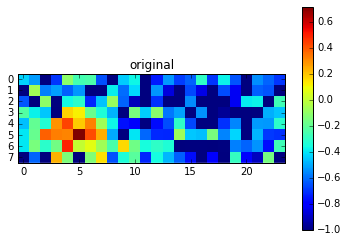

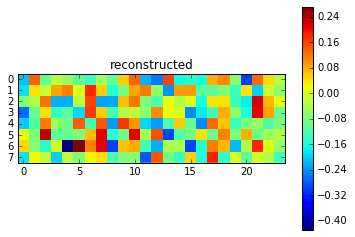

Epoch 2 of 1000 took 0.230s
	training los:		0.2050
	training acc:		17.6120 %
  validation loss:		0.210676
  validation accuracy:		21.07 %
Epoch 3 of 1000 took 0.222s
	training los:		0.1767
	training acc:		14.9271 %
  validation loss:		0.183642
  validation accuracy:		18.36 %
Epoch 4 of 1000 took 0.222s
	training los:		0.1495
	training acc:		12.8066 %
  validation loss:		0.160347
  validation accuracy:		16.03 %
Epoch 5 of 1000 took 0.221s
	training los:		0.1279
	training acc:		11.2555 %
  validation loss:		0.143288
  validation accuracy:		14.33 %
Epoch 6 of 1000 took 0.221s
	training los:		0.1123
	training acc:		10.2400 %
  validation loss:		0.132394
  validation accuracy:		13.24 %
Epoch 7 of 1000 took 0.224s
	training los:		0.1029
	training acc:		9.7877 %
  validation loss:		0.126739
  validation accuracy:		12.67 %
Epoch 8 of 1000 took 0.221s
	training los:		0.0978
	training acc:		9.7093 %
  validation loss:		0.125491
  validation accuracy:		12.55 %
Epoch 9 of 1000 took 0.219s
	trainin

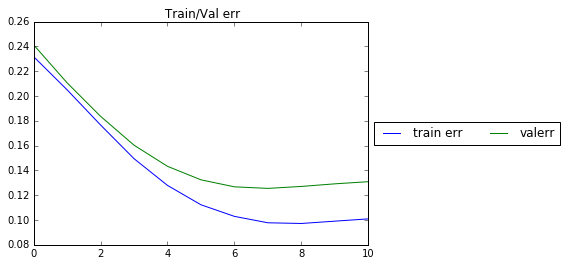

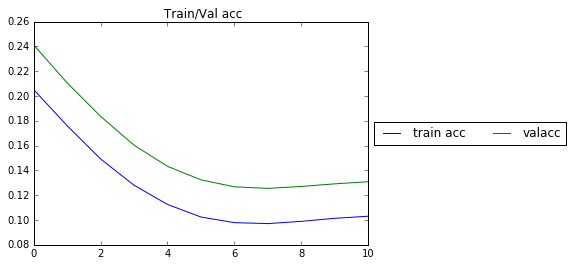

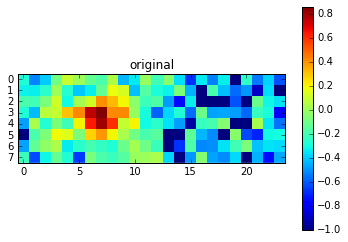

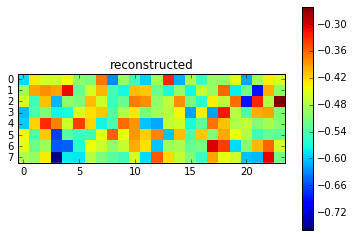

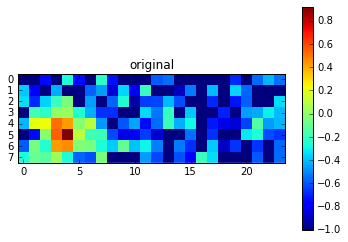

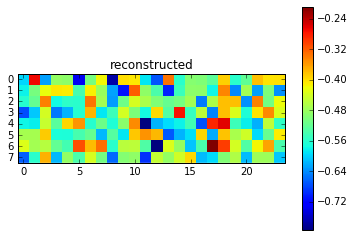

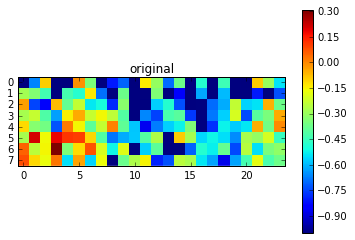

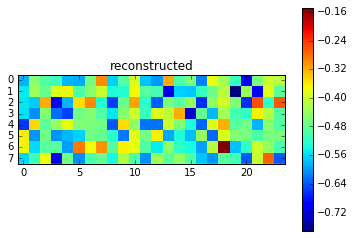

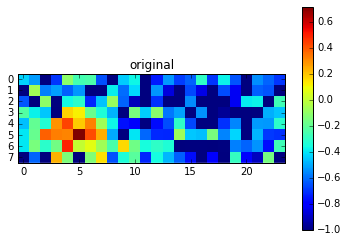

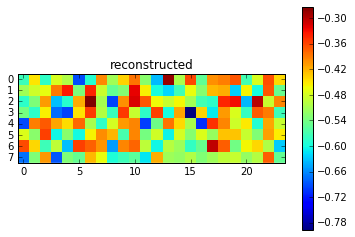

Epoch 12 of 1000 took 0.226s
	training los:		0.1027
	training acc:		10.3794 %
  validation loss:		0.132103
  validation accuracy:		13.21 %
Epoch 13 of 1000 took 0.219s
	training los:		0.1038
	training acc:		10.2773 %
  validation loss:		0.130281
  validation accuracy:		13.03 %
Epoch 14 of 1000 took 0.219s
	training los:		0.1029
	training acc:		10.1460 %
  validation loss:		0.129872
  validation accuracy:		12.99 %
Epoch 15 of 1000 took 0.220s
	training los:		0.1009
	training acc:		9.8947 %
  validation loss:		0.127238
  validation accuracy:		12.72 %
Epoch 16 of 1000 took 0.220s
	training los:		0.0994
	training acc:		9.6462 %
  validation loss:		0.124809
  validation accuracy:		12.48 %
Epoch 17 of 1000 took 0.219s
	training los:		0.0968
	training acc:		9.4602 %
  validation loss:		0.122460
  validation accuracy:		12.25 %
Epoch 18 of 1000 took 0.219s
	training los:		0.0945
	training acc:		9.2772 %
  validation loss:		0.121507
  validation accuracy:		12.15 %
Epoch 19 of 1000 took 0.219s
	t

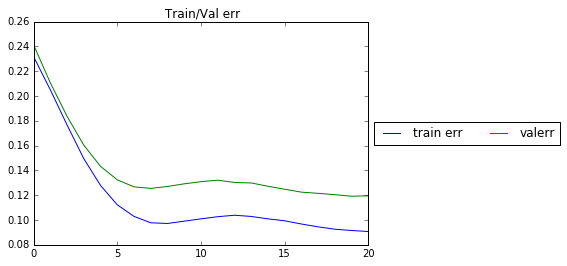

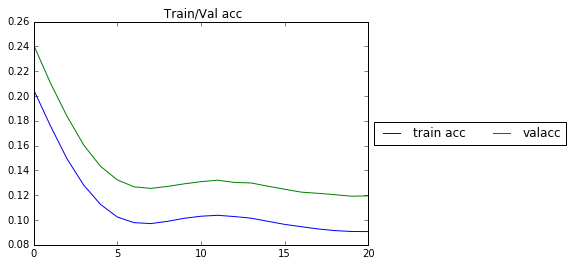

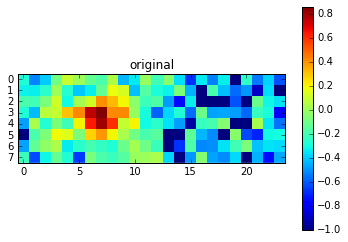

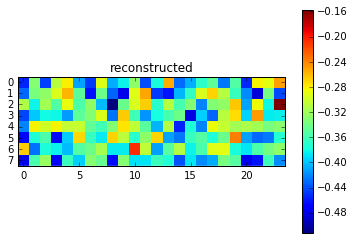

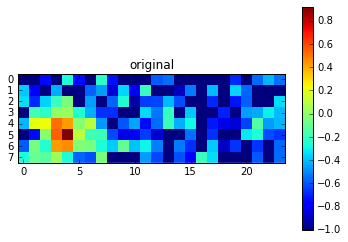

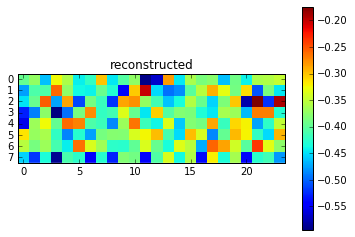

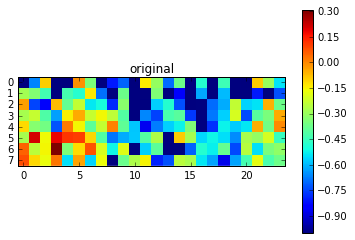

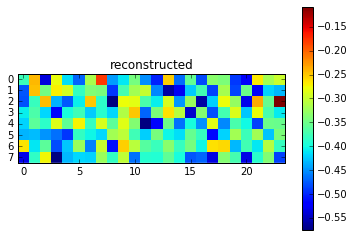

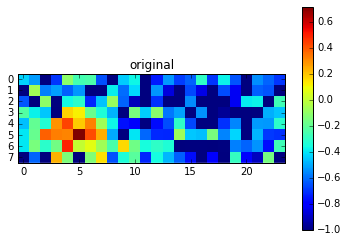

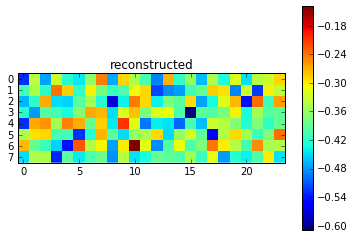

Epoch 22 of 1000 took 0.244s
	training los:		0.0903
	training acc:		9.0427 %
  validation loss:		0.119278
  validation accuracy:		11.93 %
Epoch 23 of 1000 took 0.231s
	training los:		0.0905
	training acc:		9.0350 %
  validation loss:		0.119597
  validation accuracy:		11.96 %
Epoch 24 of 1000 took 0.224s
	training los:		0.0902
	training acc:		9.0451 %
  validation loss:		0.119185
  validation accuracy:		11.92 %
Epoch 25 of 1000 took 0.224s
	training los:		0.0904
	training acc:		9.0467 %
  validation loss:		0.118359
  validation accuracy:		11.84 %
Epoch 26 of 1000 took 0.224s
	training los:		0.0903
	training acc:		9.0256 %
  validation loss:		0.119540
  validation accuracy:		11.95 %
Epoch 27 of 1000 took 0.224s
	training los:		0.0901
	training acc:		8.9991 %
  validation loss:		0.118842
  validation accuracy:		11.88 %
Epoch 28 of 1000 took 0.224s
	training los:		0.0899
	training acc:		8.9953 %
  validation loss:		0.118742
  validation accuracy:		11.87 %
Epoch 29 of 1000 took 0.223s
	trai

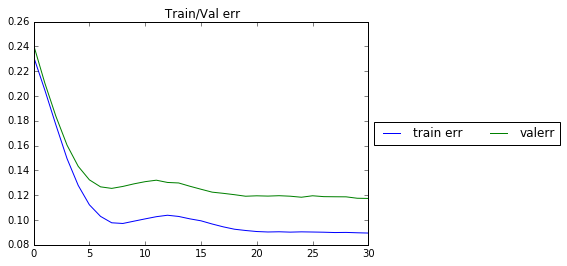

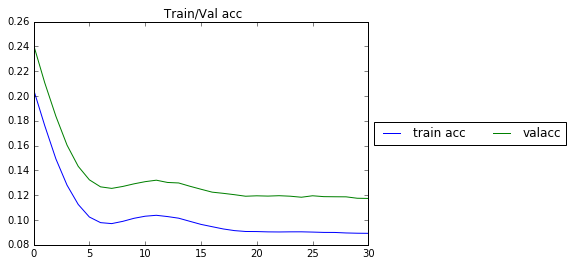

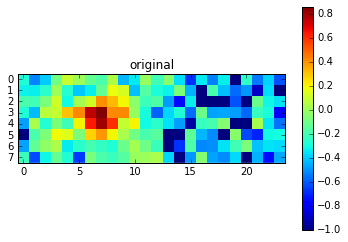

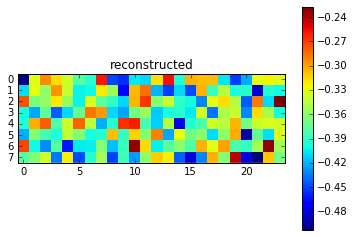

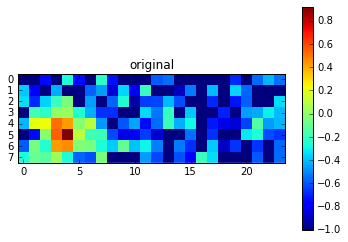

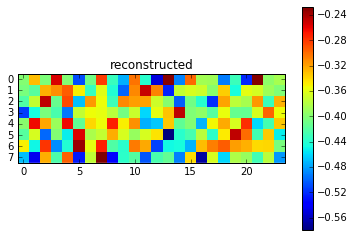

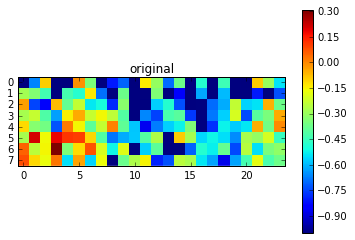

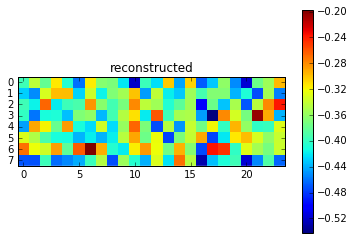

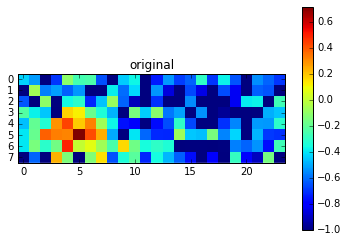

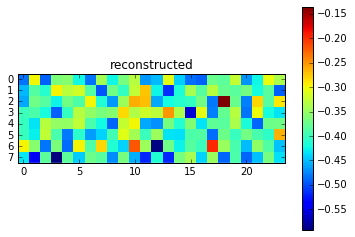

Epoch 32 of 1000 took 0.258s
	training los:		0.0890
	training acc:		8.8935 %
  validation loss:		0.117456
  validation accuracy:		11.75 %
Epoch 33 of 1000 took 0.237s
	training los:		0.0888
	training acc:		8.8506 %
  validation loss:		0.116935
  validation accuracy:		11.69 %
Epoch 34 of 1000 took 0.220s
	training los:		0.0884
	training acc:		8.8466 %
  validation loss:		0.117112
  validation accuracy:		11.71 %
Epoch 35 of 1000 took 0.220s
	training los:		0.0883
	training acc:		8.8238 %
  validation loss:		0.116838
  validation accuracy:		11.68 %
Epoch 36 of 1000 took 0.220s
	training los:		0.0883
	training acc:		8.7993 %
  validation loss:		0.115879
  validation accuracy:		11.59 %
Epoch 37 of 1000 took 0.220s
	training los:		0.0880
	training acc:		8.7924 %
  validation loss:		0.116574
  validation accuracy:		11.66 %
Epoch 38 of 1000 took 0.220s
	training los:		0.0880
	training acc:		8.7707 %
  validation loss:		0.116472
  validation accuracy:		11.65 %
Epoch 39 of 1000 took 0.220s
	trai

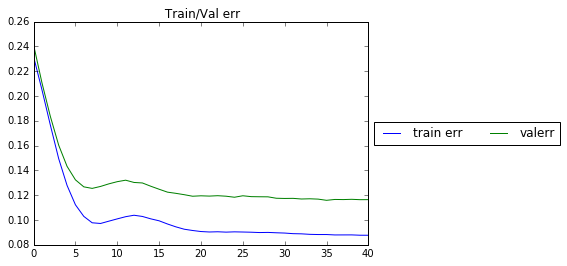

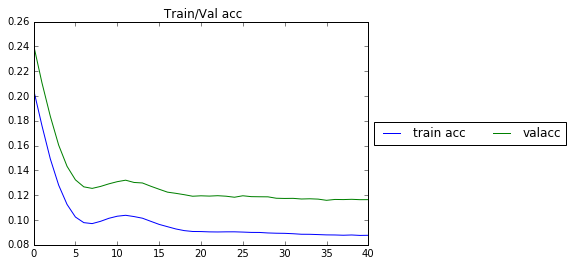

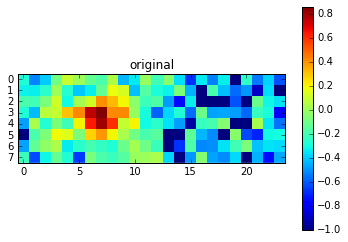

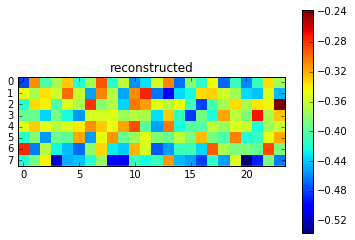

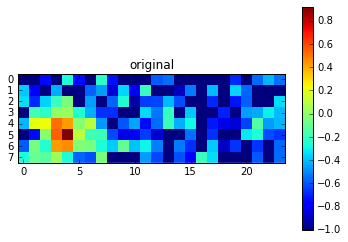

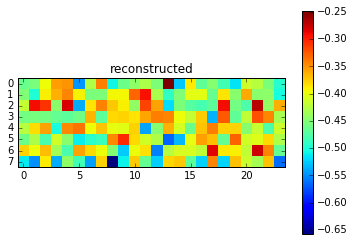

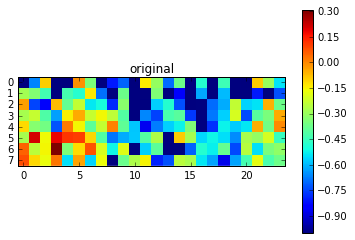

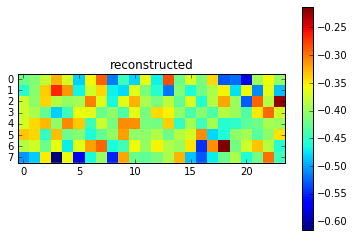

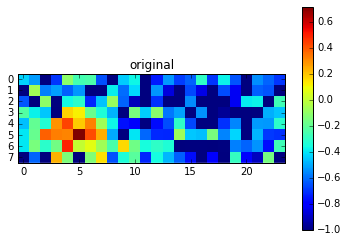

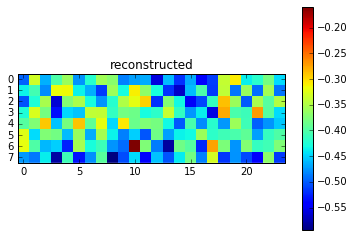

Epoch 42 of 1000 took 0.228s
	training los:		0.0878
	training acc:		8.7535 %
  validation loss:		0.116538
  validation accuracy:		11.65 %
Epoch 43 of 1000 took 0.222s
	training los:		0.0876
	training acc:		8.7408 %
  validation loss:		0.115931
  validation accuracy:		11.59 %
Epoch 44 of 1000 took 0.223s
	training los:		0.0877
	training acc:		8.7234 %
  validation loss:		0.115350
  validation accuracy:		11.53 %
Epoch 45 of 1000 took 0.222s
	training los:		0.0875
	training acc:		8.7172 %
  validation loss:		0.116130
  validation accuracy:		11.61 %
Epoch 46 of 1000 took 0.222s
	training los:		0.0875
	training acc:		8.7110 %
  validation loss:		0.115614
  validation accuracy:		11.56 %
Epoch 47 of 1000 took 0.241s
	training los:		0.0871
	training acc:		8.6924 %
  validation loss:		0.115852
  validation accuracy:		11.59 %
Epoch 48 of 1000 took 0.369s
	training los:		0.0871
	training acc:		8.6734 %
  validation loss:		0.115889
  validation accuracy:		11.59 %
Epoch 49 of 1000 took 0.223s
	trai

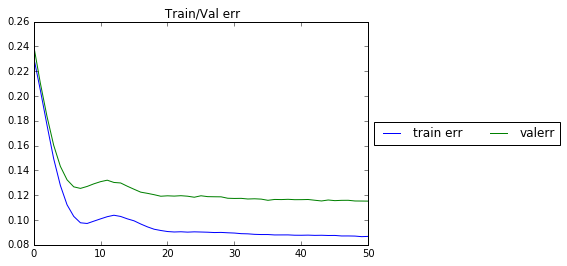

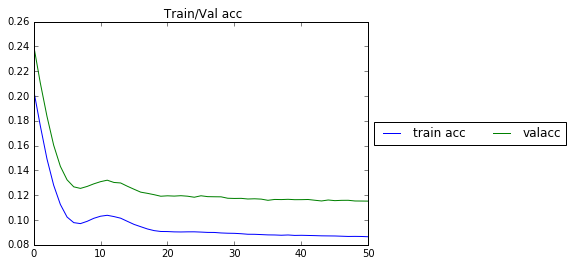

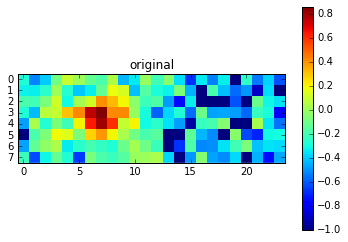

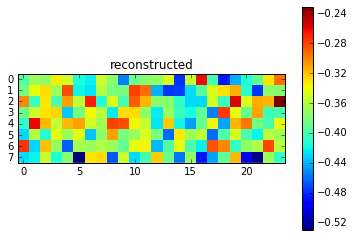

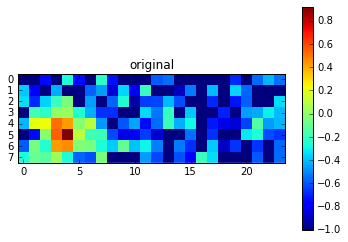

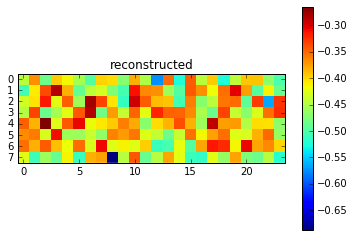

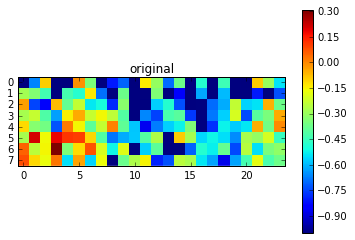

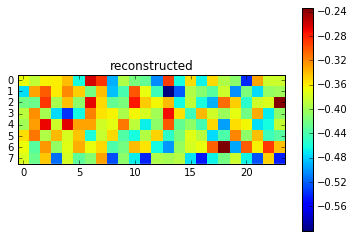

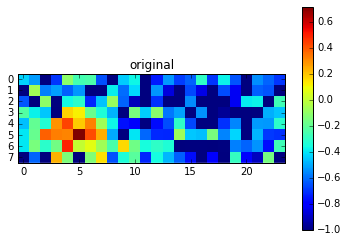

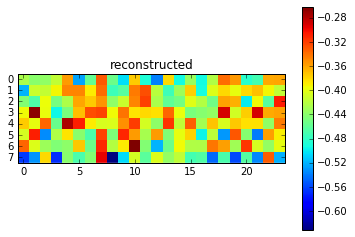

Epoch 52 of 1000 took 0.226s
	training los:		0.0869
	training acc:		8.6432 %
  validation loss:		0.114971
  validation accuracy:		11.50 %
Epoch 53 of 1000 took 0.219s
	training los:		0.0865
	training acc:		8.6403 %
  validation loss:		0.115510
  validation accuracy:		11.55 %
Epoch 54 of 1000 took 0.218s
	training los:		0.0864
	training acc:		8.6239 %
  validation loss:		0.115007
  validation accuracy:		11.50 %
Epoch 55 of 1000 took 0.218s
	training los:		0.0862
	training acc:		8.6319 %
  validation loss:		0.114851
  validation accuracy:		11.49 %
Epoch 56 of 1000 took 0.233s
	training los:		0.0863
	training acc:		8.6198 %
  validation loss:		0.115417
  validation accuracy:		11.54 %
Epoch 57 of 1000 took 0.222s
	training los:		0.0864
	training acc:		8.6165 %
  validation loss:		0.114828
  validation accuracy:		11.48 %
Epoch 58 of 1000 took 0.220s
	training los:		0.0860
	training acc:		8.5983 %
  validation loss:		0.114781
  validation accuracy:		11.48 %
Epoch 59 of 1000 took 0.220s
	trai

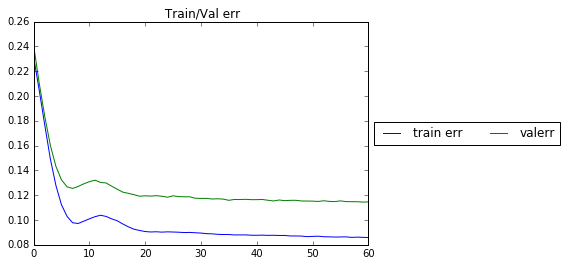

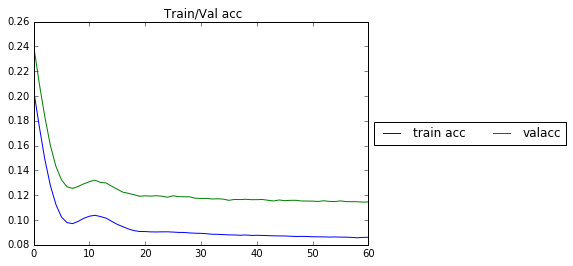

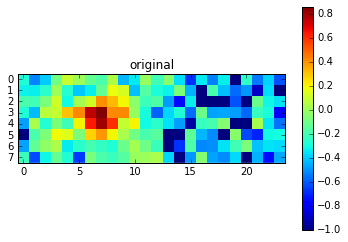

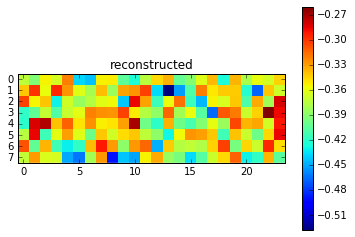

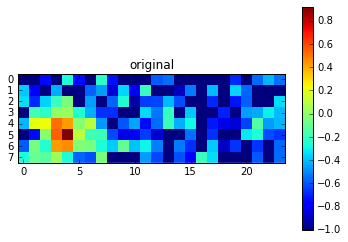

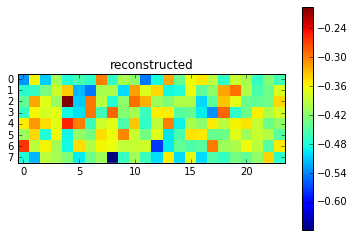

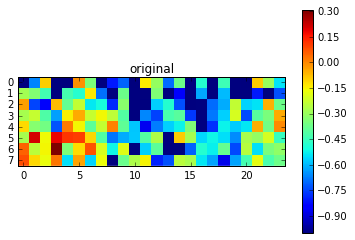

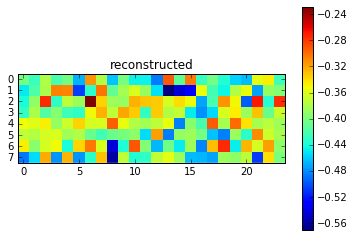

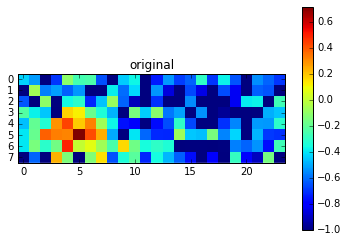

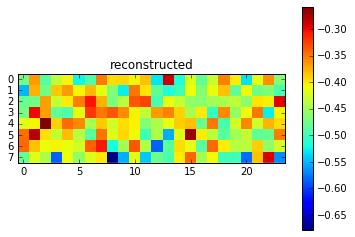

Epoch 62 of 1000 took 0.237s
	training los:		0.0859
	training acc:		8.5747 %
  validation loss:		0.114573
  validation accuracy:		11.46 %
Epoch 63 of 1000 took 0.221s
	training los:		0.0856
	training acc:		8.5604 %
  validation loss:		0.114412
  validation accuracy:		11.44 %
Epoch 64 of 1000 took 0.222s
	training los:		0.0858
	training acc:		8.5448 %
  validation loss:		0.114379
  validation accuracy:		11.44 %
Epoch 65 of 1000 took 0.221s
	training los:		0.0854
	training acc:		8.5554 %
  validation loss:		0.114503
  validation accuracy:		11.45 %
Epoch 66 of 1000 took 0.222s
	training los:		0.0857
	training acc:		8.5500 %
  validation loss:		0.113864
  validation accuracy:		11.39 %
Epoch 67 of 1000 took 0.224s
	training los:		0.0853
	training acc:		8.5357 %
  validation loss:		0.113811
  validation accuracy:		11.38 %
Epoch 68 of 1000 took 0.221s
	training los:		0.0855
	training acc:		8.5031 %
  validation loss:		0.113946
  validation accuracy:		11.39 %
Epoch 69 of 1000 took 0.224s
	trai

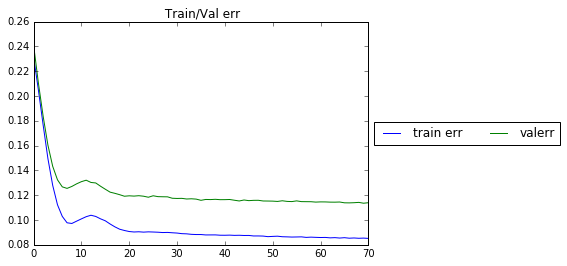

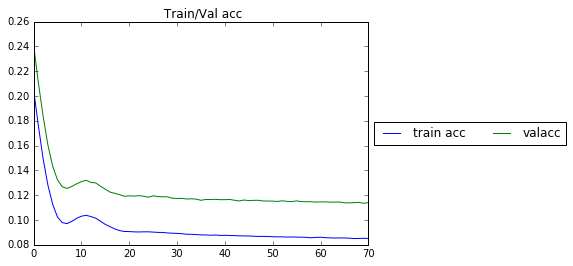

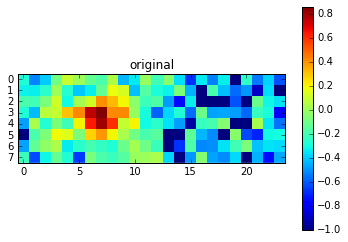

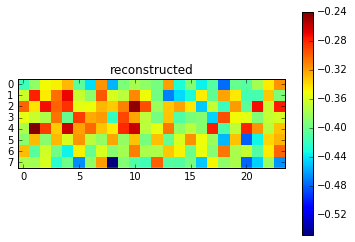

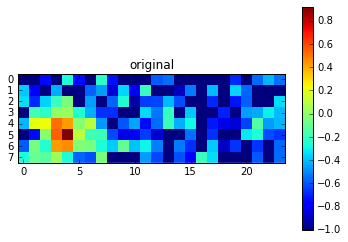

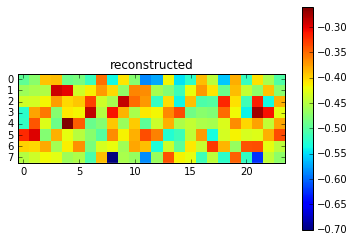

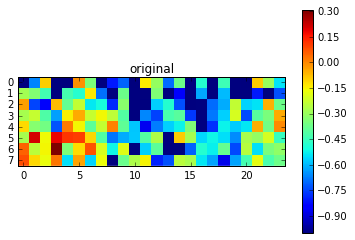

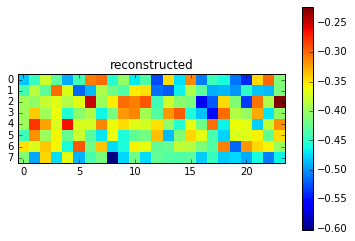

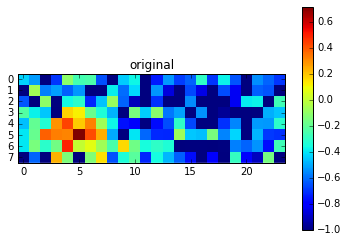

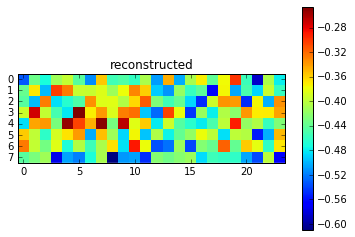

Epoch 72 of 1000 took 0.256s
	training los:		0.0854
	training acc:		8.4967 %
  validation loss:		0.113504
  validation accuracy:		11.35 %
Epoch 73 of 1000 took 0.224s
	training los:		0.0852
	training acc:		8.5031 %
  validation loss:		0.114425
  validation accuracy:		11.44 %
Epoch 74 of 1000 took 0.225s
	training los:		0.0851
	training acc:		8.4725 %
  validation loss:		0.113879
  validation accuracy:		11.39 %
Epoch 75 of 1000 took 0.224s
	training los:		0.0848
	training acc:		8.4891 %
  validation loss:		0.113654
  validation accuracy:		11.37 %
Epoch 76 of 1000 took 0.224s
	training los:		0.0847
	training acc:		8.4657 %
  validation loss:		0.113501
  validation accuracy:		11.35 %
Epoch 77 of 1000 took 0.224s
	training los:		0.0845
	training acc:		8.4560 %
  validation loss:		0.113179
  validation accuracy:		11.32 %
Epoch 78 of 1000 took 0.226s
	training los:		0.0846
	training acc:		8.4564 %
  validation loss:		0.113350
  validation accuracy:		11.34 %
Epoch 79 of 1000 took 0.225s
	trai

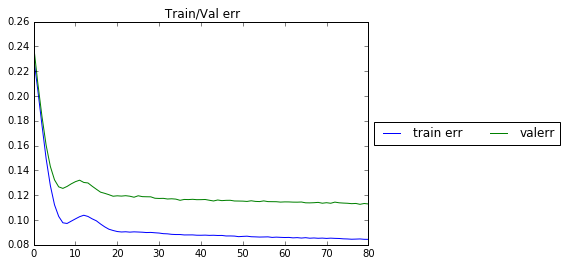

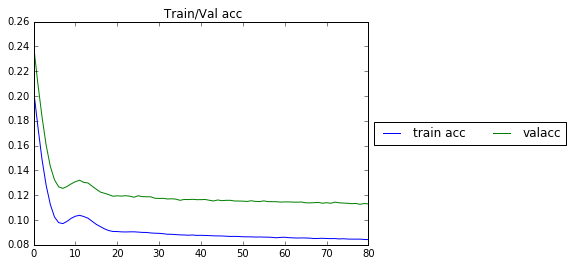

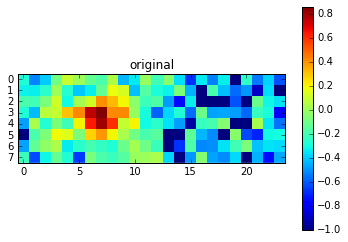

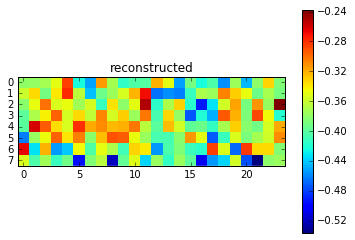

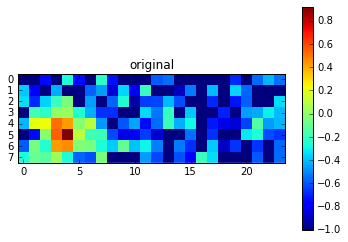

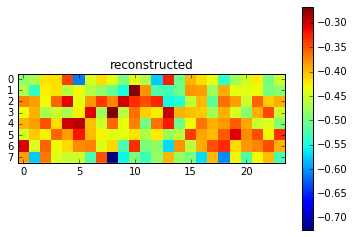

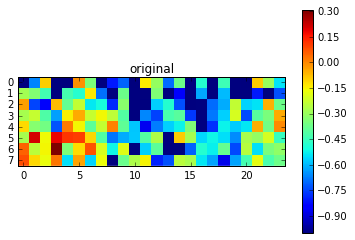

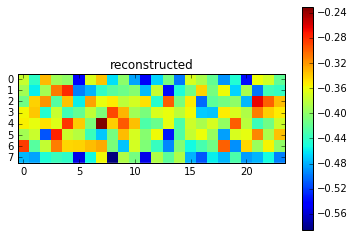

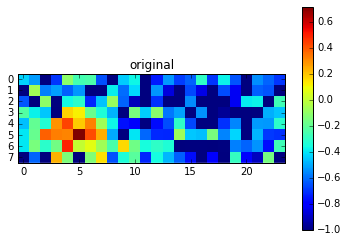

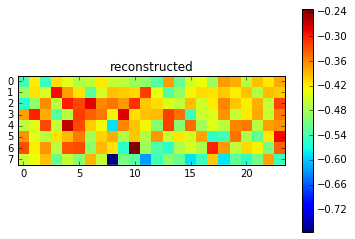

Epoch 82 of 1000 took 0.251s
	training los:		0.0845
	training acc:		8.4341 %
  validation loss:		0.113212
  validation accuracy:		11.32 %
Epoch 83 of 1000 took 0.226s
	training los:		0.0844
	training acc:		8.4331 %
  validation loss:		0.112964
  validation accuracy:		11.30 %
Epoch 84 of 1000 took 0.226s
	training los:		0.0843
	training acc:		8.4251 %
  validation loss:		0.112788
  validation accuracy:		11.28 %
Epoch 85 of 1000 took 0.225s
	training los:		0.0841
	training acc:		8.3799 %
  validation loss:		0.112370
  validation accuracy:		11.24 %
Epoch 86 of 1000 took 0.226s
	training los:		0.0841
	training acc:		8.4051 %
  validation loss:		0.112895
  validation accuracy:		11.29 %
Epoch 87 of 1000 took 0.228s
	training los:		0.0840
	training acc:		8.3942 %
  validation loss:		0.112831
  validation accuracy:		11.28 %
Epoch 88 of 1000 took 0.226s
	training los:		0.0840
	training acc:		8.3572 %
  validation loss:		0.113086
  validation accuracy:		11.31 %
Epoch 89 of 1000 took 0.228s
	trai

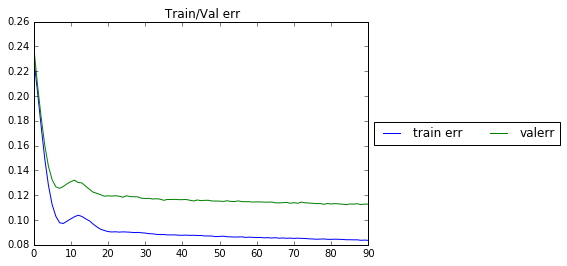

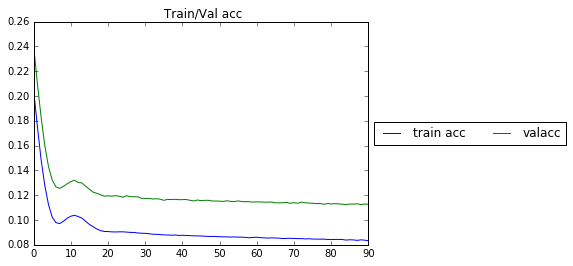

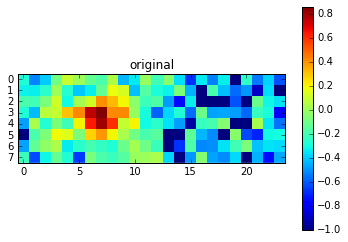

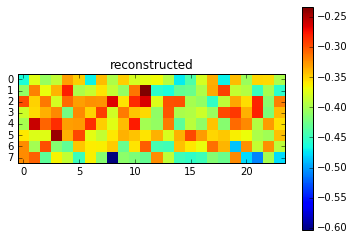

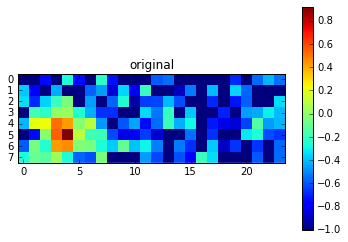

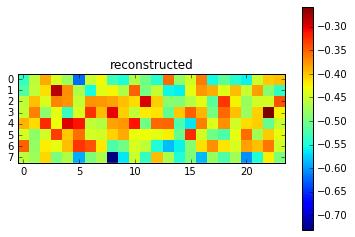

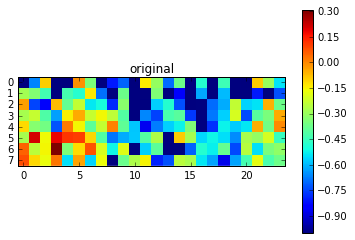

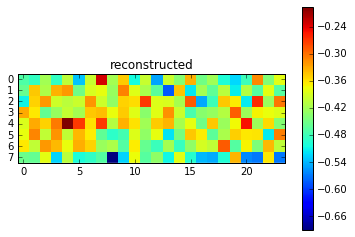

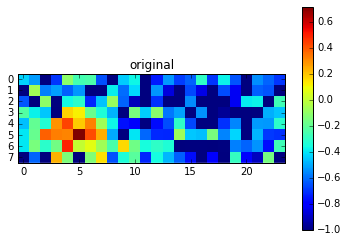

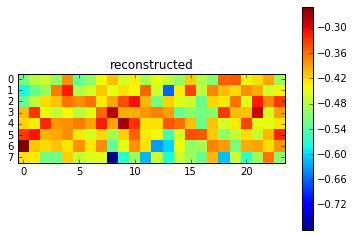

Epoch 92 of 1000 took 0.241s
	training los:		0.0837
	training acc:		8.3646 %
  validation loss:		0.112240
  validation accuracy:		11.22 %
Epoch 93 of 1000 took 0.223s
	training los:		0.0835
	training acc:		8.3427 %
  validation loss:		0.112173
  validation accuracy:		11.22 %
Epoch 94 of 1000 took 0.221s
	training los:		0.0835
	training acc:		8.3410 %
  validation loss:		0.112449
  validation accuracy:		11.24 %
Epoch 95 of 1000 took 0.222s
	training los:		0.0834
	training acc:		8.3308 %
  validation loss:		0.111928
  validation accuracy:		11.19 %
Epoch 96 of 1000 took 0.222s
	training los:		0.0835
	training acc:		8.3327 %
  validation loss:		0.112189
  validation accuracy:		11.22 %
Epoch 97 of 1000 took 0.222s
	training los:		0.0833
	training acc:		8.3235 %
  validation loss:		0.111652
  validation accuracy:		11.17 %
Epoch 98 of 1000 took 0.221s
	training los:		0.0831
	training acc:		8.3126 %
  validation loss:		0.111892
  validation accuracy:		11.19 %
Epoch 99 of 1000 took 0.221s
	trai

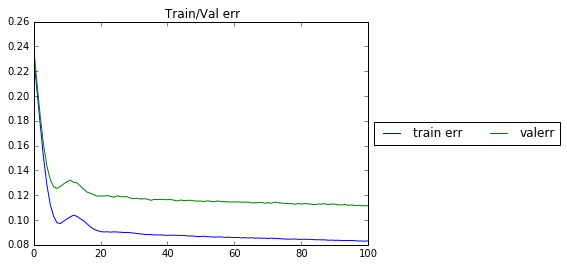

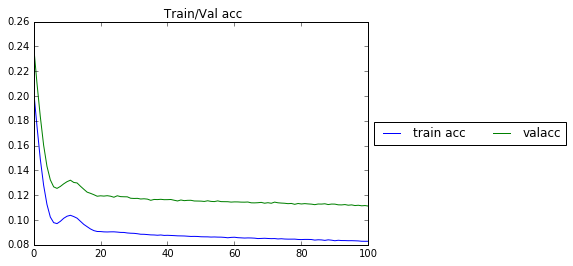

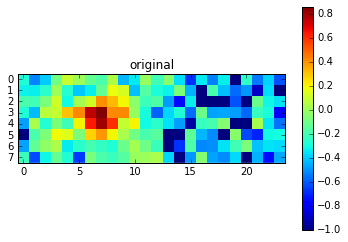

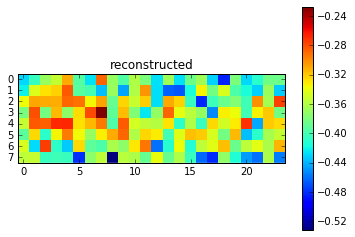

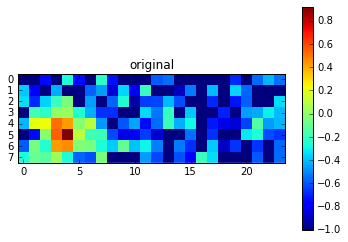

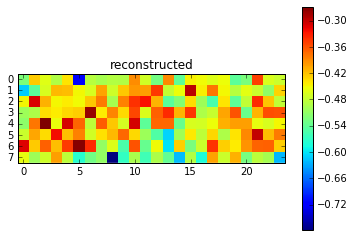

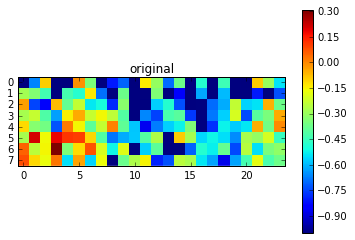

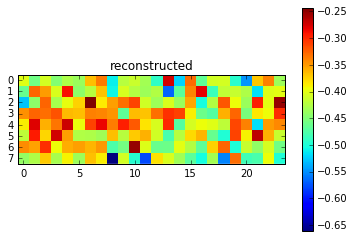

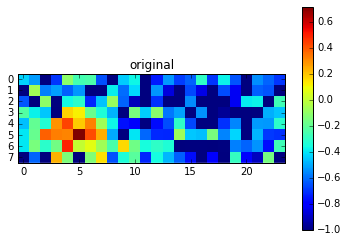

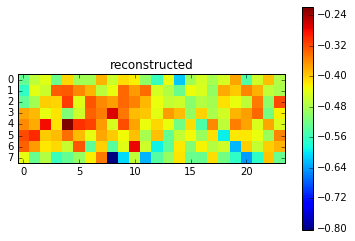

Epoch 102 of 1000 took 0.237s
	training los:		0.0828
	training acc:		8.2723 %
  validation loss:		0.111607
  validation accuracy:		11.16 %
Epoch 103 of 1000 took 0.222s
	training los:		0.0828
	training acc:		8.2744 %
  validation loss:		0.111558
  validation accuracy:		11.16 %
Epoch 104 of 1000 took 0.223s
	training los:		0.0825
	training acc:		8.2522 %
  validation loss:		0.111062
  validation accuracy:		11.11 %
Epoch 105 of 1000 took 0.222s
	training los:		0.0828
	training acc:		8.2577 %
  validation loss:		0.111752
  validation accuracy:		11.18 %
Epoch 106 of 1000 took 0.222s
	training los:		0.0826
	training acc:		8.2591 %
  validation loss:		0.111754
  validation accuracy:		11.18 %
Epoch 107 of 1000 took 0.222s
	training los:		0.0824
	training acc:		8.2179 %
  validation loss:		0.111613
  validation accuracy:		11.16 %
Epoch 108 of 1000 took 0.223s
	training los:		0.0824
	training acc:		8.2221 %
  validation loss:		0.111022
  validation accuracy:		11.10 %
Epoch 109 of 1000 took 0.22

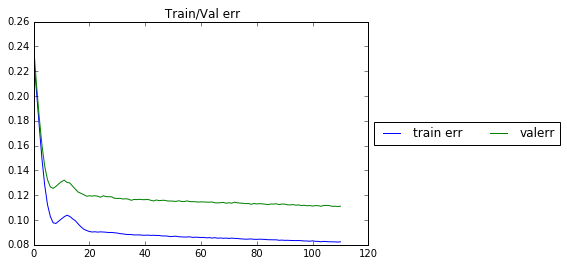

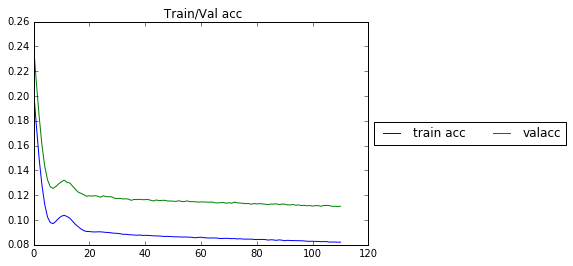

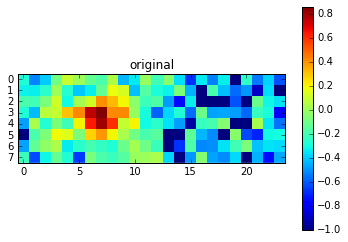

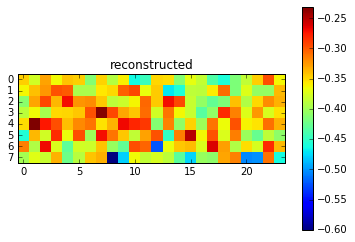

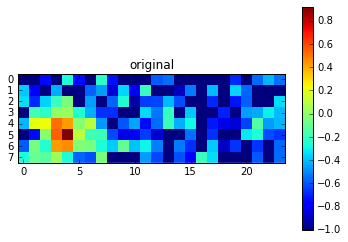

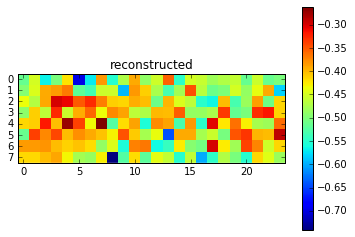

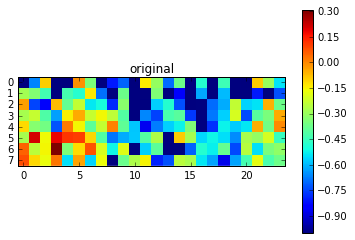

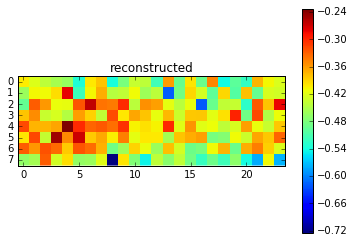

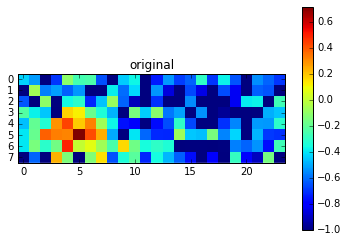

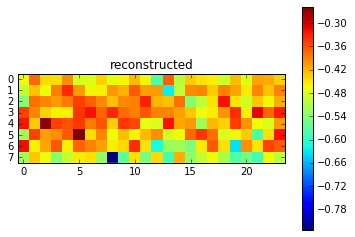

Epoch 112 of 1000 took 0.423s
	training los:		0.0821
	training acc:		8.1831 %
  validation loss:		0.110866
  validation accuracy:		11.09 %
Epoch 113 of 1000 took 0.227s
	training los:		0.0820
	training acc:		8.1902 %
  validation loss:		0.111080
  validation accuracy:		11.11 %
Epoch 114 of 1000 took 0.221s
	training los:		0.0821
	training acc:		8.1908 %
  validation loss:		0.110667
  validation accuracy:		11.07 %
Epoch 115 of 1000 took 0.220s
	training los:		0.0820
	training acc:		8.1855 %
  validation loss:		0.111027
  validation accuracy:		11.10 %
Epoch 116 of 1000 took 0.221s
	training los:		0.0817
	training acc:		8.1792 %
  validation loss:		0.110680
  validation accuracy:		11.07 %
Epoch 117 of 1000 took 0.221s
	training los:		0.0816
	training acc:		8.1578 %
  validation loss:		0.110596
  validation accuracy:		11.06 %
Epoch 118 of 1000 took 0.221s
	training los:		0.0816
	training acc:		8.1558 %
  validation loss:		0.110324
  validation accuracy:		11.03 %
Epoch 119 of 1000 took 0.22

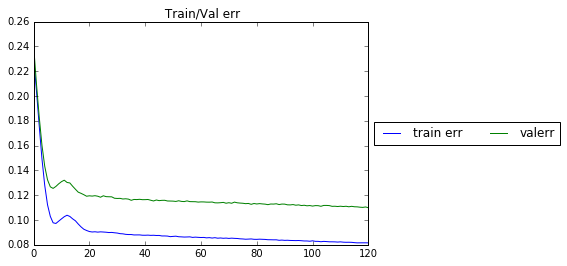

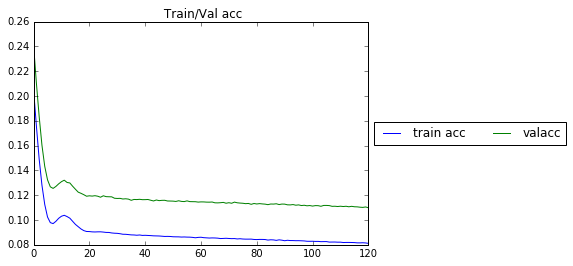

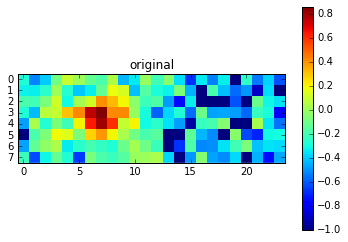

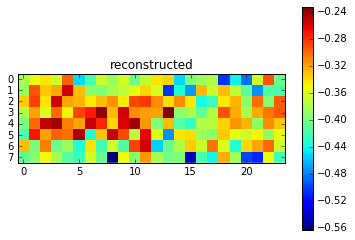

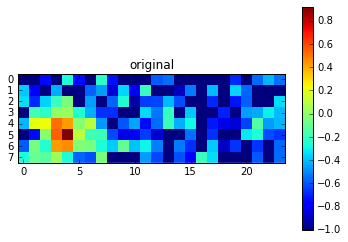

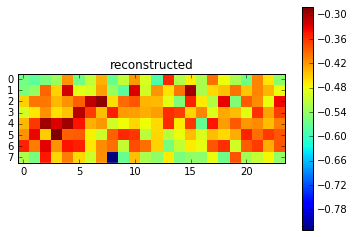

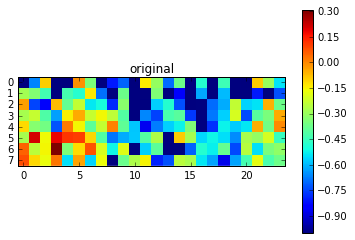

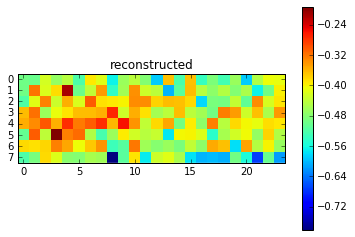

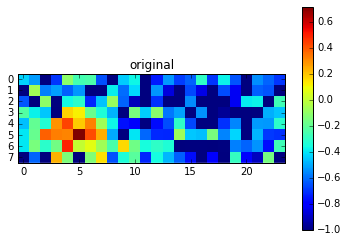

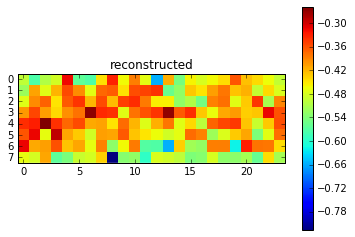

Epoch 122 of 1000 took 0.259s
	training los:		0.0813
	training acc:		8.1282 %
  validation loss:		0.110346
  validation accuracy:		11.03 %
Epoch 123 of 1000 took 0.231s
	training los:		0.0812
	training acc:		8.1137 %
  validation loss:		0.109845
  validation accuracy:		10.98 %
Epoch 124 of 1000 took 0.221s
	training los:		0.0811
	training acc:		8.1093 %
  validation loss:		0.109748
  validation accuracy:		10.97 %
Epoch 125 of 1000 took 0.221s
	training los:		0.0812
	training acc:		8.1051 %
  validation loss:		0.110325
  validation accuracy:		11.03 %
Epoch 126 of 1000 took 0.221s
	training los:		0.0810
	training acc:		8.0830 %
  validation loss:		0.109799
  validation accuracy:		10.98 %
Epoch 127 of 1000 took 0.222s
	training los:		0.0809
	training acc:		8.0732 %
  validation loss:		0.109800
  validation accuracy:		10.98 %
Epoch 128 of 1000 took 0.221s
	training los:		0.0807
	training acc:		8.0638 %
  validation loss:		0.109368
  validation accuracy:		10.94 %
Epoch 129 of 1000 took 0.22

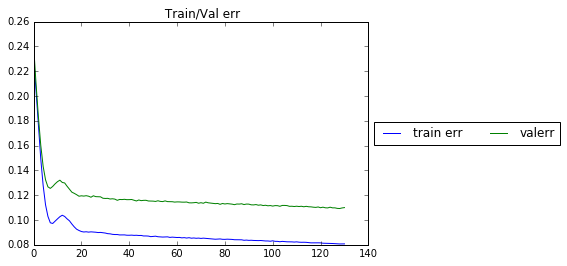

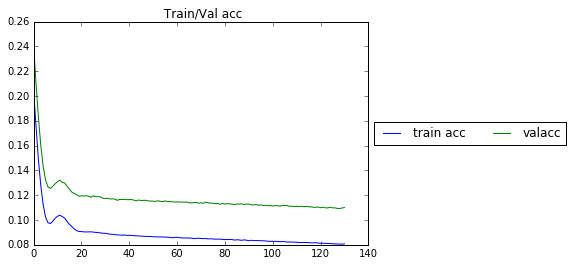

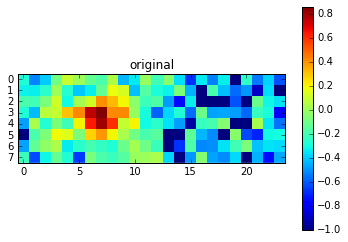

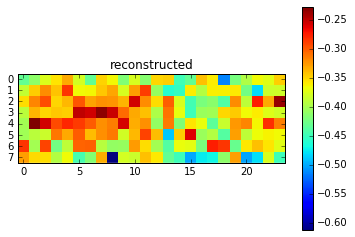

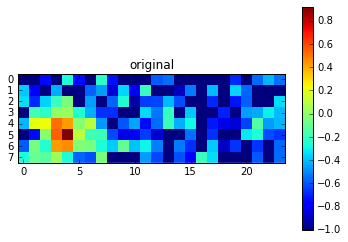

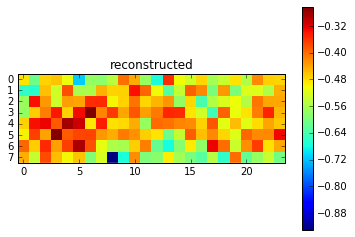

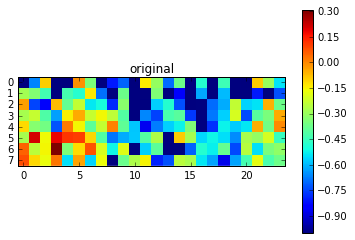

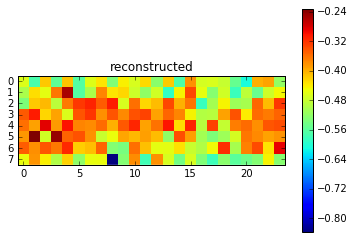

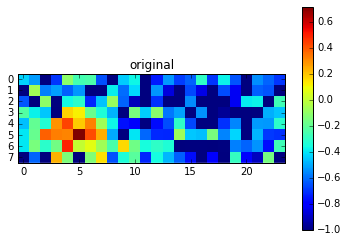

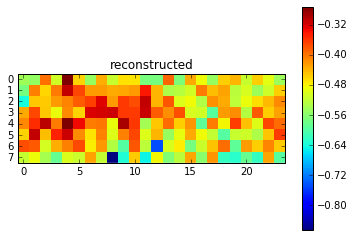

Epoch 132 of 1000 took 0.352s
	training los:		0.0806
	training acc:		8.0676 %
  validation loss:		0.109753
  validation accuracy:		10.98 %
Epoch 133 of 1000 took 0.222s
	training los:		0.0803
	training acc:		8.0516 %
  validation loss:		0.109626
  validation accuracy:		10.96 %
Epoch 134 of 1000 took 0.221s
	training los:		0.0805
	training acc:		8.0302 %
  validation loss:		0.108614
  validation accuracy:		10.86 %
Epoch 135 of 1000 took 0.221s
	training los:		0.0803
	training acc:		7.9976 %
  validation loss:		0.109127
  validation accuracy:		10.91 %
Epoch 136 of 1000 took 0.221s
	training los:		0.0802
	training acc:		8.0140 %
  validation loss:		0.108994
  validation accuracy:		10.90 %
Epoch 137 of 1000 took 0.221s
	training los:		0.0803
	training acc:		8.0013 %
  validation loss:		0.108841
  validation accuracy:		10.88 %
Epoch 138 of 1000 took 0.221s
	training los:		0.0802
	training acc:		7.9910 %
  validation loss:		0.108984
  validation accuracy:		10.90 %
Epoch 139 of 1000 took 0.22

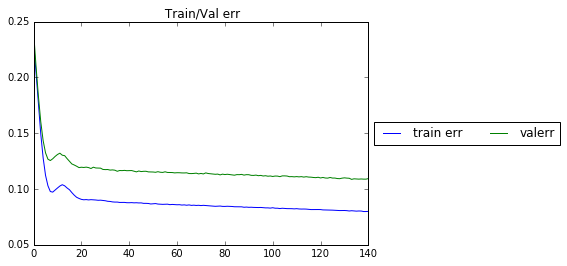

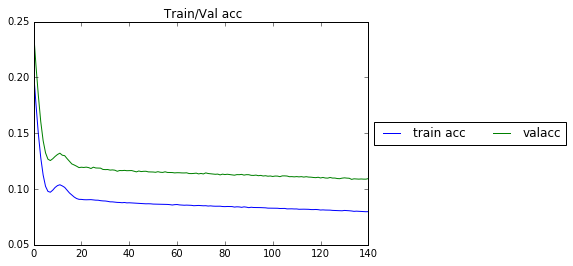

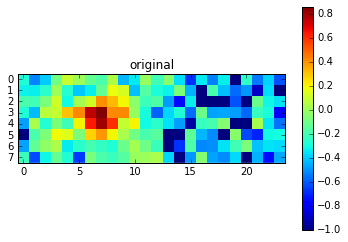

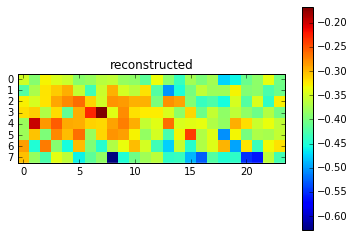

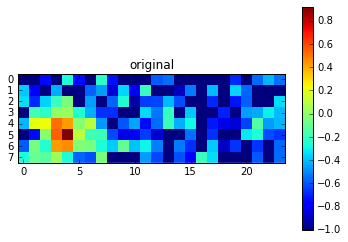

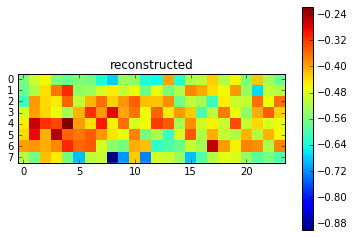

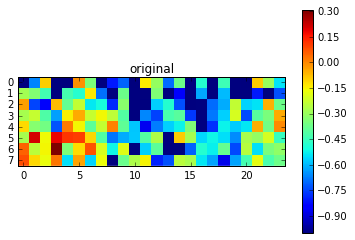

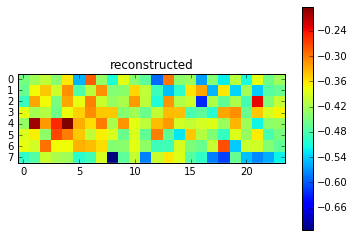

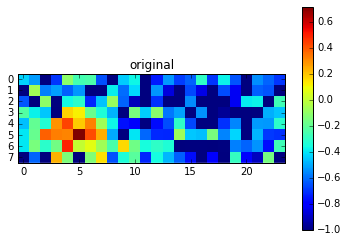

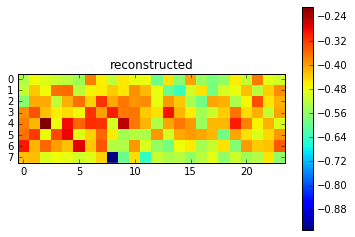

Epoch 142 of 1000 took 0.296s
	training los:		0.0797
	training acc:		7.9391 %
  validation loss:		0.108607
  validation accuracy:		10.86 %
Epoch 143 of 1000 took 0.242s
	training los:		0.0796
	training acc:		7.9562 %
  validation loss:		0.108884
  validation accuracy:		10.89 %
Epoch 144 of 1000 took 0.228s
	training los:		0.0794
	training acc:		7.9117 %
  validation loss:		0.108767
  validation accuracy:		10.88 %
Epoch 145 of 1000 took 0.222s
	training los:		0.0794
	training acc:		7.9203 %
  validation loss:		0.108240
  validation accuracy:		10.82 %
Epoch 146 of 1000 took 0.222s
	training los:		0.0794
	training acc:		7.9562 %
  validation loss:		0.108608
  validation accuracy:		10.86 %
Epoch 147 of 1000 took 0.224s
	training los:		0.0789
	training acc:		7.9088 %
  validation loss:		0.108358
  validation accuracy:		10.84 %
Epoch 148 of 1000 took 0.223s
	training los:		0.0792
	training acc:		7.9009 %
  validation loss:		0.108152
  validation accuracy:		10.82 %
Epoch 149 of 1000 took 0.22

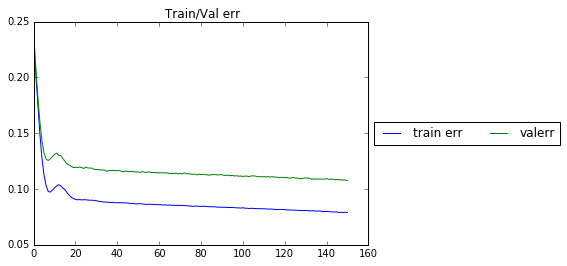

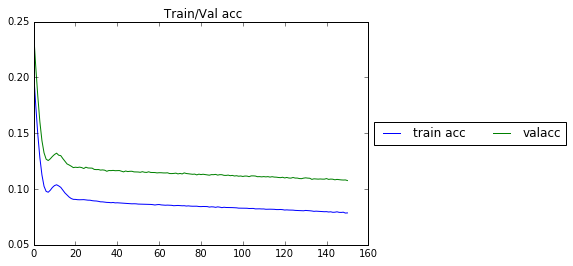

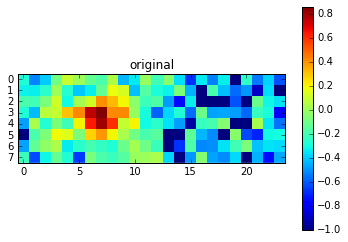

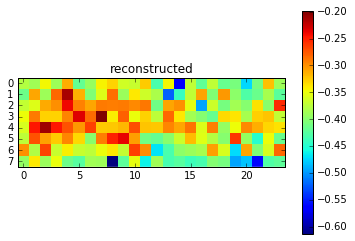

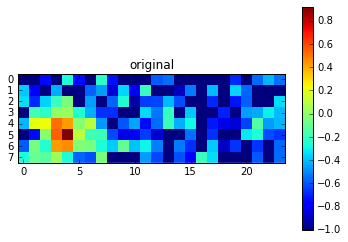

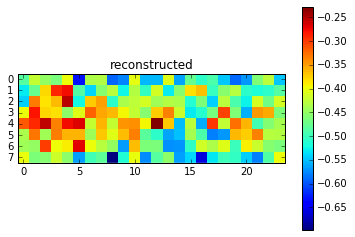

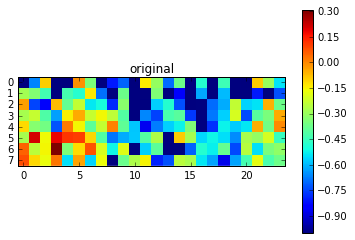

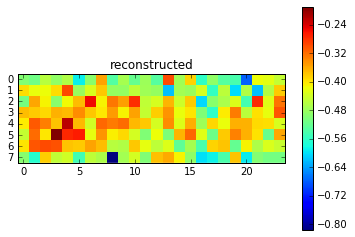

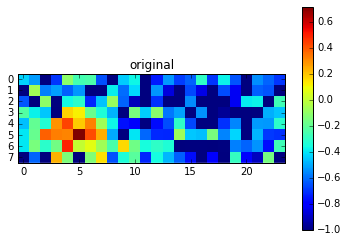

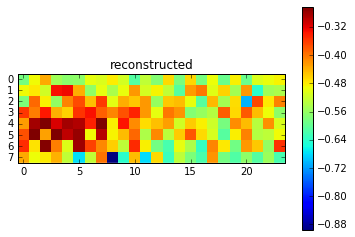

Epoch 152 of 1000 took 0.262s
	training los:		0.0788
	training acc:		7.8785 %
  validation loss:		0.107905
  validation accuracy:		10.79 %
Epoch 153 of 1000 took 0.232s
	training los:		0.0787
	training acc:		7.8751 %
  validation loss:		0.107785
  validation accuracy:		10.78 %
Epoch 154 of 1000 took 0.219s
	training los:		0.0787
	training acc:		7.8540 %
  validation loss:		0.107691
  validation accuracy:		10.77 %
Epoch 155 of 1000 took 0.219s
	training los:		0.0786
	training acc:		7.8696 %
  validation loss:		0.107504
  validation accuracy:		10.75 %
Epoch 156 of 1000 took 0.219s
	training los:		0.0783
	training acc:		7.8239 %
  validation loss:		0.107830
  validation accuracy:		10.78 %
Epoch 157 of 1000 took 0.219s
	training los:		0.0782
	training acc:		7.8381 %
  validation loss:		0.107359
  validation accuracy:		10.74 %
Epoch 158 of 1000 took 0.220s
	training los:		0.0783
	training acc:		7.8232 %
  validation loss:		0.107087
  validation accuracy:		10.71 %
Epoch 159 of 1000 took 0.22

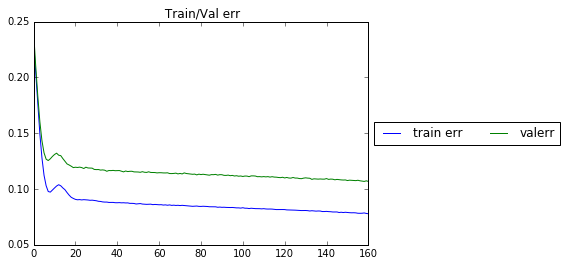

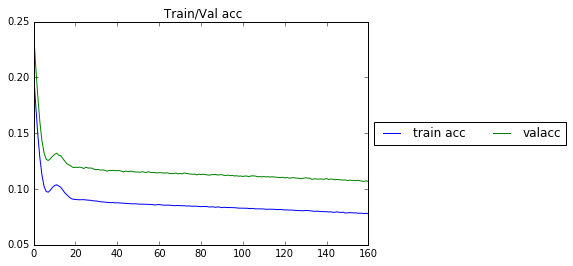

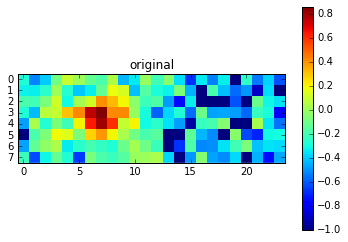

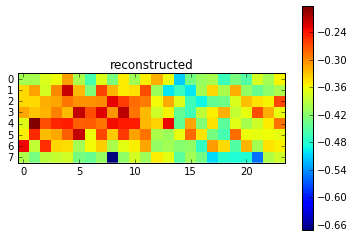

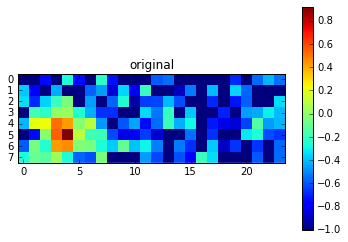

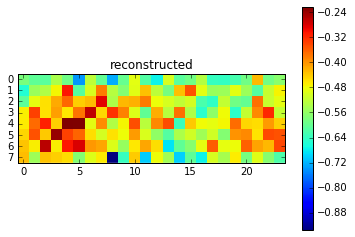

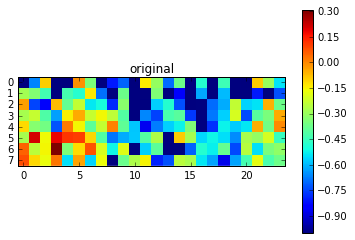

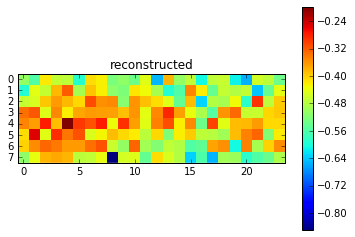

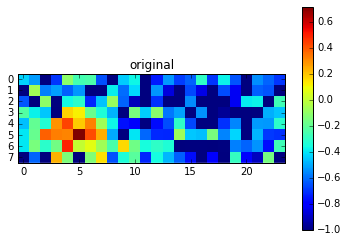

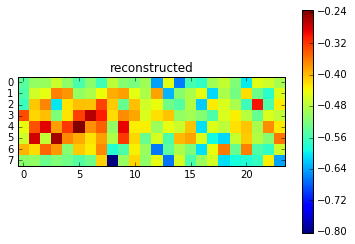

Epoch 162 of 1000 took 0.463s
	training los:		0.0779
	training acc:		7.8076 %
  validation loss:		0.106832
  validation accuracy:		10.68 %
Epoch 163 of 1000 took 0.220s
	training los:		0.0778
	training acc:		7.8020 %
  validation loss:		0.107039
  validation accuracy:		10.70 %
Epoch 164 of 1000 took 0.221s
	training los:		0.0774
	training acc:		7.7820 %
  validation loss:		0.107121
  validation accuracy:		10.71 %
Epoch 165 of 1000 took 0.220s
	training los:		0.0778
	training acc:		7.7916 %
  validation loss:		0.106697
  validation accuracy:		10.67 %
Epoch 166 of 1000 took 0.220s
	training los:		0.0776
	training acc:		7.7814 %
  validation loss:		0.106953
  validation accuracy:		10.70 %
Epoch 167 of 1000 took 0.220s
	training los:		0.0775
	training acc:		7.7552 %
  validation loss:		0.106519
  validation accuracy:		10.65 %
Epoch 168 of 1000 took 0.220s
	training los:		0.0774
	training acc:		7.7285 %
  validation loss:		0.106988
  validation accuracy:		10.70 %
Epoch 169 of 1000 took 0.22

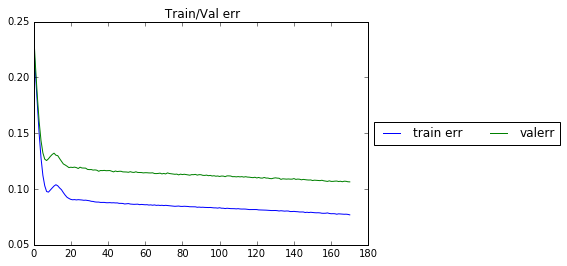

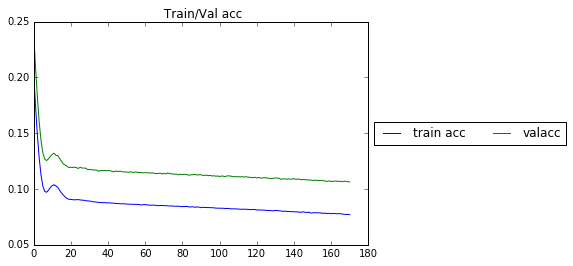

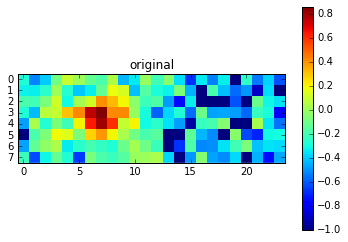

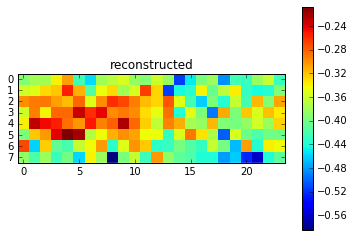

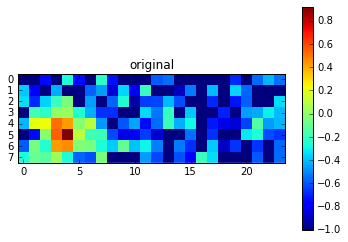

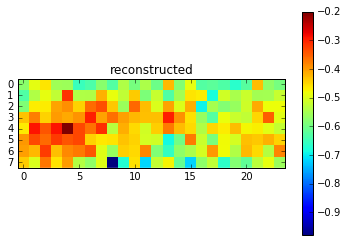

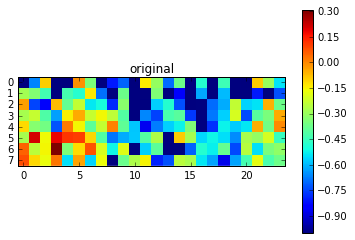

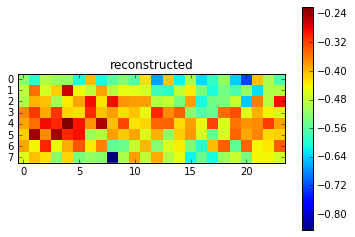

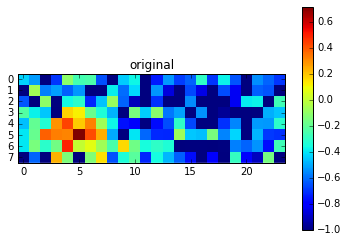

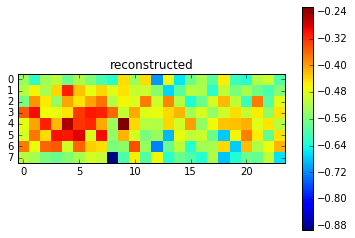

Epoch 172 of 1000 took 0.267s
	training los:		0.0770
	training acc:		7.7323 %
  validation loss:		0.106132
  validation accuracy:		10.61 %
Epoch 173 of 1000 took 0.254s
	training los:		0.0771
	training acc:		7.6705 %
  validation loss:		0.105637
  validation accuracy:		10.56 %
Epoch 174 of 1000 took 0.224s
	training los:		0.0767
	training acc:		7.6628 %
  validation loss:		0.106546
  validation accuracy:		10.65 %
Epoch 175 of 1000 took 0.222s
	training los:		0.0769
	training acc:		7.6562 %
  validation loss:		0.106104
  validation accuracy:		10.61 %
Epoch 176 of 1000 took 0.223s
	training los:		0.0768
	training acc:		7.6457 %
  validation loss:		0.105799
  validation accuracy:		10.58 %
Epoch 177 of 1000 took 0.222s
	training los:		0.0766
	training acc:		7.6520 %
  validation loss:		0.105675
  validation accuracy:		10.57 %
Epoch 178 of 1000 took 0.222s
	training los:		0.0764
	training acc:		7.6264 %
  validation loss:		0.105916
  validation accuracy:		10.59 %
Epoch 179 of 1000 took 0.22

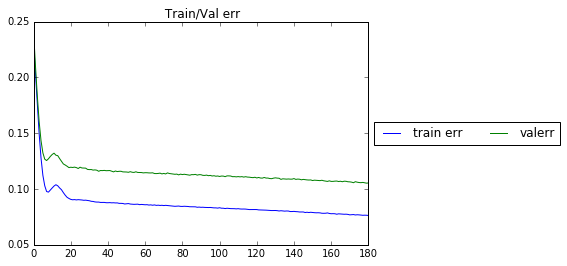

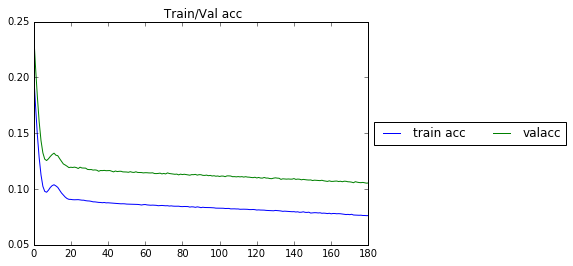

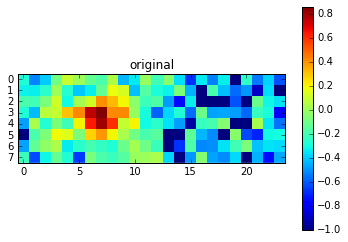

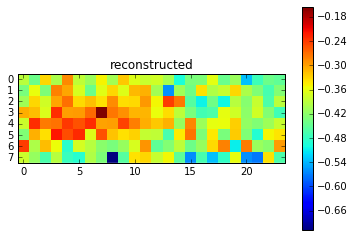

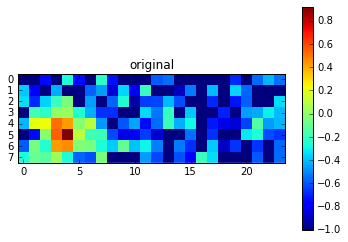

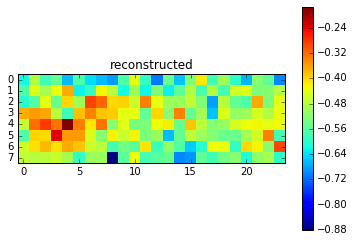

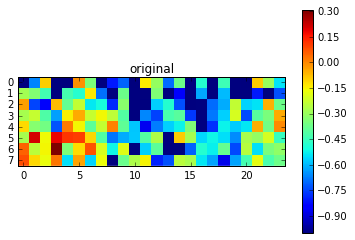

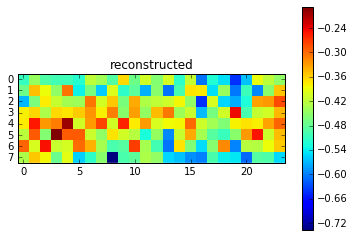

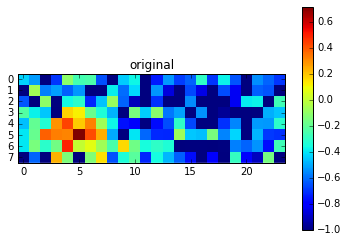

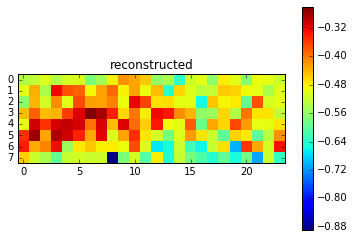

Epoch 182 of 1000 took 0.232s
	training los:		0.0761
	training acc:		7.5985 %
  validation loss:		0.105289
  validation accuracy:		10.53 %
Epoch 183 of 1000 took 0.221s
	training los:		0.0762
	training acc:		7.5887 %
  validation loss:		0.105481
  validation accuracy:		10.55 %
Epoch 184 of 1000 took 0.221s
	training los:		0.0760
	training acc:		7.5963 %
  validation loss:		0.105330
  validation accuracy:		10.53 %
Epoch 185 of 1000 took 0.248s
	training los:		0.0760
	training acc:		7.5648 %
  validation loss:		0.105097
  validation accuracy:		10.51 %
Epoch 186 of 1000 took 0.222s
	training los:		0.0755
	training acc:		7.5567 %
  validation loss:		0.104958
  validation accuracy:		10.50 %
Epoch 187 of 1000 took 0.222s
	training los:		0.0755
	training acc:		7.5277 %
  validation loss:		0.105217
  validation accuracy:		10.52 %
Epoch 188 of 1000 took 0.221s
	training los:		0.0755
	training acc:		7.5328 %
  validation loss:		0.104649
  validation accuracy:		10.46 %
Epoch 189 of 1000 took 0.22

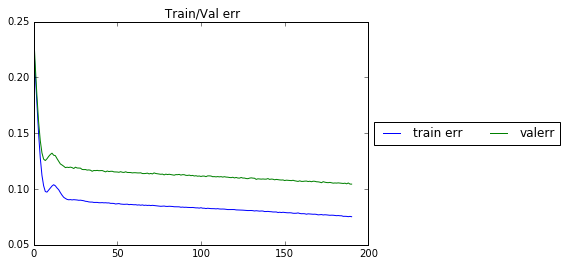

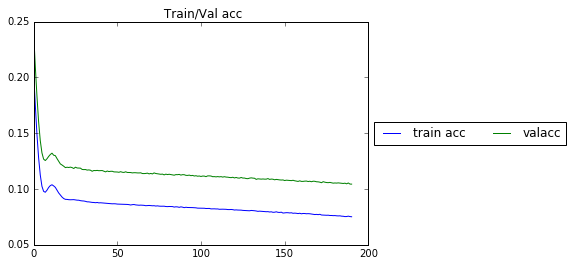

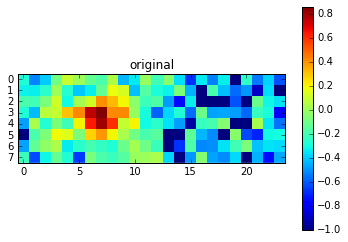

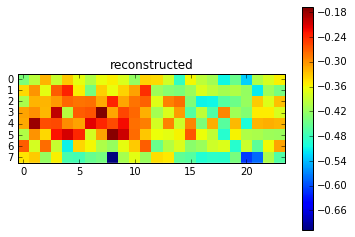

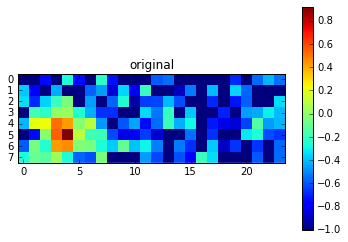

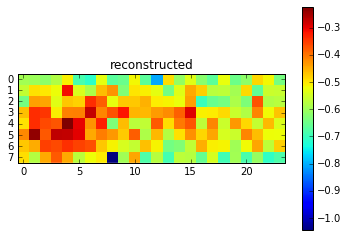

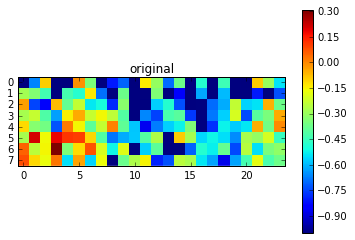

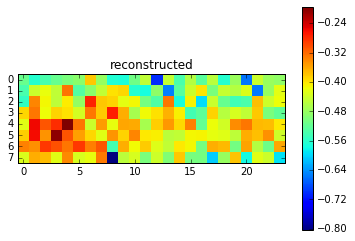

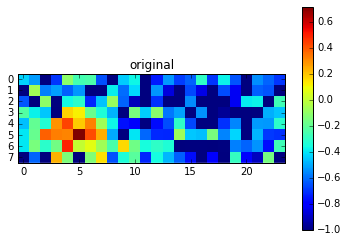

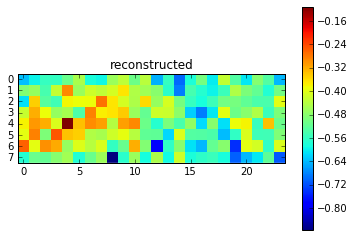

Epoch 192 of 1000 took 0.252s
	training los:		0.0752
	training acc:		7.5007 %
  validation loss:		0.104798
  validation accuracy:		10.48 %
Epoch 193 of 1000 took 0.220s
	training los:		0.0753
	training acc:		7.5174 %
  validation loss:		0.104142
  validation accuracy:		10.41 %
Epoch 194 of 1000 took 0.219s
	training los:		0.0750
	training acc:		7.4935 %
  validation loss:		0.104613
  validation accuracy:		10.46 %
Epoch 195 of 1000 took 0.219s
	training los:		0.0749
	training acc:		7.4923 %
  validation loss:		0.104146
  validation accuracy:		10.41 %
Epoch 196 of 1000 took 0.220s
	training los:		0.0749
	training acc:		7.4589 %
  validation loss:		0.103953
  validation accuracy:		10.40 %
Epoch 197 of 1000 took 0.221s
	training los:		0.0745
	training acc:		7.4522 %
  validation loss:		0.104173
  validation accuracy:		10.42 %
Epoch 198 of 1000 took 0.220s
	training los:		0.0747
	training acc:		7.4488 %
  validation loss:		0.104167
  validation accuracy:		10.42 %
Epoch 199 of 1000 took 0.21

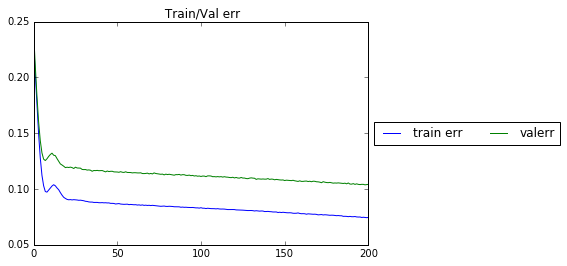

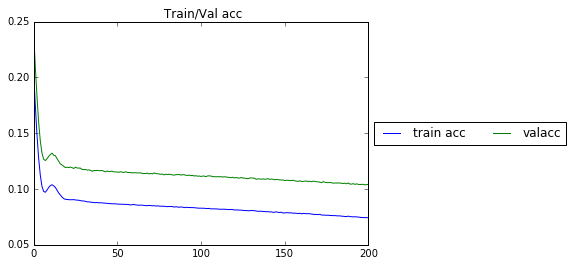

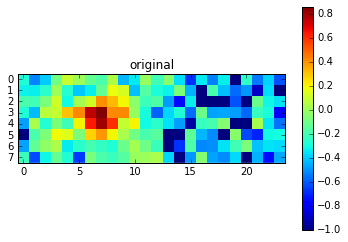

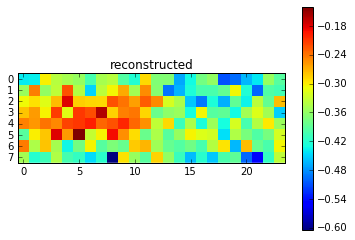

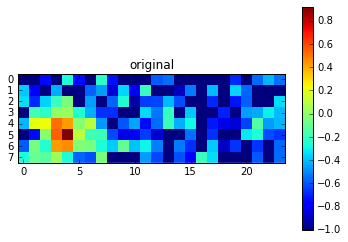

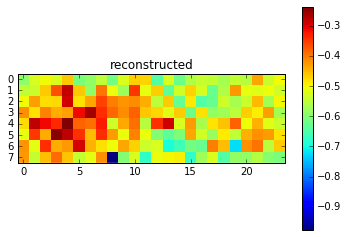

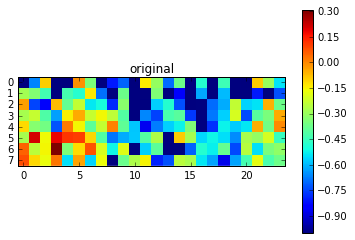

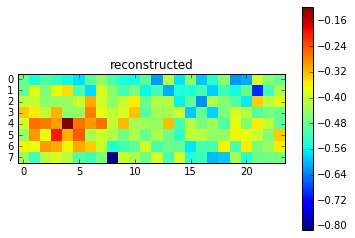

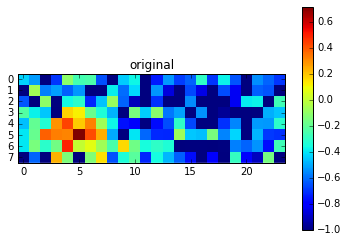

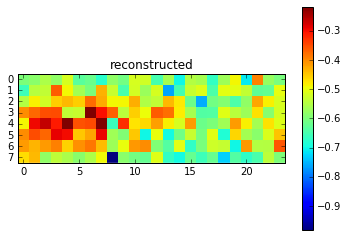

Epoch 202 of 1000 took 0.243s
	training los:		0.0741
	training acc:		7.4155 %
  validation loss:		0.103292
  validation accuracy:		10.33 %
Epoch 203 of 1000 took 0.220s
	training los:		0.0742
	training acc:		7.3938 %
  validation loss:		0.103004
  validation accuracy:		10.30 %
Epoch 204 of 1000 took 0.220s
	training los:		0.0740
	training acc:		7.3989 %
  validation loss:		0.103026
  validation accuracy:		10.30 %
Epoch 205 of 1000 took 0.219s
	training los:		0.0740
	training acc:		7.3580 %
  validation loss:		0.103612
  validation accuracy:		10.36 %
Epoch 206 of 1000 took 0.219s
	training los:		0.0737
	training acc:		7.3679 %
  validation loss:		0.103056
  validation accuracy:		10.31 %
Epoch 207 of 1000 took 0.224s
	training los:		0.0735
	training acc:		7.3460 %
  validation loss:		0.102846
  validation accuracy:		10.28 %
Epoch 208 of 1000 took 0.220s
	training los:		0.0734
	training acc:		7.3544 %
  validation loss:		0.103429
  validation accuracy:		10.34 %
Epoch 209 of 1000 took 0.22

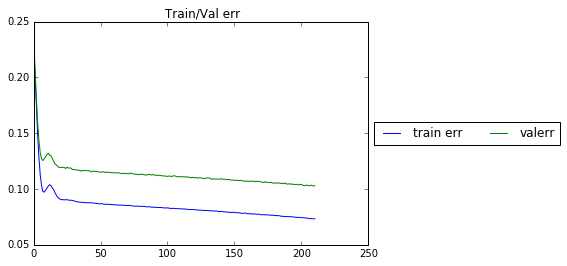

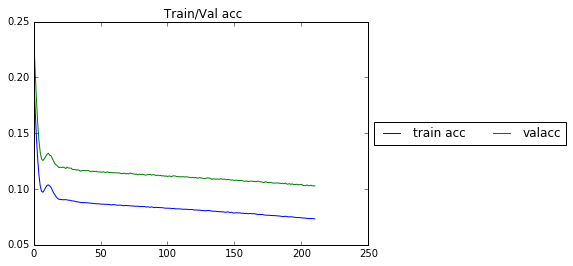

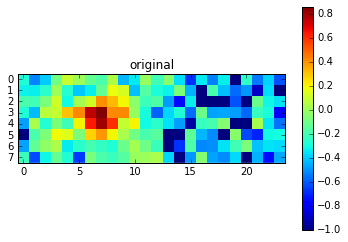

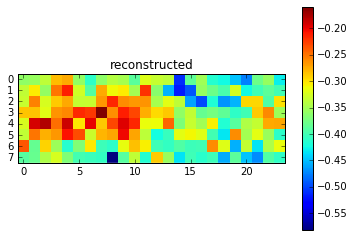

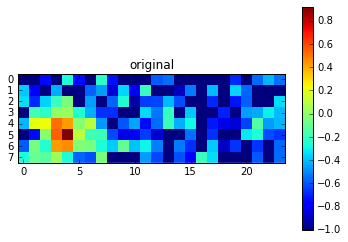

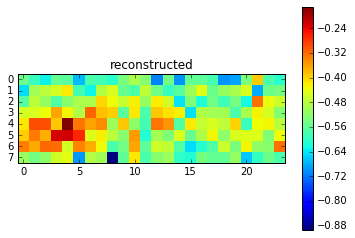

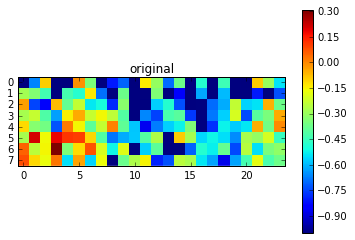

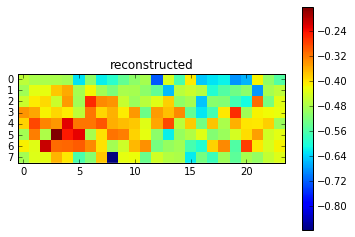

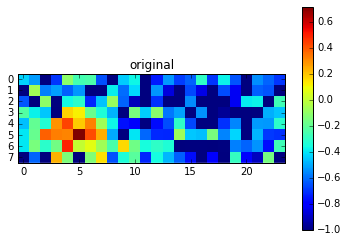

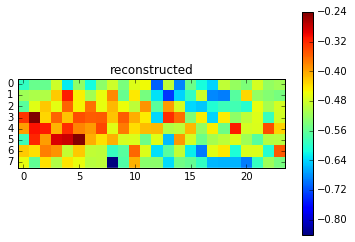

Epoch 212 of 1000 took 0.258s
	training los:		0.0729
	training acc:		7.3299 %
  validation loss:		0.102638
  validation accuracy:		10.26 %
Epoch 213 of 1000 took 0.222s
	training los:		0.0731
	training acc:		7.2720 %
  validation loss:		0.103283
  validation accuracy:		10.33 %
Epoch 214 of 1000 took 0.222s
	training los:		0.0732
	training acc:		7.2983 %
  validation loss:		0.102290
  validation accuracy:		10.23 %
Epoch 215 of 1000 took 0.224s
	training los:		0.0728
	training acc:		7.2831 %
  validation loss:		0.102301
  validation accuracy:		10.23 %
Epoch 216 of 1000 took 0.223s
	training los:		0.0729
	training acc:		7.2639 %
  validation loss:		0.101824
  validation accuracy:		10.18 %
Epoch 217 of 1000 took 0.224s
	training los:		0.0726
	training acc:		7.2425 %
  validation loss:		0.102382
  validation accuracy:		10.24 %
Epoch 218 of 1000 took 0.223s
	training los:		0.0726
	training acc:		7.2416 %
  validation loss:		0.101593
  validation accuracy:		10.16 %
Epoch 219 of 1000 took 0.22

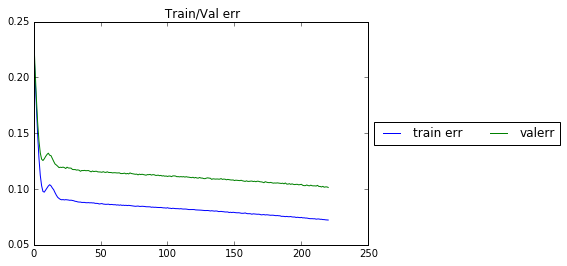

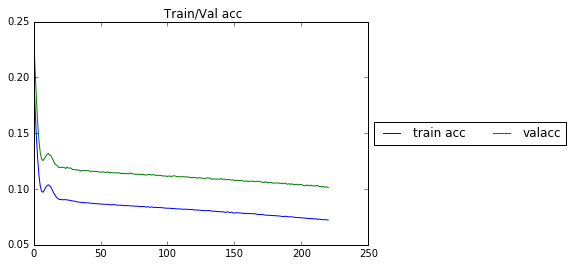

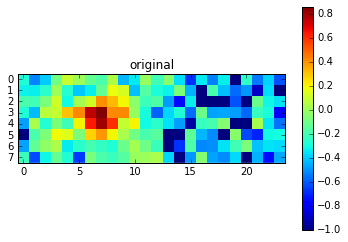

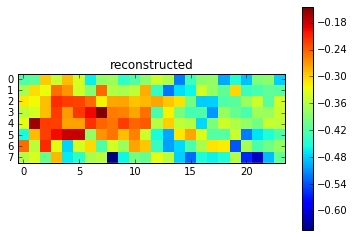

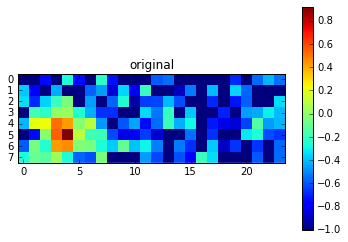

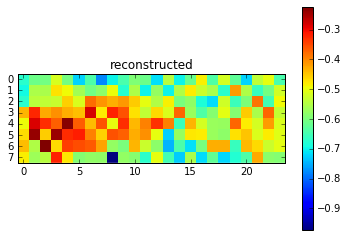

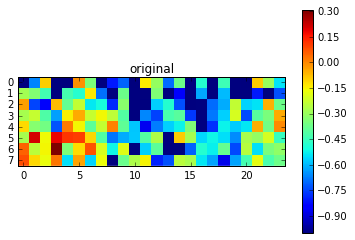

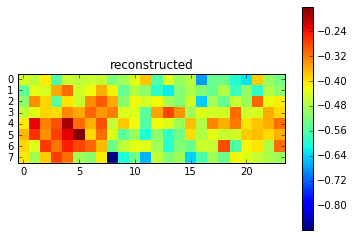

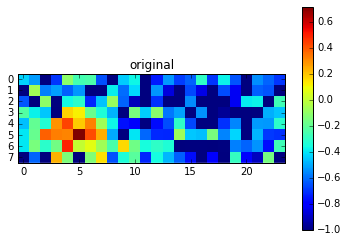

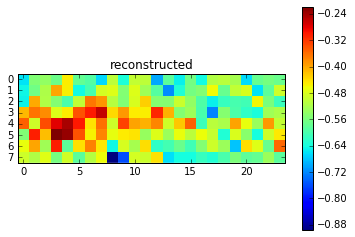

Epoch 222 of 1000 took 0.255s
	training los:		0.0721
	training acc:		7.2056 %
  validation loss:		0.101281
  validation accuracy:		10.13 %
Epoch 223 of 1000 took 0.383s
	training los:		0.0722
	training acc:		7.1935 %
  validation loss:		0.101625
  validation accuracy:		10.16 %
Epoch 224 of 1000 took 0.225s
	training los:		0.0721
	training acc:		7.2023 %
  validation loss:		0.101231
  validation accuracy:		10.12 %
Epoch 225 of 1000 took 0.220s
	training los:		0.0719
	training acc:		7.1972 %
  validation loss:		0.101041
  validation accuracy:		10.10 %
Epoch 226 of 1000 took 0.220s
	training los:		0.0718
	training acc:		7.1830 %
  validation loss:		0.100988
  validation accuracy:		10.10 %
Epoch 227 of 1000 took 0.220s
	training los:		0.0716
	training acc:		7.1419 %
  validation loss:		0.101035
  validation accuracy:		10.10 %
Epoch 228 of 1000 took 0.220s
	training los:		0.0716
	training acc:		7.1411 %
  validation loss:		0.101383
  validation accuracy:		10.14 %
Epoch 229 of 1000 took 0.22

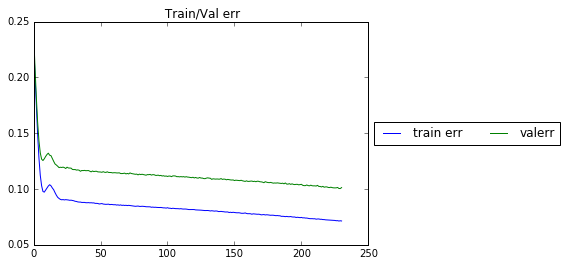

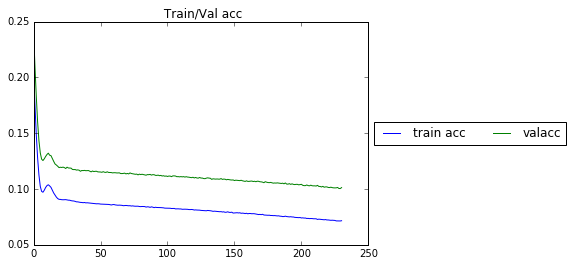

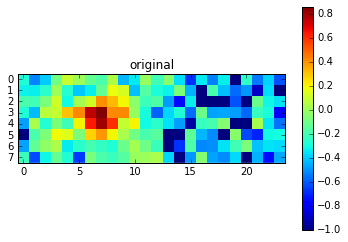

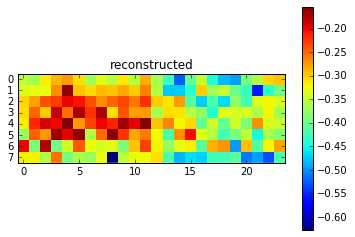

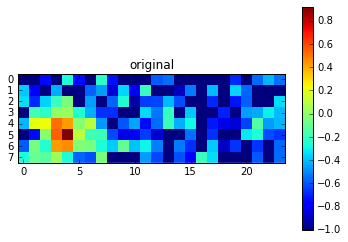

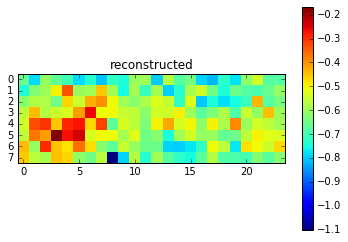

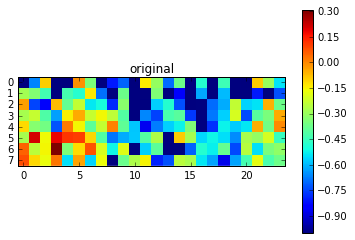

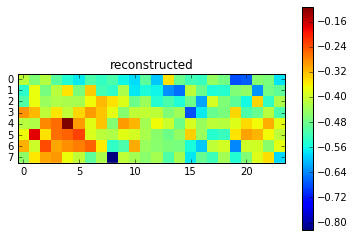

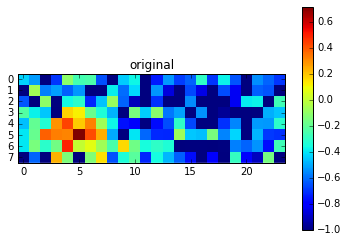

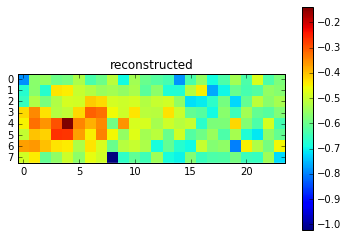

Epoch 232 of 1000 took 0.421s
	training los:		0.0715
	training acc:		7.0841 %
  validation loss:		0.100898
  validation accuracy:		10.09 %
Epoch 233 of 1000 took 0.237s
	training los:		0.0711
	training acc:		7.1183 %
  validation loss:		0.100194
  validation accuracy:		10.02 %
Epoch 234 of 1000 took 0.221s
	training los:		0.0710
	training acc:		7.0898 %
  validation loss:		0.100655
  validation accuracy:		10.07 %
Epoch 235 of 1000 took 0.221s
	training los:		0.0710
	training acc:		7.0588 %
  validation loss:		0.100449
  validation accuracy:		10.04 %
Epoch 236 of 1000 took 0.220s
	training los:		0.0707
	training acc:		7.0776 %
  validation loss:		0.100524
  validation accuracy:		10.05 %
Epoch 237 of 1000 took 0.221s
	training los:		0.0706
	training acc:		7.0613 %
  validation loss:		0.100020
  validation accuracy:		10.00 %
Epoch 238 of 1000 took 0.256s
	training los:		0.0704
	training acc:		7.0247 %
  validation loss:		0.099211
  validation accuracy:		9.92 %
Epoch 239 of 1000 took 0.225

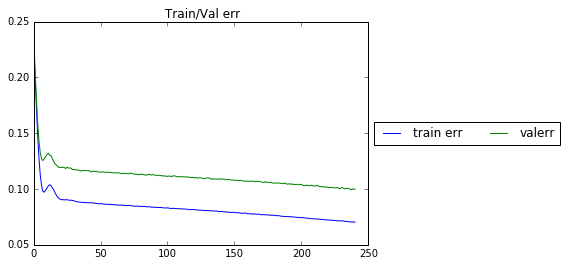

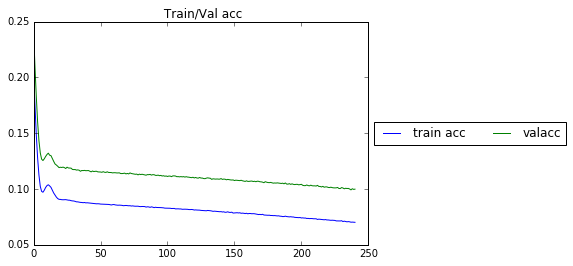

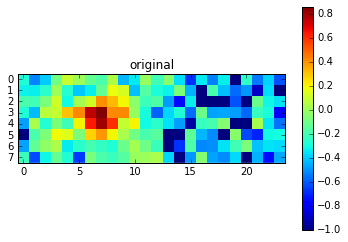

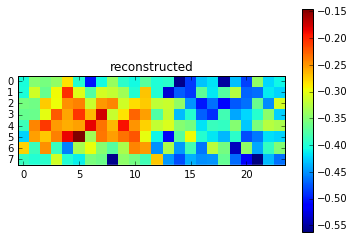

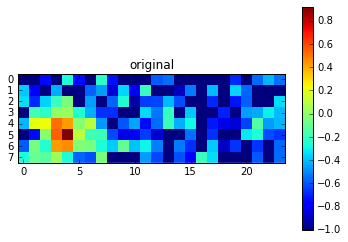

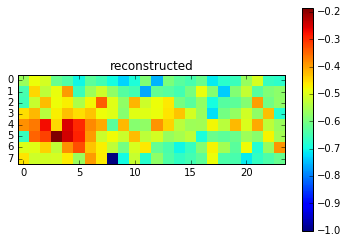

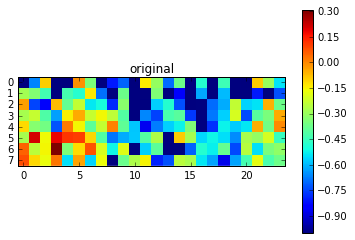

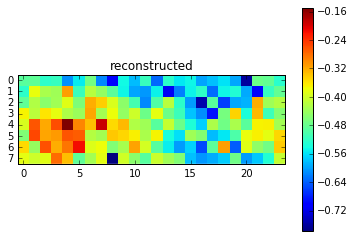

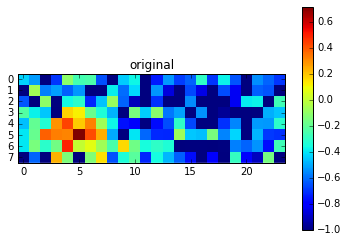

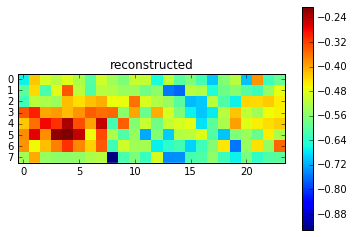

Epoch 242 of 1000 took 0.285s
	training los:		0.0700
	training acc:		7.0129 %
  validation loss:		0.099557
  validation accuracy:		9.96 %
Epoch 243 of 1000 took 0.220s
	training los:		0.0701
	training acc:		6.9911 %
  validation loss:		0.099930
  validation accuracy:		9.99 %
Epoch 244 of 1000 took 0.219s
	training los:		0.0703
	training acc:		6.9865 %
  validation loss:		0.099834
  validation accuracy:		9.98 %
Epoch 245 of 1000 took 0.219s
	training los:		0.0700
	training acc:		7.0005 %
  validation loss:		0.099096
  validation accuracy:		9.91 %
Epoch 246 of 1000 took 0.220s
	training los:		0.0697
	training acc:		6.9590 %
  validation loss:		0.099093
  validation accuracy:		9.91 %
Epoch 247 of 1000 took 0.219s
	training los:		0.0694
	training acc:		6.9623 %
  validation loss:		0.099372
  validation accuracy:		9.94 %
Epoch 248 of 1000 took 0.219s
	training los:		0.0696
	training acc:		6.9305 %
  validation loss:		0.099006
  validation accuracy:		9.90 %
Epoch 249 of 1000 took 0.219s
	tra

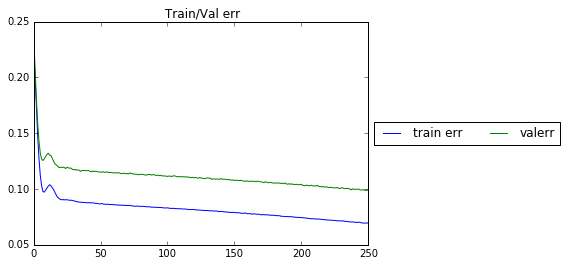

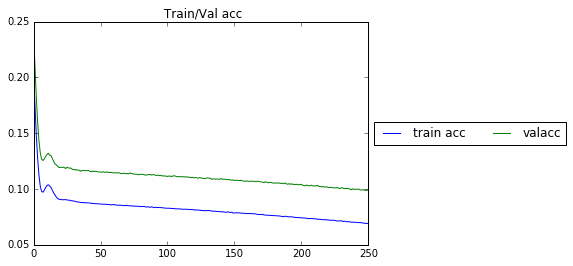

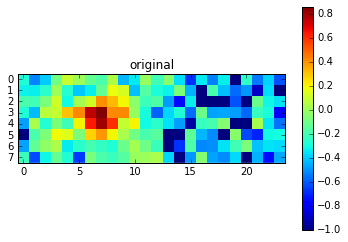

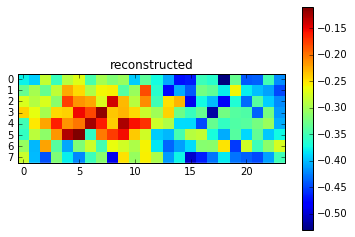

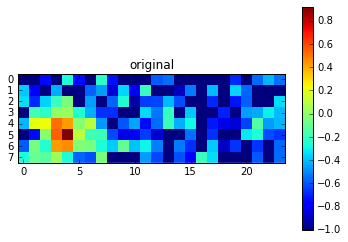

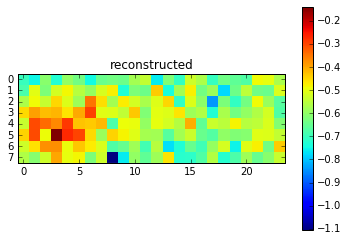

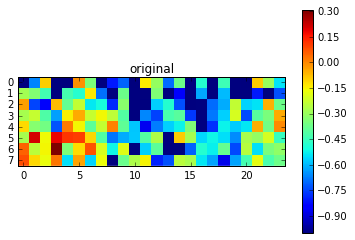

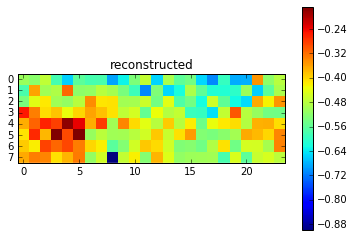

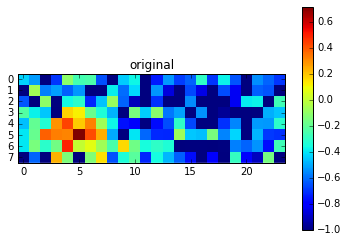

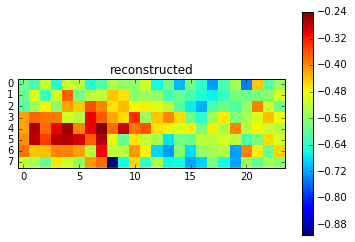

Epoch 252 of 1000 took 0.302s
	training los:		0.0688
	training acc:		6.9306 %
  validation loss:		0.098693
  validation accuracy:		9.87 %
Epoch 253 of 1000 took 0.233s
	training los:		0.0691
	training acc:		6.8588 %
  validation loss:		0.099141
  validation accuracy:		9.91 %
Epoch 254 of 1000 took 0.222s
	training los:		0.0687
	training acc:		6.8655 %
  validation loss:		0.097847
  validation accuracy:		9.78 %
Epoch 255 of 1000 took 0.222s
	training los:		0.0686
	training acc:		6.8541 %
  validation loss:		0.098766
  validation accuracy:		9.88 %
Epoch 256 of 1000 took 0.222s
	training los:		0.0686
	training acc:		6.8593 %
  validation loss:		0.098312
  validation accuracy:		9.83 %
Epoch 257 of 1000 took 0.250s
	training los:		0.0685
	training acc:		6.8371 %
  validation loss:		0.098448
  validation accuracy:		9.84 %
Epoch 258 of 1000 took 0.224s
	training los:		0.0683
	training acc:		6.8543 %
  validation loss:		0.098072
  validation accuracy:		9.81 %
Epoch 259 of 1000 took 0.224s
	tra

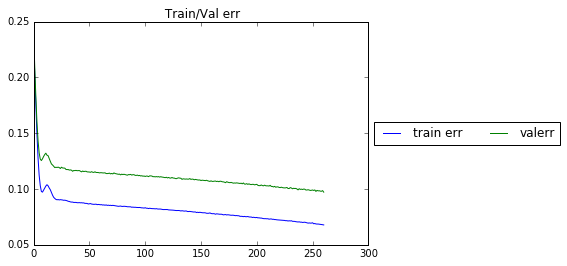

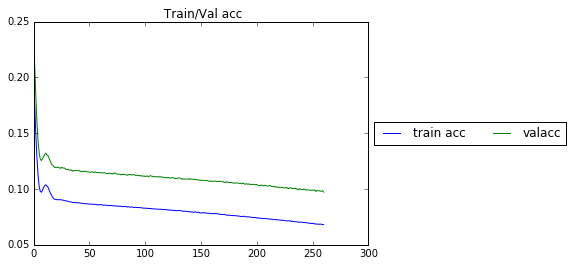

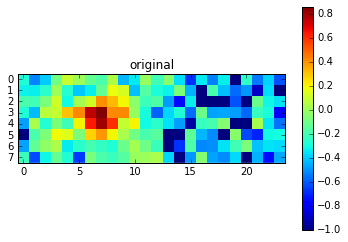

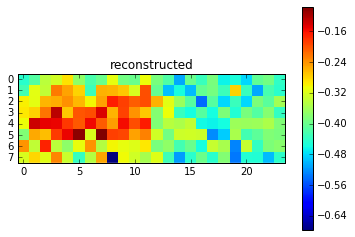

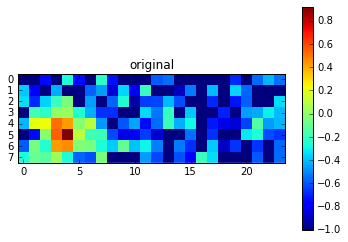

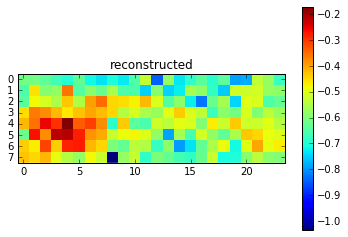

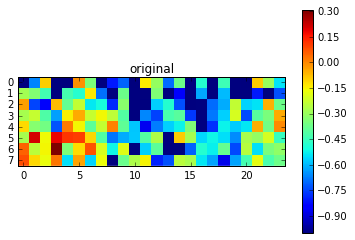

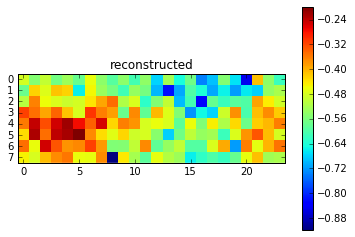

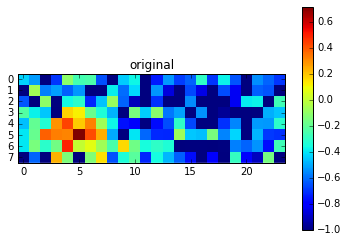

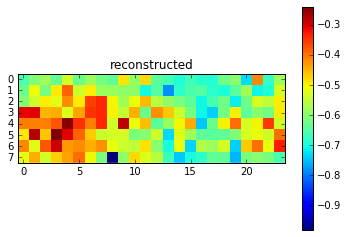

Epoch 262 of 1000 took 0.235s
	training los:		0.0680
	training acc:		6.7780 %
  validation loss:		0.097108
  validation accuracy:		9.71 %
Epoch 263 of 1000 took 0.222s
	training los:		0.0679
	training acc:		6.8234 %
  validation loss:		0.097557
  validation accuracy:		9.76 %
Epoch 264 of 1000 took 0.223s
	training los:		0.0676
	training acc:		6.7505 %
  validation loss:		0.097622
  validation accuracy:		9.76 %
Epoch 265 of 1000 took 0.222s
	training los:		0.0678
	training acc:		6.7518 %
  validation loss:		0.097688
  validation accuracy:		9.77 %
Epoch 266 of 1000 took 0.223s
	training los:		0.0676
	training acc:		6.7550 %
  validation loss:		0.097929
  validation accuracy:		9.79 %
Epoch 267 of 1000 took 0.222s
	training los:		0.0676
	training acc:		6.7667 %
  validation loss:		0.097757
  validation accuracy:		9.78 %
Epoch 268 of 1000 took 0.236s
	training los:		0.0672
	training acc:		6.7351 %
  validation loss:		0.096755
  validation accuracy:		9.68 %
Epoch 269 of 1000 took 0.223s
	tra

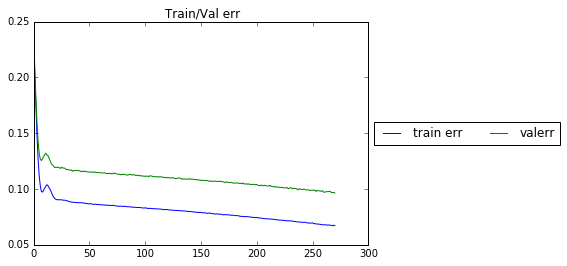

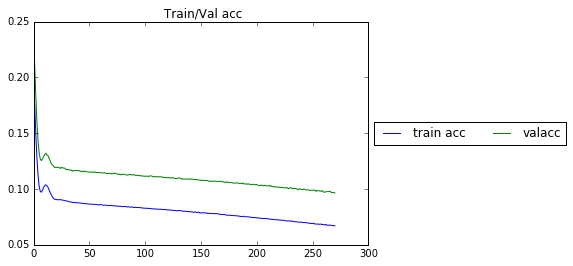

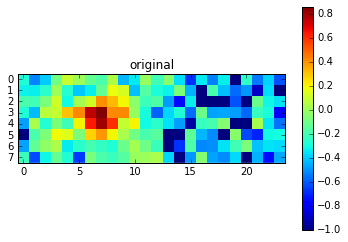

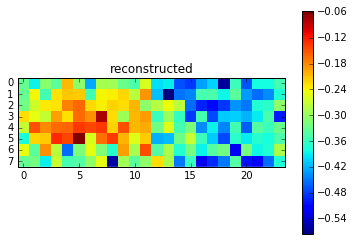

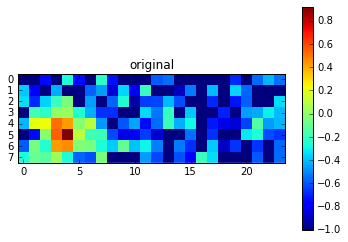

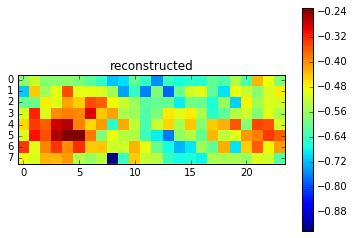

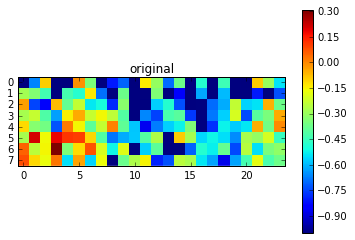

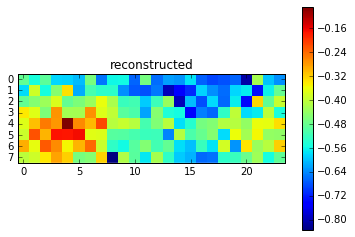

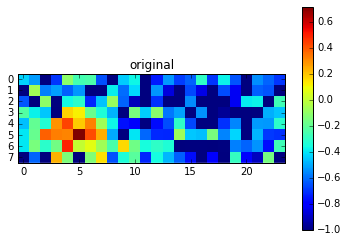

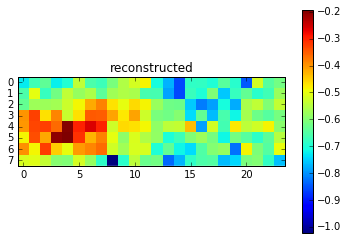

Epoch 272 of 1000 took 0.231s
	training los:		0.0672
	training acc:		6.6604 %
  validation loss:		0.096810
  validation accuracy:		9.68 %
Epoch 273 of 1000 took 0.220s
	training los:		0.0670
	training acc:		6.6850 %
  validation loss:		0.096908
  validation accuracy:		9.69 %
Epoch 274 of 1000 took 0.220s
	training los:		0.0670
	training acc:		6.6501 %
  validation loss:		0.096173
  validation accuracy:		9.62 %
Epoch 275 of 1000 took 0.220s
	training los:		0.0665
	training acc:		6.6798 %
  validation loss:		0.096537
  validation accuracy:		9.65 %
Epoch 276 of 1000 took 0.220s
	training los:		0.0664
	training acc:		6.6612 %
  validation loss:		0.096221
  validation accuracy:		9.62 %
Epoch 277 of 1000 took 0.222s
	training los:		0.0667
	training acc:		6.6161 %
  validation loss:		0.096530
  validation accuracy:		9.65 %
Epoch 278 of 1000 took 0.220s
	training los:		0.0668
	training acc:		6.6286 %
  validation loss:		0.096345
  validation accuracy:		9.63 %
Epoch 279 of 1000 took 0.220s
	tra

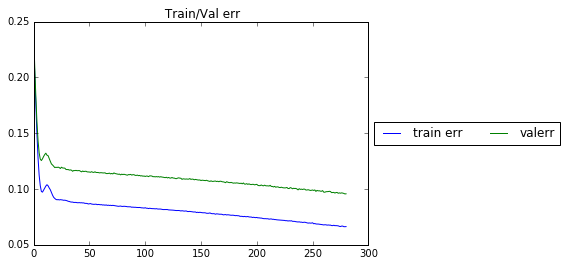

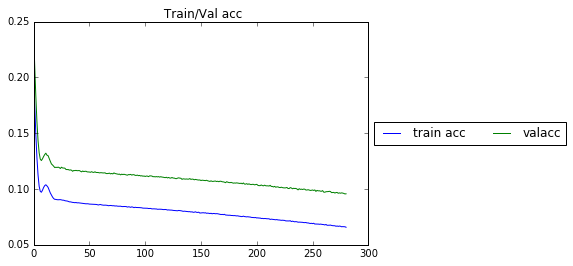

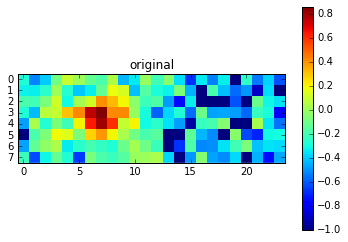

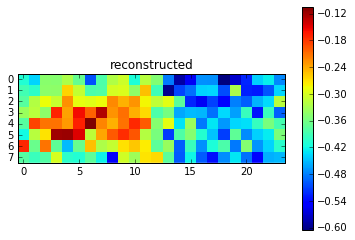

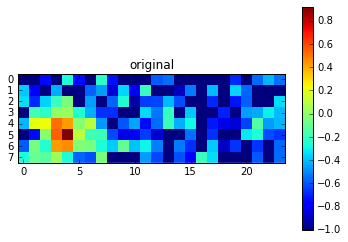

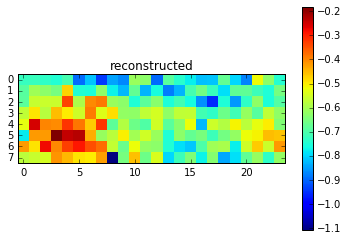

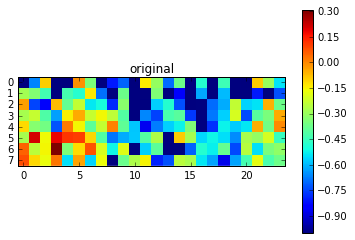

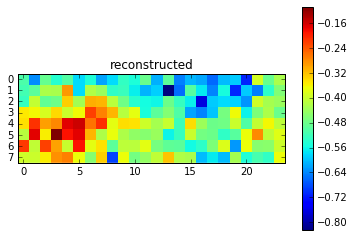

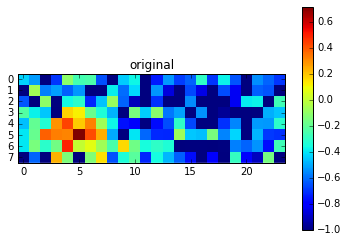

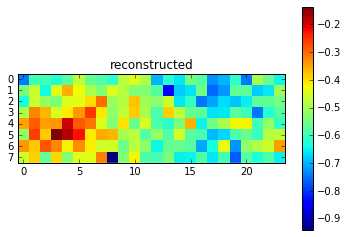

Epoch 282 of 1000 took 0.302s
	training los:		0.0659
	training acc:		6.5760 %
  validation loss:		0.095871
  validation accuracy:		9.59 %
Epoch 283 of 1000 took 0.228s
	training los:		0.0657
	training acc:		6.5860 %
  validation loss:		0.095496
  validation accuracy:		9.55 %
Epoch 284 of 1000 took 0.222s
	training los:		0.0657
	training acc:		6.5379 %
  validation loss:		0.095855
  validation accuracy:		9.59 %
Epoch 285 of 1000 took 0.222s
	training los:		0.0657
	training acc:		6.5174 %
  validation loss:		0.095613
  validation accuracy:		9.56 %
Epoch 286 of 1000 took 0.222s
	training los:		0.0654
	training acc:		6.5607 %
  validation loss:		0.094517
  validation accuracy:		9.45 %
Epoch 287 of 1000 took 0.222s
	training los:		0.0658
	training acc:		6.5492 %
  validation loss:		0.094908
  validation accuracy:		9.49 %
Epoch 288 of 1000 took 0.222s
	training los:		0.0650
	training acc:		6.5180 %
  validation loss:		0.095168
  validation accuracy:		9.52 %
Epoch 289 of 1000 took 0.222s
	tra

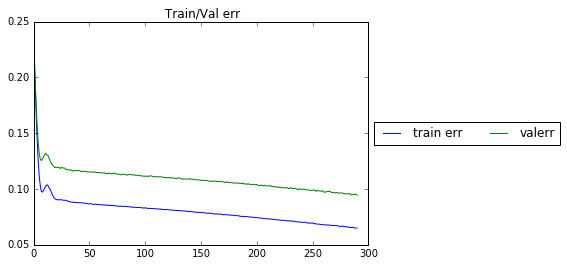

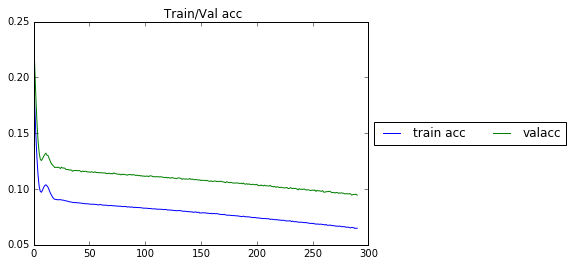

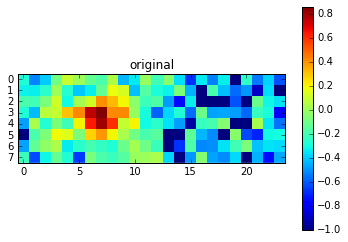

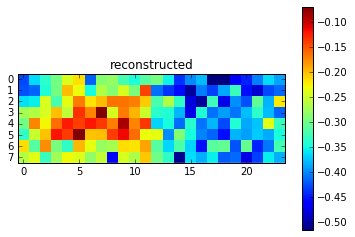

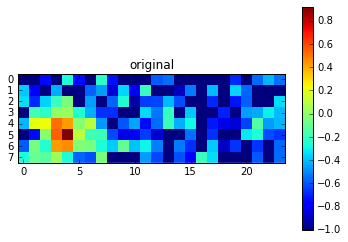

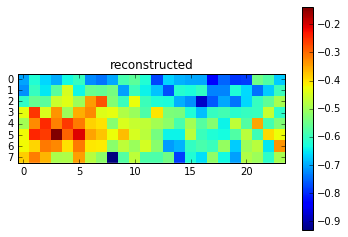

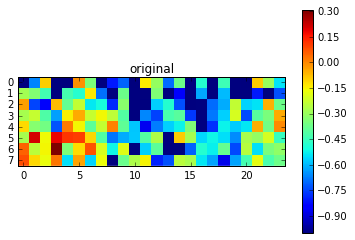

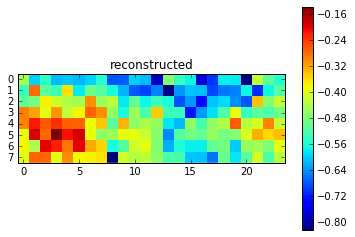

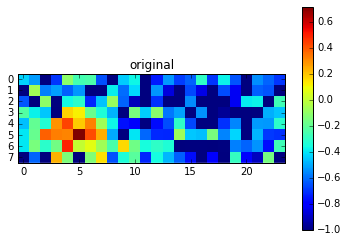

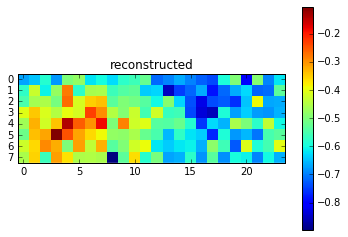

Epoch 292 of 1000 took 0.287s
	training los:		0.0649
	training acc:		6.4578 %
  validation loss:		0.094546
  validation accuracy:		9.45 %
Epoch 293 of 1000 took 0.222s
	training los:		0.0647
	training acc:		6.4750 %
  validation loss:		0.094178
  validation accuracy:		9.42 %
Epoch 294 of 1000 took 0.221s
	training los:		0.0646
	training acc:		6.4596 %
  validation loss:		0.094548
  validation accuracy:		9.45 %
Epoch 295 of 1000 took 0.222s
	training los:		0.0646
	training acc:		6.4397 %
  validation loss:		0.093902
  validation accuracy:		9.39 %
Epoch 296 of 1000 took 0.221s
	training los:		0.0645
	training acc:		6.4374 %
  validation loss:		0.093902
  validation accuracy:		9.39 %
Epoch 297 of 1000 took 0.221s
	training los:		0.0643
	training acc:		6.4247 %
  validation loss:		0.094175
  validation accuracy:		9.42 %
Epoch 298 of 1000 took 0.222s
	training los:		0.0641
	training acc:		6.4022 %
  validation loss:		0.094255
  validation accuracy:		9.43 %
Epoch 299 of 1000 took 0.224s
	tra

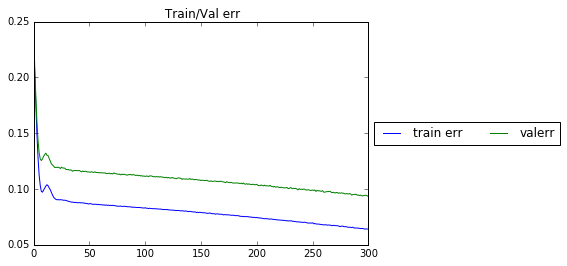

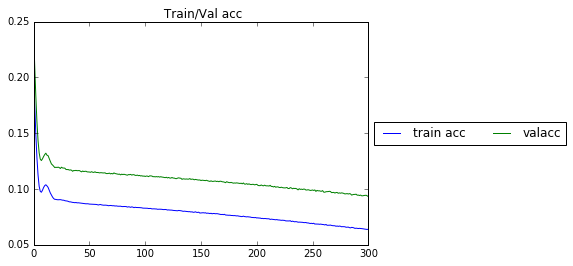

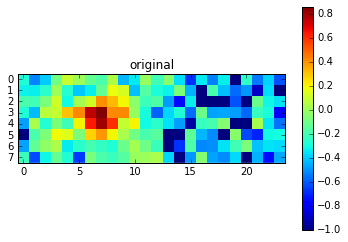

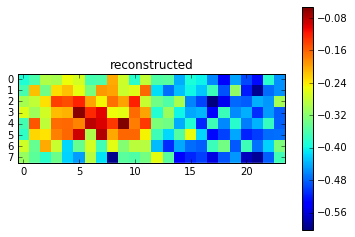

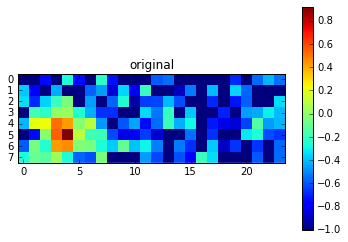

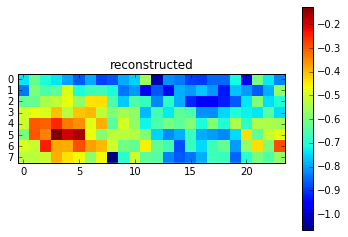

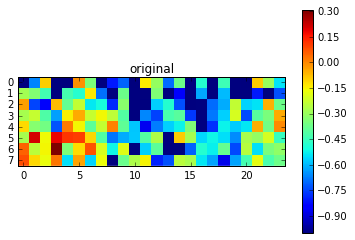

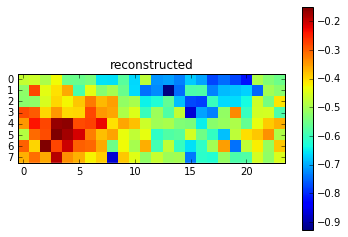

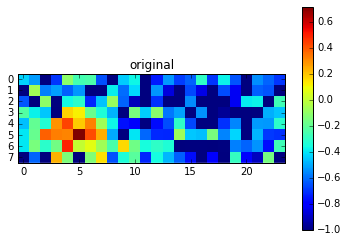

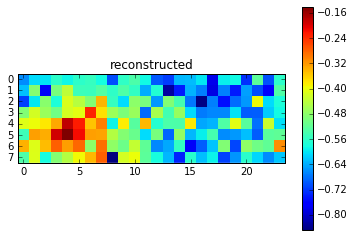

Epoch 302 of 1000 took 0.264s
	training los:		0.0638
	training acc:		6.3583 %
  validation loss:		0.094184
  validation accuracy:		9.42 %
Epoch 303 of 1000 took 0.221s
	training los:		0.0639
	training acc:		6.3896 %
  validation loss:		0.093313
  validation accuracy:		9.33 %
Epoch 304 of 1000 took 0.221s
	training los:		0.0636
	training acc:		6.3627 %
  validation loss:		0.093270
  validation accuracy:		9.33 %
Epoch 305 of 1000 took 0.223s
	training los:		0.0636
	training acc:		6.3637 %
  validation loss:		0.093460
  validation accuracy:		9.35 %
Epoch 306 of 1000 took 0.222s
	training los:		0.0632
	training acc:		6.3520 %
  validation loss:		0.093209
  validation accuracy:		9.32 %
Epoch 307 of 1000 took 0.221s
	training los:		0.0631
	training acc:		6.3462 %
  validation loss:		0.092875
  validation accuracy:		9.29 %
Epoch 308 of 1000 took 0.222s
	training los:		0.0635
	training acc:		6.3042 %
  validation loss:		0.093013
  validation accuracy:		9.30 %
Epoch 309 of 1000 took 0.221s
	tra

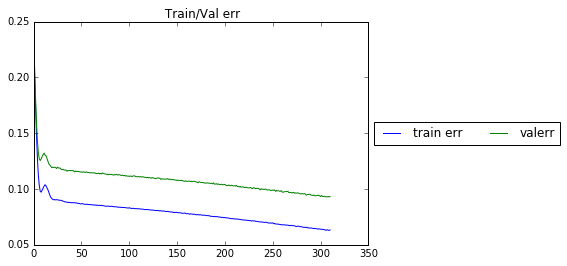

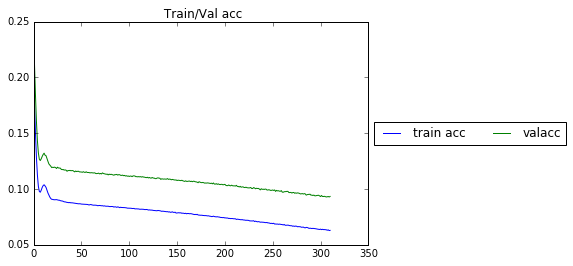

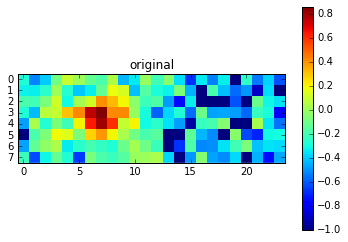

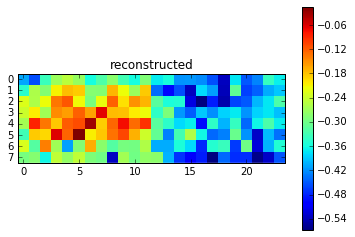

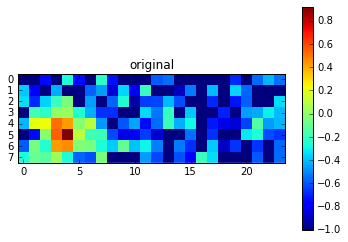

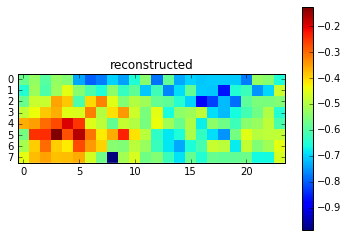

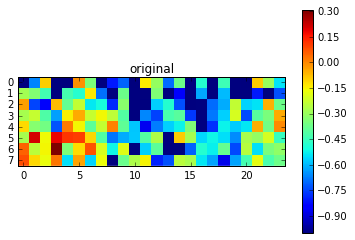

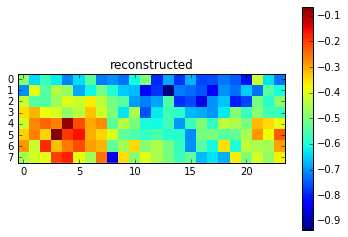

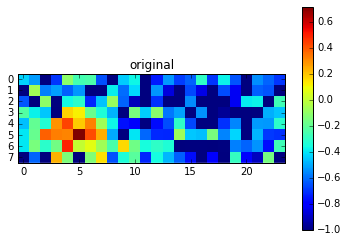

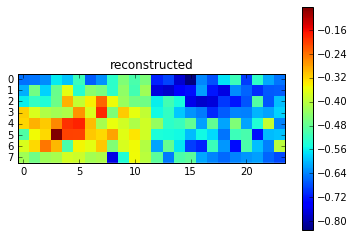

Epoch 312 of 1000 took 0.226s
	training los:		0.0628
	training acc:		6.2837 %
  validation loss:		0.092037
  validation accuracy:		9.20 %
Epoch 313 of 1000 took 0.220s
	training los:		0.0626
	training acc:		6.2914 %
  validation loss:		0.092457
  validation accuracy:		9.25 %
Epoch 314 of 1000 took 0.220s
	training los:		0.0627
	training acc:		6.2479 %
  validation loss:		0.092515
  validation accuracy:		9.25 %
Epoch 315 of 1000 took 0.219s
	training los:		0.0626
	training acc:		6.2361 %
  validation loss:		0.092849
  validation accuracy:		9.28 %
Epoch 316 of 1000 took 0.220s
	training los:		0.0625
	training acc:		6.2652 %
  validation loss:		0.092482
  validation accuracy:		9.25 %
Epoch 317 of 1000 took 0.223s
	training los:		0.0625
	training acc:		6.2293 %
  validation loss:		0.092345
  validation accuracy:		9.23 %
Epoch 318 of 1000 took 0.220s
	training los:		0.0623
	training acc:		6.2173 %
  validation loss:		0.092033
  validation accuracy:		9.20 %
Epoch 319 of 1000 took 0.219s
	tra

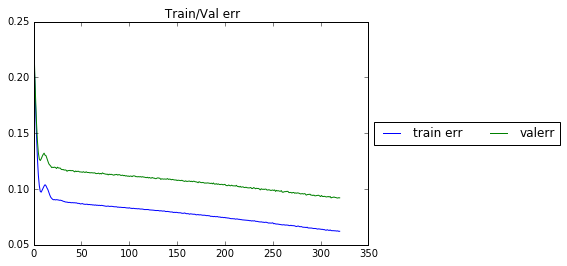

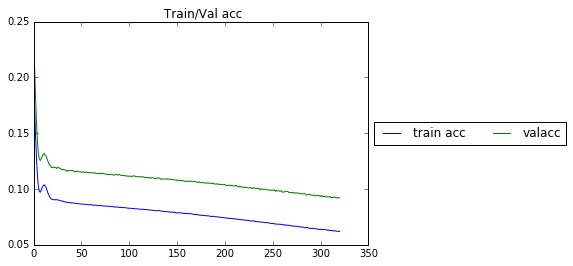

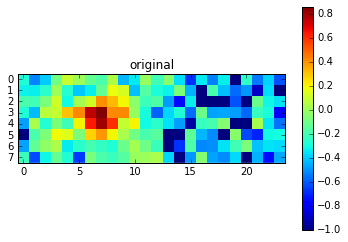

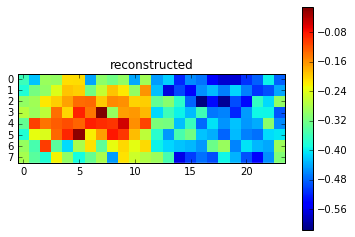

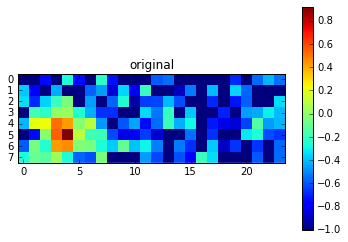

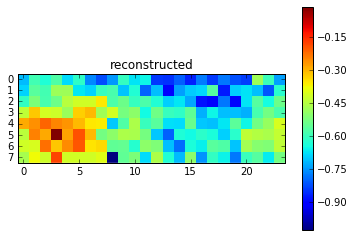

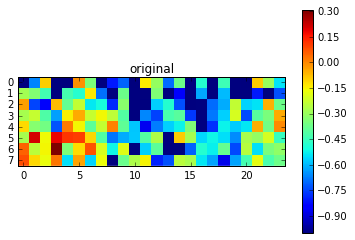

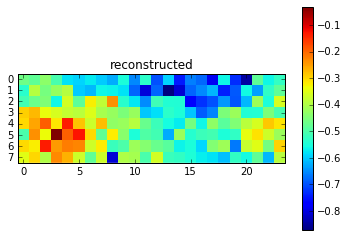

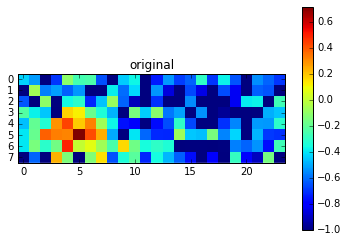

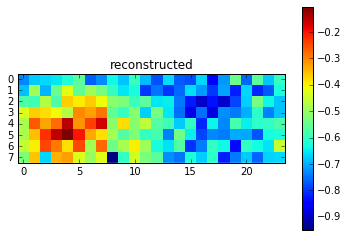

Epoch 322 of 1000 took 0.246s
	training los:		0.0621
	training acc:		6.1867 %
  validation loss:		0.092001
  validation accuracy:		9.20 %
Epoch 323 of 1000 took 0.220s
	training los:		0.0621
	training acc:		6.1380 %
  validation loss:		0.091472
  validation accuracy:		9.15 %
Epoch 324 of 1000 took 0.219s
	training los:		0.0615
	training acc:		6.1412 %
  validation loss:		0.092049
  validation accuracy:		9.20 %
Epoch 325 of 1000 took 0.220s
	training los:		0.0617
	training acc:		6.1512 %
  validation loss:		0.092220
  validation accuracy:		9.22 %
Epoch 326 of 1000 took 0.220s
	training los:		0.0616
	training acc:		6.1605 %
  validation loss:		0.092009
  validation accuracy:		9.20 %
Epoch 327 of 1000 took 0.220s
	training los:		0.0616
	training acc:		6.1338 %
  validation loss:		0.091731
  validation accuracy:		9.17 %
Epoch 328 of 1000 took 0.220s
	training los:		0.0615
	training acc:		6.1250 %
  validation loss:		0.091373
  validation accuracy:		9.14 %
Epoch 329 of 1000 took 0.220s
	tra

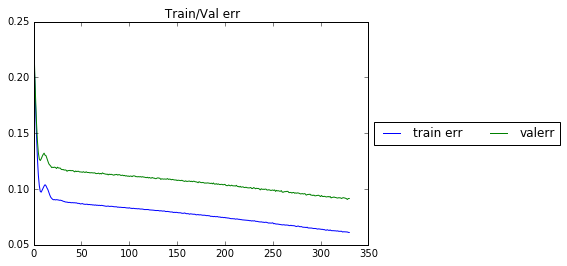

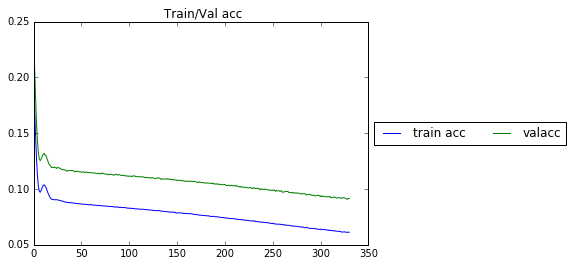

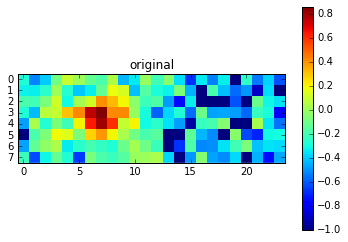

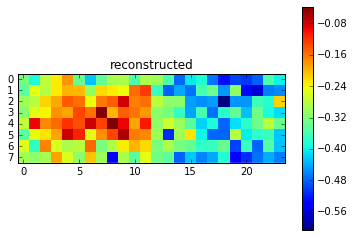

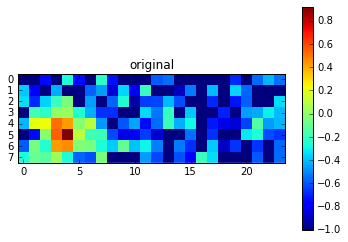

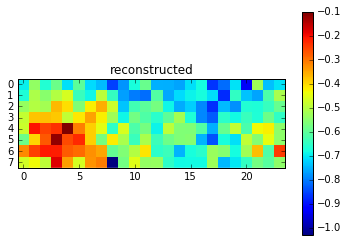

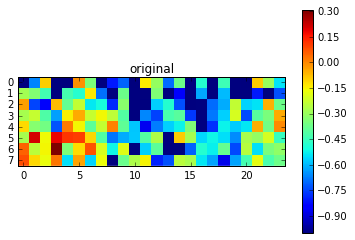

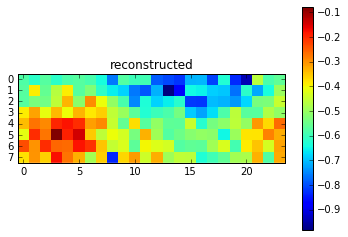

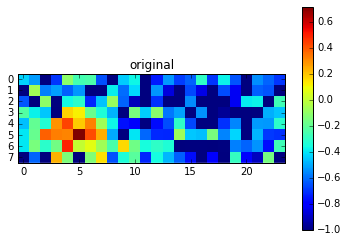

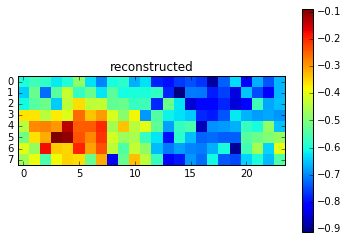

Epoch 332 of 1000 took 0.241s
	training los:		0.0609
	training acc:		6.0736 %
  validation loss:		0.091338
  validation accuracy:		9.13 %
Epoch 333 of 1000 took 0.219s
	training los:		0.0609
	training acc:		6.0743 %
  validation loss:		0.091492
  validation accuracy:		9.15 %
Epoch 334 of 1000 took 0.220s
	training los:		0.0609
	training acc:		6.0582 %
  validation loss:		0.091312
  validation accuracy:		9.13 %
Epoch 335 of 1000 took 0.220s
	training los:		0.0607
	training acc:		6.0620 %
  validation loss:		0.091116
  validation accuracy:		9.11 %
Epoch 336 of 1000 took 0.220s
	training los:		0.0606
	training acc:		6.0417 %
  validation loss:		0.091448
  validation accuracy:		9.14 %
Epoch 337 of 1000 took 0.221s
	training los:		0.0608
	training acc:		6.0448 %
  validation loss:		0.091088
  validation accuracy:		9.11 %
Epoch 338 of 1000 took 0.220s
	training los:		0.0606
	training acc:		6.0436 %
  validation loss:		0.089976
  validation accuracy:		9.00 %
Epoch 339 of 1000 took 0.220s
	tra

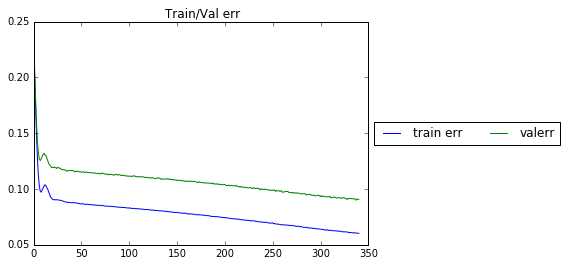

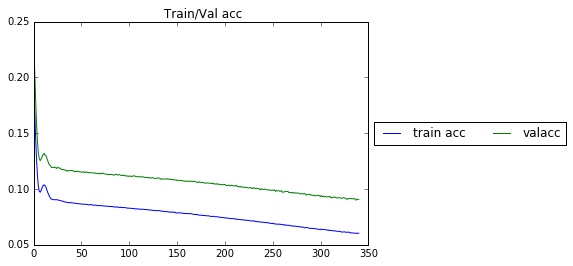

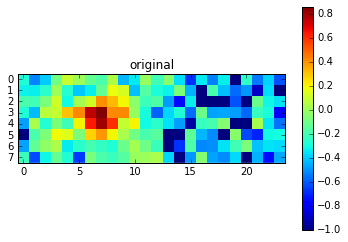

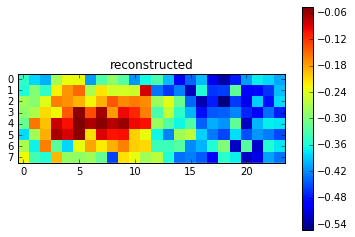

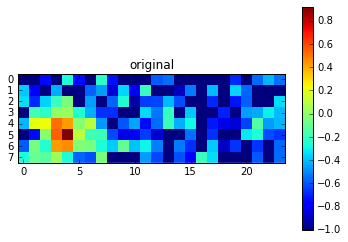

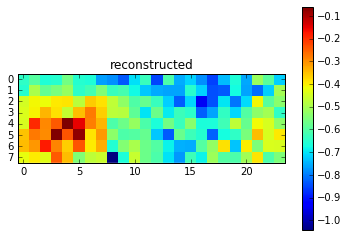

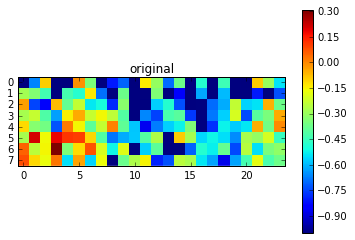

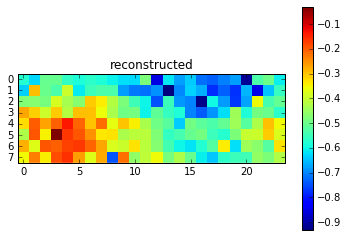

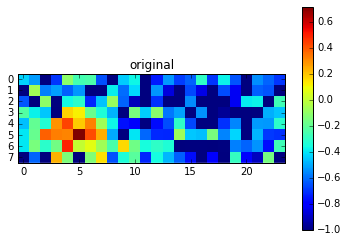

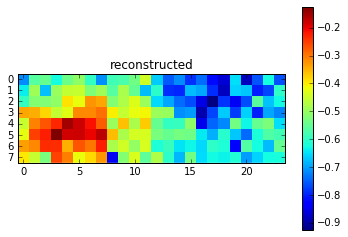

Epoch 342 of 1000 took 0.264s
	training los:		0.0601
	training acc:		6.0286 %
  validation loss:		0.089257
  validation accuracy:		8.93 %
Epoch 343 of 1000 took 0.224s
	training los:		0.0599
	training acc:		5.9927 %
  validation loss:		0.089986
  validation accuracy:		9.00 %
Epoch 344 of 1000 took 0.221s
	training los:		0.0604
	training acc:		6.0034 %
  validation loss:		0.089715
  validation accuracy:		8.97 %
Epoch 345 of 1000 took 0.222s
	training los:		0.0598
	training acc:		5.9821 %
  validation loss:		0.089390
  validation accuracy:		8.94 %
Epoch 346 of 1000 took 0.222s
	training los:		0.0601
	training acc:		5.9503 %
  validation loss:		0.090611
  validation accuracy:		9.06 %
Epoch 347 of 1000 took 0.221s
	training los:		0.0597
	training acc:		5.9631 %
  validation loss:		0.090471
  validation accuracy:		9.05 %
Epoch 348 of 1000 took 0.222s
	training los:		0.0596
	training acc:		5.9598 %
  validation loss:		0.089058
  validation accuracy:		8.91 %
Epoch 349 of 1000 took 0.221s
	tra

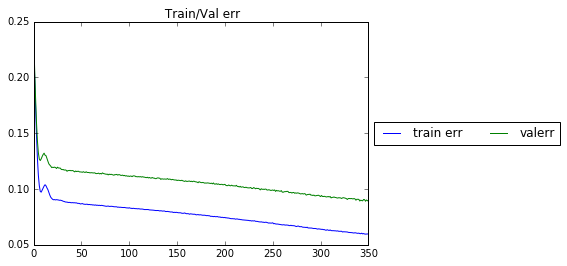

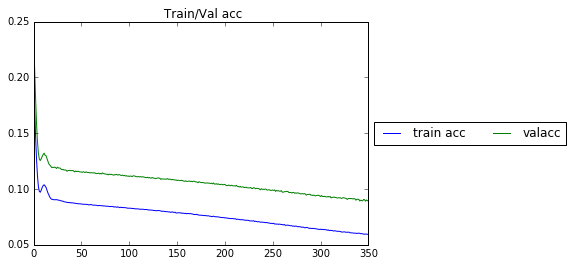

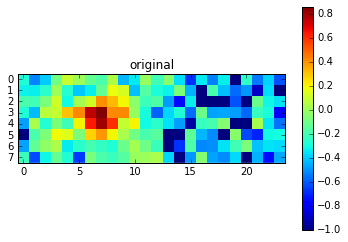

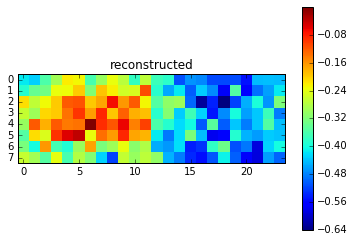

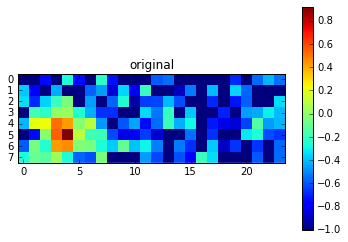

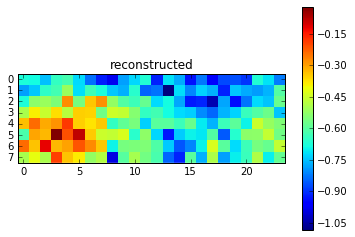

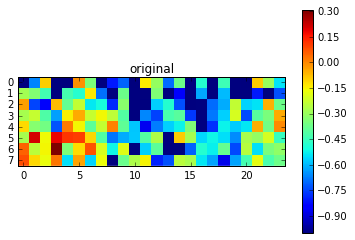

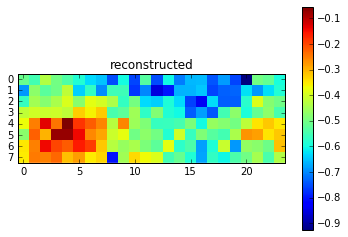

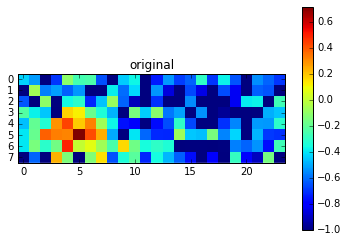

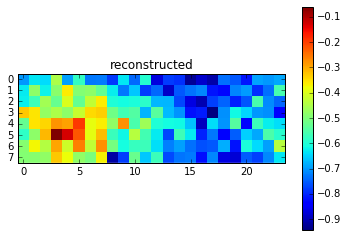

Epoch 352 of 1000 took 0.334s
	training los:		0.0592
	training acc:		5.9180 %
  validation loss:		0.089430
  validation accuracy:		8.94 %
Epoch 353 of 1000 took 0.239s
	training los:		0.0593
	training acc:		5.9342 %
  validation loss:		0.089277
  validation accuracy:		8.93 %
Epoch 354 of 1000 took 0.225s
	training los:		0.0590
	training acc:		5.9142 %
  validation loss:		0.088900
  validation accuracy:		8.89 %
Epoch 355 of 1000 took 0.224s
	training los:		0.0592
	training acc:		5.9155 %
  validation loss:		0.089564
  validation accuracy:		8.96 %
Epoch 356 of 1000 took 0.224s
	training los:		0.0592
	training acc:		5.8762 %
  validation loss:		0.089284
  validation accuracy:		8.93 %
Epoch 357 of 1000 took 0.225s
	training los:		0.0587
	training acc:		5.9155 %
  validation loss:		0.088621
  validation accuracy:		8.86 %
Epoch 358 of 1000 took 0.225s
	training los:		0.0588
	training acc:		5.9050 %
  validation loss:		0.088951
  validation accuracy:		8.90 %
Epoch 359 of 1000 took 0.225s
	tra

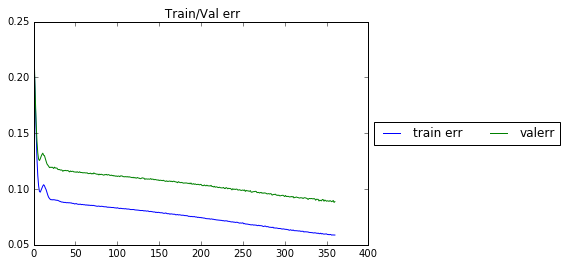

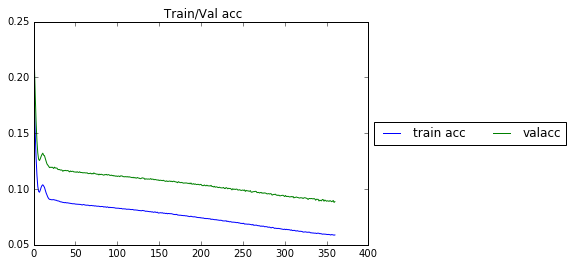

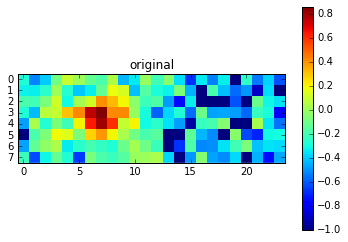

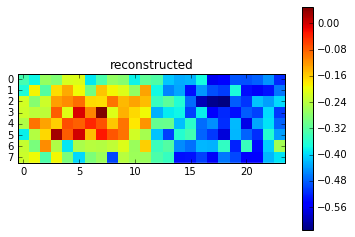

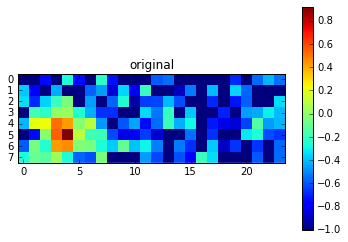

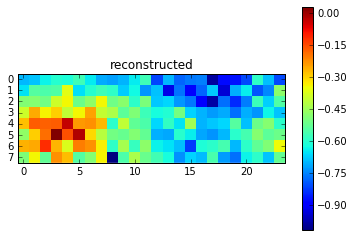

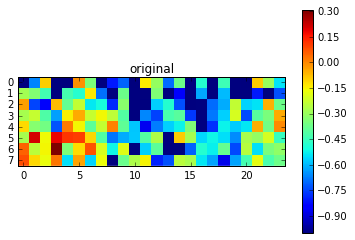

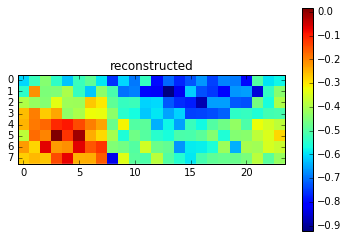

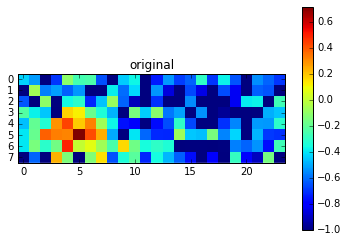

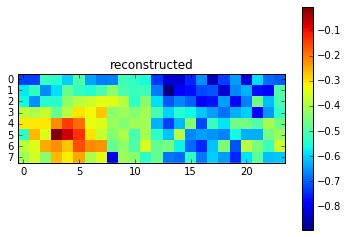

Epoch 362 of 1000 took 0.326s
	training los:		0.0587
	training acc:		5.8468 %
  validation loss:		0.088471
  validation accuracy:		8.85 %
Epoch 363 of 1000 took 0.368s
	training los:		0.0586
	training acc:		5.8456 %
  validation loss:		0.089559
  validation accuracy:		8.96 %
Epoch 364 of 1000 took 0.340s
	training los:		0.0587
	training acc:		5.8421 %
  validation loss:		0.088700
  validation accuracy:		8.87 %
Epoch 365 of 1000 took 0.346s
	training los:		0.0585
	training acc:		5.8812 %
  validation loss:		0.088910
  validation accuracy:		8.89 %
Epoch 366 of 1000 took 0.225s
	training los:		0.0583
	training acc:		5.8382 %
  validation loss:		0.088127
  validation accuracy:		8.81 %
Epoch 367 of 1000 took 0.225s
	training los:		0.0582
	training acc:		5.7967 %
  validation loss:		0.089290
  validation accuracy:		8.93 %
Epoch 368 of 1000 took 0.226s
	training los:		0.0579
	training acc:		5.7947 %
  validation loss:		0.088589
  validation accuracy:		8.86 %
Epoch 369 of 1000 took 0.225s
	tra

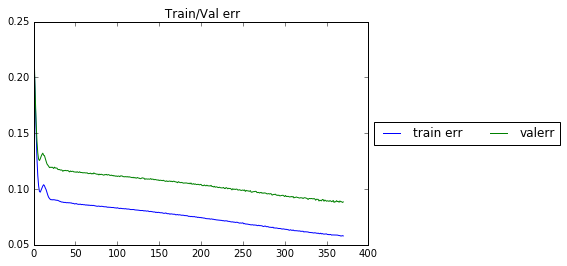

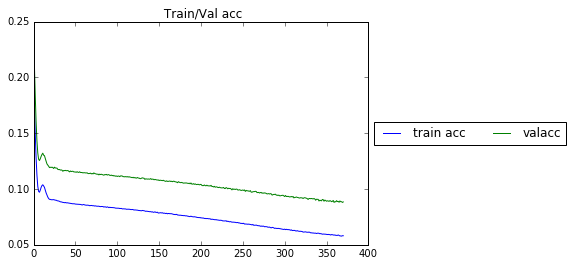

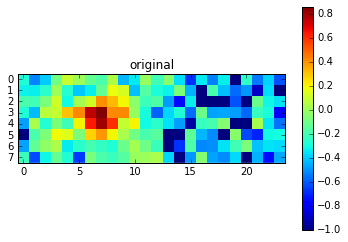

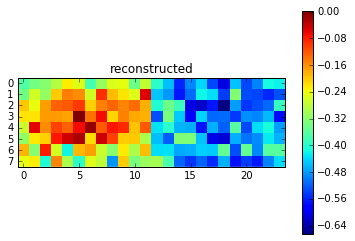

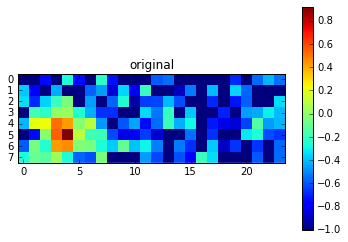

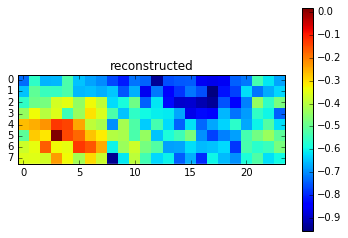

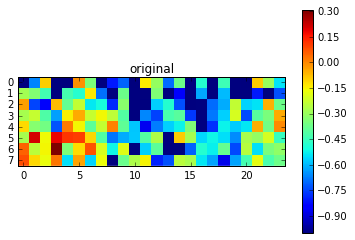

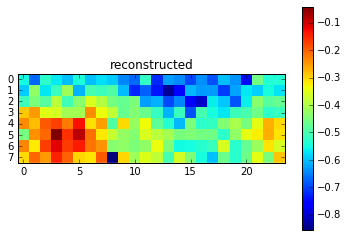

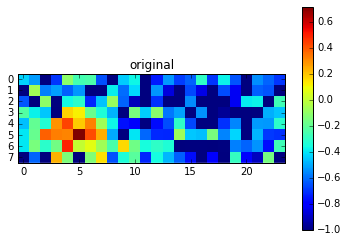

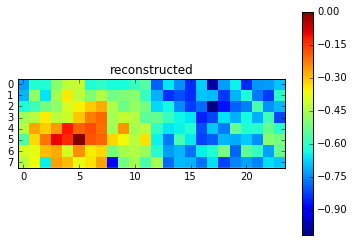

Epoch 372 of 1000 took 0.267s
	training los:		0.0579
	training acc:		5.7810 %
  validation loss:		0.088275
  validation accuracy:		8.83 %
Epoch 373 of 1000 took 0.228s
	training los:		0.0579
	training acc:		5.7907 %
  validation loss:		0.088326
  validation accuracy:		8.83 %
Epoch 374 of 1000 took 0.221s
	training los:		0.0578
	training acc:		5.7763 %
  validation loss:		0.087772
  validation accuracy:		8.78 %
Epoch 375 of 1000 took 0.221s
	training los:		0.0578
	training acc:		5.7586 %
  validation loss:		0.087831
  validation accuracy:		8.78 %
Epoch 376 of 1000 took 0.222s
	training los:		0.0579
	training acc:		5.7550 %
  validation loss:		0.088035
  validation accuracy:		8.80 %
Epoch 377 of 1000 took 0.221s
	training los:		0.0574
	training acc:		5.7499 %
  validation loss:		0.087780
  validation accuracy:		8.78 %
Epoch 378 of 1000 took 0.221s
	training los:		0.0575
	training acc:		5.7097 %
  validation loss:		0.088540
  validation accuracy:		8.85 %
Epoch 379 of 1000 took 0.221s
	tra

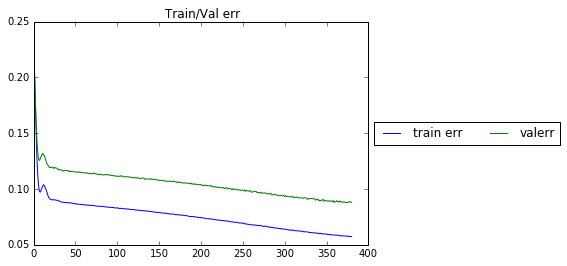

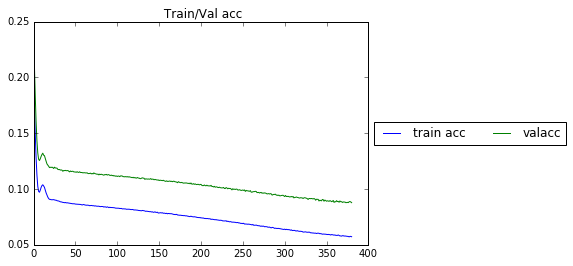

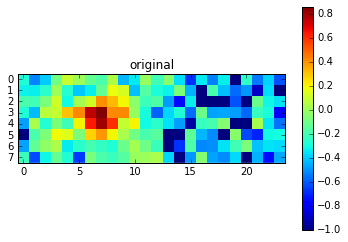

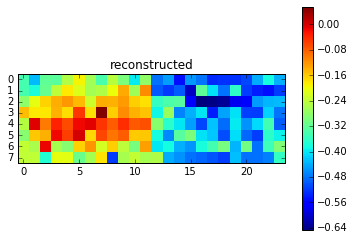

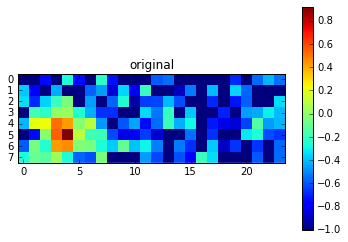

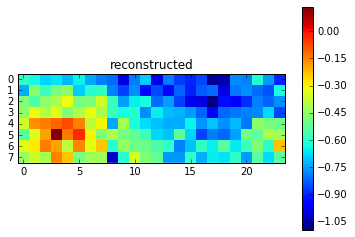

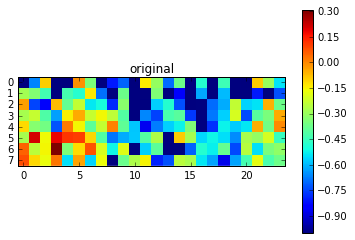

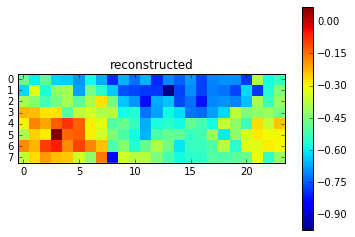

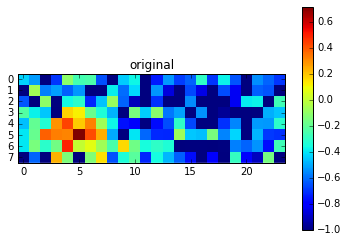

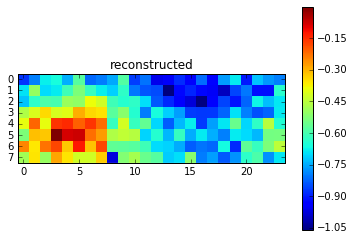

Epoch 382 of 1000 took 0.298s
	training los:		0.0573
	training acc:		5.7147 %
  validation loss:		0.087611
  validation accuracy:		8.76 %
Epoch 383 of 1000 took 0.246s
	training los:		0.0571
	training acc:		5.7038 %
  validation loss:		0.087807
  validation accuracy:		8.78 %
Epoch 384 of 1000 took 0.226s
	training los:		0.0571
	training acc:		5.7041 %
  validation loss:		0.086988
  validation accuracy:		8.70 %
Epoch 385 of 1000 took 0.225s
	training los:		0.0570
	training acc:		5.6987 %
  validation loss:		0.088258
  validation accuracy:		8.83 %
Epoch 386 of 1000 took 0.226s
	training los:		0.0571
	training acc:		5.7057 %
  validation loss:		0.087299
  validation accuracy:		8.73 %
Epoch 387 of 1000 took 0.225s
	training los:		0.0569
	training acc:		5.7023 %
  validation loss:		0.087046
  validation accuracy:		8.70 %
Epoch 388 of 1000 took 0.225s
	training los:		0.0569
	training acc:		5.6666 %
  validation loss:		0.086599
  validation accuracy:		8.66 %
Epoch 389 of 1000 took 0.226s
	tra

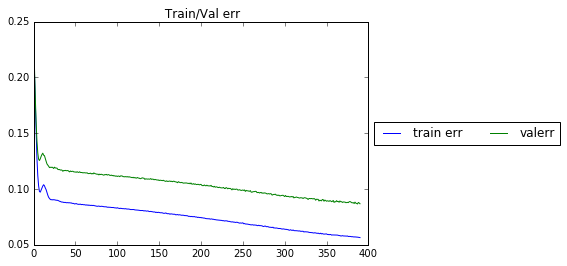

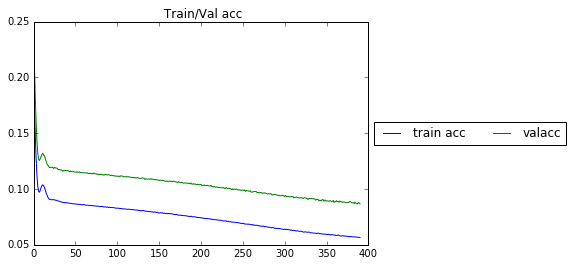

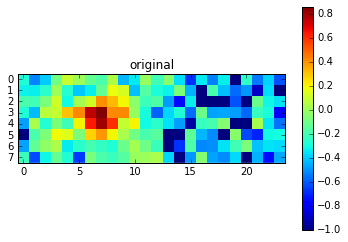

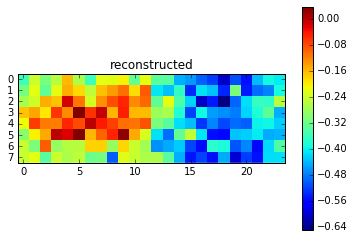

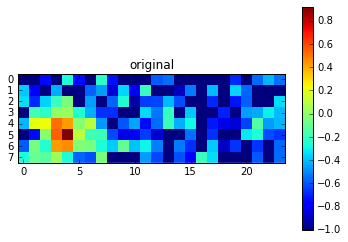

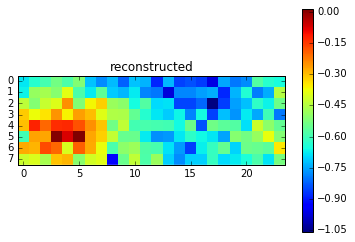

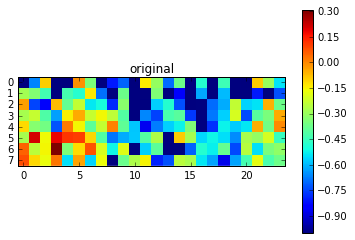

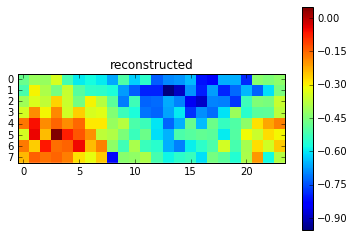

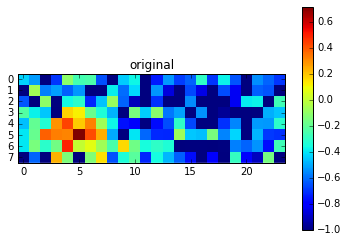

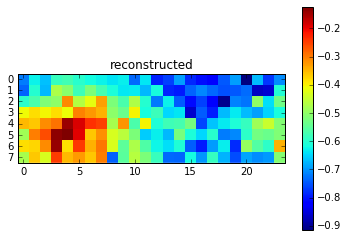

Epoch 392 of 1000 took 0.230s
	training los:		0.0565
	training acc:		5.6617 %
  validation loss:		0.086755
  validation accuracy:		8.68 %
Epoch 393 of 1000 took 0.221s
	training los:		0.0565
	training acc:		5.6470 %
  validation loss:		0.086949
  validation accuracy:		8.69 %
Epoch 394 of 1000 took 0.222s
	training los:		0.0562
	training acc:		5.6526 %
  validation loss:		0.086764
  validation accuracy:		8.68 %
Epoch 395 of 1000 took 0.221s
	training los:		0.0562
	training acc:		5.6318 %
  validation loss:		0.087426
  validation accuracy:		8.74 %
Epoch 396 of 1000 took 0.221s
	training los:		0.0563
	training acc:		5.6202 %
  validation loss:		0.086236
  validation accuracy:		8.62 %
Epoch 397 of 1000 took 0.222s
	training los:		0.0562
	training acc:		5.6261 %
  validation loss:		0.086838
  validation accuracy:		8.68 %
Epoch 398 of 1000 took 0.221s
	training los:		0.0560
	training acc:		5.6668 %
  validation loss:		0.087135
  validation accuracy:		8.71 %
Epoch 399 of 1000 took 0.222s
	tra

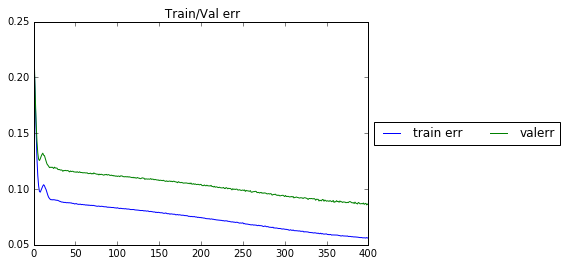

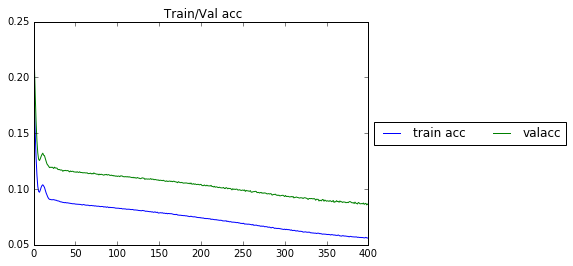

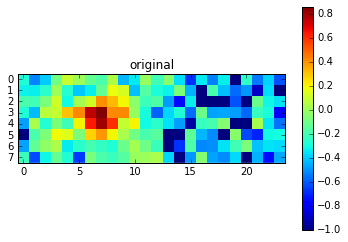

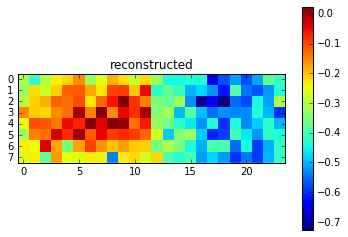

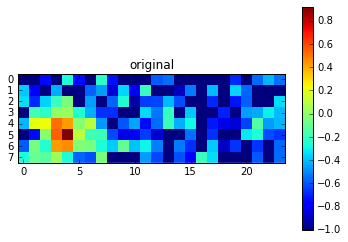

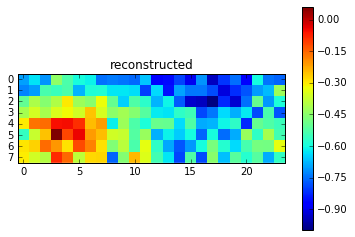

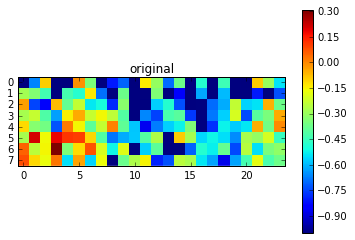

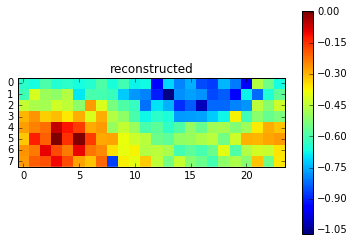

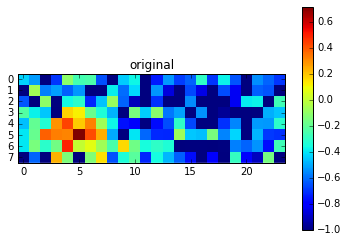

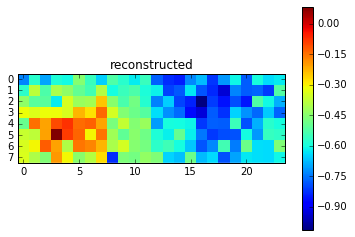

Epoch 402 of 1000 took 0.228s
	training los:		0.0559
	training acc:		5.5626 %
  validation loss:		0.086388
  validation accuracy:		8.64 %
Epoch 403 of 1000 took 0.221s
	training los:		0.0562
	training acc:		5.6138 %
  validation loss:		0.086238
  validation accuracy:		8.62 %
Epoch 404 of 1000 took 0.221s
	training los:		0.0559
	training acc:		5.5767 %
  validation loss:		0.086726
  validation accuracy:		8.67 %
Epoch 405 of 1000 took 0.222s
	training los:		0.0561
	training acc:		5.6105 %
  validation loss:		0.086717
  validation accuracy:		8.67 %
Epoch 406 of 1000 took 0.222s
	training los:		0.0556
	training acc:		5.5646 %
  validation loss:		0.086309
  validation accuracy:		8.63 %
Epoch 407 of 1000 took 0.223s
	training los:		0.0559
	training acc:		5.6013 %
  validation loss:		0.086703
  validation accuracy:		8.67 %
Epoch 408 of 1000 took 0.223s
	training los:		0.0557
	training acc:		5.5750 %
  validation loss:		0.086256
  validation accuracy:		8.63 %
Epoch 409 of 1000 took 0.224s
	tra

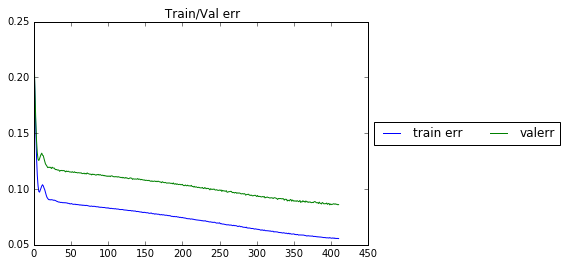

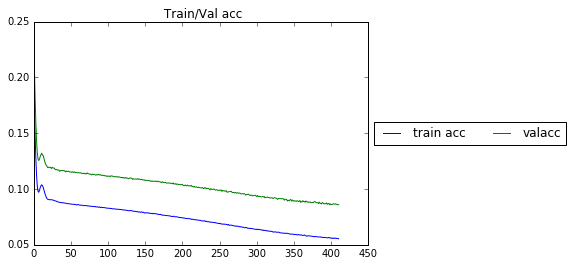

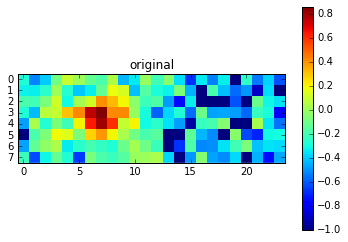

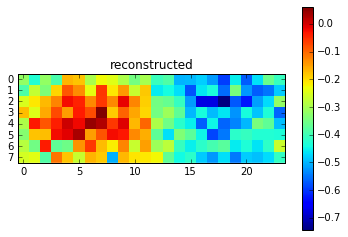

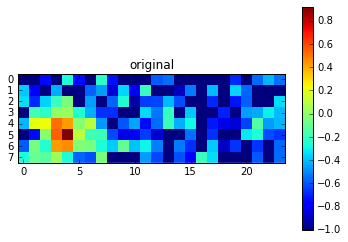

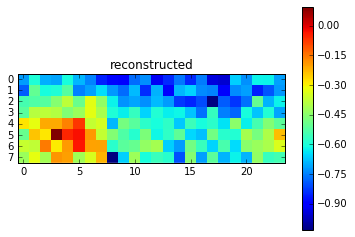

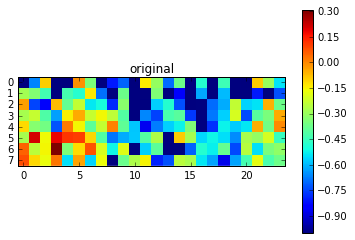

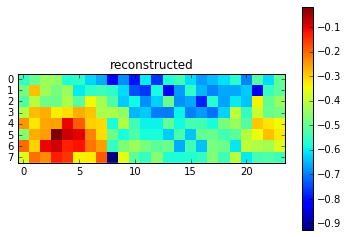

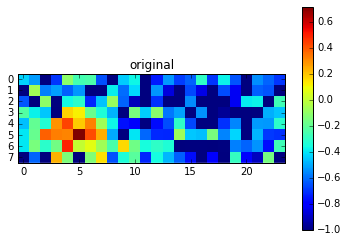

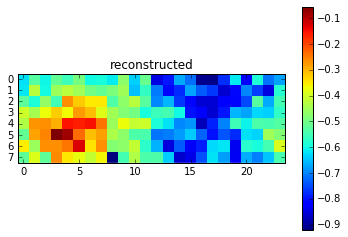

Epoch 412 of 1000 took 0.268s
	training los:		0.0554
	training acc:		5.5175 %
  validation loss:		0.085903
  validation accuracy:		8.59 %
Epoch 413 of 1000 took 0.221s
	training los:		0.0557
	training acc:		5.5570 %
  validation loss:		0.085946
  validation accuracy:		8.59 %
Epoch 414 of 1000 took 0.221s
	training los:		0.0553
	training acc:		5.5434 %
  validation loss:		0.085592
  validation accuracy:		8.56 %
Epoch 415 of 1000 took 0.221s
	training los:		0.0553
	training acc:		5.5195 %
  validation loss:		0.086291
  validation accuracy:		8.63 %
Epoch 416 of 1000 took 0.221s
	training los:		0.0554
	training acc:		5.5639 %
  validation loss:		0.086285
  validation accuracy:		8.63 %
Epoch 417 of 1000 took 0.222s
	training los:		0.0553
	training acc:		5.5167 %
  validation loss:		0.085286
  validation accuracy:		8.53 %
Epoch 418 of 1000 took 0.221s
	training los:		0.0554
	training acc:		5.5193 %
  validation loss:		0.086176
  validation accuracy:		8.62 %
Epoch 419 of 1000 took 0.221s
	tra

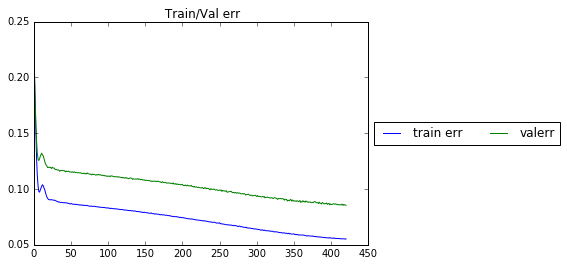

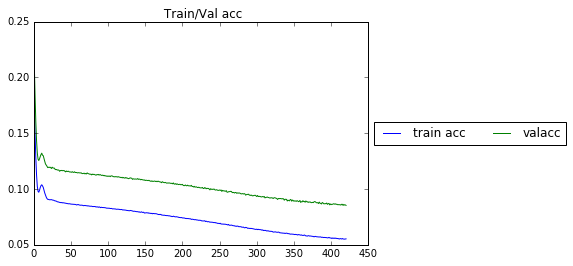

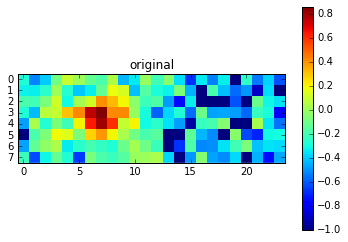

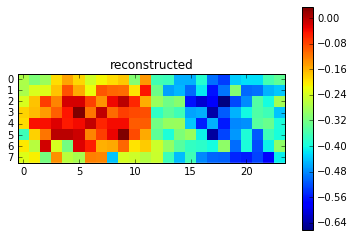

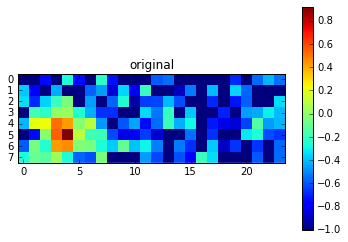

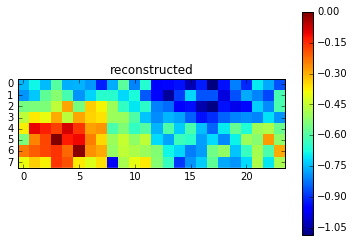

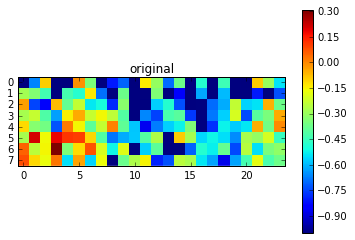

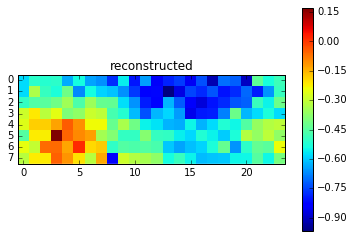

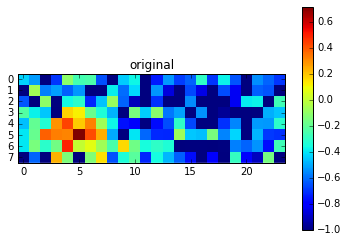

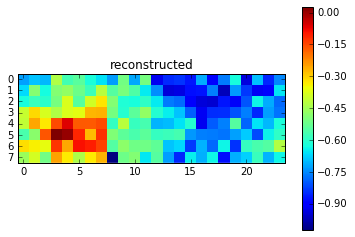

Epoch 422 of 1000 took 0.261s
	training los:		0.0551
	training acc:		5.5448 %
  validation loss:		0.085029
  validation accuracy:		8.50 %
Epoch 423 of 1000 took 0.222s
	training los:		0.0551
	training acc:		5.5113 %
  validation loss:		0.085253
  validation accuracy:		8.53 %
Epoch 424 of 1000 took 0.236s
	training los:		0.0549
	training acc:		5.4917 %
  validation loss:		0.086217
  validation accuracy:		8.62 %
Epoch 425 of 1000 took 0.227s
	training los:		0.0548
	training acc:		5.5135 %
  validation loss:		0.085235
  validation accuracy:		8.52 %
Epoch 426 of 1000 took 0.226s
	training los:		0.0546
	training acc:		5.4823 %
  validation loss:		0.086214
  validation accuracy:		8.62 %
Epoch 427 of 1000 took 0.224s
	training los:		0.0548
	training acc:		5.5027 %
  validation loss:		0.084926
  validation accuracy:		8.49 %
Epoch 428 of 1000 took 0.236s
	training los:		0.0547
	training acc:		5.4766 %
  validation loss:		0.085166
  validation accuracy:		8.52 %
Epoch 429 of 1000 took 0.224s
	tra

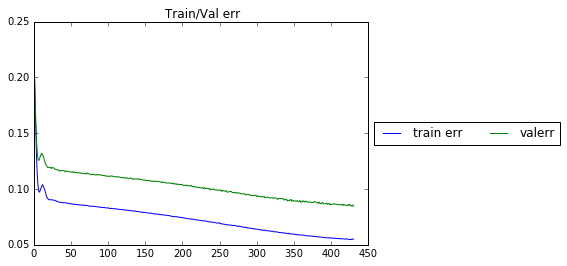

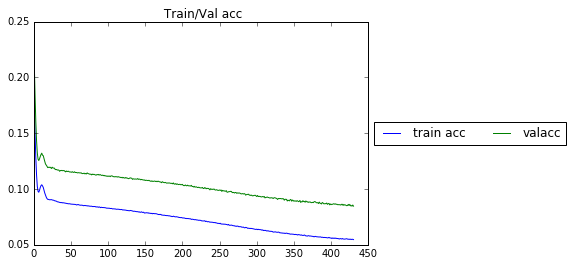

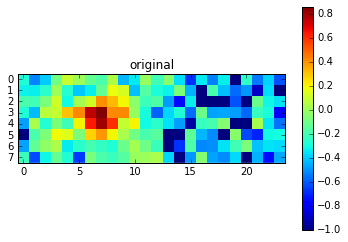

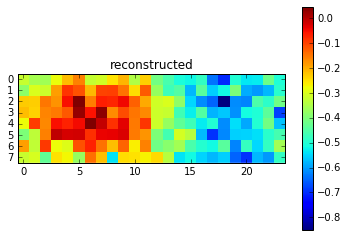

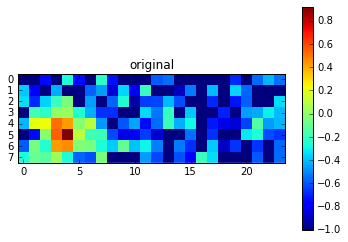

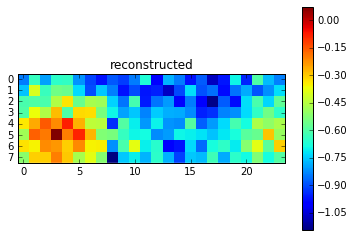

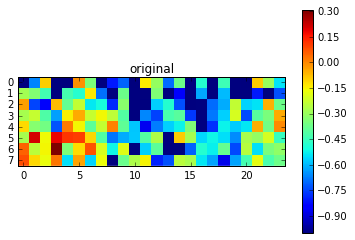

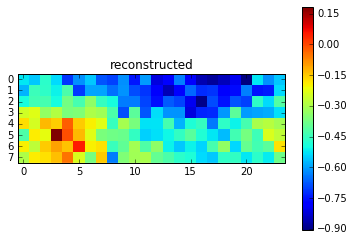

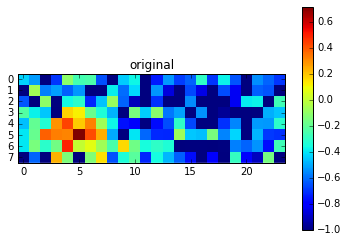

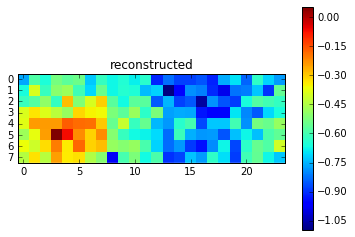

Epoch 432 of 1000 took 0.266s
	training los:		0.0550
	training acc:		5.4558 %
  validation loss:		0.085017
  validation accuracy:		8.50 %
Epoch 433 of 1000 took 0.225s
	training los:		0.0549
	training acc:		5.4377 %
  validation loss:		0.086005
  validation accuracy:		8.60 %
Epoch 434 of 1000 took 0.224s
	training los:		0.0545
	training acc:		5.4607 %
  validation loss:		0.085719
  validation accuracy:		8.57 %
Epoch 435 of 1000 took 0.224s
	training los:		0.0543
	training acc:		5.4462 %
  validation loss:		0.085383
  validation accuracy:		8.54 %
Epoch 436 of 1000 took 0.225s
	training los:		0.0544
	training acc:		5.4248 %
  validation loss:		0.084075
  validation accuracy:		8.41 %
Epoch 437 of 1000 took 0.225s
	training los:		0.0544
	training acc:		5.4164 %
  validation loss:		0.084050
  validation accuracy:		8.41 %
Epoch 438 of 1000 took 0.224s
	training los:		0.0547
	training acc:		5.4356 %
  validation loss:		0.083995
  validation accuracy:		8.40 %
Epoch 439 of 1000 took 0.225s
	tra

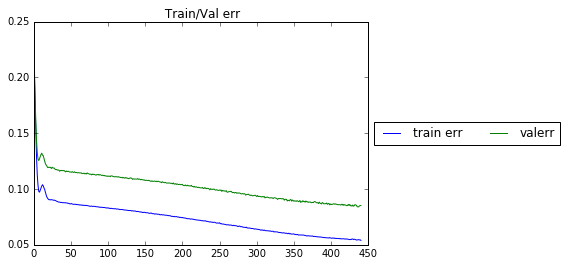

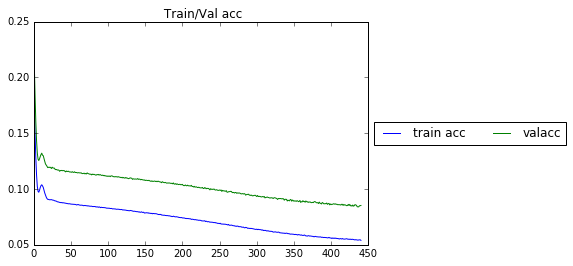

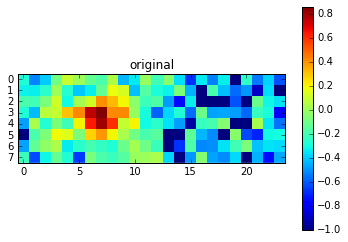

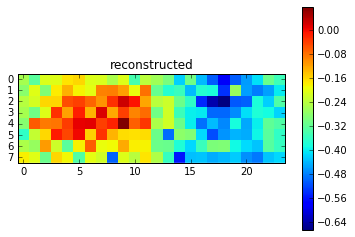

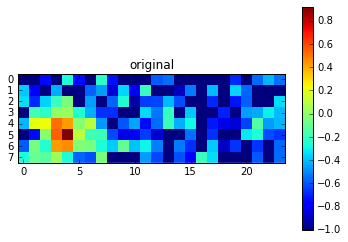

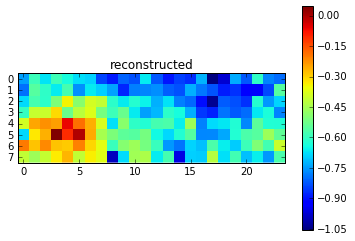

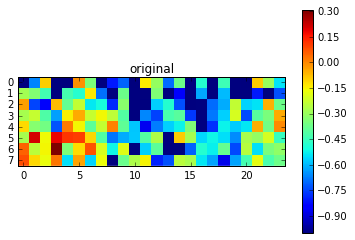

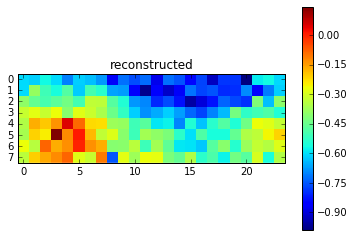

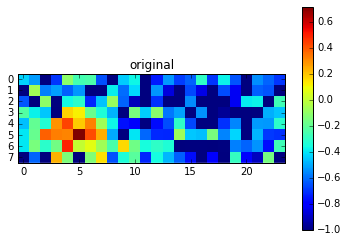

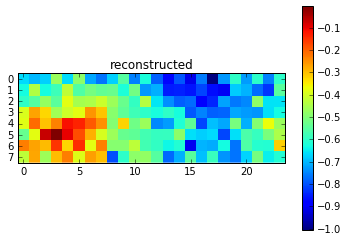

Epoch 442 of 1000 took 0.374s
	training los:		0.0544
	training acc:		5.4228 %
  validation loss:		0.085159
  validation accuracy:		8.52 %
Epoch 443 of 1000 took 0.248s
	training los:		0.0543
	training acc:		5.4282 %
  validation loss:		0.085090
  validation accuracy:		8.51 %
Epoch 444 of 1000 took 0.227s
	training los:		0.0542
	training acc:		5.3992 %
  validation loss:		0.085104
  validation accuracy:		8.51 %
Epoch 445 of 1000 took 0.226s
	training los:		0.0539
	training acc:		5.4086 %
  validation loss:		0.084727
  validation accuracy:		8.47 %
Epoch 446 of 1000 took 0.226s
	training los:		0.0540
	training acc:		5.4021 %
  validation loss:		0.084920
  validation accuracy:		8.49 %
Epoch 447 of 1000 took 0.226s
	training los:		0.0538
	training acc:		5.4006 %
  validation loss:		0.084813
  validation accuracy:		8.48 %
Epoch 448 of 1000 took 0.231s
	training los:		0.0541
	training acc:		5.3849 %
  validation loss:		0.085076
  validation accuracy:		8.51 %
Epoch 449 of 1000 took 0.226s
	tra

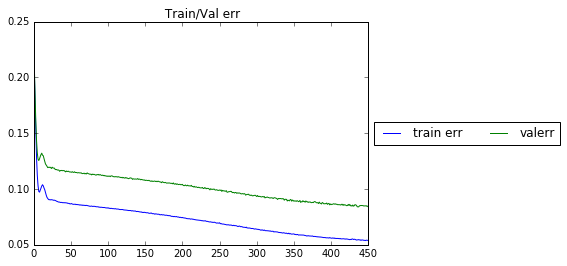

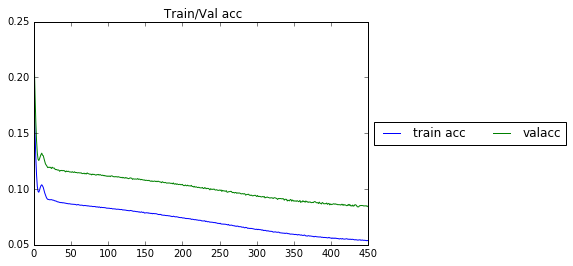

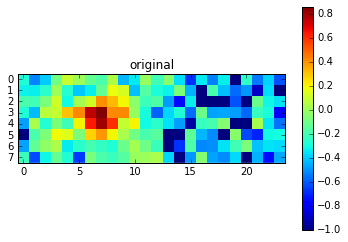

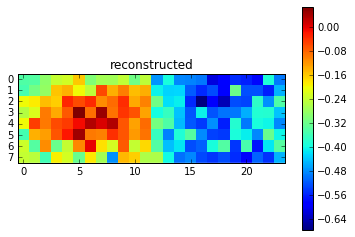

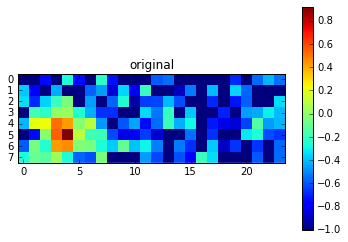

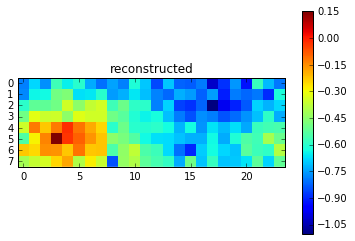

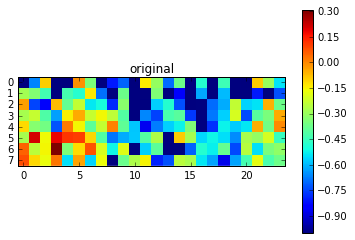

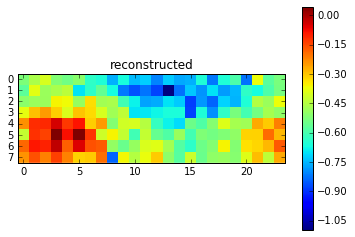

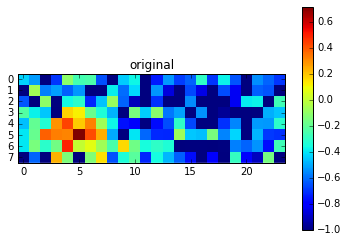

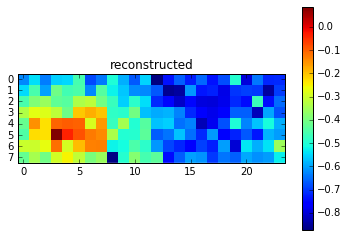

Epoch 452 of 1000 took 0.338s
	training los:		0.0537
	training acc:		5.3922 %
  validation loss:		0.084652
  validation accuracy:		8.47 %
Epoch 453 of 1000 took 0.246s
	training los:		0.0539
	training acc:		5.3736 %
  validation loss:		0.084908
  validation accuracy:		8.49 %
Epoch 454 of 1000 took 0.221s
	training los:		0.0536
	training acc:		5.3536 %
  validation loss:		0.083981
  validation accuracy:		8.40 %
Epoch 455 of 1000 took 0.221s
	training los:		0.0535
	training acc:		5.3764 %
  validation loss:		0.084691
  validation accuracy:		8.47 %
Epoch 456 of 1000 took 0.220s
	training los:		0.0537
	training acc:		5.3791 %
  validation loss:		0.085477
  validation accuracy:		8.55 %
Epoch 457 of 1000 took 0.221s
	training los:		0.0537
	training acc:		5.3653 %
  validation loss:		0.084838
  validation accuracy:		8.48 %
Epoch 458 of 1000 took 0.221s
	training los:		0.0534
	training acc:		5.3982 %
  validation loss:		0.083909
  validation accuracy:		8.39 %
Epoch 459 of 1000 took 0.221s
	tra

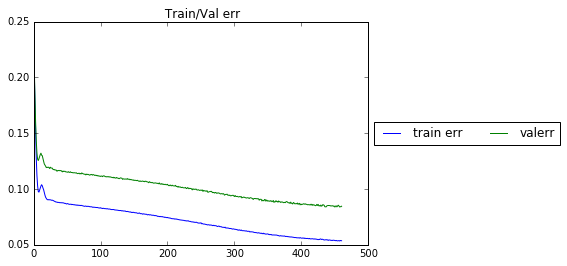

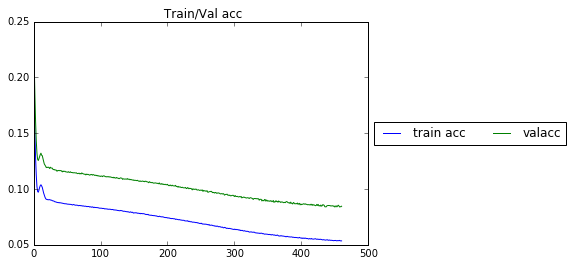

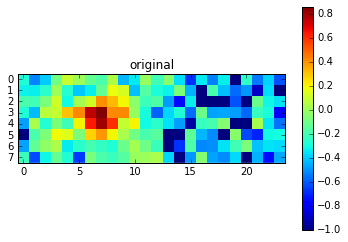

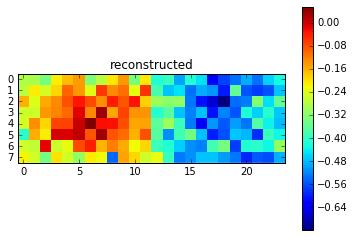

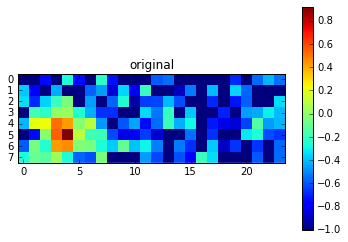

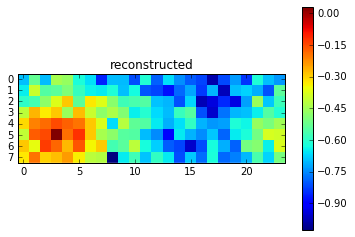

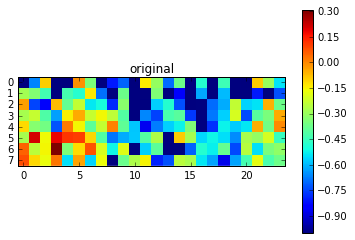

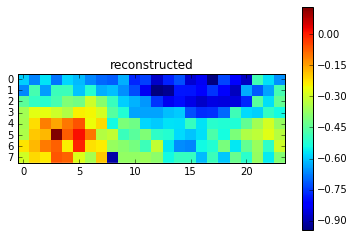

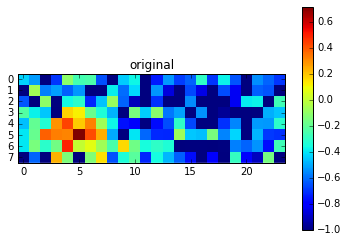

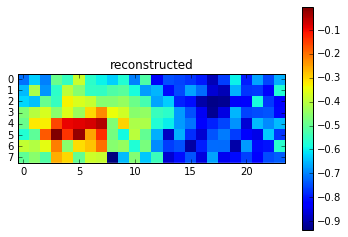

Epoch 462 of 1000 took 0.360s
	training los:		0.0534
	training acc:		5.3204 %
  validation loss:		0.084281
  validation accuracy:		8.43 %
Epoch 463 of 1000 took 0.224s
	training los:		0.0534
	training acc:		5.3530 %
  validation loss:		0.083768
  validation accuracy:		8.38 %
Epoch 464 of 1000 took 0.224s
	training los:		0.0536
	training acc:		5.3546 %
  validation loss:		0.083591
  validation accuracy:		8.36 %
Epoch 465 of 1000 took 0.223s
	training los:		0.0531
	training acc:		5.3440 %
  validation loss:		0.084071
  validation accuracy:		8.41 %
Epoch 466 of 1000 took 0.225s
	training los:		0.0536
	training acc:		5.3407 %
  validation loss:		0.083574
  validation accuracy:		8.36 %
Epoch 467 of 1000 took 0.229s
	training los:		0.0533
	training acc:		5.3270 %
  validation loss:		0.084565
  validation accuracy:		8.46 %
Epoch 468 of 1000 took 0.225s
	training los:		0.0534
	training acc:		5.3283 %
  validation loss:		0.084068
  validation accuracy:		8.41 %
Epoch 469 of 1000 took 0.228s
	tra

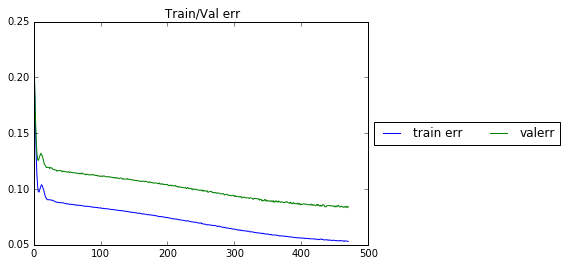

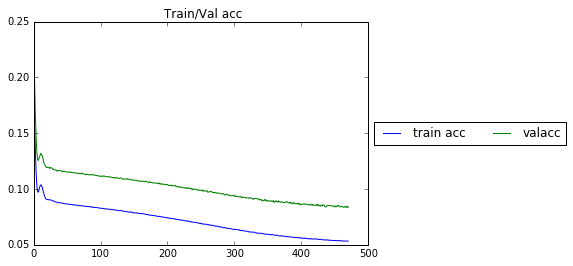

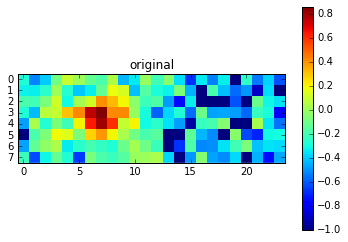

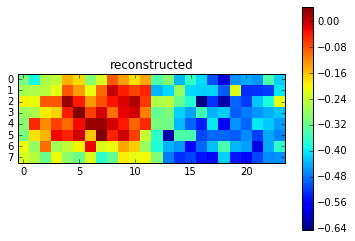

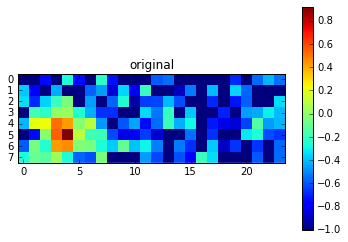

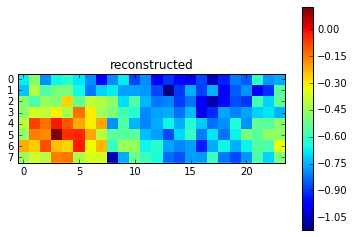

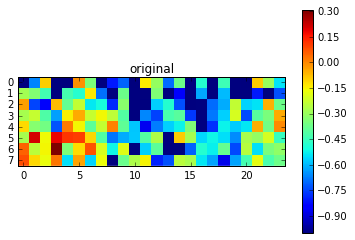

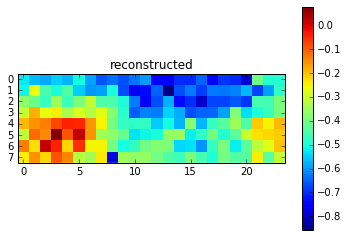

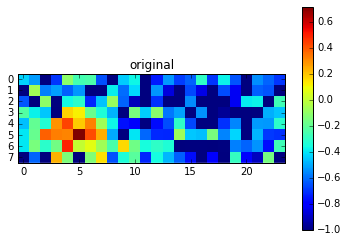

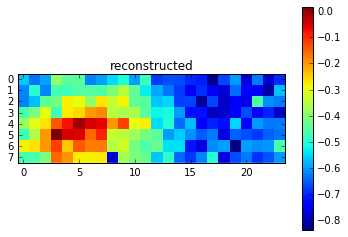

Epoch 472 of 1000 took 0.284s
	training los:		0.0534
	training acc:		5.3161 %
  validation loss:		0.083434
  validation accuracy:		8.34 %
Epoch 473 of 1000 took 0.260s
	training los:		0.0530
	training acc:		5.2709 %
  validation loss:		0.084035
  validation accuracy:		8.40 %
Epoch 474 of 1000 took 0.225s
	training los:		0.0529
	training acc:		5.2968 %
  validation loss:		0.084427
  validation accuracy:		8.44 %
Epoch 475 of 1000 took 0.254s
	training los:		0.0531
	training acc:		5.3372 %
  validation loss:		0.083395
  validation accuracy:		8.34 %
Epoch 476 of 1000 took 0.261s
	training los:		0.0527
	training acc:		5.2695 %
  validation loss:		0.084184
  validation accuracy:		8.42 %
Epoch 477 of 1000 took 0.231s
	training los:		0.0533
	training acc:		5.2846 %
  validation loss:		0.083495
  validation accuracy:		8.35 %
Epoch 478 of 1000 took 0.226s
	training los:		0.0530
	training acc:		5.2789 %
  validation loss:		0.084475
  validation accuracy:		8.45 %
Epoch 479 of 1000 took 0.228s
	tra

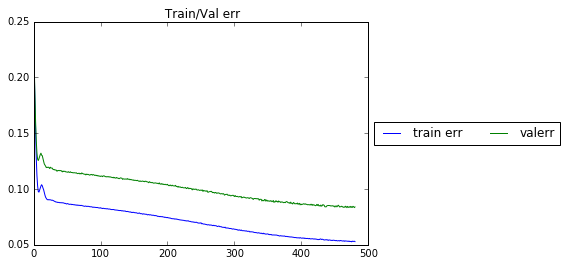

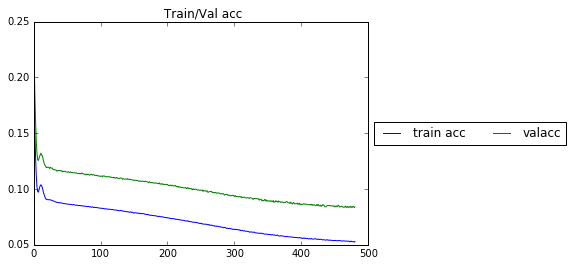

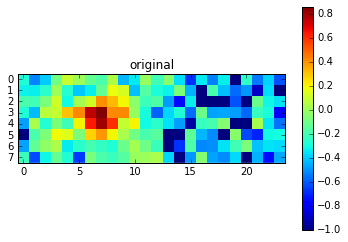

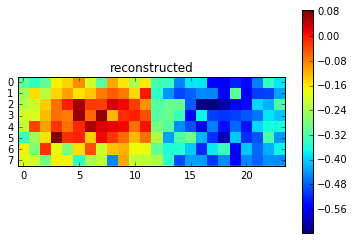

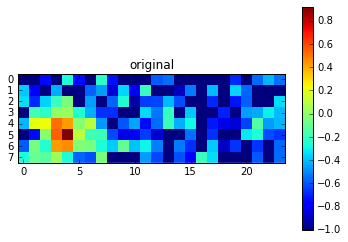

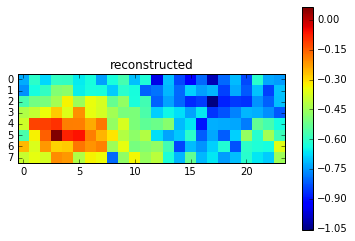

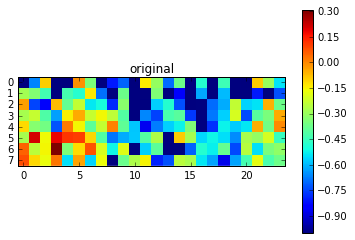

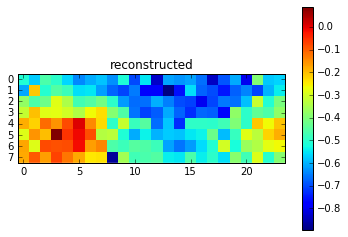

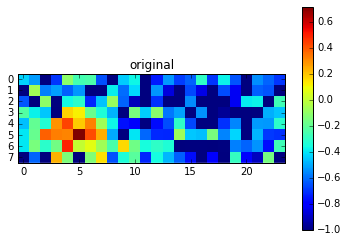

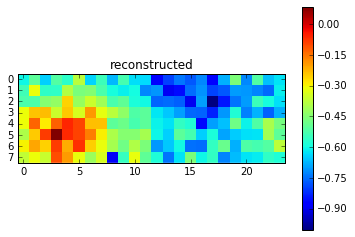

Epoch 482 of 1000 took 0.254s
	training los:		0.0526
	training acc:		5.2814 %
  validation loss:		0.083355
  validation accuracy:		8.34 %
Epoch 483 of 1000 took 0.223s
	training los:		0.0529
	training acc:		5.2853 %
  validation loss:		0.082614
  validation accuracy:		8.26 %
Epoch 484 of 1000 took 0.223s
	training los:		0.0524
	training acc:		5.2740 %
  validation loss:		0.083484
  validation accuracy:		8.35 %
Epoch 485 of 1000 took 0.249s
	training los:		0.0527
	training acc:		5.2772 %
  validation loss:		0.083537
  validation accuracy:		8.35 %
Epoch 486 of 1000 took 0.222s
	training los:		0.0527
	training acc:		5.2727 %
  validation loss:		0.083474
  validation accuracy:		8.35 %
Epoch 487 of 1000 took 0.225s
	training los:		0.0525
	training acc:		5.2652 %
  validation loss:		0.082484
  validation accuracy:		8.25 %
Epoch 488 of 1000 took 0.221s
	training los:		0.0526
	training acc:		5.2628 %
  validation loss:		0.084057
  validation accuracy:		8.41 %
Epoch 489 of 1000 took 0.232s
	tra

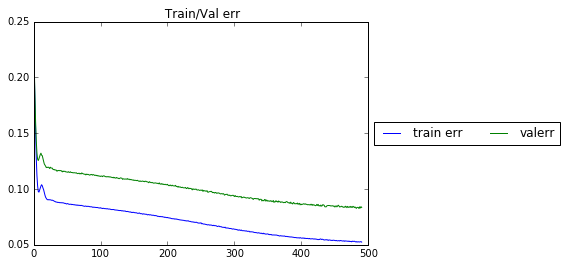

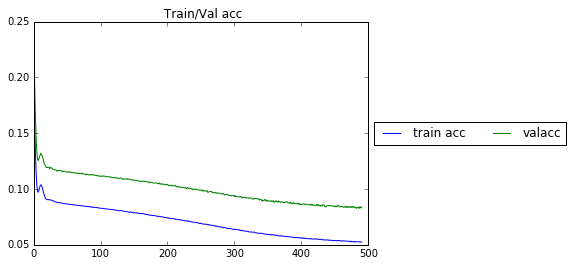

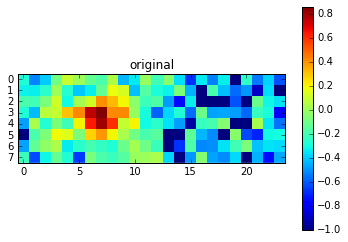

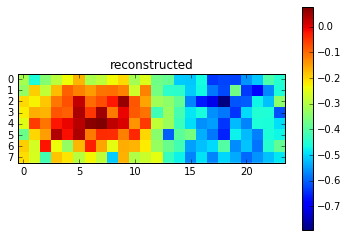

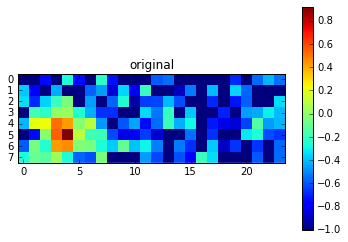

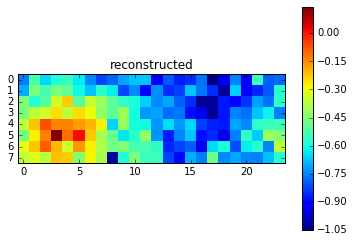

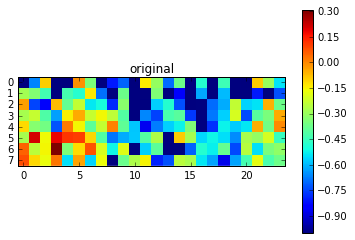

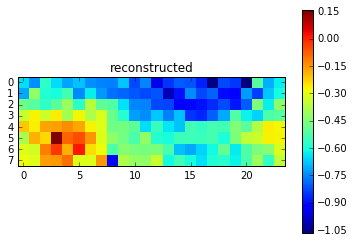

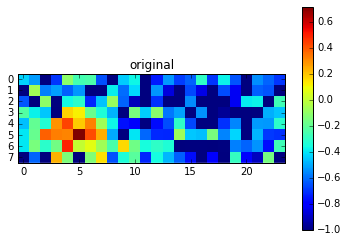

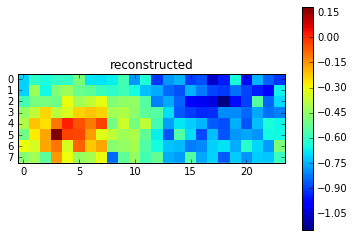

Epoch 492 of 1000 took 0.269s
	training los:		0.0525
	training acc:		5.2609 %
  validation loss:		0.083171
  validation accuracy:		8.32 %
Epoch 493 of 1000 took 0.222s
	training los:		0.0525
	training acc:		5.2360 %
  validation loss:		0.082722
  validation accuracy:		8.27 %
Epoch 494 of 1000 took 0.221s
	training los:		0.0524
	training acc:		5.2641 %
  validation loss:		0.082995
  validation accuracy:		8.30 %
Epoch 495 of 1000 took 0.222s
	training los:		0.0525
	training acc:		5.2455 %
  validation loss:		0.082700
  validation accuracy:		8.27 %
Epoch 496 of 1000 took 0.222s
	training los:		0.0525
	training acc:		5.2417 %
  validation loss:		0.083230
  validation accuracy:		8.32 %
Epoch 497 of 1000 took 0.222s
	training los:		0.0523
	training acc:		5.2351 %
  validation loss:		0.083036
  validation accuracy:		8.30 %
Epoch 498 of 1000 took 0.222s
	training los:		0.0523
	training acc:		5.2019 %
  validation loss:		0.083388
  validation accuracy:		8.34 %
Epoch 499 of 1000 took 0.230s
	tra

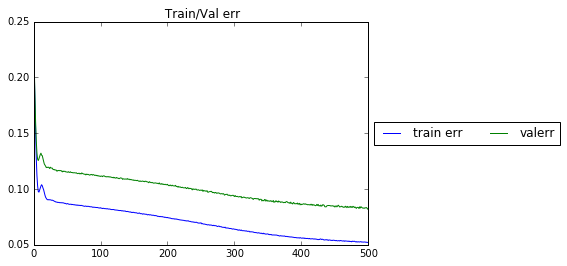

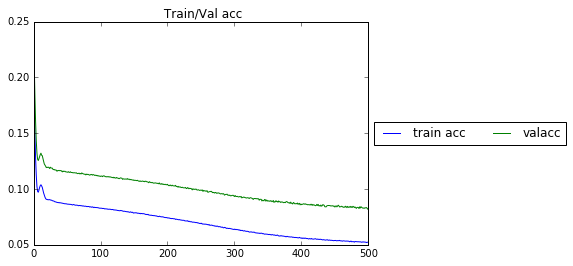

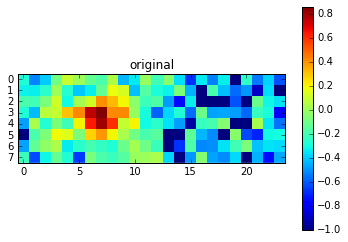

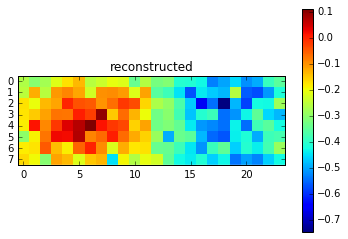

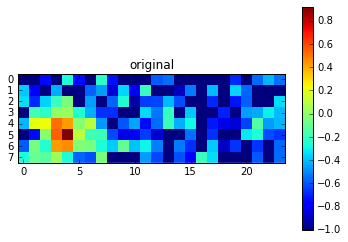

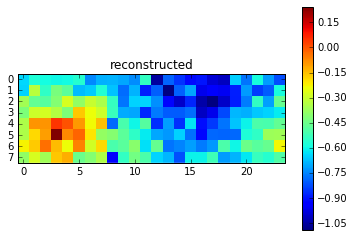

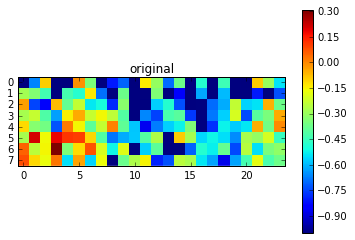

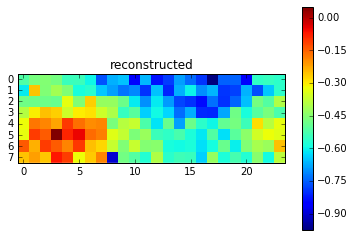

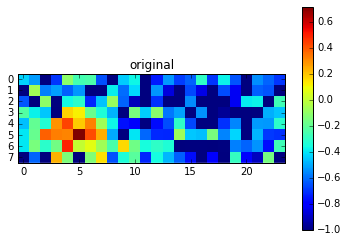

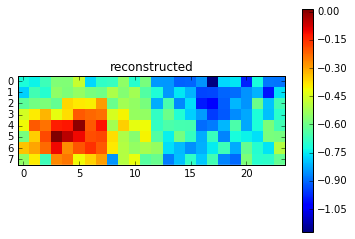

Epoch 502 of 1000 took 0.280s
	training los:		0.0523
	training acc:		5.1759 %
  validation loss:		0.083141
  validation accuracy:		8.31 %
Epoch 503 of 1000 took 0.223s
	training los:		0.0522
	training acc:		5.2227 %
  validation loss:		0.083078
  validation accuracy:		8.31 %
Epoch 504 of 1000 took 0.223s
	training los:		0.0522
	training acc:		5.2262 %
  validation loss:		0.082203
  validation accuracy:		8.22 %
Epoch 505 of 1000 took 0.225s
	training los:		0.0521
	training acc:		5.1929 %
  validation loss:		0.083797
  validation accuracy:		8.38 %
Epoch 506 of 1000 took 0.224s
	training los:		0.0522
	training acc:		5.1988 %
  validation loss:		0.082484
  validation accuracy:		8.25 %
Epoch 507 of 1000 took 0.223s
	training los:		0.0521
	training acc:		5.1957 %
  validation loss:		0.083452
  validation accuracy:		8.35 %
Epoch 508 of 1000 took 0.223s
	training los:		0.0522
	training acc:		5.1866 %
  validation loss:		0.083151
  validation accuracy:		8.32 %
Epoch 509 of 1000 took 0.223s
	tra

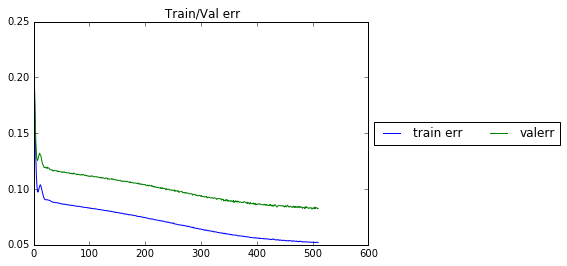

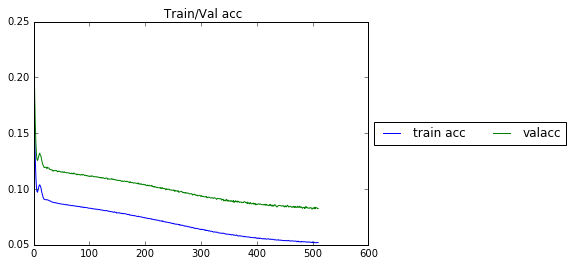

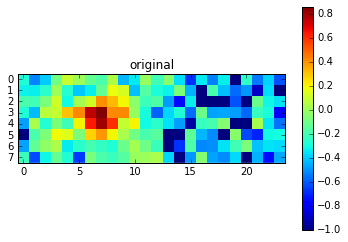

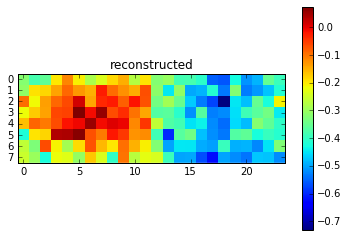

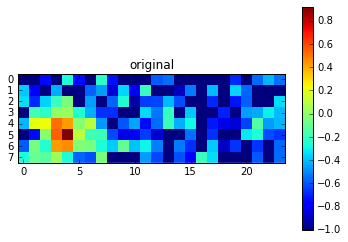

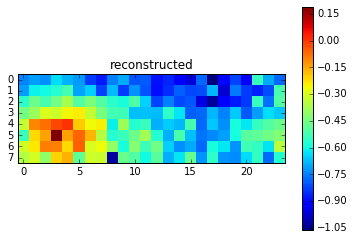

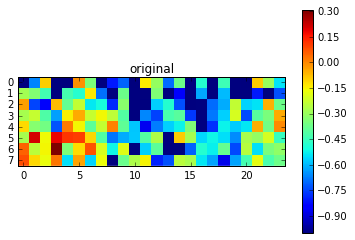

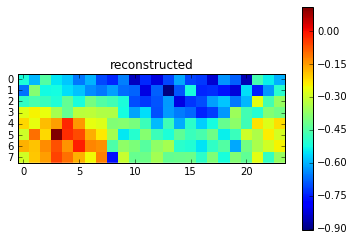

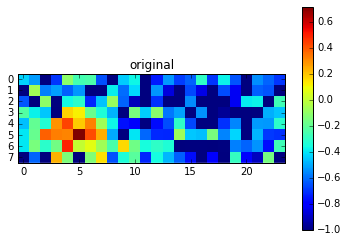

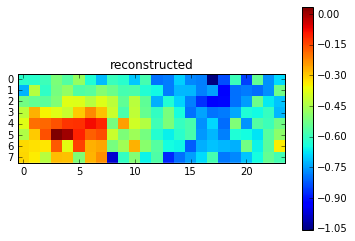

Epoch 512 of 1000 took 0.396s
	training los:		0.0519
	training acc:		5.1857 %
  validation loss:		0.082690
  validation accuracy:		8.27 %
Epoch 513 of 1000 took 0.223s
	training los:		0.0519
	training acc:		5.1728 %
  validation loss:		0.082172
  validation accuracy:		8.22 %
Epoch 514 of 1000 took 0.222s
	training los:		0.0519
	training acc:		5.1832 %
  validation loss:		0.083237
  validation accuracy:		8.32 %
Epoch 515 of 1000 took 0.222s
	training los:		0.0519
	training acc:		5.1885 %
  validation loss:		0.082368
  validation accuracy:		8.24 %
Epoch 516 of 1000 took 0.222s
	training los:		0.0519
	training acc:		5.1950 %
  validation loss:		0.082591
  validation accuracy:		8.26 %
Epoch 517 of 1000 took 0.223s
	training los:		0.0520
	training acc:		5.1588 %
  validation loss:		0.082636
  validation accuracy:		8.26 %
Epoch 518 of 1000 took 0.223s
	training los:		0.0519
	training acc:		5.1852 %
  validation loss:		0.082349
  validation accuracy:		8.23 %
Epoch 519 of 1000 took 0.223s
	tra

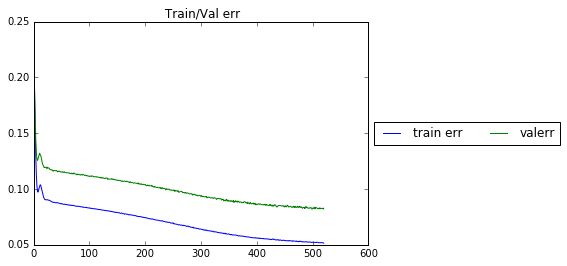

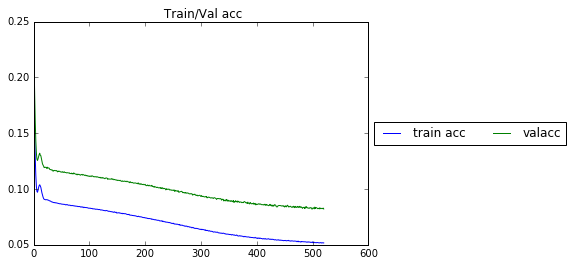

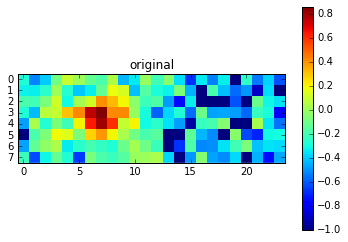

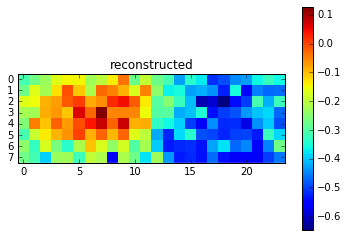

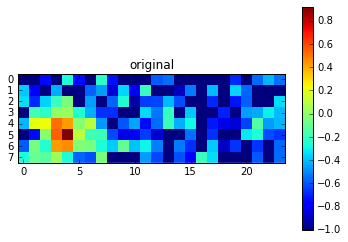

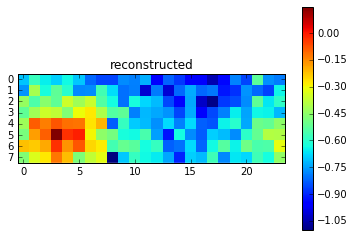

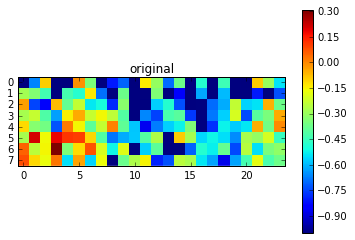

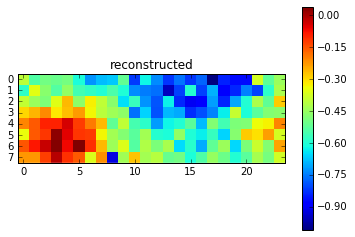

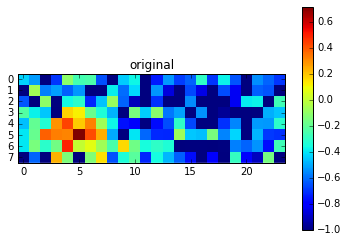

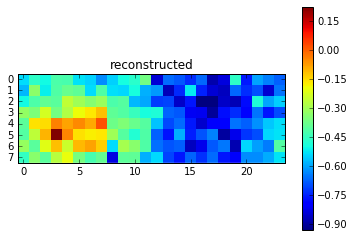

Epoch 522 of 1000 took 0.284s
	training los:		0.0515
	training acc:		5.1644 %
  validation loss:		0.083074
  validation accuracy:		8.31 %
Epoch 523 of 1000 took 0.235s
	training los:		0.0517
	training acc:		5.1805 %
  validation loss:		0.081796
  validation accuracy:		8.18 %
Epoch 524 of 1000 took 0.224s
	training los:		0.0516
	training acc:		5.1529 %
  validation loss:		0.083036
  validation accuracy:		8.30 %
Epoch 525 of 1000 took 0.224s
	training los:		0.0514
	training acc:		5.1451 %
  validation loss:		0.082737
  validation accuracy:		8.27 %
Epoch 526 of 1000 took 0.226s
	training los:		0.0513
	training acc:		5.1547 %
  validation loss:		0.082872
  validation accuracy:		8.29 %
Epoch 527 of 1000 took 0.223s
	training los:		0.0514
	training acc:		5.1602 %
  validation loss:		0.082612
  validation accuracy:		8.26 %
Epoch 528 of 1000 took 0.224s
	training los:		0.0514
	training acc:		5.1493 %
  validation loss:		0.082429
  validation accuracy:		8.24 %
Epoch 529 of 1000 took 0.224s
	tra

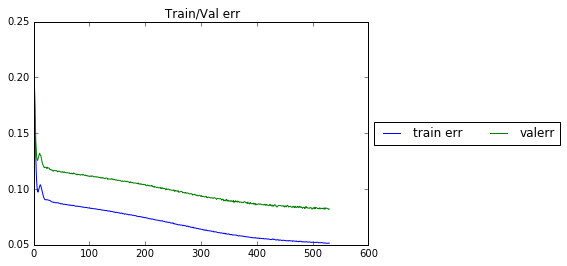

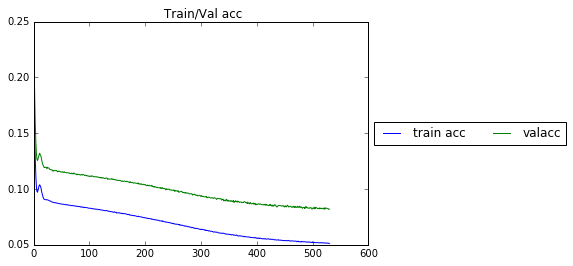

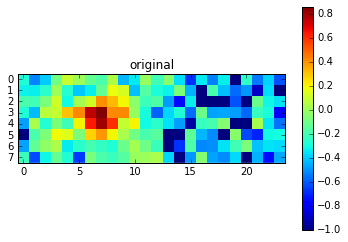

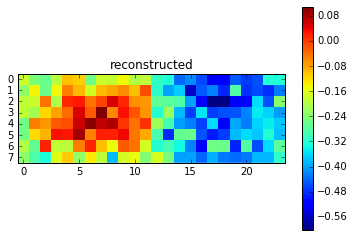

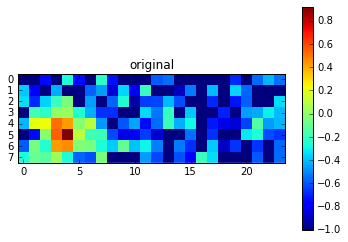

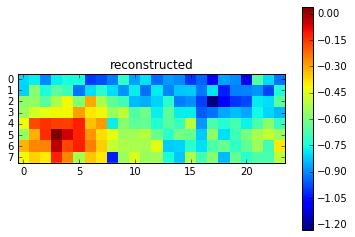

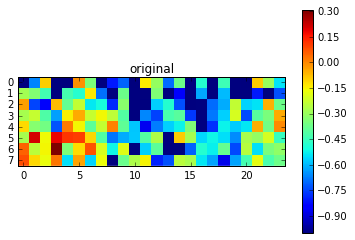

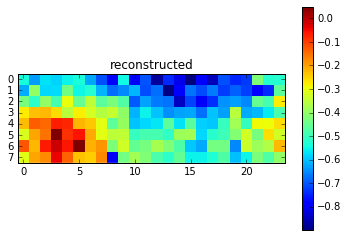

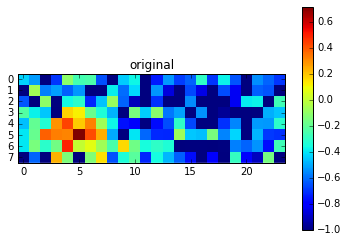

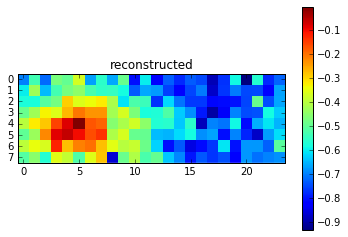

Epoch 532 of 1000 took 0.247s
	training los:		0.0514
	training acc:		5.1336 %
  validation loss:		0.082219
  validation accuracy:		8.22 %
Epoch 533 of 1000 took 0.286s
	training los:		0.0515
	training acc:		5.1520 %
  validation loss:		0.082840
  validation accuracy:		8.28 %
Epoch 534 of 1000 took 0.223s
	training los:		0.0513
	training acc:		5.1206 %
  validation loss:		0.082433
  validation accuracy:		8.24 %
Epoch 535 of 1000 took 0.223s
	training los:		0.0515
	training acc:		5.1087 %
  validation loss:		0.081665
  validation accuracy:		8.17 %
Epoch 536 of 1000 took 0.223s
	training los:		0.0513
	training acc:		5.1172 %
  validation loss:		0.081840
  validation accuracy:		8.18 %
Epoch 537 of 1000 took 0.224s
	training los:		0.0513
	training acc:		5.1395 %
  validation loss:		0.081993
  validation accuracy:		8.20 %
Epoch 538 of 1000 took 0.240s
	training los:		0.0513
	training acc:		5.1392 %
  validation loss:		0.082773
  validation accuracy:		8.28 %
Epoch 539 of 1000 took 0.222s
	tra

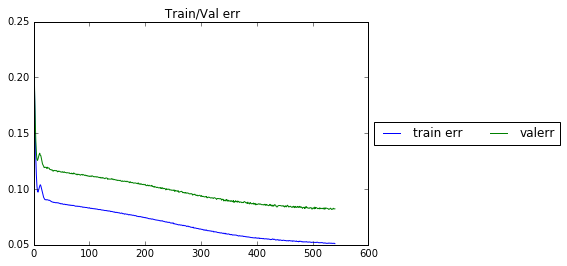

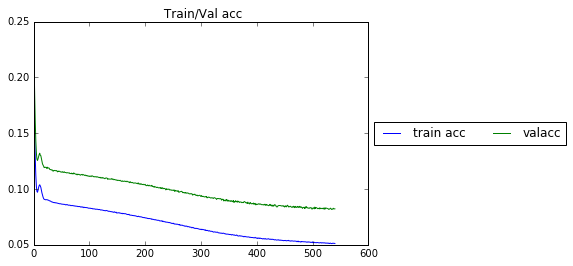

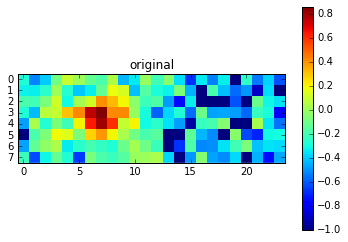

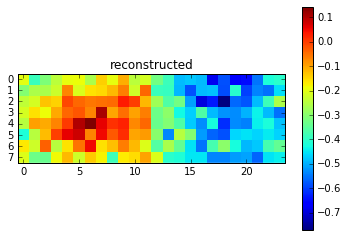

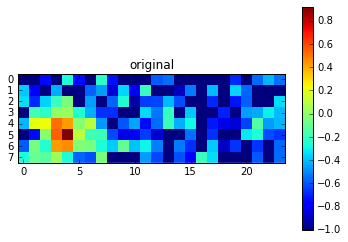

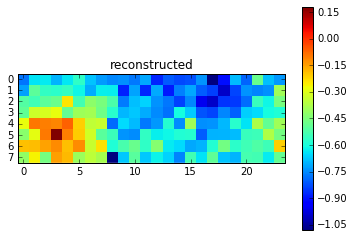

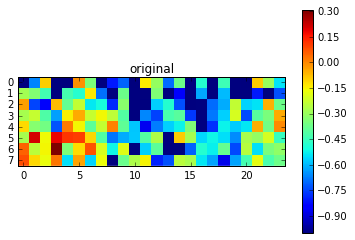

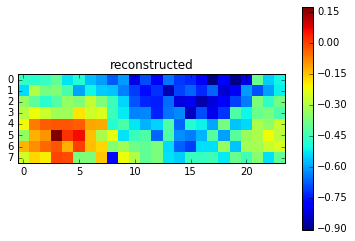

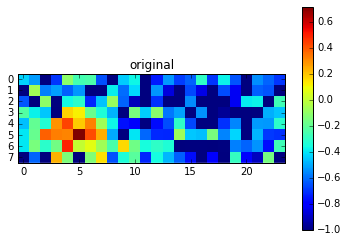

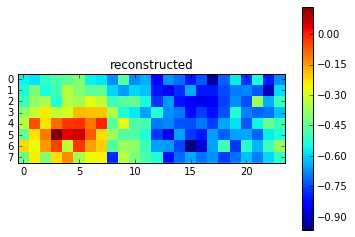

Epoch 542 of 1000 took 0.259s
	training los:		0.0511
	training acc:		5.1401 %
  validation loss:		0.081846
  validation accuracy:		8.18 %
Epoch 543 of 1000 took 0.249s
	training los:		0.0511
	training acc:		5.1214 %
  validation loss:		0.081247
  validation accuracy:		8.12 %
Epoch 544 of 1000 took 0.222s
	training los:		0.0509
	training acc:		5.1091 %
  validation loss:		0.082368
  validation accuracy:		8.24 %
Epoch 545 of 1000 took 0.222s
	training los:		0.0508
	training acc:		5.0895 %
  validation loss:		0.082048
  validation accuracy:		8.20 %
Epoch 546 of 1000 took 0.222s
	training los:		0.0511
	training acc:		5.1123 %
  validation loss:		0.082344
  validation accuracy:		8.23 %
Epoch 547 of 1000 took 0.223s
	training los:		0.0509
	training acc:		5.1090 %
  validation loss:		0.082252
  validation accuracy:		8.23 %
Epoch 548 of 1000 took 0.222s
	training los:		0.0510
	training acc:		5.1200 %
  validation loss:		0.081113
  validation accuracy:		8.11 %
Epoch 549 of 1000 took 0.222s
	tra

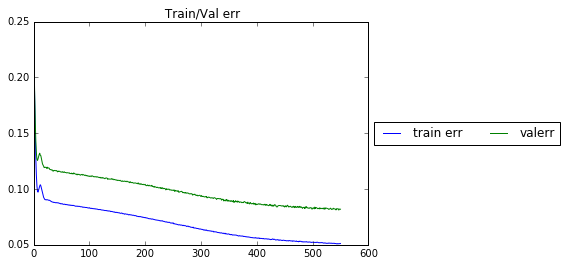

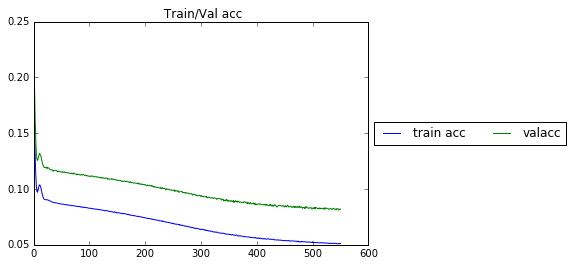

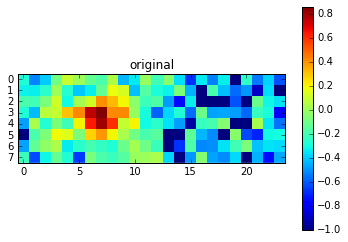

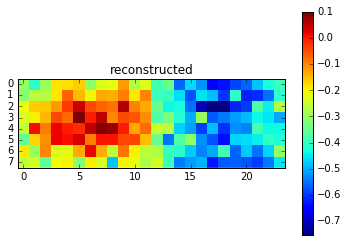

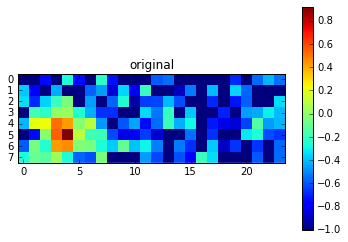

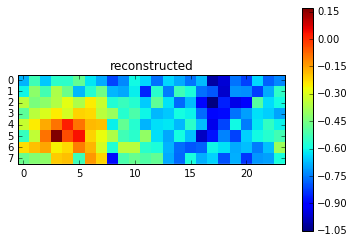

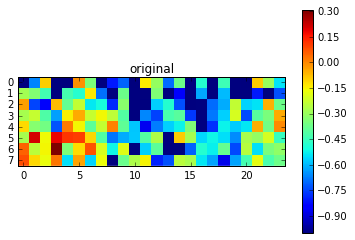

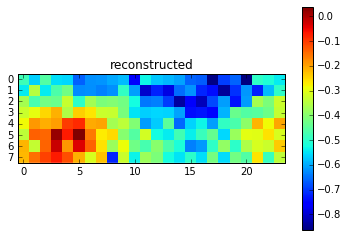

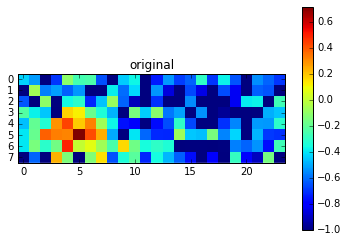

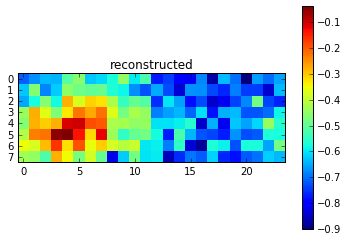

Epoch 552 of 1000 took 0.291s
	training los:		0.0510
	training acc:		5.1326 %
  validation loss:		0.082703
  validation accuracy:		8.27 %
Epoch 553 of 1000 took 0.266s
	training los:		0.0511
	training acc:		5.0991 %
  validation loss:		0.082358
  validation accuracy:		8.24 %
Epoch 554 of 1000 took 0.225s
	training los:		0.0512
	training acc:		5.1014 %
  validation loss:		0.081872
  validation accuracy:		8.19 %
Epoch 555 of 1000 took 0.224s
	training los:		0.0510
	training acc:		5.0975 %
  validation loss:		0.082069
  validation accuracy:		8.21 %
Epoch 556 of 1000 took 0.224s
	training los:		0.0509
	training acc:		5.0764 %
  validation loss:		0.082289
  validation accuracy:		8.23 %
Epoch 557 of 1000 took 0.224s
	training los:		0.0509
	training acc:		5.0780 %
  validation loss:		0.081441
  validation accuracy:		8.14 %
Epoch 558 of 1000 took 0.224s
	training los:		0.0508
	training acc:		5.0936 %
  validation loss:		0.082602
  validation accuracy:		8.26 %
Epoch 559 of 1000 took 0.225s
	tra

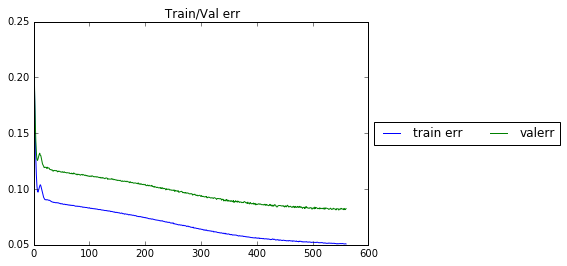

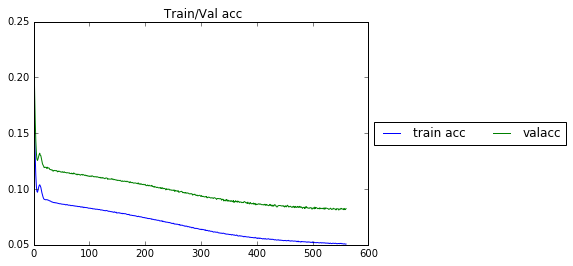

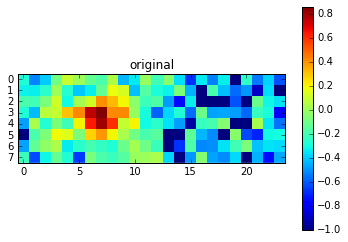

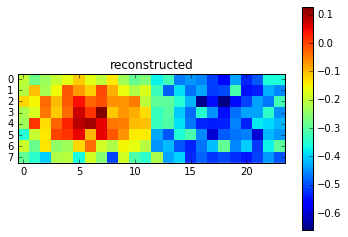

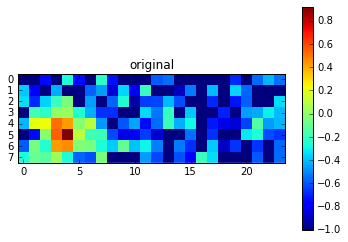

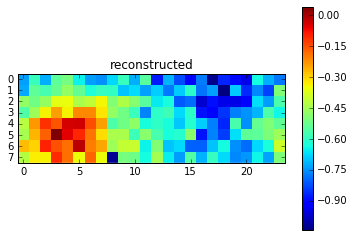

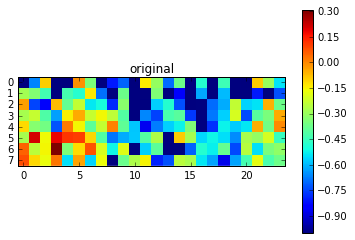

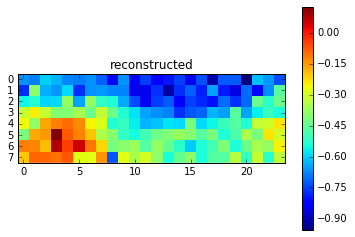

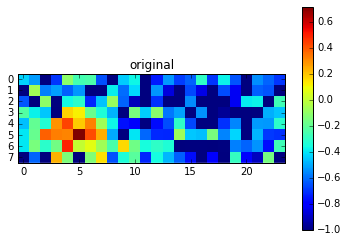

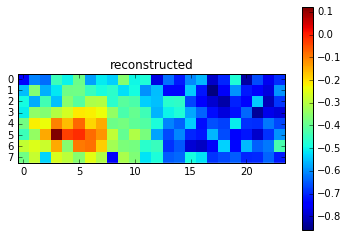

Epoch 562 of 1000 took 0.245s
	training los:		0.0507
	training acc:		5.0873 %
  validation loss:		0.082571
  validation accuracy:		8.26 %
Epoch 563 of 1000 took 0.222s
	training los:		0.0505
	training acc:		5.0400 %
  validation loss:		0.081899
  validation accuracy:		8.19 %
Epoch 564 of 1000 took 0.223s
	training los:		0.0507
	training acc:		5.0432 %
  validation loss:		0.081541
  validation accuracy:		8.15 %
Epoch 565 of 1000 took 0.222s
	training los:		0.0504
	training acc:		5.0916 %
  validation loss:		0.082032
  validation accuracy:		8.20 %
Epoch 566 of 1000 took 0.222s
	training los:		0.0510
	training acc:		5.0703 %
  validation loss:		0.081627
  validation accuracy:		8.16 %
Epoch 567 of 1000 took 0.222s
	training los:		0.0505
	training acc:		5.0662 %
  validation loss:		0.082932
  validation accuracy:		8.29 %
Epoch 568 of 1000 took 0.223s
	training los:		0.0508
	training acc:		5.0381 %
  validation loss:		0.081143
  validation accuracy:		8.11 %
Epoch 569 of 1000 took 0.224s
	tra

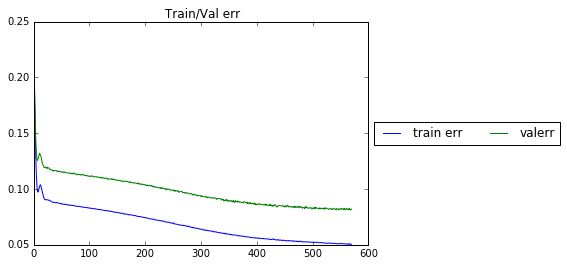

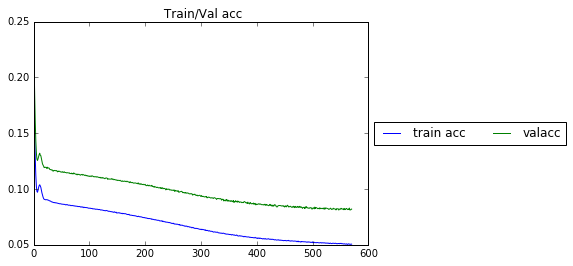

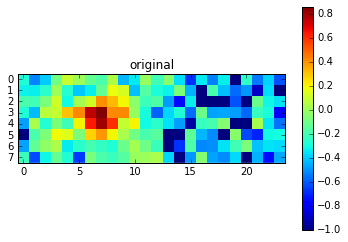

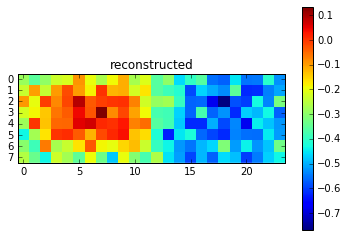

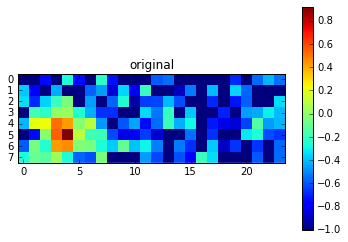

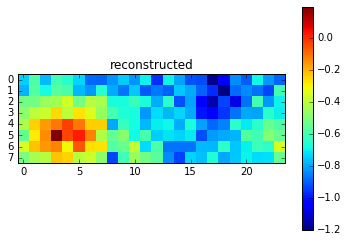

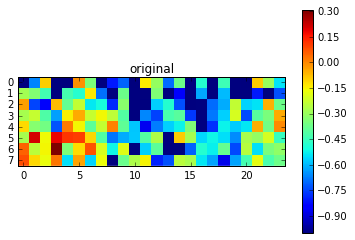

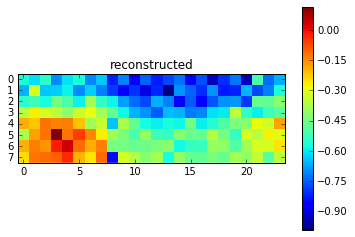

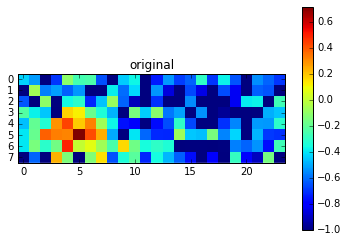

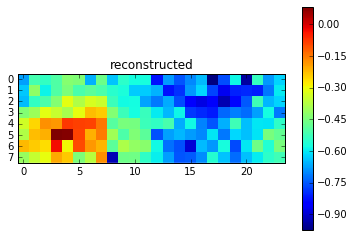

Epoch 572 of 1000 took 0.260s
	training los:		0.0505
	training acc:		5.0370 %
  validation loss:		0.081592
  validation accuracy:		8.16 %
Epoch 573 of 1000 took 0.239s
	training los:		0.0504
	training acc:		5.0386 %
  validation loss:		0.081186
  validation accuracy:		8.12 %
Epoch 574 of 1000 took 0.223s
	training los:		0.0505
	training acc:		5.0449 %
  validation loss:		0.081844
  validation accuracy:		8.18 %
Epoch 575 of 1000 took 0.259s
	training los:		0.0504
	training acc:		5.0535 %
  validation loss:		0.081863
  validation accuracy:		8.19 %
Epoch 576 of 1000 took 0.222s
	training los:		0.0506
	training acc:		5.0276 %
  validation loss:		0.082109
  validation accuracy:		8.21 %
Epoch 577 of 1000 took 0.222s
	training los:		0.0504
	training acc:		5.0635 %
  validation loss:		0.081502
  validation accuracy:		8.15 %
Epoch 578 of 1000 took 0.222s
	training los:		0.0502
	training acc:		5.0165 %
  validation loss:		0.081546
  validation accuracy:		8.15 %
Epoch 579 of 1000 took 0.227s
	tra

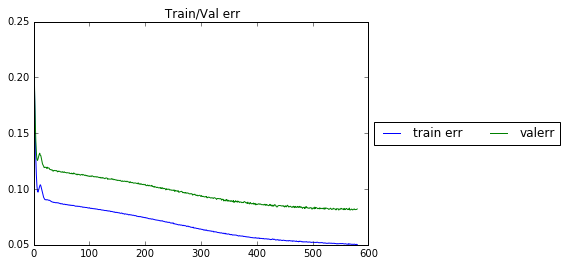

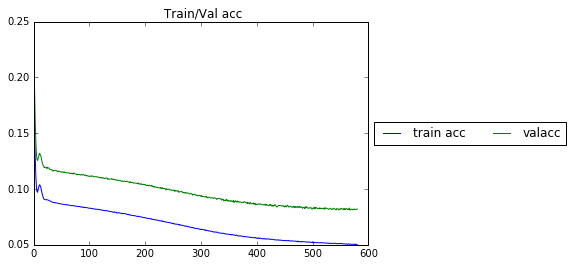

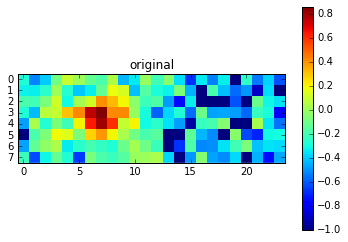

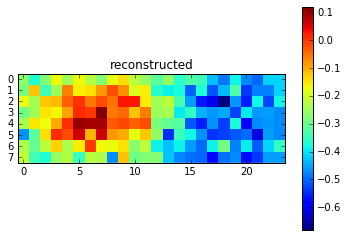

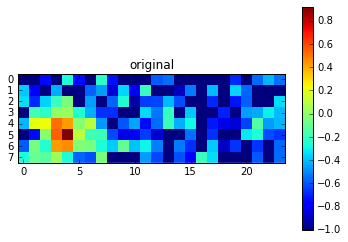

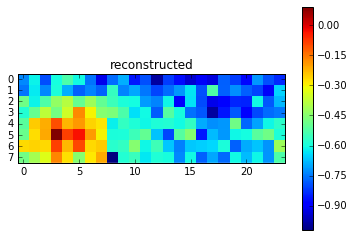

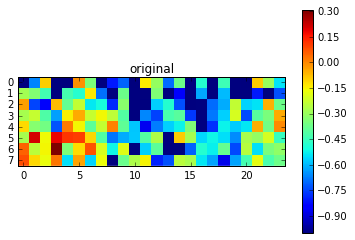

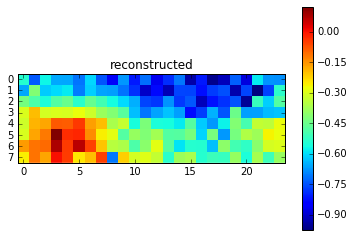

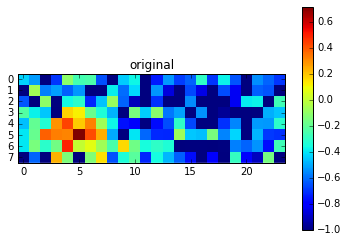

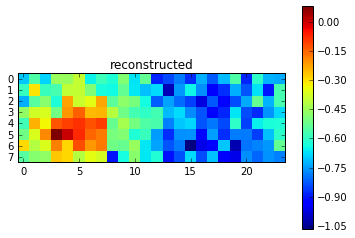

Epoch 582 of 1000 took 0.268s
	training los:		0.0501
	training acc:		5.0361 %
  validation loss:		0.081710
  validation accuracy:		8.17 %
Epoch 583 of 1000 took 0.250s
	training los:		0.0506
	training acc:		5.0346 %
  validation loss:		0.081161
  validation accuracy:		8.12 %
Epoch 584 of 1000 took 0.242s
	training los:		0.0501
	training acc:		5.0376 %
  validation loss:		0.081610
  validation accuracy:		8.16 %
Epoch 585 of 1000 took 0.224s
	training los:		0.0505
	training acc:		5.0234 %
  validation loss:		0.081258
  validation accuracy:		8.13 %
Epoch 586 of 1000 took 0.223s
	training los:		0.0503
	training acc:		5.0020 %
  validation loss:		0.081887
  validation accuracy:		8.19 %
Epoch 587 of 1000 took 0.224s
	training los:		0.0501
	training acc:		4.9806 %
  validation loss:		0.081105
  validation accuracy:		8.11 %
Epoch 588 of 1000 took 0.224s
	training los:		0.0502
	training acc:		5.0113 %
  validation loss:		0.081222
  validation accuracy:		8.12 %
Epoch 589 of 1000 took 0.224s
	tra

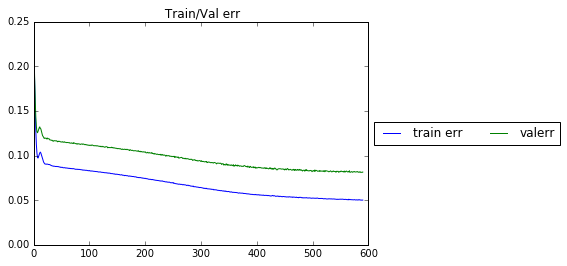

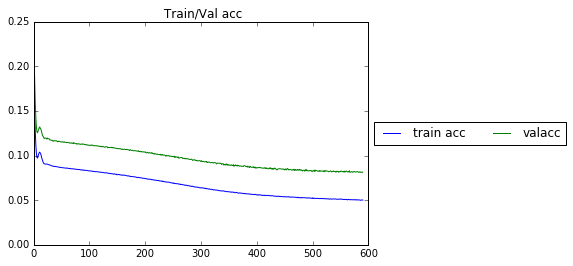

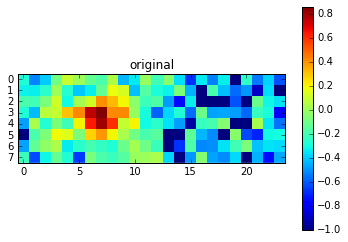

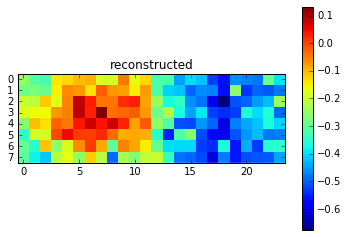

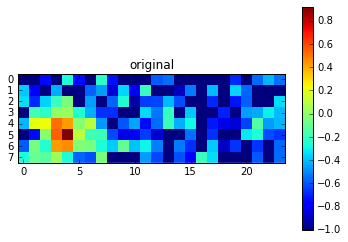

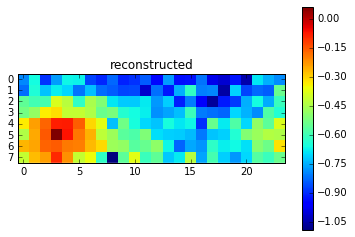

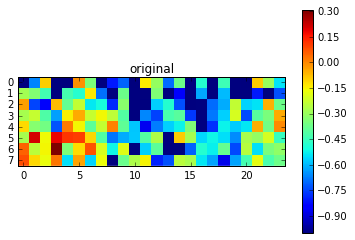

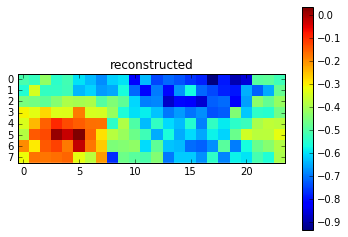

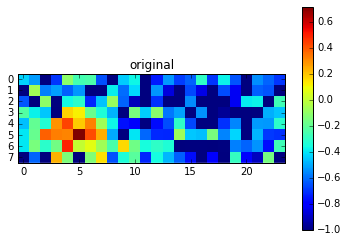

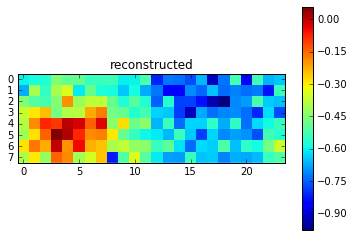

Epoch 592 of 1000 took 0.255s
	training los:		0.0501
	training acc:		5.0020 %
  validation loss:		0.081585
  validation accuracy:		8.16 %
Epoch 593 of 1000 took 0.248s
	training los:		0.0503
	training acc:		5.0224 %
  validation loss:		0.081259
  validation accuracy:		8.13 %
Epoch 594 of 1000 took 0.219s
	training los:		0.0502
	training acc:		4.9904 %
  validation loss:		0.082128
  validation accuracy:		8.21 %
Epoch 595 of 1000 took 0.220s
	training los:		0.0499
	training acc:		4.9934 %
  validation loss:		0.081951
  validation accuracy:		8.20 %
Epoch 596 of 1000 took 0.220s
	training los:		0.0502
	training acc:		4.9806 %
  validation loss:		0.080887
  validation accuracy:		8.09 %
Epoch 597 of 1000 took 0.220s
	training los:		0.0500
	training acc:		4.9784 %
  validation loss:		0.080934
  validation accuracy:		8.09 %
Epoch 598 of 1000 took 0.220s
	training los:		0.0503
	training acc:		4.9868 %
  validation loss:		0.081010
  validation accuracy:		8.10 %
Epoch 599 of 1000 took 0.219s
	tra

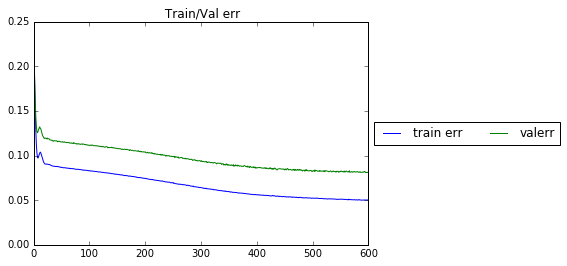

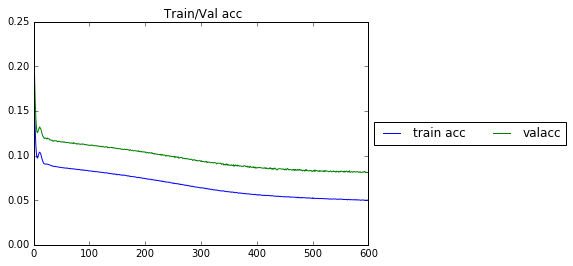

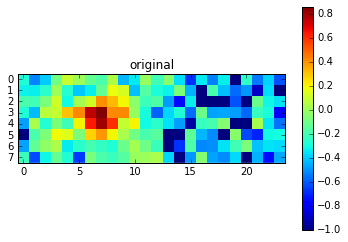

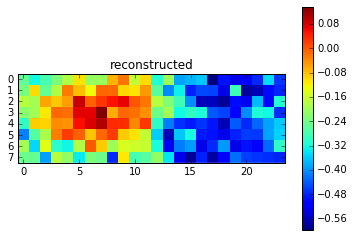

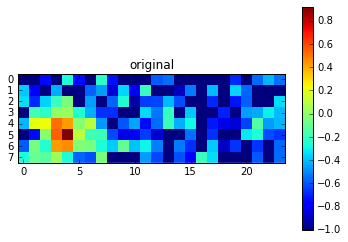

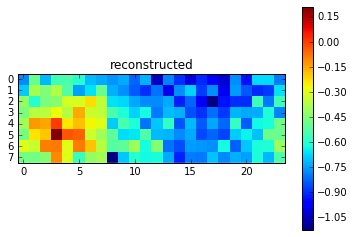

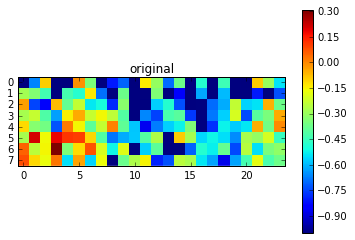

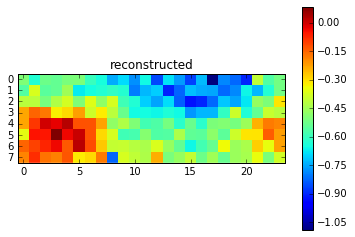

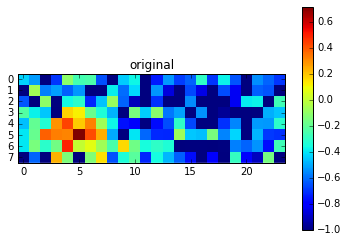

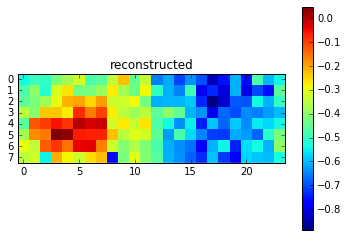

Epoch 602 of 1000 took 0.302s
	training los:		0.0500
	training acc:		4.9835 %
  validation loss:		0.081755
  validation accuracy:		8.18 %
Epoch 603 of 1000 took 0.325s
	training los:		0.0498
	training acc:		5.0121 %
  validation loss:		0.081797
  validation accuracy:		8.18 %
Epoch 604 of 1000 took 0.217s
	training los:		0.0497
	training acc:		4.9762 %
  validation loss:		0.080880
  validation accuracy:		8.09 %
Epoch 605 of 1000 took 0.217s
	training los:		0.0496
	training acc:		4.9812 %
  validation loss:		0.080822
  validation accuracy:		8.08 %
Epoch 606 of 1000 took 0.217s
	training los:		0.0500
	training acc:		4.9626 %
  validation loss:		0.081628
  validation accuracy:		8.16 %
Epoch 607 of 1000 took 0.217s
	training los:		0.0494
	training acc:		4.9891 %
  validation loss:		0.080366
  validation accuracy:		8.04 %
Epoch 608 of 1000 took 0.217s
	training los:		0.0498
	training acc:		4.9451 %
  validation loss:		0.080809
  validation accuracy:		8.08 %
Epoch 609 of 1000 took 0.217s
	tra

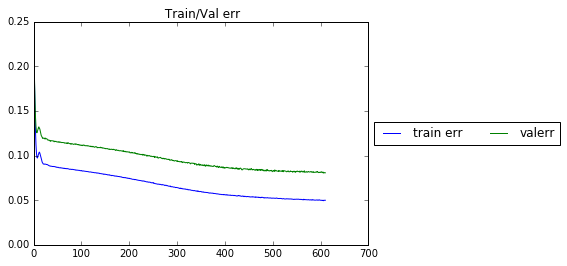

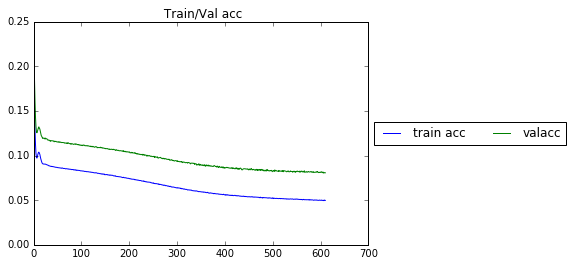

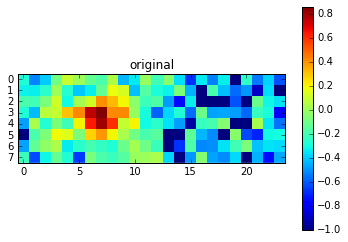

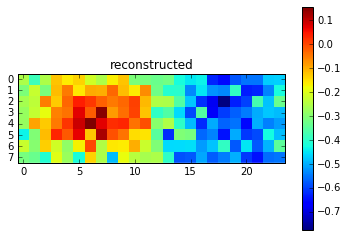

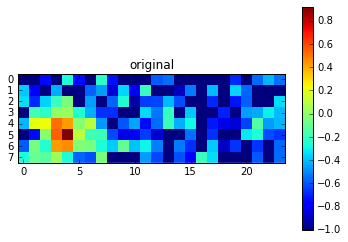

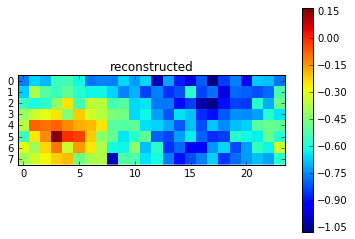

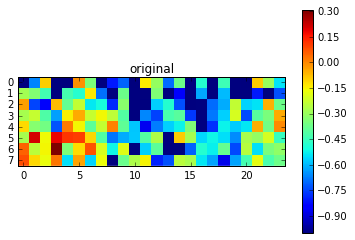

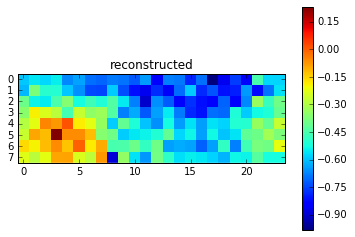

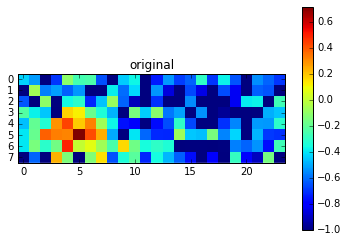

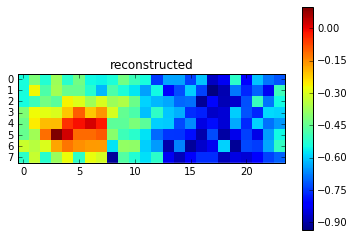

Epoch 612 of 1000 took 0.301s
	training los:		0.0498
	training acc:		4.9783 %
  validation loss:		0.080274
  validation accuracy:		8.03 %
Epoch 613 of 1000 took 0.452s
	training los:		0.0498
	training acc:		4.9671 %
  validation loss:		0.080882
  validation accuracy:		8.09 %
Epoch 614 of 1000 took 0.230s
	training los:		0.0496
	training acc:		4.9672 %
  validation loss:		0.081016
  validation accuracy:		8.10 %
Epoch 615 of 1000 took 0.230s
	training los:		0.0496
	training acc:		4.9472 %
  validation loss:		0.080975
  validation accuracy:		8.10 %
Epoch 616 of 1000 took 0.230s
	training los:		0.0496
	training acc:		4.9711 %
  validation loss:		0.080614
  validation accuracy:		8.06 %
Epoch 617 of 1000 took 0.230s
	training los:		0.0496
	training acc:		4.9695 %
  validation loss:		0.081078
  validation accuracy:		8.11 %
Epoch 618 of 1000 took 0.231s
	training los:		0.0496
	training acc:		4.9630 %
  validation loss:		0.080109
  validation accuracy:		8.01 %
Epoch 619 of 1000 took 0.230s
	tra

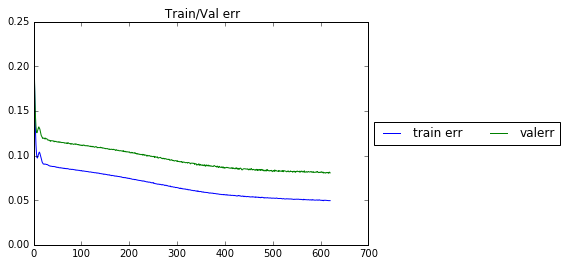

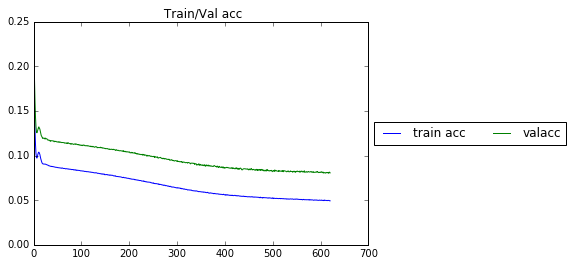

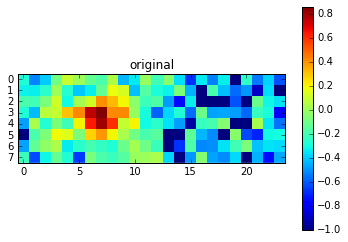

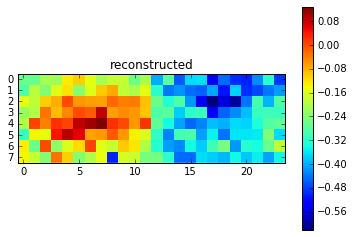

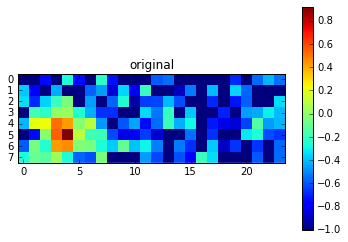

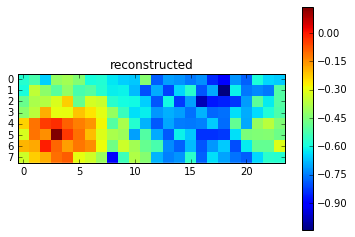

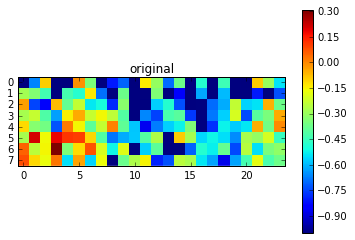

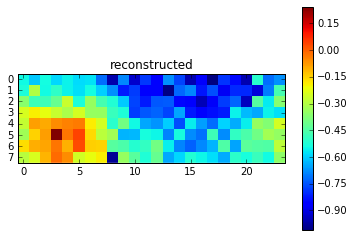

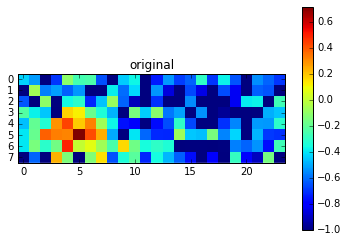

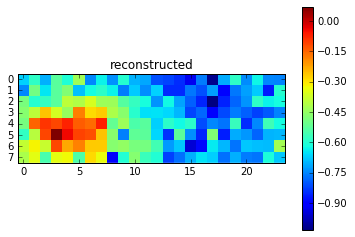

Epoch 622 of 1000 took 0.300s
	training los:		0.0493
	training acc:		4.9270 %
  validation loss:		0.080574
  validation accuracy:		8.06 %
Epoch 623 of 1000 took 0.219s
	training los:		0.0495
	training acc:		4.9668 %
  validation loss:		0.080223
  validation accuracy:		8.02 %
Epoch 624 of 1000 took 0.219s
	training los:		0.0496
	training acc:		4.9348 %
  validation loss:		0.080260
  validation accuracy:		8.03 %
Epoch 625 of 1000 took 0.219s
	training los:		0.0492
	training acc:		4.9296 %
  validation loss:		0.080626
  validation accuracy:		8.06 %
Epoch 626 of 1000 took 0.219s
	training los:		0.0493
	training acc:		4.9520 %
  validation loss:		0.080401
  validation accuracy:		8.04 %
Epoch 627 of 1000 took 0.219s
	training los:		0.0491
	training acc:		4.9415 %
  validation loss:		0.081704
  validation accuracy:		8.17 %
Epoch 628 of 1000 took 0.219s
	training los:		0.0494
	training acc:		4.9353 %
  validation loss:		0.080751
  validation accuracy:		8.08 %
Epoch 629 of 1000 took 0.219s
	tra

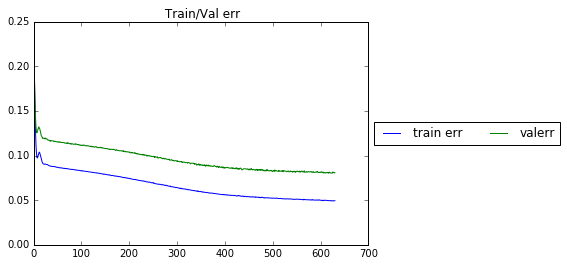

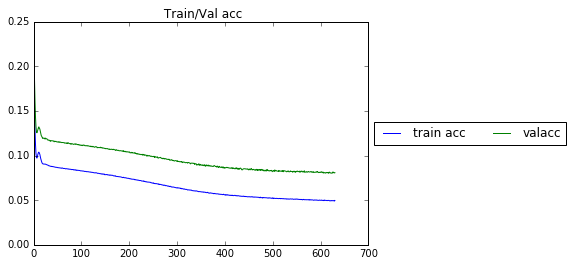

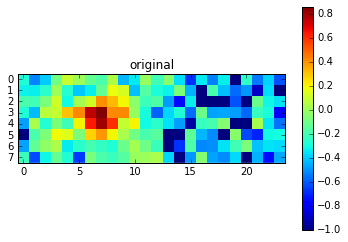

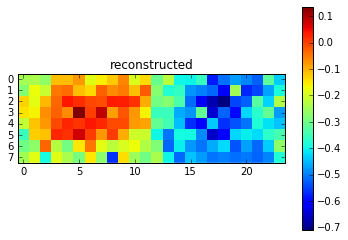

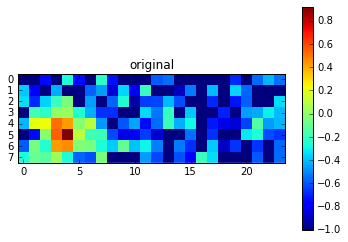

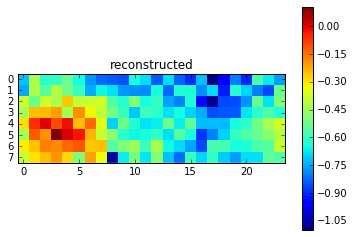

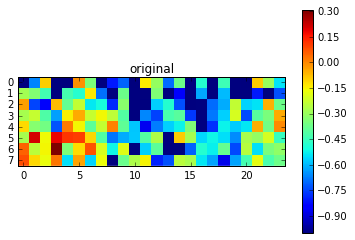

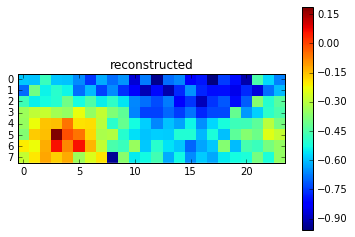

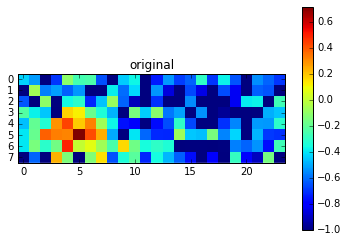

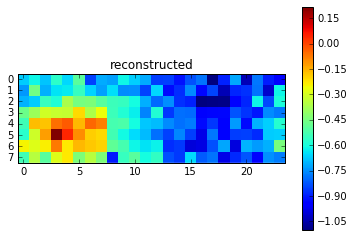

Epoch 632 of 1000 took 0.308s
	training los:		0.0492
	training acc:		4.9326 %
  validation loss:		0.080733
  validation accuracy:		8.07 %
Epoch 633 of 1000 took 0.243s
	training los:		0.0492
	training acc:		4.9425 %
  validation loss:		0.081270
  validation accuracy:		8.13 %
Epoch 634 of 1000 took 0.220s
	training los:		0.0494
	training acc:		4.9333 %
  validation loss:		0.081425
  validation accuracy:		8.14 %
Epoch 635 of 1000 took 0.219s
	training los:		0.0492
	training acc:		4.8978 %
  validation loss:		0.081053
  validation accuracy:		8.11 %
Epoch 636 of 1000 took 0.219s
	training los:		0.0493
	training acc:		4.9275 %
  validation loss:		0.080328
  validation accuracy:		8.03 %
Epoch 637 of 1000 took 0.219s
	training los:		0.0495
	training acc:		4.9246 %
  validation loss:		0.080842
  validation accuracy:		8.08 %
Epoch 638 of 1000 took 0.219s
	training los:		0.0493
	training acc:		4.9076 %
  validation loss:		0.080403
  validation accuracy:		8.04 %
Epoch 639 of 1000 took 0.219s
	tra

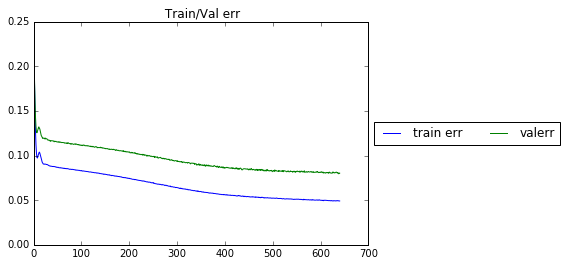

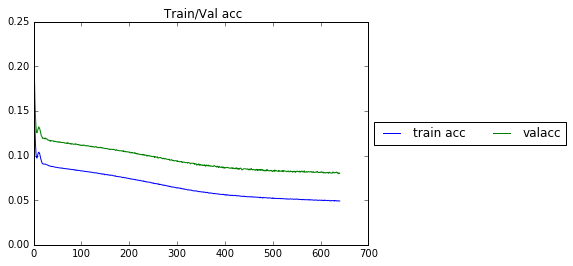

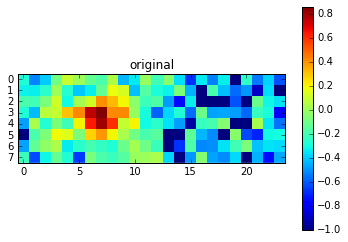

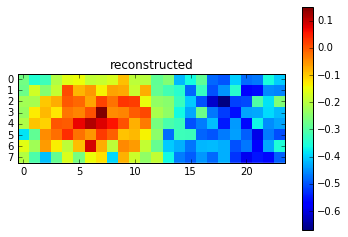

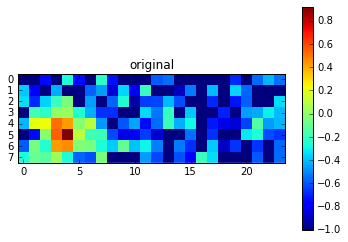

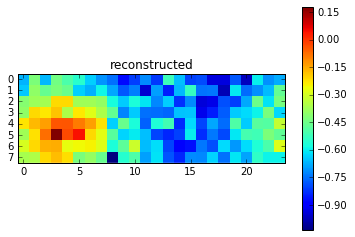

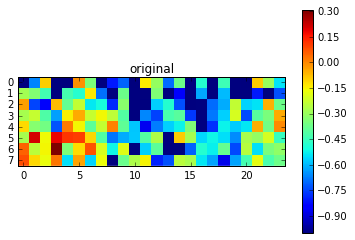

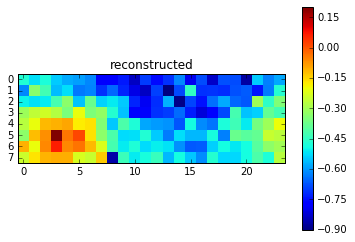

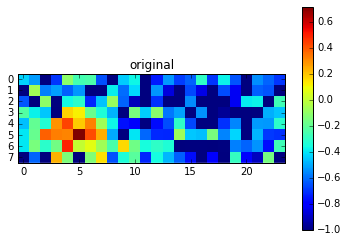

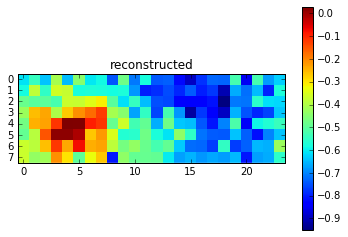

Epoch 642 of 1000 took 0.283s
	training los:		0.0490
	training acc:		4.8905 %
  validation loss:		0.080149
  validation accuracy:		8.01 %
Epoch 643 of 1000 took 0.229s
	training los:		0.0494
	training acc:		4.8983 %
  validation loss:		0.080165
  validation accuracy:		8.02 %
Epoch 644 of 1000 took 0.222s
	training los:		0.0490
	training acc:		4.8946 %
  validation loss:		0.079986
  validation accuracy:		8.00 %
Epoch 645 of 1000 took 0.222s
	training los:		0.0488
	training acc:		4.9036 %
  validation loss:		0.080615
  validation accuracy:		8.06 %
Epoch 646 of 1000 took 0.226s
	training los:		0.0490
	training acc:		4.8784 %
  validation loss:		0.081417
  validation accuracy:		8.14 %
Epoch 647 of 1000 took 0.221s
	training los:		0.0488
	training acc:		4.8995 %
  validation loss:		0.080702
  validation accuracy:		8.07 %
Epoch 648 of 1000 took 0.220s
	training los:		0.0492
	training acc:		4.9144 %
  validation loss:		0.080686
  validation accuracy:		8.07 %
Epoch 649 of 1000 took 0.221s
	tra

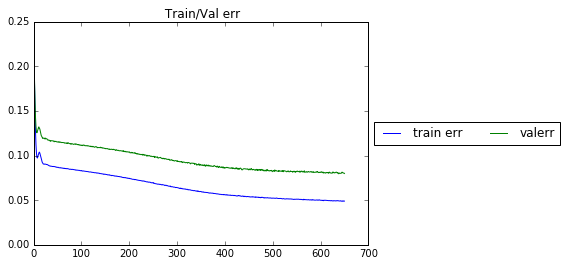

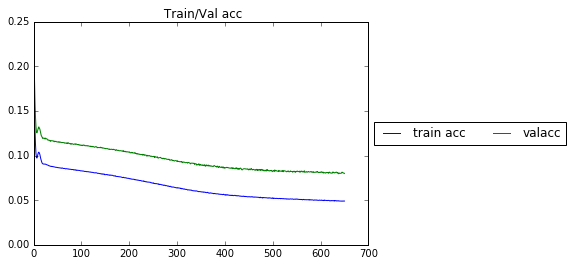

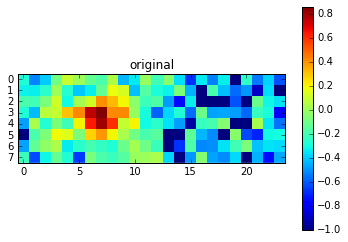

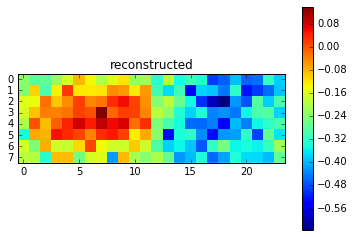

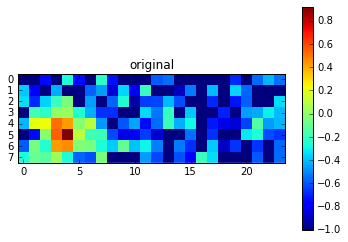

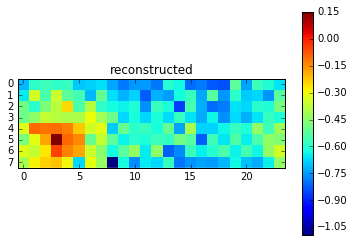

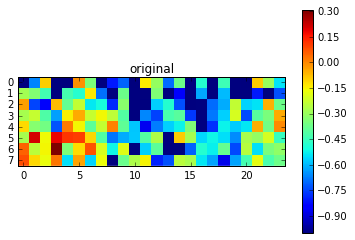

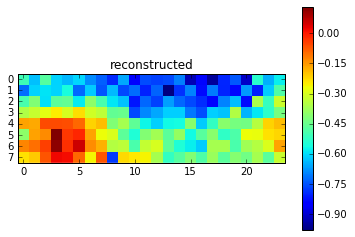

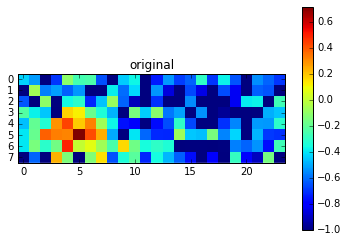

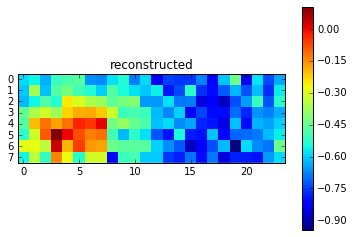

Epoch 652 of 1000 took 0.249s
	training los:		0.0493
	training acc:		4.9132 %
  validation loss:		0.080369
  validation accuracy:		8.04 %
Epoch 653 of 1000 took 0.248s
	training los:		0.0490
	training acc:		4.9155 %
  validation loss:		0.081054
  validation accuracy:		8.11 %
Epoch 654 of 1000 took 0.226s
	training los:		0.0490
	training acc:		4.8869 %
  validation loss:		0.080166
  validation accuracy:		8.02 %
Epoch 655 of 1000 took 0.220s
	training los:		0.0491
	training acc:		4.8825 %
  validation loss:		0.080305
  validation accuracy:		8.03 %
Epoch 656 of 1000 took 0.220s
	training los:		0.0489
	training acc:		4.8780 %
  validation loss:		0.080395
  validation accuracy:		8.04 %
Epoch 657 of 1000 took 0.220s
	training los:		0.0487
	training acc:		4.8992 %
  validation loss:		0.080719
  validation accuracy:		8.07 %
Epoch 658 of 1000 took 0.220s
	training los:		0.0487
	training acc:		4.8624 %
  validation loss:		0.080293
  validation accuracy:		8.03 %
Epoch 659 of 1000 took 0.221s
	tra

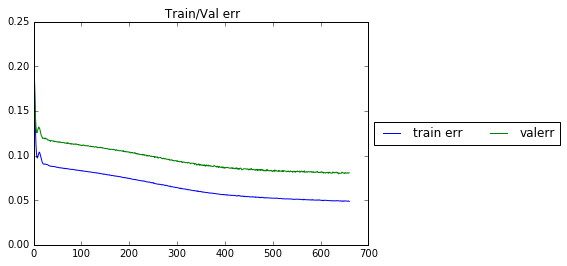

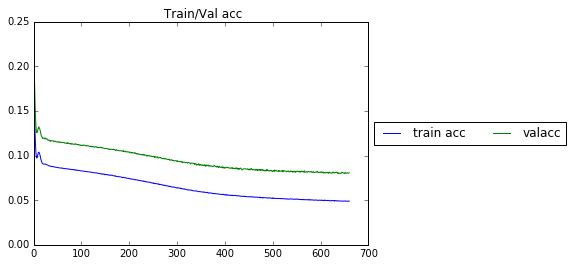

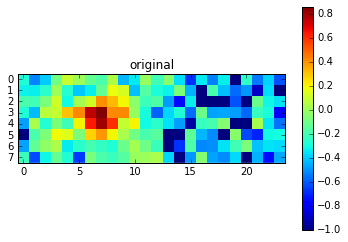

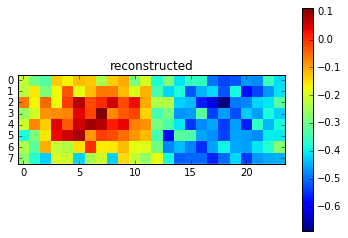

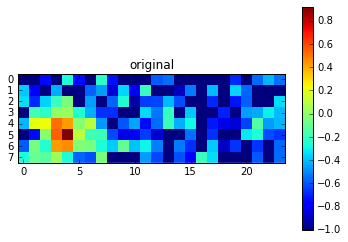

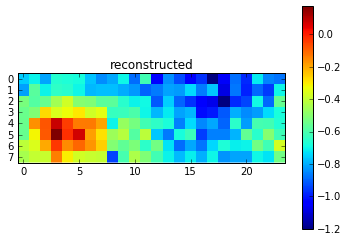

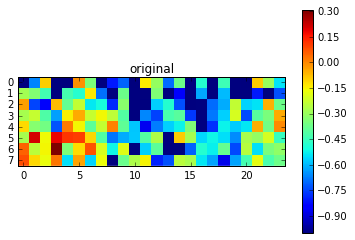

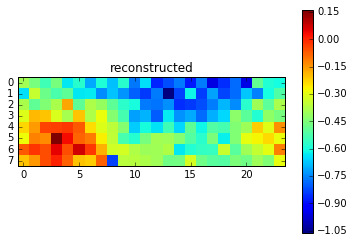

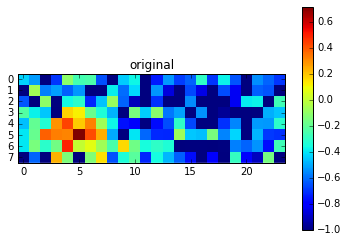

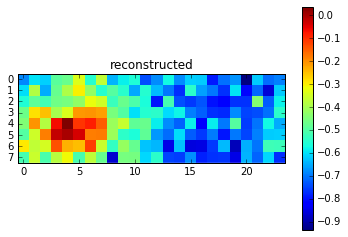

Epoch 662 of 1000 took 0.262s
	training los:		0.0486
	training acc:		4.8969 %
  validation loss:		0.079937
  validation accuracy:		7.99 %
Epoch 663 of 1000 took 0.242s
	training los:		0.0491
	training acc:		4.9123 %
  validation loss:		0.080605
  validation accuracy:		8.06 %
Epoch 664 of 1000 took 0.235s
	training los:		0.0486
	training acc:		4.8834 %
  validation loss:		0.080221
  validation accuracy:		8.02 %
Epoch 665 of 1000 took 0.220s
	training los:		0.0487
	training acc:		4.8763 %
  validation loss:		0.079137
  validation accuracy:		7.91 %
Epoch 666 of 1000 took 0.219s
	training los:		0.0486
	training acc:		4.8544 %
  validation loss:		0.080095
  validation accuracy:		8.01 %
Epoch 667 of 1000 took 0.220s
	training los:		0.0488
	training acc:		4.8646 %
  validation loss:		0.080203
  validation accuracy:		8.02 %
Epoch 668 of 1000 took 0.220s
	training los:		0.0486
	training acc:		4.8620 %
  validation loss:		0.079372
  validation accuracy:		7.94 %
Epoch 669 of 1000 took 0.220s
	tra

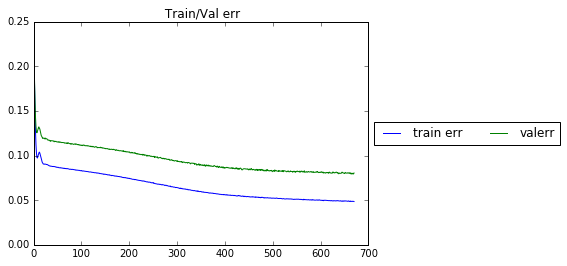

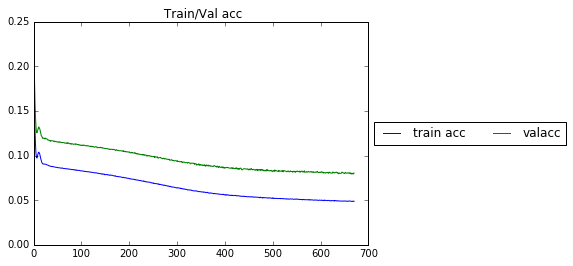

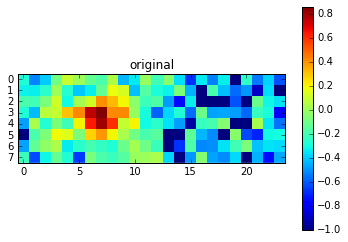

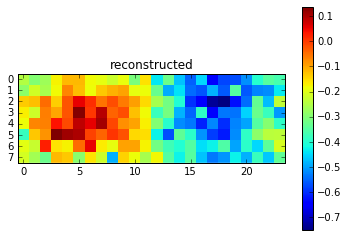

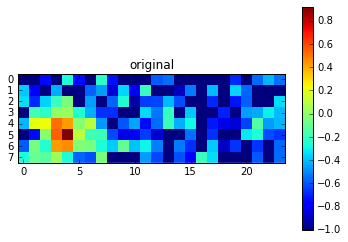

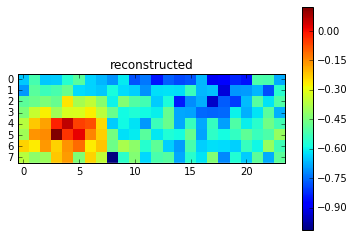

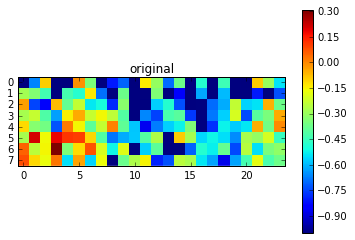

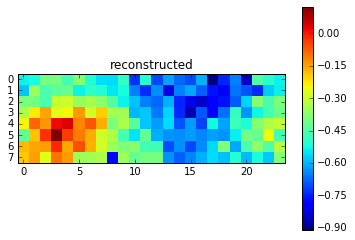

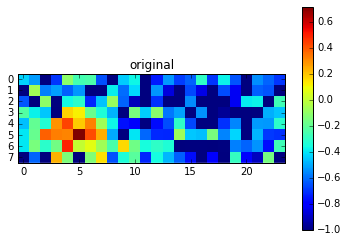

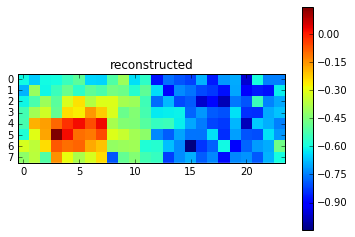

Epoch 672 of 1000 took 0.276s
	training los:		0.0485
	training acc:		4.8653 %
  validation loss:		0.079709
  validation accuracy:		7.97 %
Epoch 673 of 1000 took 0.241s
	training los:		0.0484
	training acc:		4.8590 %
  validation loss:		0.079808
  validation accuracy:		7.98 %
Epoch 674 of 1000 took 0.223s
	training los:		0.0486
	training acc:		4.8409 %
  validation loss:		0.080421
  validation accuracy:		8.04 %
Epoch 675 of 1000 took 0.223s
	training los:		0.0482
	training acc:		4.8598 %
  validation loss:		0.080145
  validation accuracy:		8.01 %
Epoch 676 of 1000 took 0.223s
	training los:		0.0485
	training acc:		4.8538 %
  validation loss:		0.079881
  validation accuracy:		7.99 %
Epoch 677 of 1000 took 0.231s
	training los:		0.0487
	training acc:		4.8640 %
  validation loss:		0.079592
  validation accuracy:		7.96 %
Epoch 678 of 1000 took 0.223s
	training los:		0.0485
	training acc:		4.8715 %
  validation loss:		0.080068
  validation accuracy:		8.01 %
Epoch 679 of 1000 took 0.224s
	tra

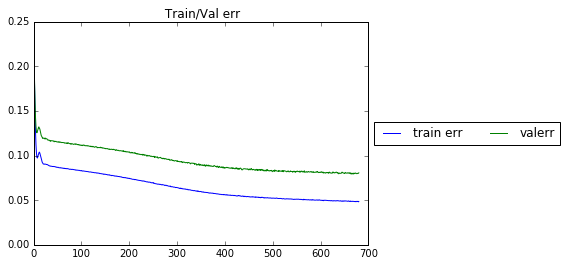

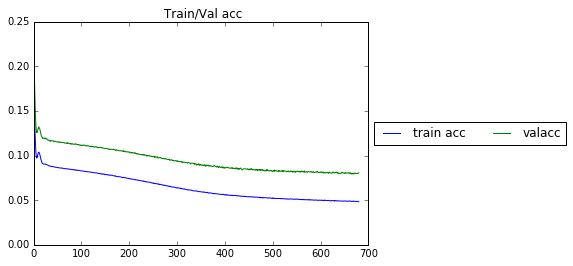

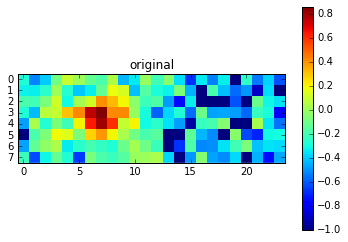

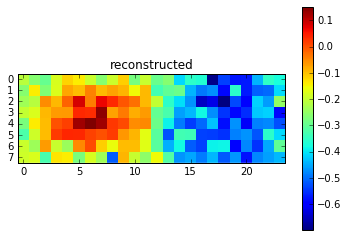

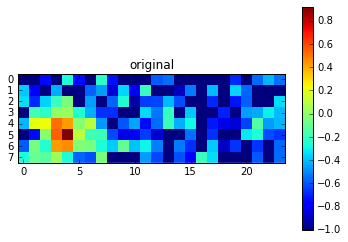

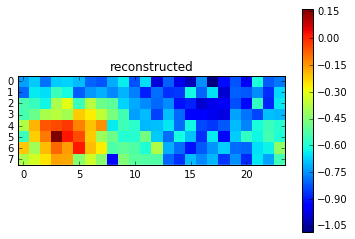

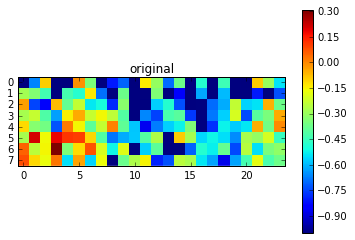

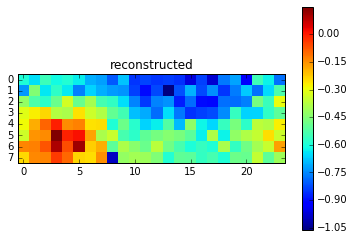

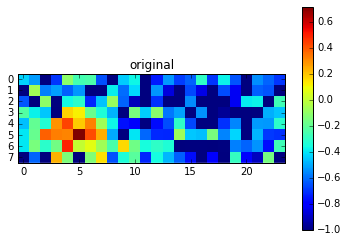

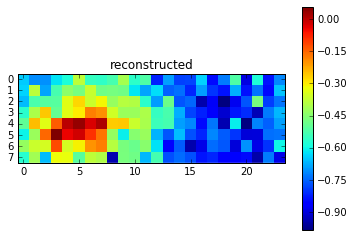

Epoch 682 of 1000 took 0.509s
	training los:		0.0481
	training acc:		4.8661 %
  validation loss:		0.079235
  validation accuracy:		7.92 %
Epoch 683 of 1000 took 0.221s
	training los:		0.0484
	training acc:		4.8456 %
  validation loss:		0.079389
  validation accuracy:		7.94 %
Epoch 684 of 1000 took 0.220s
	training los:		0.0484
	training acc:		4.8339 %
  validation loss:		0.079349
  validation accuracy:		7.93 %
Epoch 685 of 1000 took 0.220s
	training los:		0.0487
	training acc:		4.8571 %
  validation loss:		0.079710
  validation accuracy:		7.97 %
Epoch 686 of 1000 took 0.221s
	training los:		0.0485
	training acc:		4.8245 %
  validation loss:		0.080078
  validation accuracy:		8.01 %
Epoch 687 of 1000 took 0.247s
	training los:		0.0486
	training acc:		4.8070 %
  validation loss:		0.079289
  validation accuracy:		7.93 %
Epoch 688 of 1000 took 0.219s
	training los:		0.0482
	training acc:		4.8497 %
  validation loss:		0.080111
  validation accuracy:		8.01 %
Epoch 689 of 1000 took 0.220s
	tra

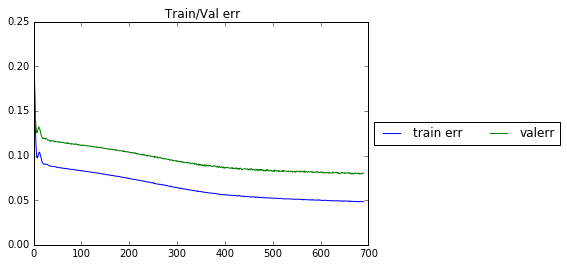

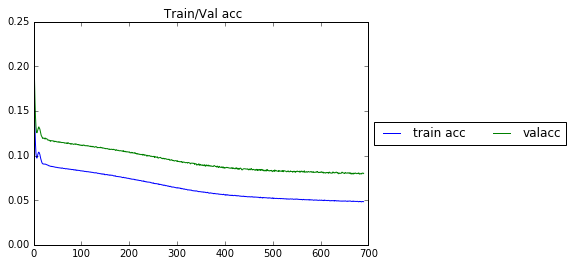

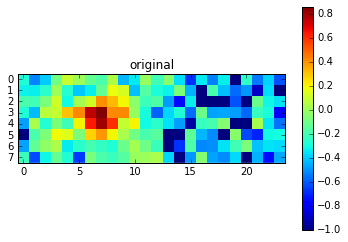

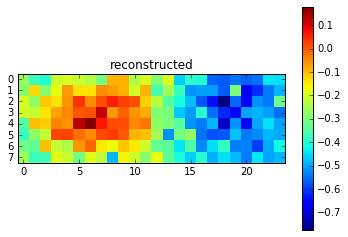

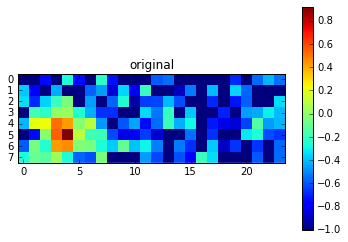

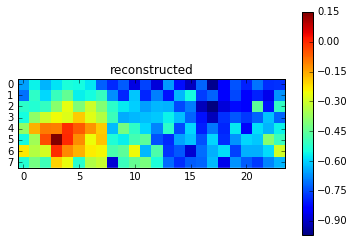

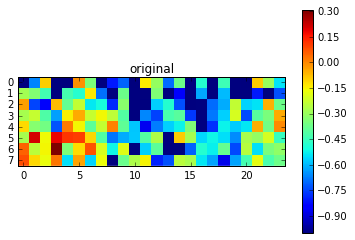

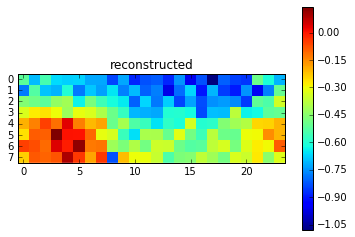

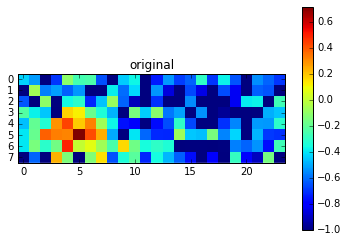

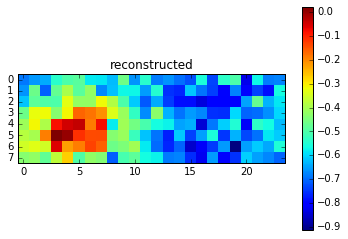

Epoch 692 of 1000 took 0.299s
	training los:		0.0482
	training acc:		4.8340 %
  validation loss:		0.079572
  validation accuracy:		7.96 %
Epoch 693 of 1000 took 0.308s
	training los:		0.0483
	training acc:		4.8426 %
  validation loss:		0.079949
  validation accuracy:		7.99 %
Epoch 694 of 1000 took 0.252s
	training los:		0.0484
	training acc:		4.8301 %
  validation loss:		0.079844
  validation accuracy:		7.98 %
Epoch 695 of 1000 took 0.225s
	training los:		0.0483
	training acc:		4.8178 %
  validation loss:		0.079720
  validation accuracy:		7.97 %
Epoch 696 of 1000 took 0.229s
	training los:		0.0487
	training acc:		4.8203 %
  validation loss:		0.079526
  validation accuracy:		7.95 %
Epoch 697 of 1000 took 0.225s
	training los:		0.0486
	training acc:		4.8369 %
  validation loss:		0.079682
  validation accuracy:		7.97 %
Epoch 698 of 1000 took 0.224s
	training los:		0.0479
	training acc:		4.8221 %
  validation loss:		0.080258
  validation accuracy:		8.03 %
Epoch 699 of 1000 took 0.224s
	tra

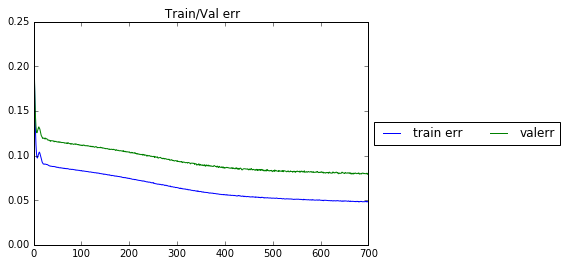

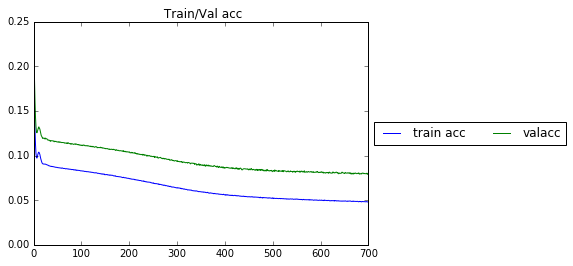

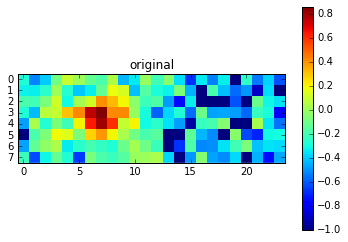

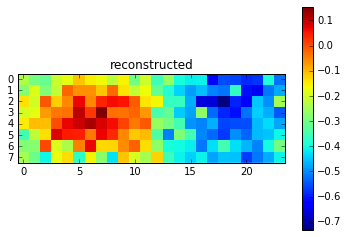

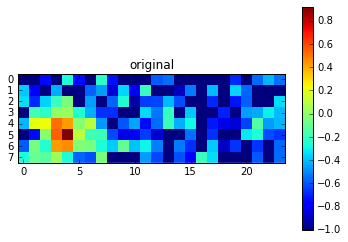

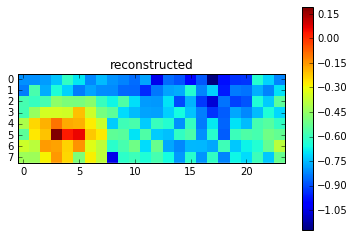

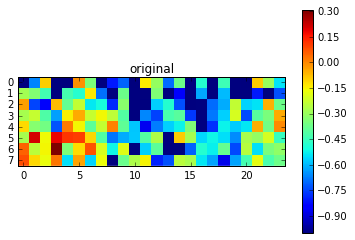

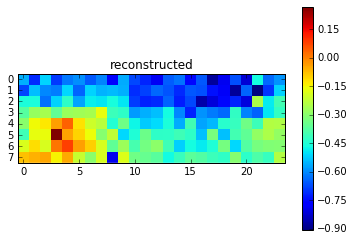

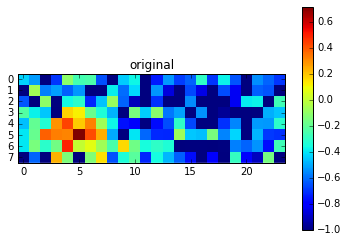

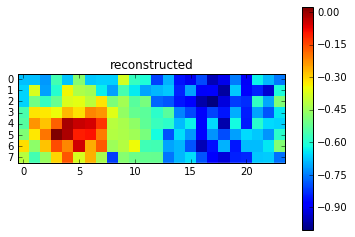

Epoch 702 of 1000 took 0.273s
	training los:		0.0481
	training acc:		4.8032 %
  validation loss:		0.079775
  validation accuracy:		7.98 %
Epoch 703 of 1000 took 0.218s
	training los:		0.0478
	training acc:		4.7843 %
  validation loss:		0.080040
  validation accuracy:		8.00 %
Epoch 704 of 1000 took 0.217s
	training los:		0.0481
	training acc:		4.8018 %
  validation loss:		0.079575
  validation accuracy:		7.96 %
Epoch 705 of 1000 took 0.217s
	training los:		0.0483
	training acc:		4.8014 %
  validation loss:		0.079358
  validation accuracy:		7.94 %
Epoch 706 of 1000 took 0.217s
	training los:		0.0480
	training acc:		4.8146 %
  validation loss:		0.079540
  validation accuracy:		7.95 %
Epoch 707 of 1000 took 0.216s
	training los:		0.0479
	training acc:		4.8118 %
  validation loss:		0.079893
  validation accuracy:		7.99 %
Epoch 708 of 1000 took 0.217s
	training los:		0.0482
	training acc:		4.8160 %
  validation loss:		0.079995
  validation accuracy:		8.00 %
Epoch 709 of 1000 took 0.217s
	tra

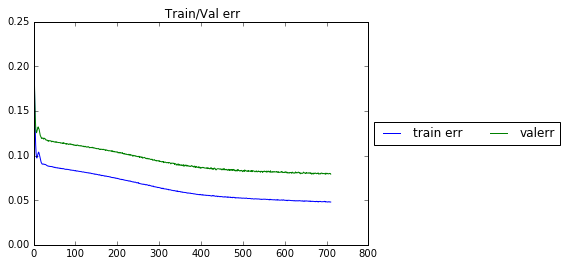

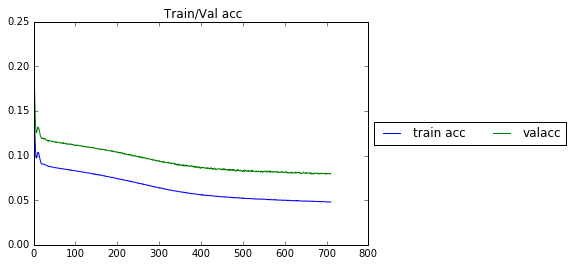

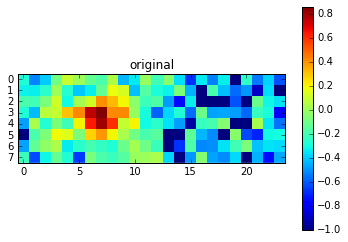

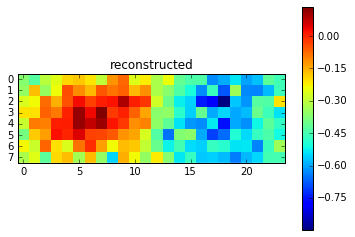

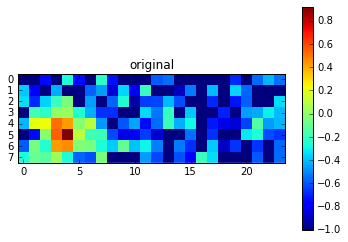

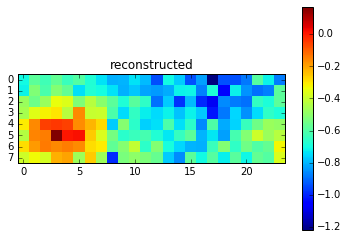

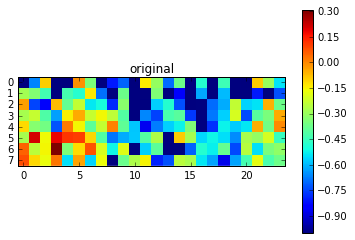

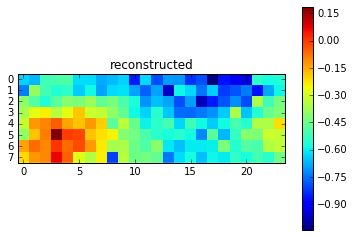

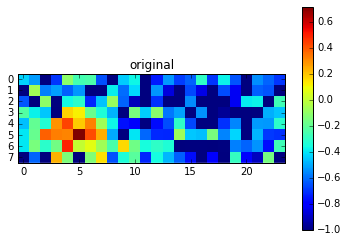

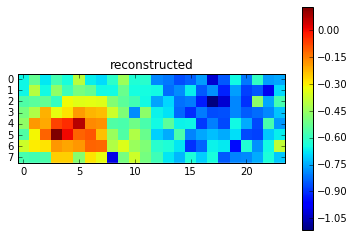

Epoch 712 of 1000 took 0.249s
	training los:		0.0479
	training acc:		4.7858 %
  validation loss:		0.079803
  validation accuracy:		7.98 %
Epoch 713 of 1000 took 0.222s
	training los:		0.0478
	training acc:		4.7939 %
  validation loss:		0.079564
  validation accuracy:		7.96 %
Epoch 714 of 1000 took 0.219s
	training los:		0.0478
	training acc:		4.7459 %
  validation loss:		0.079681
  validation accuracy:		7.97 %
Epoch 715 of 1000 took 0.219s
	training los:		0.0480
	training acc:		4.7871 %
  validation loss:		0.079387
  validation accuracy:		7.94 %
Epoch 716 of 1000 took 0.219s
	training los:		0.0480
	training acc:		4.7696 %
  validation loss:		0.079421
  validation accuracy:		7.94 %
Epoch 717 of 1000 took 0.219s
	training los:		0.0478
	training acc:		4.7847 %
  validation loss:		0.079611
  validation accuracy:		7.96 %
Epoch 718 of 1000 took 0.223s
	training los:		0.0480
	training acc:		4.7974 %
  validation loss:		0.079674
  validation accuracy:		7.97 %
Epoch 719 of 1000 took 0.219s
	tra

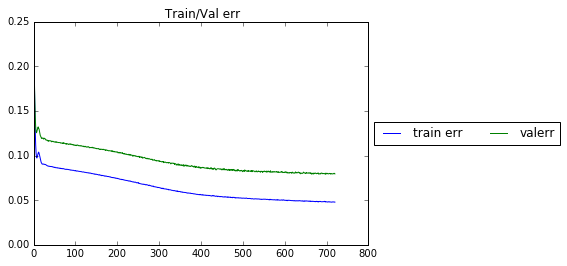

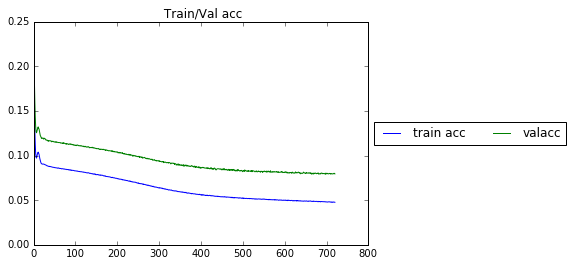

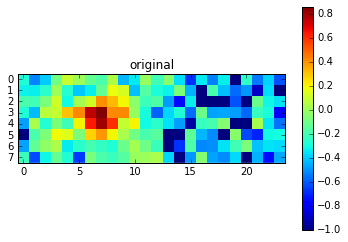

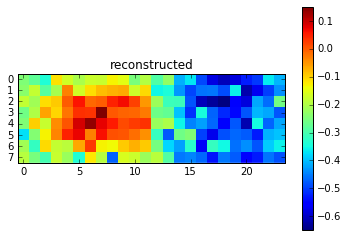

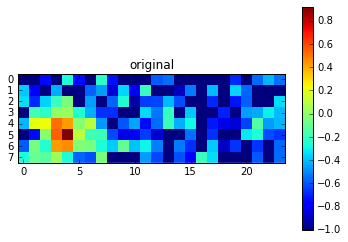

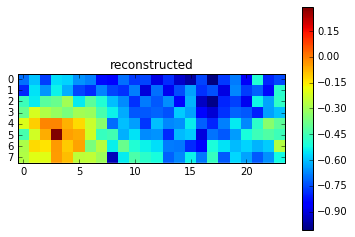

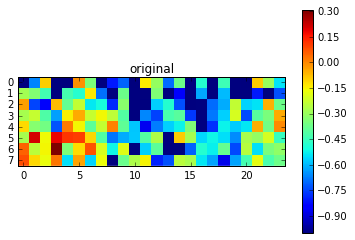

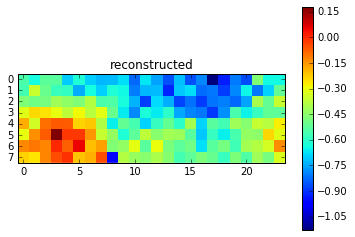

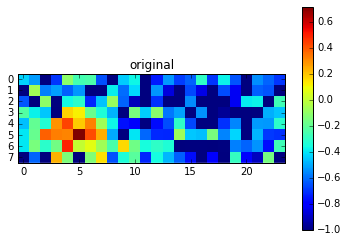

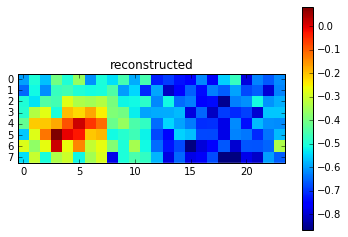

Epoch 722 of 1000 took 0.247s
	training los:		0.0477
	training acc:		4.8039 %
  validation loss:		0.079557
  validation accuracy:		7.96 %
Epoch 723 of 1000 took 0.232s
	training los:		0.0476
	training acc:		4.7898 %
  validation loss:		0.079350
  validation accuracy:		7.93 %
Epoch 724 of 1000 took 0.219s
	training los:		0.0477
	training acc:		4.7550 %
  validation loss:		0.080042
  validation accuracy:		8.00 %
Epoch 725 of 1000 took 0.219s
	training los:		0.0481
	training acc:		4.7713 %
  validation loss:		0.079513
  validation accuracy:		7.95 %
Epoch 726 of 1000 took 0.220s
	training los:		0.0479
	training acc:		4.7911 %
  validation loss:		0.079995
  validation accuracy:		8.00 %
Epoch 727 of 1000 took 0.220s
	training los:		0.0478
	training acc:		4.7862 %
  validation loss:		0.080021
  validation accuracy:		8.00 %
Epoch 728 of 1000 took 0.220s
	training los:		0.0478
	training acc:		4.7631 %
  validation loss:		0.079118
  validation accuracy:		7.91 %
Epoch 729 of 1000 took 0.220s
	tra

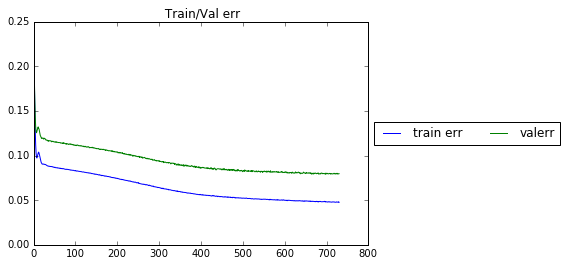

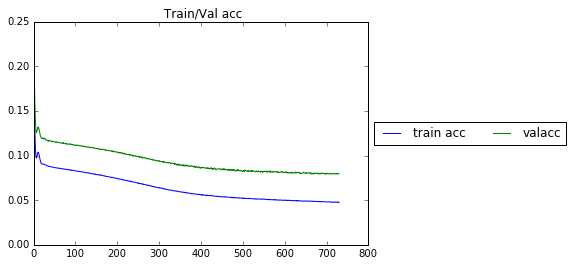

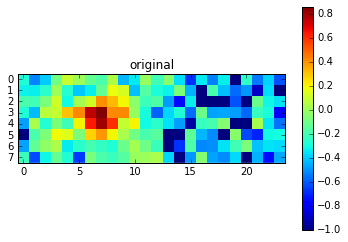

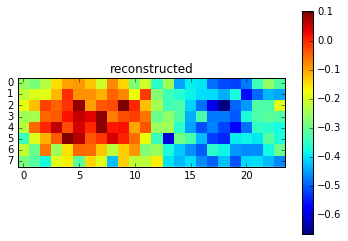

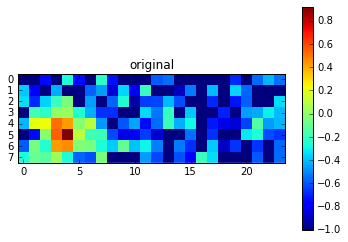

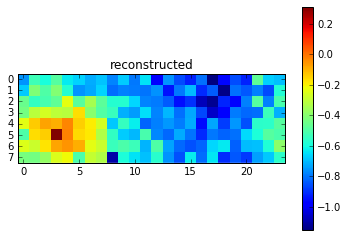

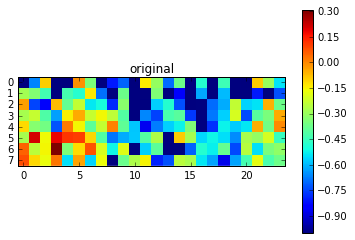

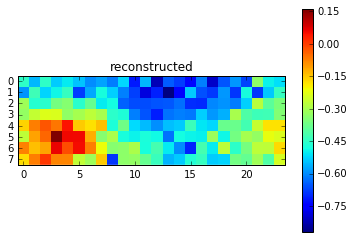

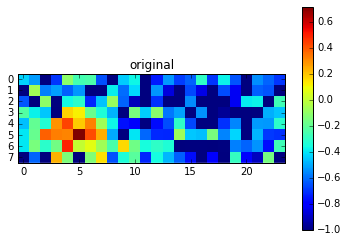

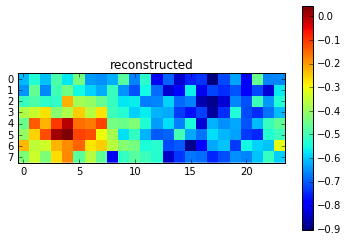

Epoch 732 of 1000 took 0.298s
	training los:		0.0476
	training acc:		4.7538 %
  validation loss:		0.079279
  validation accuracy:		7.93 %
Epoch 733 of 1000 took 0.225s
	training los:		0.0475
	training acc:		4.7744 %
  validation loss:		0.079274
  validation accuracy:		7.93 %
Epoch 734 of 1000 took 0.221s
	training los:		0.0477
	training acc:		4.7444 %
  validation loss:		0.079402
  validation accuracy:		7.94 %
Epoch 735 of 1000 took 0.221s
	training los:		0.0475
	training acc:		4.7790 %
  validation loss:		0.080081
  validation accuracy:		8.01 %
Epoch 736 of 1000 took 0.221s
	training los:		0.0475
	training acc:		4.7740 %
  validation loss:		0.079646
  validation accuracy:		7.96 %
Epoch 737 of 1000 took 0.220s
	training los:		0.0477
	training acc:		4.7686 %
  validation loss:		0.077948
  validation accuracy:		7.79 %
Epoch 738 of 1000 took 0.222s
	training los:		0.0478
	training acc:		4.7506 %
  validation loss:		0.079828
  validation accuracy:		7.98 %
Epoch 739 of 1000 took 0.225s
	tra

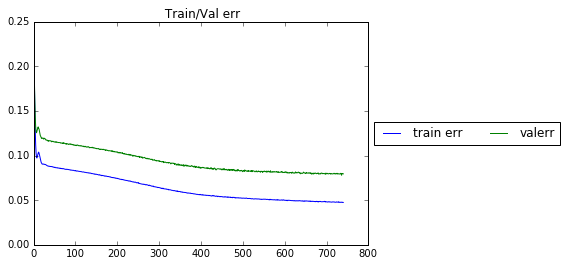

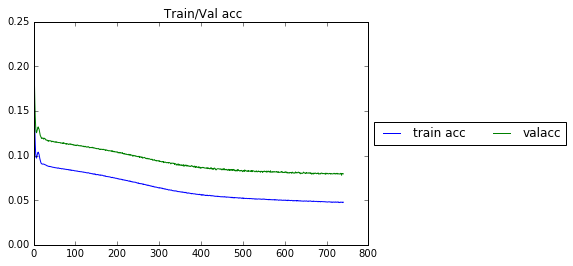

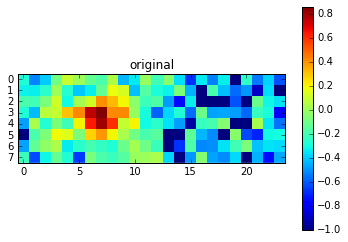

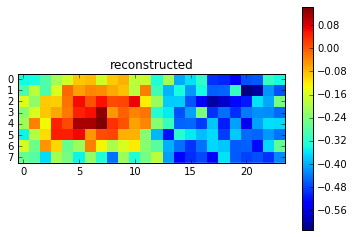

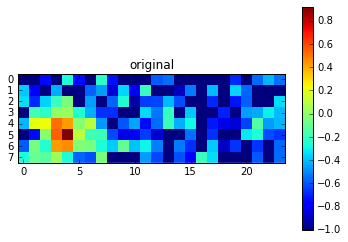

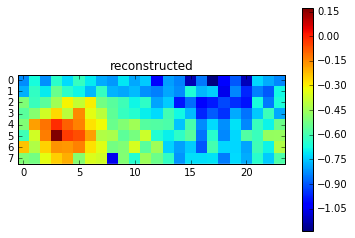

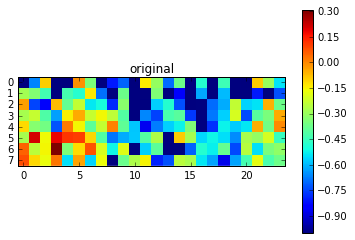

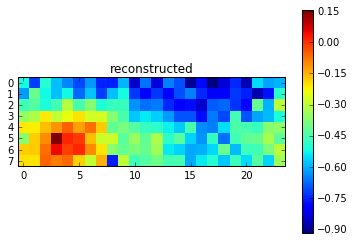

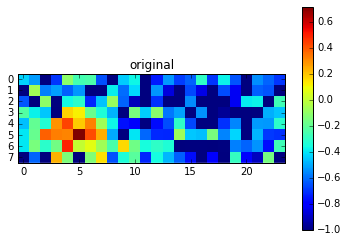

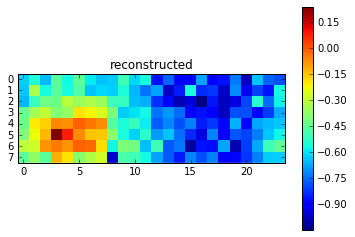

Epoch 742 of 1000 took 0.248s
	training los:		0.0478
	training acc:		4.7487 %
  validation loss:		0.079110
  validation accuracy:		7.91 %
Epoch 743 of 1000 took 0.220s
	training los:		0.0475
	training acc:		4.7478 %
  validation loss:		0.079756
  validation accuracy:		7.98 %
Epoch 744 of 1000 took 0.221s
	training los:		0.0475
	training acc:		4.7636 %
  validation loss:		0.079723
  validation accuracy:		7.97 %
Epoch 745 of 1000 took 0.221s
	training los:		0.0474
	training acc:		4.7351 %
  validation loss:		0.078452
  validation accuracy:		7.85 %
Epoch 746 of 1000 took 0.221s
	training los:		0.0475
	training acc:		4.7727 %
  validation loss:		0.079871
  validation accuracy:		7.99 %
Epoch 747 of 1000 took 0.220s
	training los:		0.0476
	training acc:		4.7542 %
  validation loss:		0.078995
  validation accuracy:		7.90 %
Epoch 748 of 1000 took 0.221s
	training los:		0.0475
	training acc:		4.7486 %
  validation loss:		0.078776
  validation accuracy:		7.88 %
Epoch 749 of 1000 took 0.220s
	tra

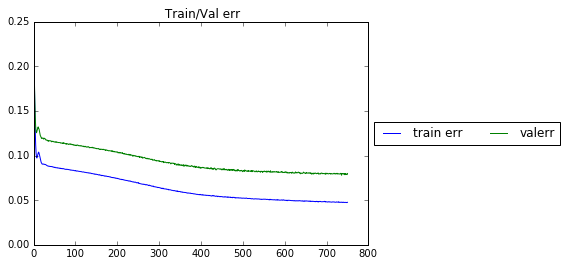

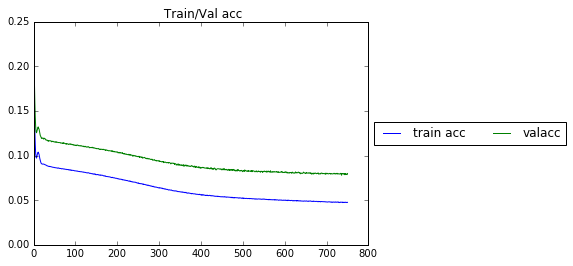

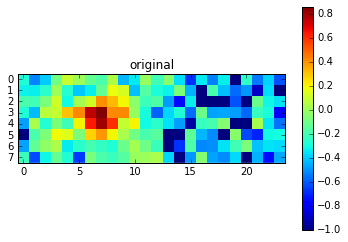

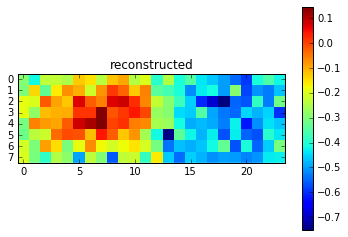

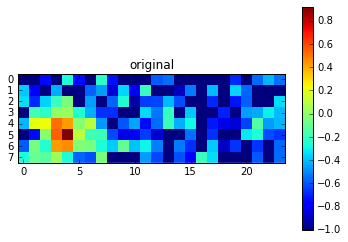

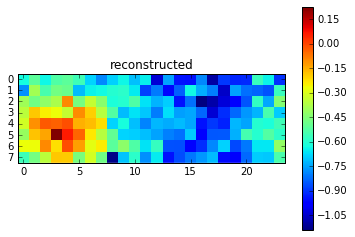

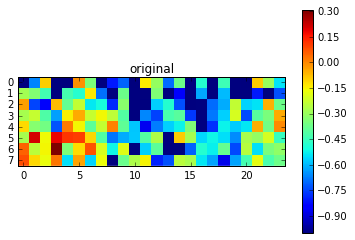

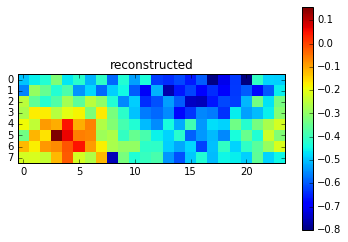

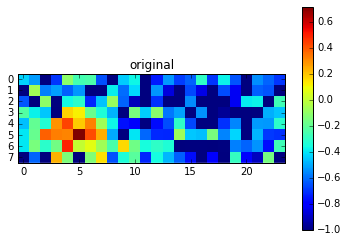

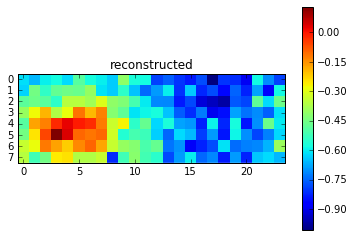

Epoch 752 of 1000 took 0.264s
	training los:		0.0476
	training acc:		4.7313 %
  validation loss:		0.078659
  validation accuracy:		7.87 %
Epoch 753 of 1000 took 0.224s
	training los:		0.0472
	training acc:		4.7250 %
  validation loss:		0.078677
  validation accuracy:		7.87 %
Epoch 754 of 1000 took 0.223s
	training los:		0.0472
	training acc:		4.7394 %
  validation loss:		0.079141
  validation accuracy:		7.91 %
Epoch 755 of 1000 took 0.225s
	training los:		0.0473
	training acc:		4.7128 %
  validation loss:		0.079051
  validation accuracy:		7.91 %
Epoch 756 of 1000 took 0.226s
	training los:		0.0473
	training acc:		4.7150 %
  validation loss:		0.079416
  validation accuracy:		7.94 %
Epoch 757 of 1000 took 0.224s
	training los:		0.0472
	training acc:		4.7222 %
  validation loss:		0.079042
  validation accuracy:		7.90 %
Epoch 758 of 1000 took 0.224s
	training los:		0.0472
	training acc:		4.7343 %
  validation loss:		0.079270
  validation accuracy:		7.93 %
Epoch 759 of 1000 took 0.224s
	tra

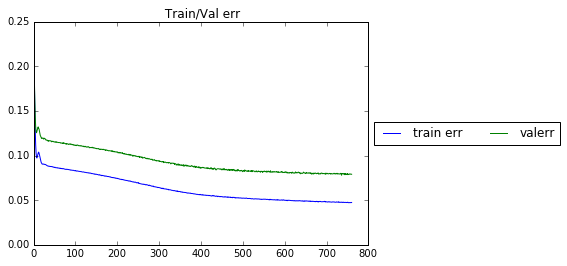

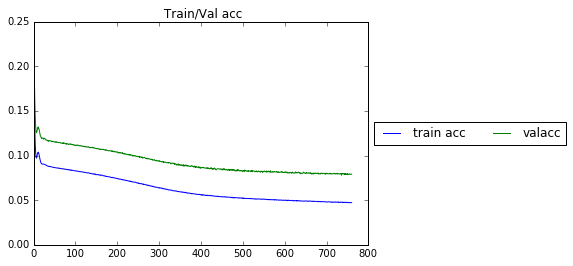

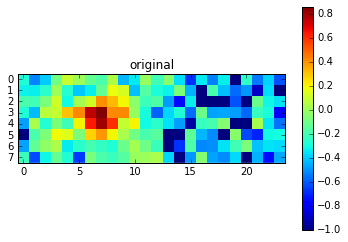

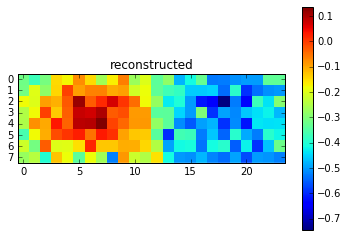

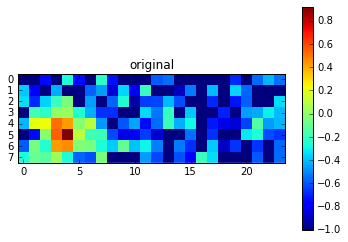

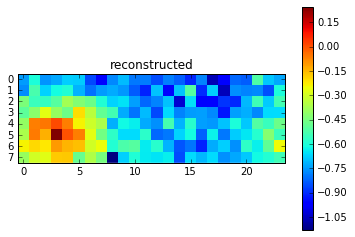

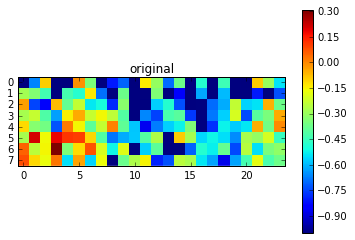

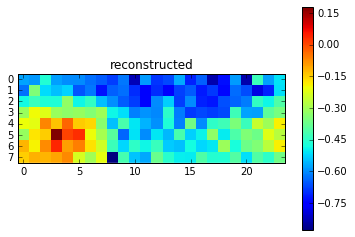

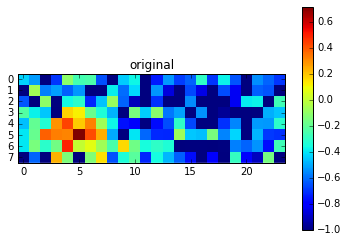

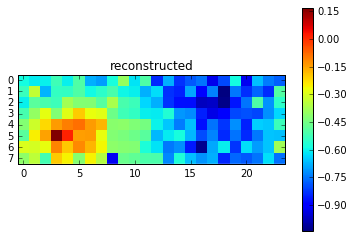

Epoch 762 of 1000 took 0.263s
	training los:		0.0471
	training acc:		4.7228 %
  validation loss:		0.078813
  validation accuracy:		7.88 %
Epoch 763 of 1000 took 0.230s
	training los:		0.0473
	training acc:		4.7209 %
  validation loss:		0.079444
  validation accuracy:		7.94 %
Epoch 764 of 1000 took 0.221s
	training los:		0.0469
	training acc:		4.7149 %
  validation loss:		0.079084
  validation accuracy:		7.91 %
Epoch 765 of 1000 took 0.221s
	training los:		0.0469
	training acc:		4.6781 %
  validation loss:		0.079055
  validation accuracy:		7.91 %
Epoch 766 of 1000 took 0.222s
	training los:		0.0471
	training acc:		4.6985 %
  validation loss:		0.079353
  validation accuracy:		7.94 %
Epoch 767 of 1000 took 0.221s
	training los:		0.0468
	training acc:		4.6948 %
  validation loss:		0.078318
  validation accuracy:		7.83 %
Epoch 768 of 1000 took 0.221s
	training los:		0.0471
	training acc:		4.7006 %
  validation loss:		0.078527
  validation accuracy:		7.85 %
Epoch 769 of 1000 took 0.222s
	tra

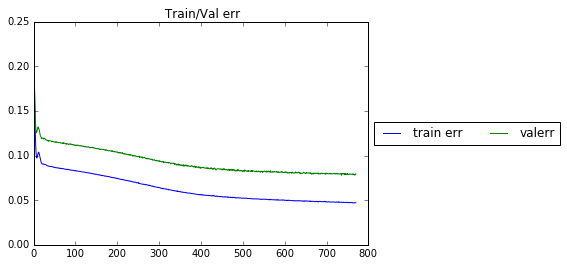

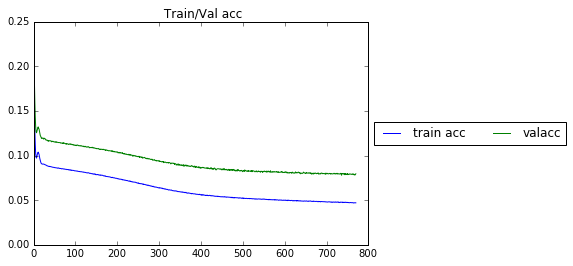

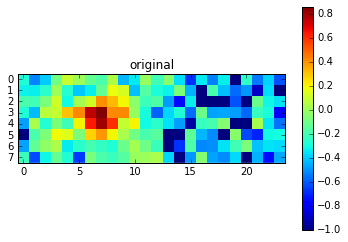

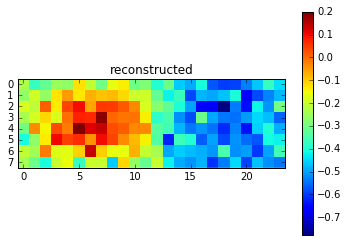

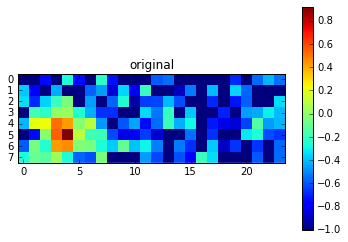

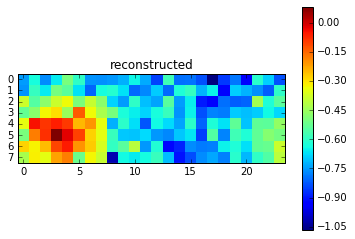

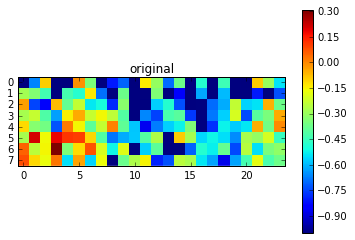

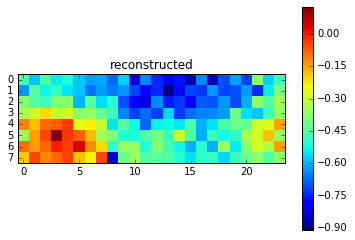

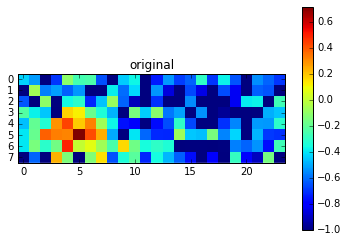

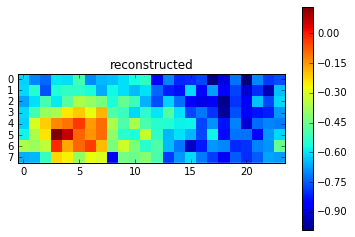

Epoch 772 of 1000 took 0.263s
	training los:		0.0471
	training acc:		4.7218 %
  validation loss:		0.078424
  validation accuracy:		7.84 %
Epoch 773 of 1000 took 0.228s
	training los:		0.0471
	training acc:		4.7007 %
  validation loss:		0.079196
  validation accuracy:		7.92 %
Epoch 774 of 1000 took 0.227s
	training los:		0.0472
	training acc:		4.7250 %
  validation loss:		0.079171
  validation accuracy:		7.92 %
Epoch 775 of 1000 took 0.228s
	training los:		0.0470
	training acc:		4.6974 %
  validation loss:		0.079151
  validation accuracy:		7.92 %
Epoch 776 of 1000 took 0.228s
	training los:		0.0470
	training acc:		4.7116 %
  validation loss:		0.078927
  validation accuracy:		7.89 %
Epoch 777 of 1000 took 0.245s
	training los:		0.0470
	training acc:		4.6867 %
  validation loss:		0.079115
  validation accuracy:		7.91 %
Epoch 778 of 1000 took 0.228s
	training los:		0.0469
	training acc:		4.7039 %
  validation loss:		0.078202
  validation accuracy:		7.82 %
Epoch 779 of 1000 took 0.228s
	tra

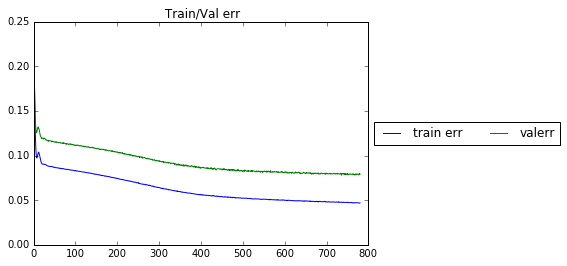

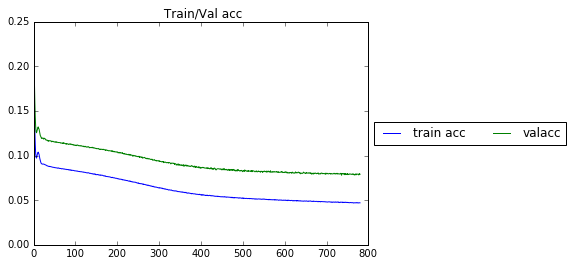

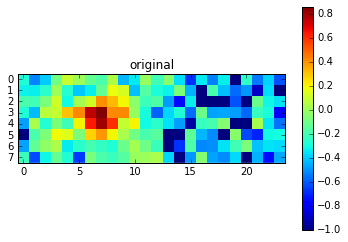

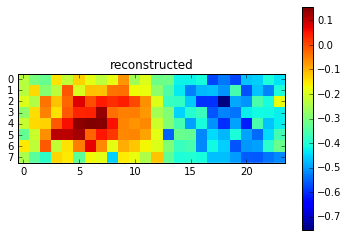

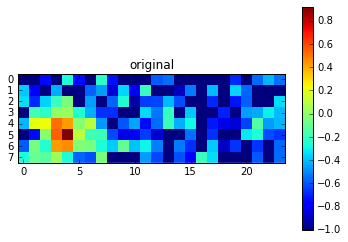

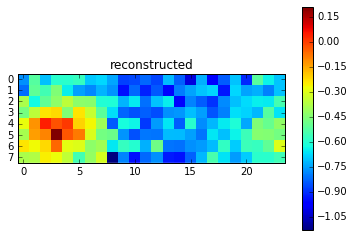

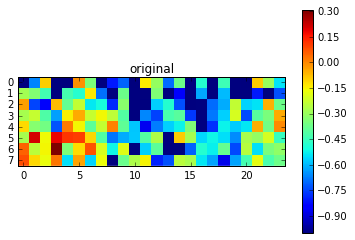

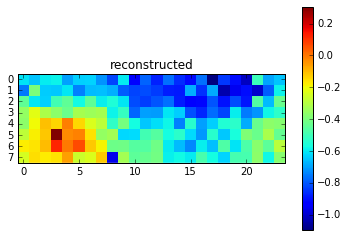

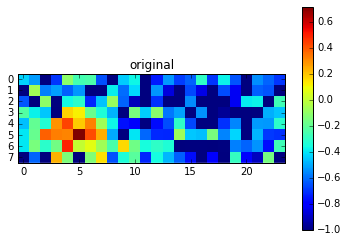

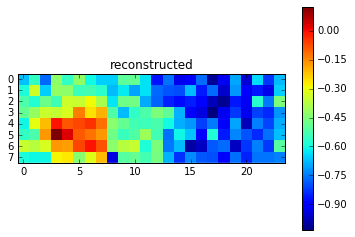

Epoch 782 of 1000 took 0.440s
	training los:		0.0473
	training acc:		4.6944 %
  validation loss:		0.079651
  validation accuracy:		7.97 %
Epoch 783 of 1000 took 0.222s
	training los:		0.0471
	training acc:		4.7008 %
  validation loss:		0.079221
  validation accuracy:		7.92 %
Epoch 784 of 1000 took 0.251s
	training los:		0.0471
	training acc:		4.6814 %
  validation loss:		0.078882
  validation accuracy:		7.89 %
Epoch 785 of 1000 took 0.222s
	training los:		0.0467
	training acc:		4.6758 %
  validation loss:		0.078441
  validation accuracy:		7.84 %
Epoch 786 of 1000 took 0.221s
	training los:		0.0468
	training acc:		4.6915 %
  validation loss:		0.078733
  validation accuracy:		7.87 %
Epoch 787 of 1000 took 0.222s
	training los:		0.0470
	training acc:		4.6898 %
  validation loss:		0.079533
  validation accuracy:		7.95 %
Epoch 788 of 1000 took 0.221s
	training los:		0.0468
	training acc:		4.6708 %
  validation loss:		0.078926
  validation accuracy:		7.89 %
Epoch 789 of 1000 took 0.222s
	tra

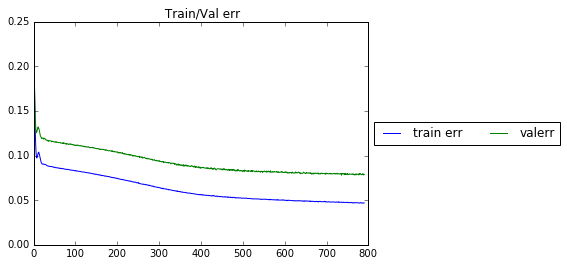

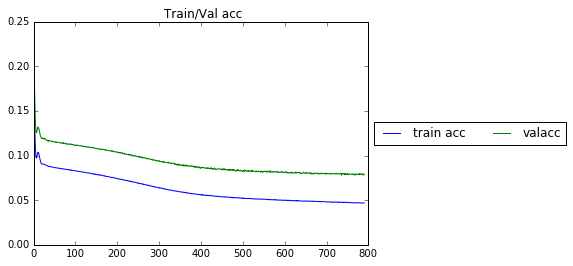

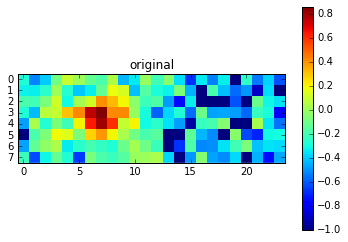

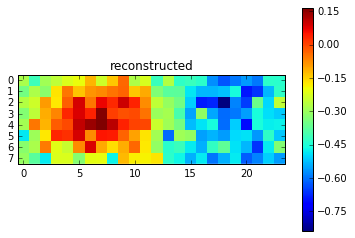

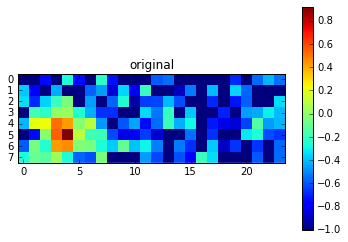

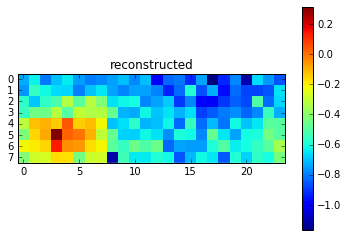

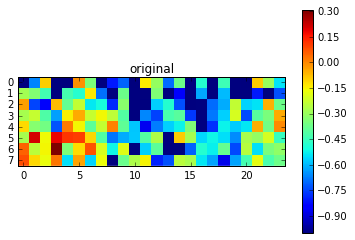

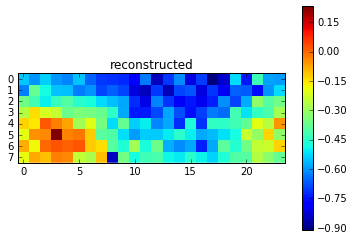

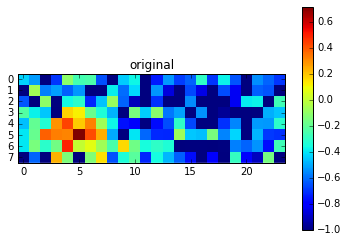

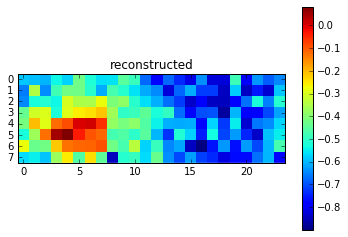

Epoch 792 of 1000 took 0.267s
	training los:		0.0465
	training acc:		4.7019 %
  validation loss:		0.079228
  validation accuracy:		7.92 %
Epoch 793 of 1000 took 0.239s
	training los:		0.0470
	training acc:		4.6641 %
  validation loss:		0.078585
  validation accuracy:		7.86 %
Epoch 794 of 1000 took 0.221s
	training los:		0.0467
	training acc:		4.6828 %
  validation loss:		0.078386
  validation accuracy:		7.84 %
Epoch 795 of 1000 took 0.222s
	training los:		0.0468
	training acc:		4.6598 %
  validation loss:		0.078263
  validation accuracy:		7.83 %
Epoch 796 of 1000 took 0.222s
	training los:		0.0467
	training acc:		4.6664 %
  validation loss:		0.078250
  validation accuracy:		7.83 %
Epoch 797 of 1000 took 0.221s
	training los:		0.0467
	training acc:		4.6877 %
  validation loss:		0.078476
  validation accuracy:		7.85 %
Epoch 798 of 1000 took 0.221s
	training los:		0.0468
	training acc:		4.6605 %
  validation loss:		0.078684
  validation accuracy:		7.87 %
Epoch 799 of 1000 took 0.221s
	tra

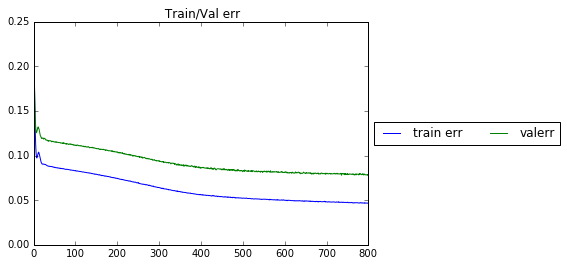

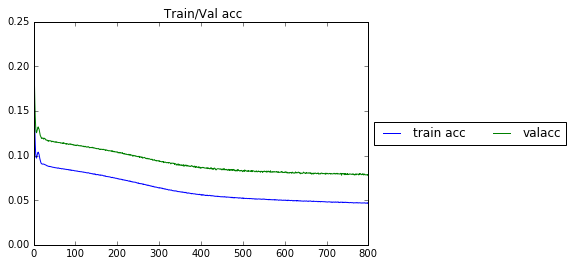

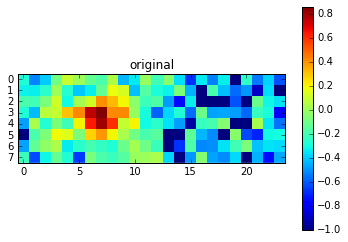

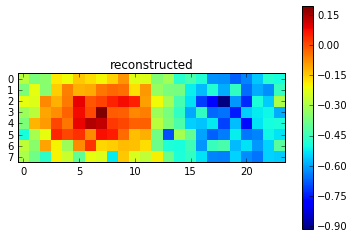

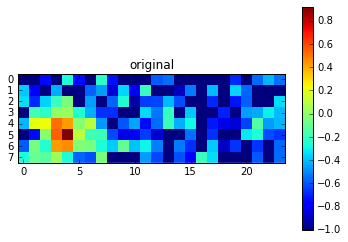

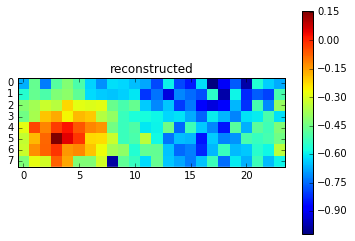

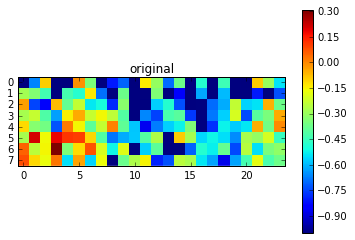

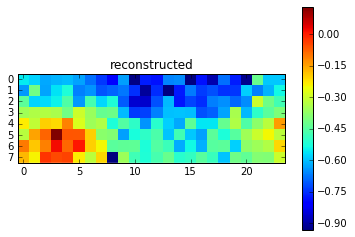

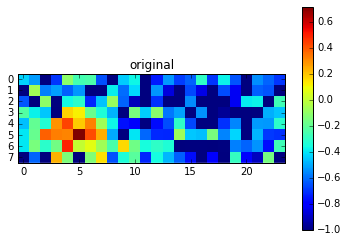

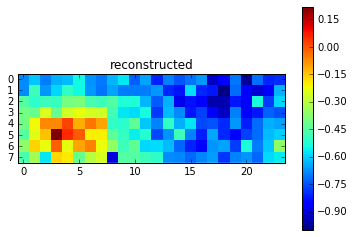

Epoch 802 of 1000 took 0.267s
	training los:		0.0469
	training acc:		4.6645 %
  validation loss:		0.078173
  validation accuracy:		7.82 %
Epoch 803 of 1000 took 0.234s
	training los:		0.0466
	training acc:		4.6728 %
  validation loss:		0.078942
  validation accuracy:		7.89 %
Epoch 804 of 1000 took 0.223s
	training los:		0.0469
	training acc:		4.6761 %
  validation loss:		0.078459
  validation accuracy:		7.85 %
Epoch 805 of 1000 took 0.223s
	training los:		0.0468
	training acc:		4.6427 %
  validation loss:		0.078856
  validation accuracy:		7.89 %
Epoch 806 of 1000 took 0.224s
	training los:		0.0468
	training acc:		4.6951 %
  validation loss:		0.079353
  validation accuracy:		7.94 %
Epoch 807 of 1000 took 0.223s
	training los:		0.0465
	training acc:		4.6564 %
  validation loss:		0.077340
  validation accuracy:		7.73 %
Epoch 808 of 1000 took 0.224s
	training los:		0.0466
	training acc:		4.6784 %
  validation loss:		0.078775
  validation accuracy:		7.88 %
Epoch 809 of 1000 took 0.224s
	tra

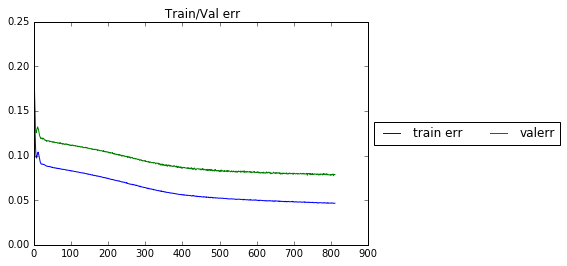

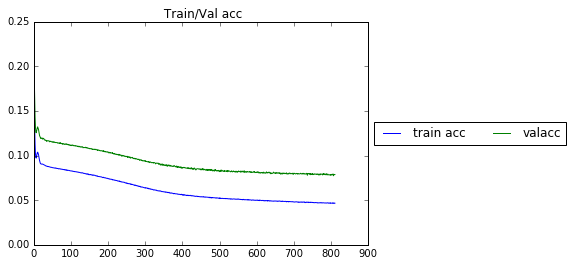

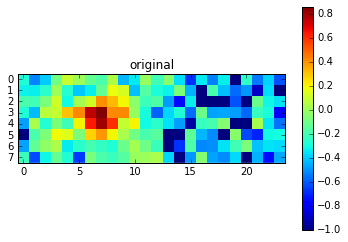

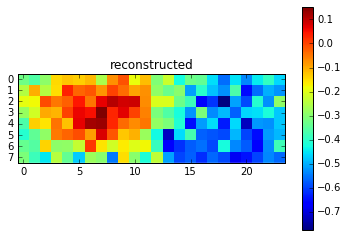

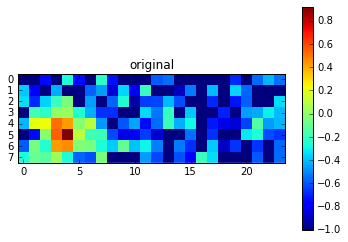

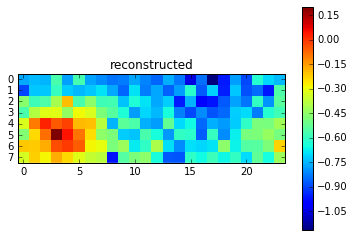

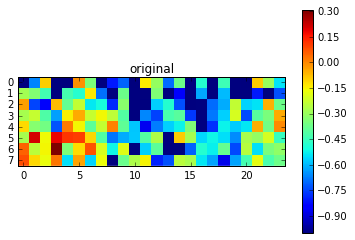

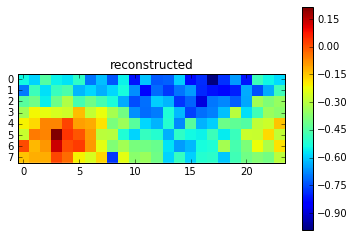

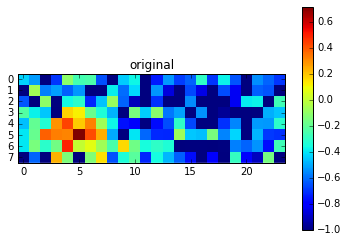

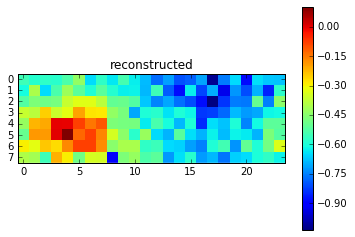

Epoch 812 of 1000 took 0.269s
	training los:		0.0464
	training acc:		4.6486 %
  validation loss:		0.078398
  validation accuracy:		7.84 %
Epoch 813 of 1000 took 0.252s
	training los:		0.0461
	training acc:		4.6842 %
  validation loss:		0.078636
  validation accuracy:		7.86 %
Epoch 814 of 1000 took 0.226s
	training los:		0.0464
	training acc:		4.6475 %
  validation loss:		0.077806
  validation accuracy:		7.78 %
Epoch 815 of 1000 took 0.226s
	training los:		0.0462
	training acc:		4.6105 %
  validation loss:		0.078766
  validation accuracy:		7.88 %
Epoch 816 of 1000 took 0.230s
	training los:		0.0466
	training acc:		4.6404 %
  validation loss:		0.078126
  validation accuracy:		7.81 %
Epoch 817 of 1000 took 0.254s
	training los:		0.0463
	training acc:		4.6553 %
  validation loss:		0.078621
  validation accuracy:		7.86 %
Epoch 818 of 1000 took 0.227s
	training los:		0.0464
	training acc:		4.6525 %
  validation loss:		0.077694
  validation accuracy:		7.77 %
Epoch 819 of 1000 took 0.227s
	tra

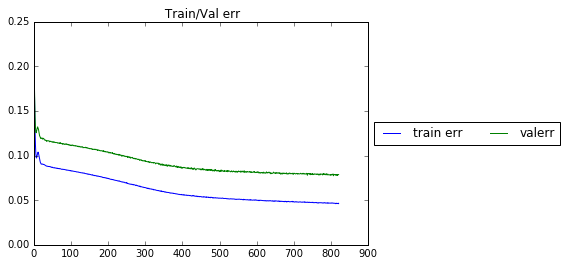

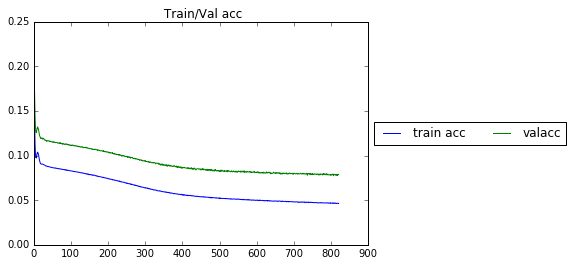

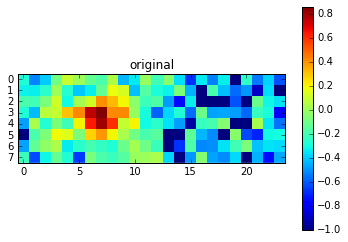

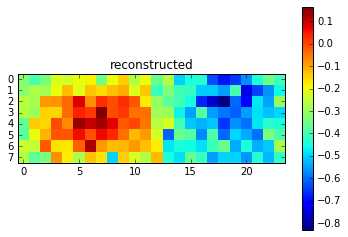

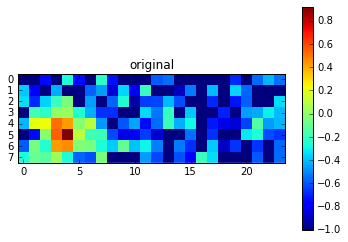

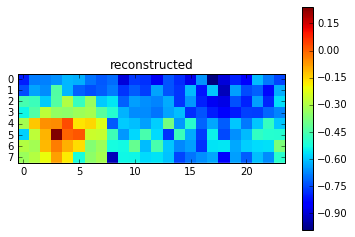

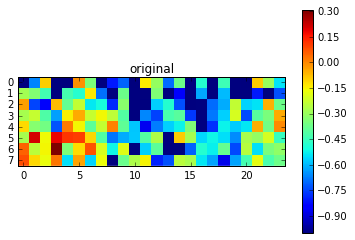

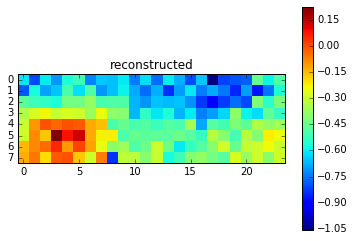

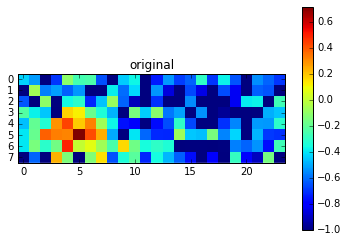

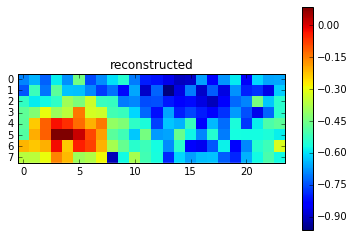

Epoch 822 of 1000 took 0.300s
	training los:		0.0465
	training acc:		4.6328 %
  validation loss:		0.078645
  validation accuracy:		7.86 %
Epoch 823 of 1000 took 0.221s
	training los:		0.0464
	training acc:		4.6387 %
  validation loss:		0.077913
  validation accuracy:		7.79 %
Epoch 824 of 1000 took 0.227s
	training los:		0.0466
	training acc:		4.6280 %
  validation loss:		0.078243
  validation accuracy:		7.82 %
Epoch 825 of 1000 took 0.221s
	training los:		0.0465
	training acc:		4.6457 %
  validation loss:		0.078534
  validation accuracy:		7.85 %
Epoch 826 of 1000 took 0.224s
	training los:		0.0462
	training acc:		4.6510 %
  validation loss:		0.079107
  validation accuracy:		7.91 %
Epoch 827 of 1000 took 0.223s
	training los:		0.0464
	training acc:		4.6212 %
  validation loss:		0.078336
  validation accuracy:		7.83 %
Epoch 828 of 1000 took 0.222s
	training los:		0.0464
	training acc:		4.6006 %
  validation loss:		0.078403
  validation accuracy:		7.84 %
Epoch 829 of 1000 took 0.223s
	tra

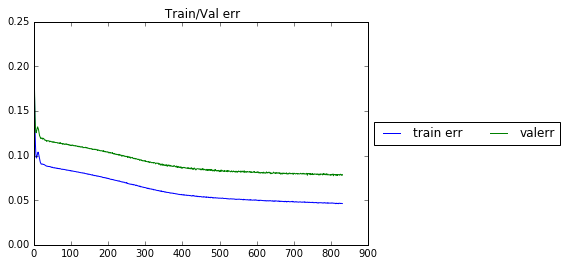

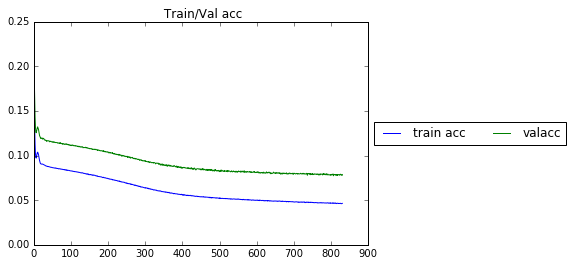

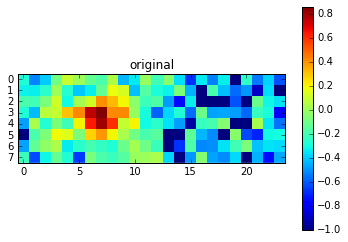

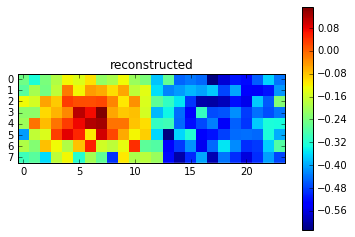

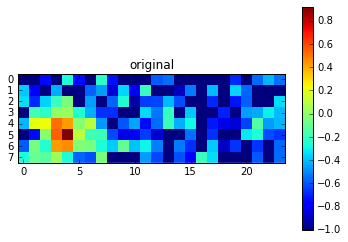

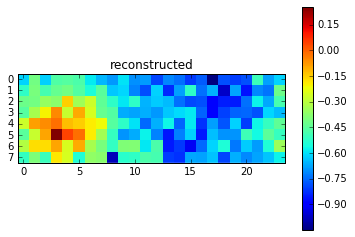

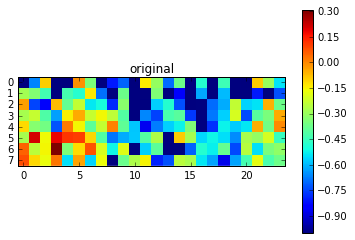

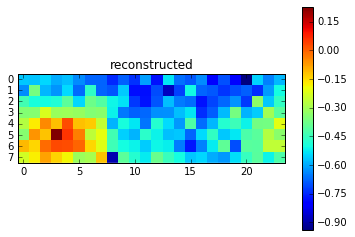

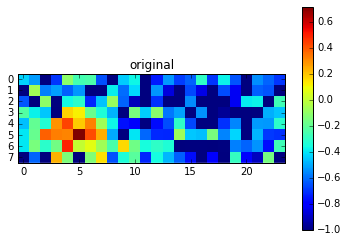

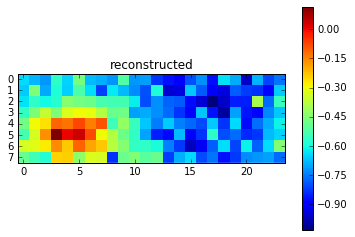

Epoch 832 of 1000 took 0.270s
	training los:		0.0465
	training acc:		4.6304 %
  validation loss:		0.078494
  validation accuracy:		7.85 %
Epoch 833 of 1000 took 0.237s
	training los:		0.0465
	training acc:		4.6376 %
  validation loss:		0.078203
  validation accuracy:		7.82 %
Epoch 834 of 1000 took 0.221s
	training los:		0.0464
	training acc:		4.6296 %
  validation loss:		0.079335
  validation accuracy:		7.93 %
Epoch 835 of 1000 took 0.222s
	training los:		0.0463
	training acc:		4.6101 %
  validation loss:		0.078540
  validation accuracy:		7.85 %
Epoch 836 of 1000 took 0.221s
	training los:		0.0461
	training acc:		4.5856 %
  validation loss:		0.077688
  validation accuracy:		7.77 %
Epoch 837 of 1000 took 0.222s
	training los:		0.0460
	training acc:		4.6348 %
  validation loss:		0.078118
  validation accuracy:		7.81 %
Epoch 838 of 1000 took 0.222s
	training los:		0.0463
	training acc:		4.6535 %
  validation loss:		0.078417
  validation accuracy:		7.84 %
Epoch 839 of 1000 took 0.222s
	tra

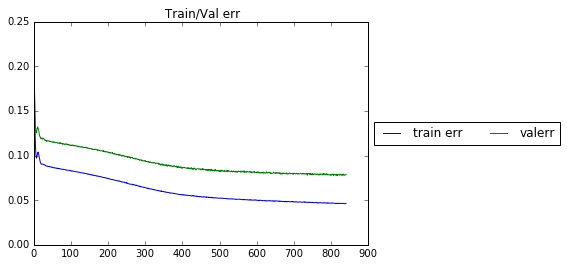

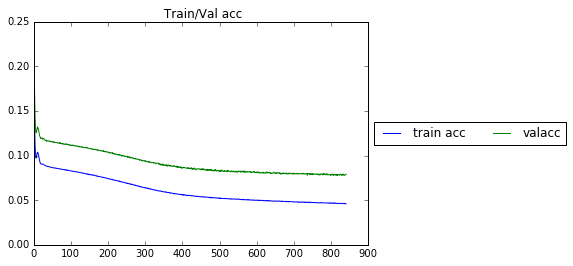

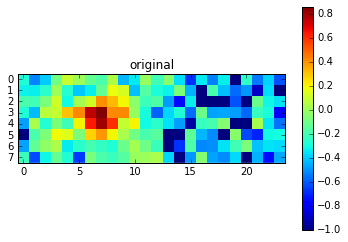

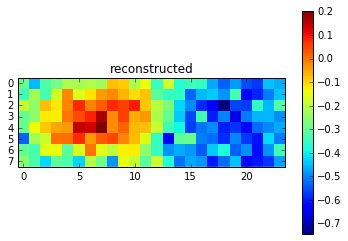

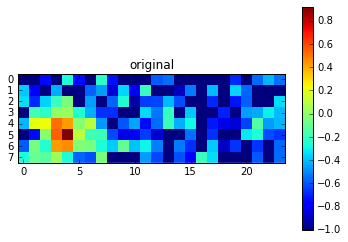

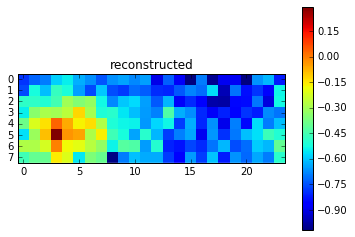

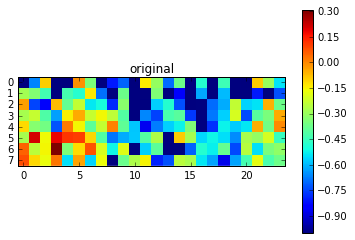

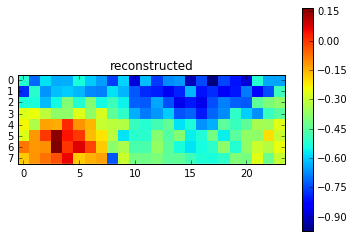

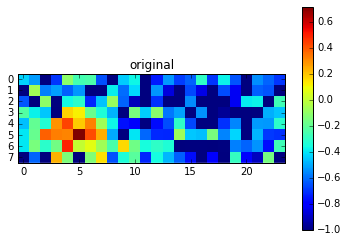

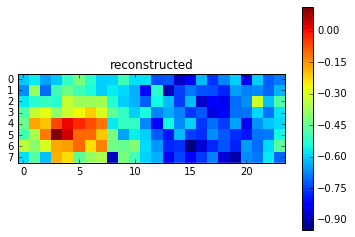

Epoch 842 of 1000 took 0.265s
	training los:		0.0461
	training acc:		4.6330 %
  validation loss:		0.078125
  validation accuracy:		7.81 %
Epoch 843 of 1000 took 0.226s
	training los:		0.0458
	training acc:		4.6108 %
  validation loss:		0.078824
  validation accuracy:		7.88 %
Epoch 844 of 1000 took 0.221s
	training los:		0.0461
	training acc:		4.5958 %
  validation loss:		0.079282
  validation accuracy:		7.93 %
Epoch 845 of 1000 took 0.223s
	training los:		0.0462
	training acc:		4.6137 %
  validation loss:		0.079272
  validation accuracy:		7.93 %
Epoch 846 of 1000 took 0.220s
	training los:		0.0461
	training acc:		4.6149 %
  validation loss:		0.078175
  validation accuracy:		7.82 %
Epoch 847 of 1000 took 0.220s
	training los:		0.0462
	training acc:		4.6158 %
  validation loss:		0.078324
  validation accuracy:		7.83 %
Epoch 848 of 1000 took 0.220s
	training los:		0.0460
	training acc:		4.6029 %
  validation loss:		0.078992
  validation accuracy:		7.90 %
Epoch 849 of 1000 took 0.220s
	tra

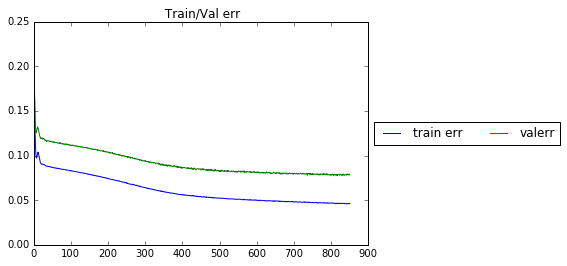

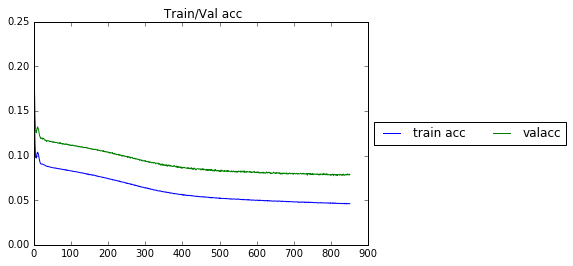

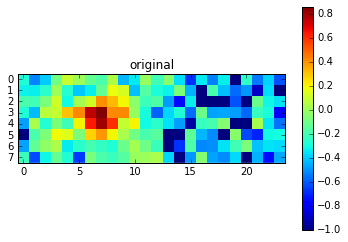

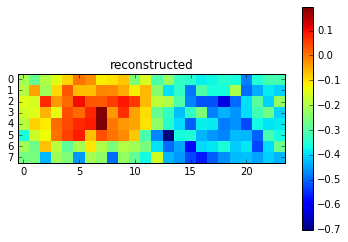

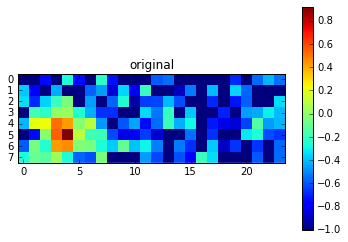

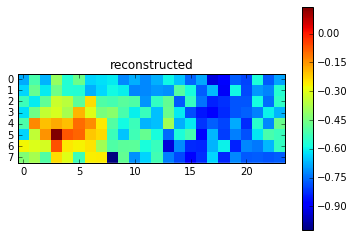

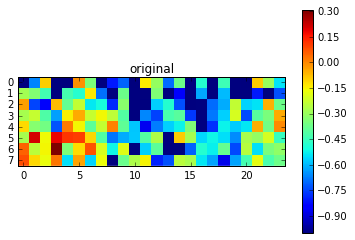

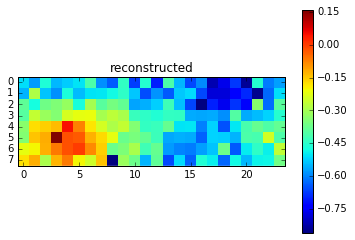

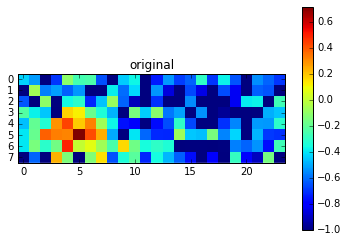

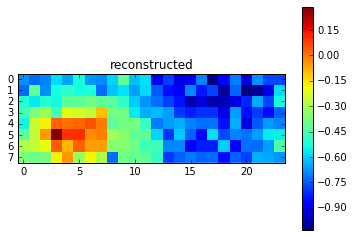

Epoch 852 of 1000 took 0.262s
	training los:		0.0458
	training acc:		4.6005 %
  validation loss:		0.077844
  validation accuracy:		7.78 %
Epoch 853 of 1000 took 0.257s
	training los:		0.0458
	training acc:		4.5930 %
  validation loss:		0.078709
  validation accuracy:		7.87 %
Epoch 854 of 1000 took 0.225s
	training los:		0.0460
	training acc:		4.5922 %
  validation loss:		0.078197
  validation accuracy:		7.82 %
Epoch 855 of 1000 took 0.223s
	training los:		0.0460
	training acc:		4.5874 %
  validation loss:		0.078301
  validation accuracy:		7.83 %
Epoch 856 of 1000 took 0.223s
	training los:		0.0460
	training acc:		4.6182 %
  validation loss:		0.078723
  validation accuracy:		7.87 %
Epoch 857 of 1000 took 0.222s
	training los:		0.0458
	training acc:		4.5921 %
  validation loss:		0.078374
  validation accuracy:		7.84 %
Epoch 858 of 1000 took 0.223s
	training los:		0.0461
	training acc:		4.5967 %
  validation loss:		0.078009
  validation accuracy:		7.80 %
Epoch 859 of 1000 took 0.223s
	tra

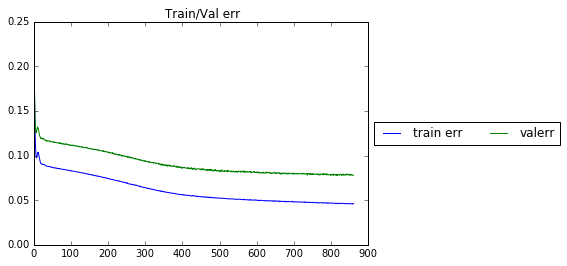

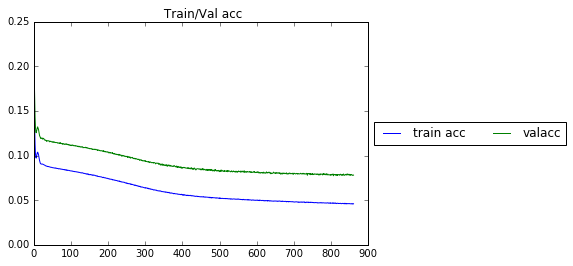

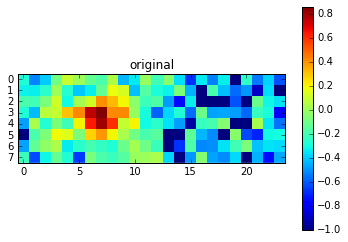

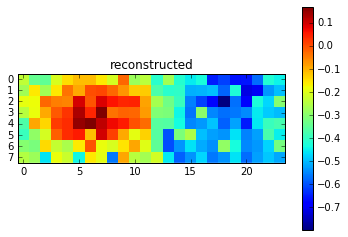

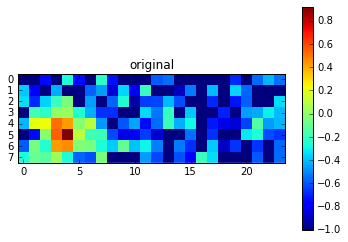

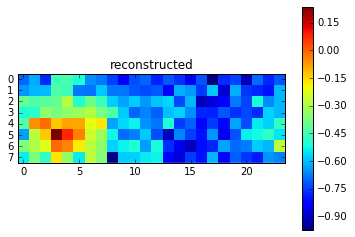

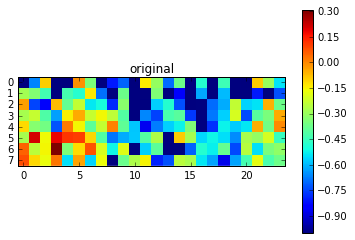

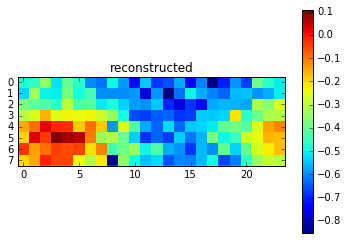

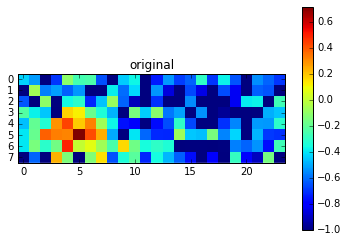

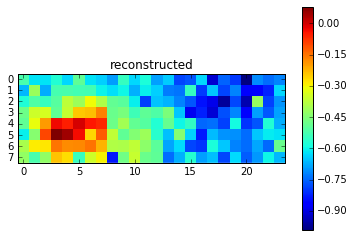

Epoch 862 of 1000 took 0.256s
	training los:		0.0455
	training acc:		4.5742 %
  validation loss:		0.078718
  validation accuracy:		7.87 %
Epoch 863 of 1000 took 0.219s
	training los:		0.0459
	training acc:		4.5453 %
  validation loss:		0.078561
  validation accuracy:		7.86 %
Epoch 864 of 1000 took 0.217s
	training los:		0.0460
	training acc:		4.5756 %
  validation loss:		0.077879
  validation accuracy:		7.79 %
Epoch 865 of 1000 took 0.218s
	training los:		0.0460
	training acc:		4.5868 %
  validation loss:		0.078354
  validation accuracy:		7.84 %
Epoch 866 of 1000 took 0.218s
	training los:		0.0457
	training acc:		4.5796 %
  validation loss:		0.078171
  validation accuracy:		7.82 %
Epoch 867 of 1000 took 0.219s
	training los:		0.0455
	training acc:		4.5801 %
  validation loss:		0.078761
  validation accuracy:		7.88 %
Epoch 868 of 1000 took 0.217s
	training los:		0.0455
	training acc:		4.5764 %
  validation loss:		0.077512
  validation accuracy:		7.75 %
Epoch 869 of 1000 took 0.218s
	tra

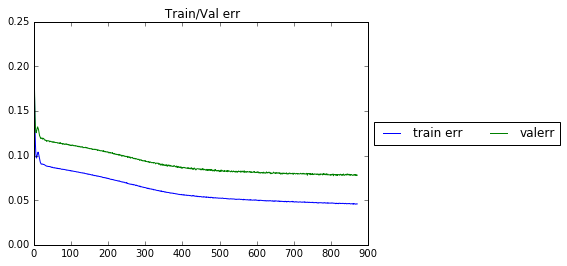

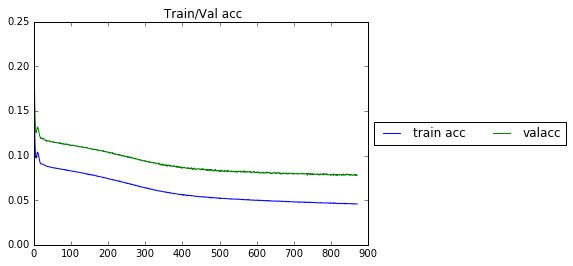

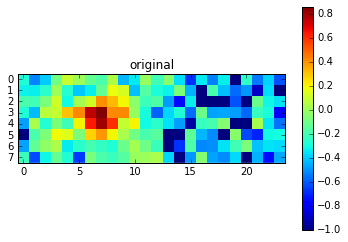

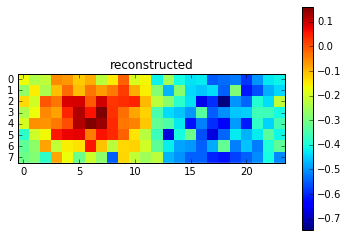

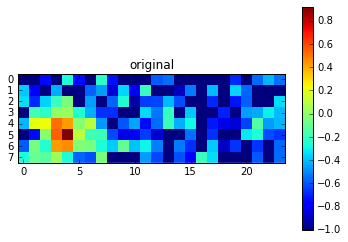

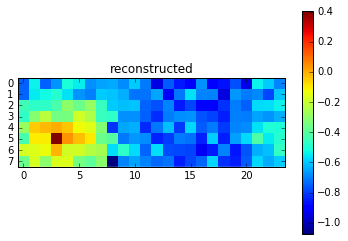

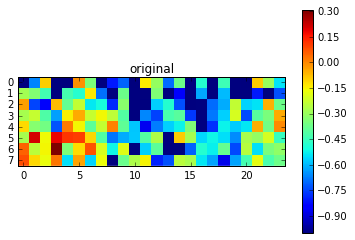

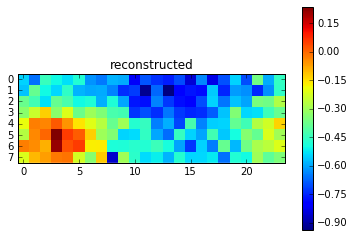

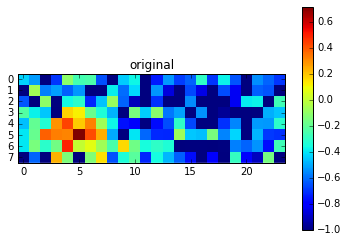

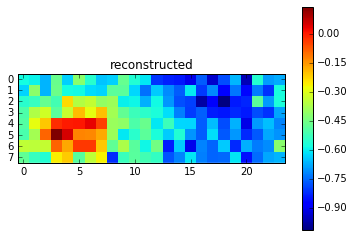

Epoch 872 of 1000 took 0.281s
	training los:		0.0455
	training acc:		4.5675 %
  validation loss:		0.078013
  validation accuracy:		7.80 %
Epoch 873 of 1000 took 0.255s
	training los:		0.0458
	training acc:		4.5750 %
  validation loss:		0.078099
  validation accuracy:		7.81 %
Epoch 874 of 1000 took 0.225s
	training los:		0.0459
	training acc:		4.5904 %
  validation loss:		0.078247
  validation accuracy:		7.82 %
Epoch 875 of 1000 took 0.222s
	training los:		0.0458
	training acc:		4.5645 %
  validation loss:		0.077561
  validation accuracy:		7.76 %
Epoch 876 of 1000 took 0.223s
	training los:		0.0456
	training acc:		4.5634 %
  validation loss:		0.077586
  validation accuracy:		7.76 %
Epoch 877 of 1000 took 0.223s
	training los:		0.0458
	training acc:		4.5445 %
  validation loss:		0.077924
  validation accuracy:		7.79 %
Epoch 878 of 1000 took 0.222s
	training los:		0.0458
	training acc:		4.5878 %
  validation loss:		0.077980
  validation accuracy:		7.80 %
Epoch 879 of 1000 took 0.222s
	tra

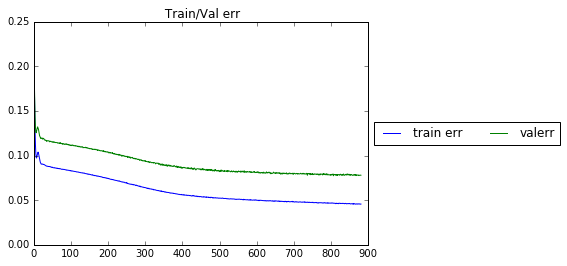

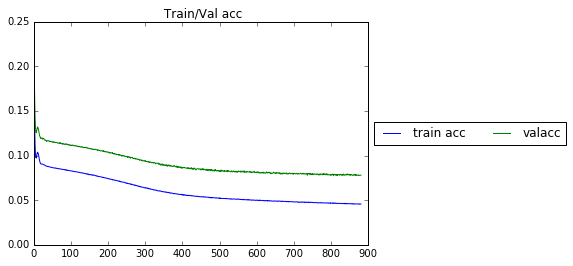

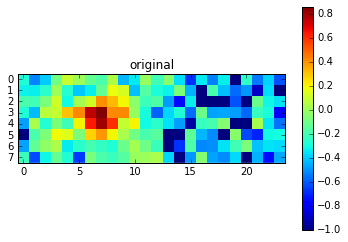

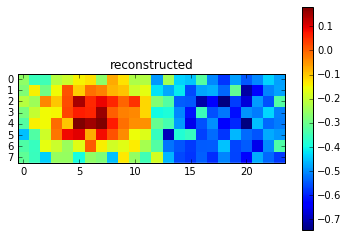

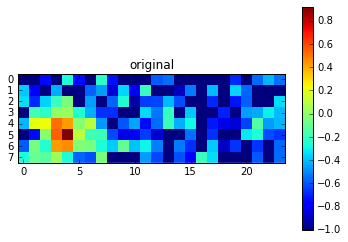

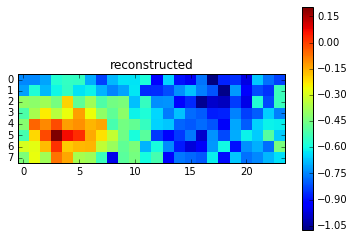

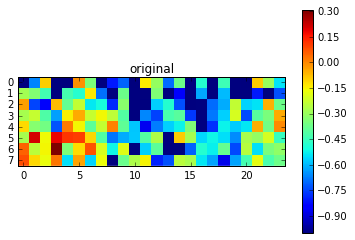

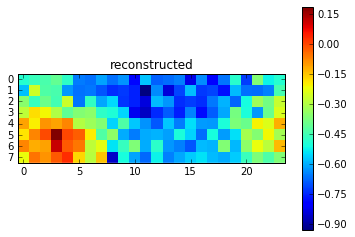

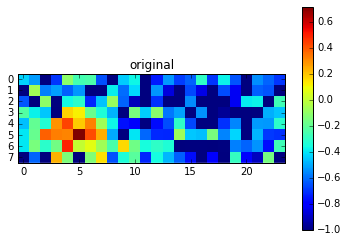

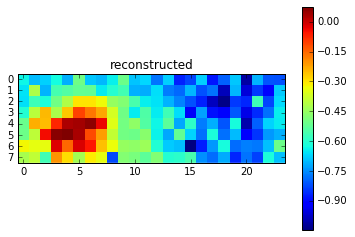

Epoch 882 of 1000 took 0.229s
	training los:		0.0458
	training acc:		4.5711 %
  validation loss:		0.078375
  validation accuracy:		7.84 %
Epoch 883 of 1000 took 0.216s
	training los:		0.0458
	training acc:		4.5605 %
  validation loss:		0.078505
  validation accuracy:		7.85 %
Epoch 884 of 1000 took 0.217s
	training los:		0.0454
	training acc:		4.5328 %
  validation loss:		0.078248
  validation accuracy:		7.82 %
Epoch 885 of 1000 took 0.216s
	training los:		0.0457
	training acc:		4.5522 %
  validation loss:		0.077526
  validation accuracy:		7.75 %
Epoch 886 of 1000 took 0.216s
	training los:		0.0457
	training acc:		4.5557 %
  validation loss:		0.078528
  validation accuracy:		7.85 %
Epoch 887 of 1000 took 0.217s
	training los:		0.0456
	training acc:		4.5749 %
  validation loss:		0.078102
  validation accuracy:		7.81 %
Epoch 888 of 1000 took 0.217s
	training los:		0.0457
	training acc:		4.5572 %
  validation loss:		0.077998
  validation accuracy:		7.80 %
Epoch 889 of 1000 took 0.217s
	tra

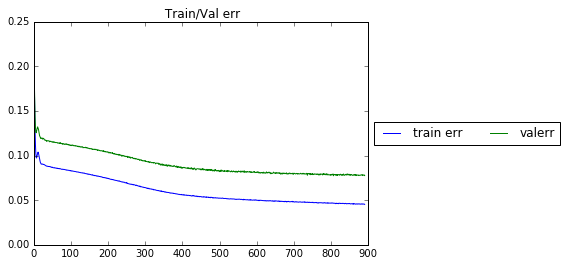

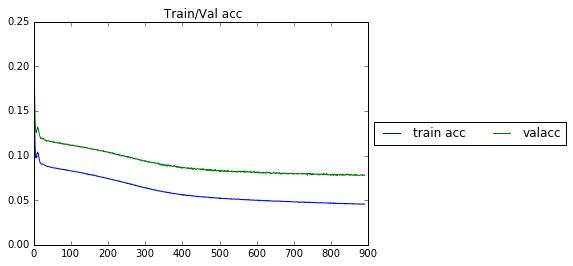

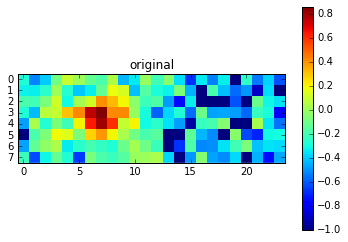

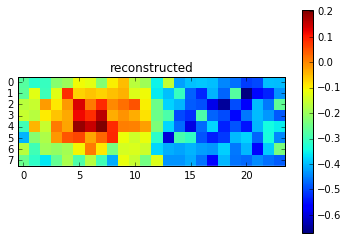

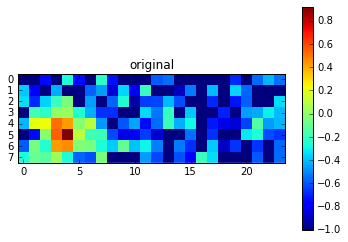

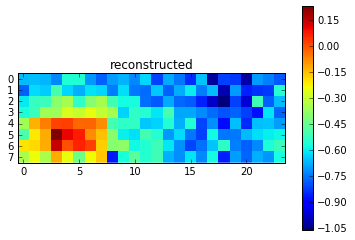

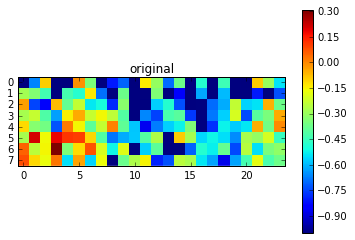

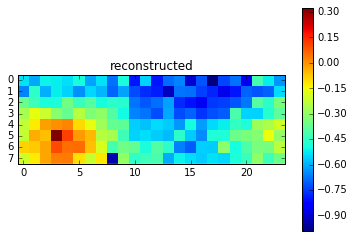

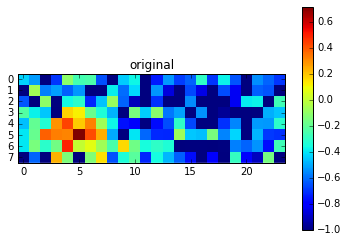

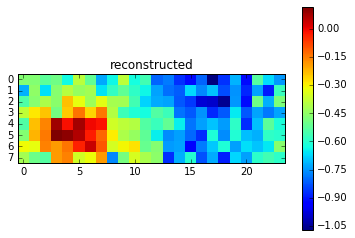

Epoch 892 of 1000 took 0.223s
	training los:		0.0454
	training acc:		4.5628 %
  validation loss:		0.077803
  validation accuracy:		7.78 %
Epoch 893 of 1000 took 0.215s
	training los:		0.0455
	training acc:		4.5312 %
  validation loss:		0.077420
  validation accuracy:		7.74 %
Epoch 894 of 1000 took 0.216s
	training los:		0.0456
	training acc:		4.5421 %
  validation loss:		0.078113
  validation accuracy:		7.81 %
Epoch 895 of 1000 took 0.215s
	training los:		0.0457
	training acc:		4.5254 %
  validation loss:		0.078015
  validation accuracy:		7.80 %
Epoch 896 of 1000 took 0.217s
	training los:		0.0454
	training acc:		4.5382 %
  validation loss:		0.077697
  validation accuracy:		7.77 %
Epoch 897 of 1000 took 0.217s
	training los:		0.0455
	training acc:		4.5520 %
  validation loss:		0.077681
  validation accuracy:		7.77 %
Epoch 898 of 1000 took 0.215s
	training los:		0.0455
	training acc:		4.5365 %
  validation loss:		0.078071
  validation accuracy:		7.81 %
Epoch 899 of 1000 took 0.216s
	tra

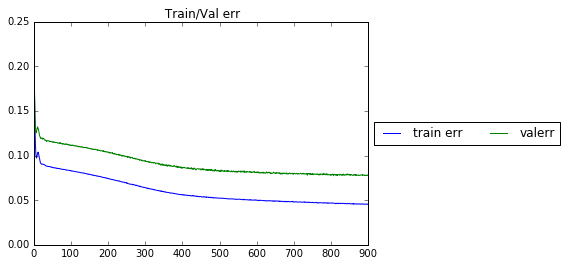

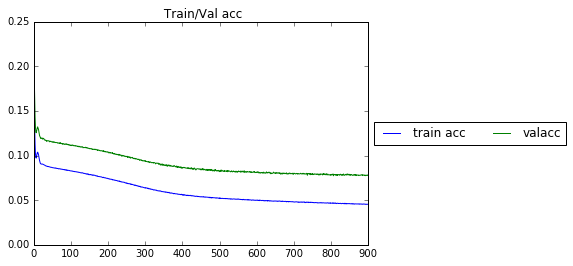

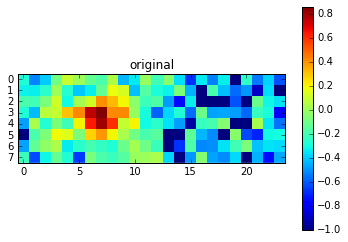

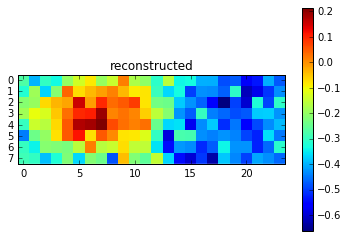

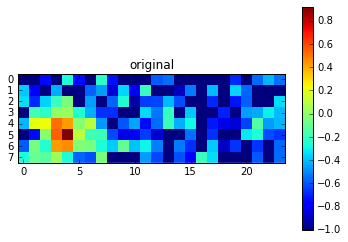

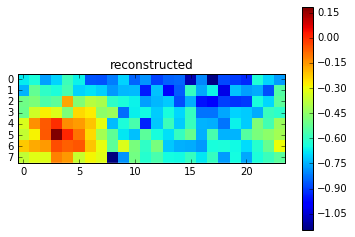

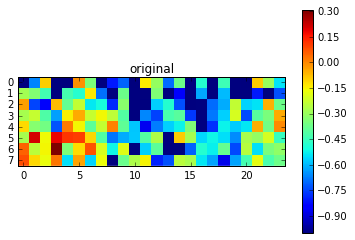

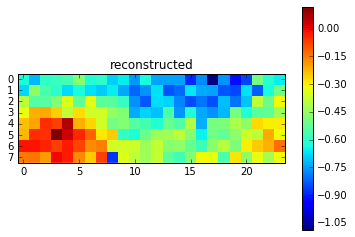

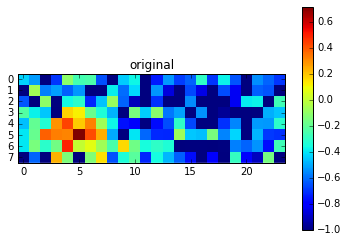

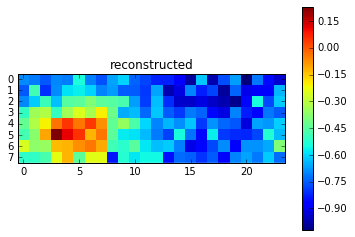

Epoch 902 of 1000 took 0.239s
	training los:		0.0456
	training acc:		4.5555 %
  validation loss:		0.077877
  validation accuracy:		7.79 %
Epoch 903 of 1000 took 0.216s
	training los:		0.0455
	training acc:		4.5218 %
  validation loss:		0.077830
  validation accuracy:		7.78 %
Epoch 904 of 1000 took 0.216s
	training los:		0.0456
	training acc:		4.5415 %
  validation loss:		0.078196
  validation accuracy:		7.82 %
Epoch 905 of 1000 took 0.215s
	training los:		0.0451
	training acc:		4.5127 %
  validation loss:		0.077822
  validation accuracy:		7.78 %
Epoch 906 of 1000 took 0.216s
	training los:		0.0456
	training acc:		4.5353 %
  validation loss:		0.078030
  validation accuracy:		7.80 %
Epoch 907 of 1000 took 0.220s
	training los:		0.0453
	training acc:		4.5433 %
  validation loss:		0.077605
  validation accuracy:		7.76 %
Epoch 908 of 1000 took 0.221s
	training los:		0.0453
	training acc:		4.5148 %
  validation loss:		0.077597
  validation accuracy:		7.76 %
Epoch 909 of 1000 took 0.215s
	tra

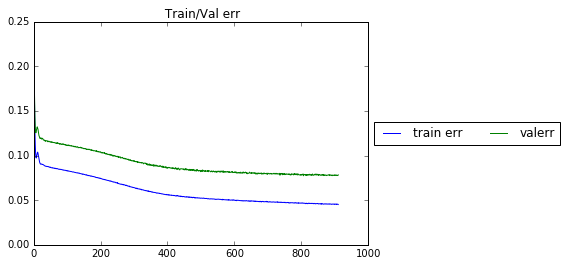

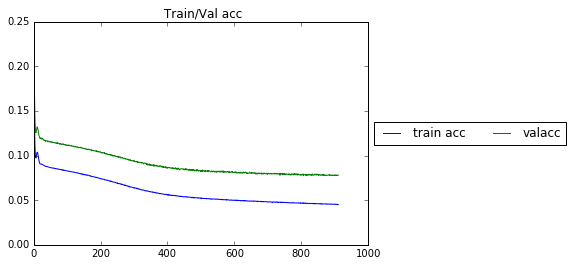

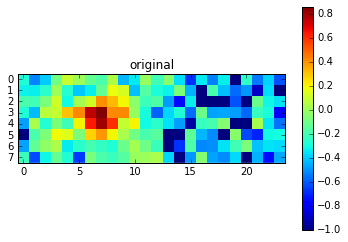

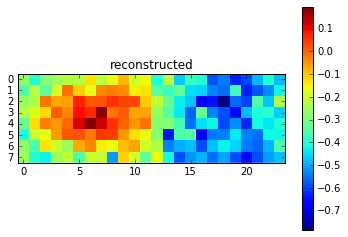

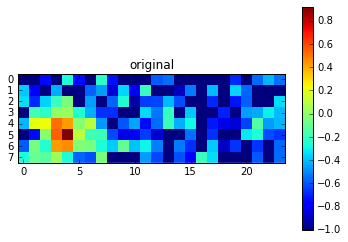

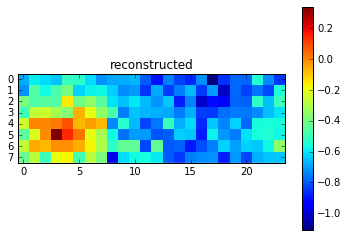

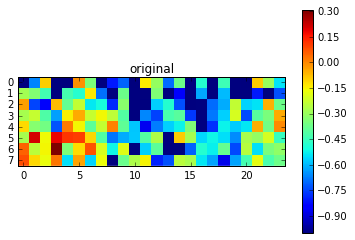

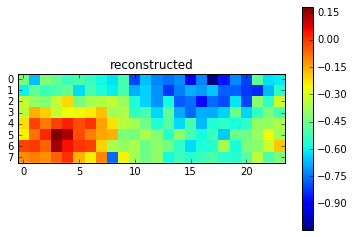

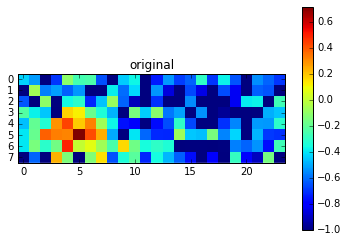

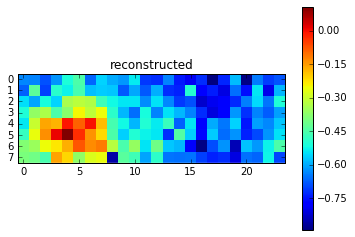

Epoch 912 of 1000 took 0.285s
	training los:		0.0451
	training acc:		4.4875 %
  validation loss:		0.078277
  validation accuracy:		7.83 %
Epoch 913 of 1000 took 0.324s
	training los:		0.0454
	training acc:		4.5444 %
  validation loss:		0.077611
  validation accuracy:		7.76 %
Epoch 914 of 1000 took 0.247s
	training los:		0.0451
	training acc:		4.5044 %
  validation loss:		0.077825
  validation accuracy:		7.78 %
Epoch 915 of 1000 took 0.221s
	training los:		0.0452
	training acc:		4.5235 %
  validation loss:		0.078161
  validation accuracy:		7.82 %
Epoch 916 of 1000 took 0.221s
	training los:		0.0452
	training acc:		4.5314 %
  validation loss:		0.077601
  validation accuracy:		7.76 %
Epoch 917 of 1000 took 0.221s
	training los:		0.0451
	training acc:		4.5057 %
  validation loss:		0.076893
  validation accuracy:		7.69 %
Epoch 918 of 1000 took 0.222s
	training los:		0.0453
	training acc:		4.5062 %
  validation loss:		0.078326
  validation accuracy:		7.83 %
Epoch 919 of 1000 took 0.220s
	tra

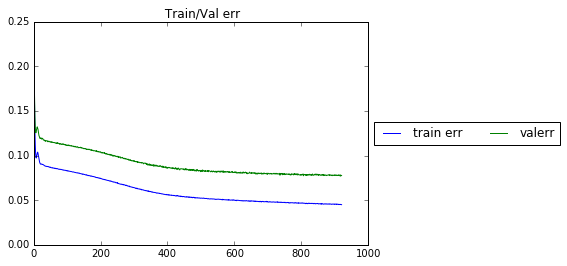

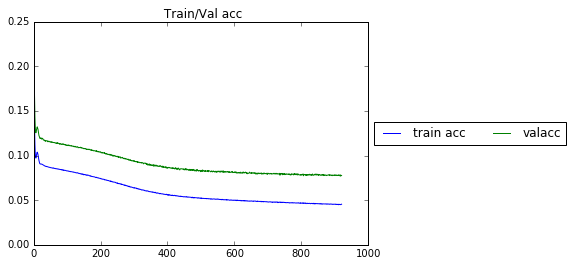

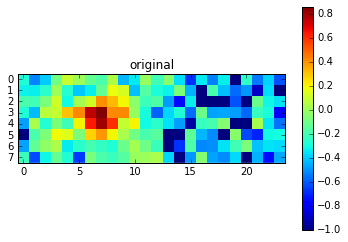

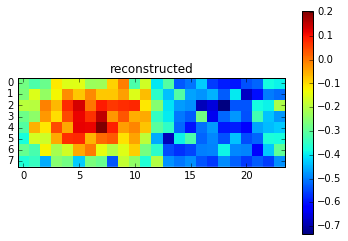

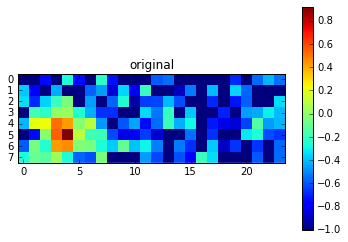

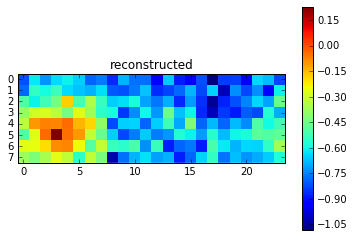

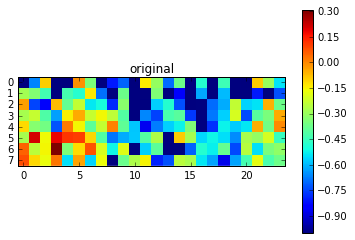

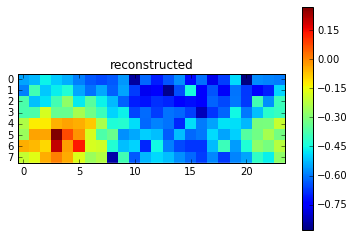

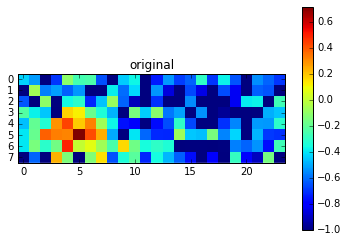

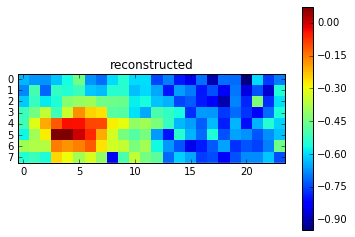

Epoch 922 of 1000 took 0.242s
	training los:		0.0451
	training acc:		4.5081 %
  validation loss:		0.076707
  validation accuracy:		7.67 %
Epoch 923 of 1000 took 0.220s
	training los:		0.0455
	training acc:		4.5117 %
  validation loss:		0.077043
  validation accuracy:		7.70 %
Epoch 924 of 1000 took 0.218s
	training los:		0.0451
	training acc:		4.5044 %
  validation loss:		0.077787
  validation accuracy:		7.78 %
Epoch 925 of 1000 took 0.238s
	training los:		0.0447
	training acc:		4.5168 %
  validation loss:		0.077334
  validation accuracy:		7.73 %
Epoch 926 of 1000 took 0.218s
	training los:		0.0452
	training acc:		4.5217 %
  validation loss:		0.077424
  validation accuracy:		7.74 %
Epoch 927 of 1000 took 0.219s
	training los:		0.0452
	training acc:		4.5023 %
  validation loss:		0.077227
  validation accuracy:		7.72 %
Epoch 928 of 1000 took 0.218s
	training los:		0.0450
	training acc:		4.5031 %
  validation loss:		0.077857
  validation accuracy:		7.79 %
Epoch 929 of 1000 took 0.221s
	tra

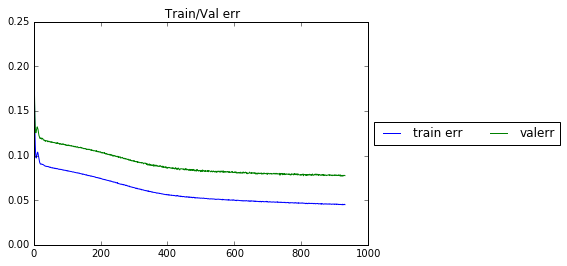

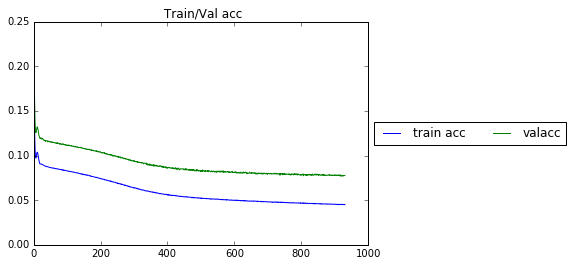

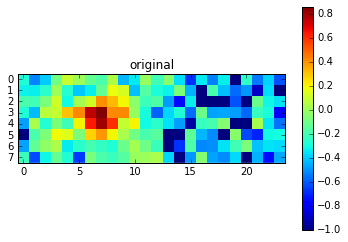

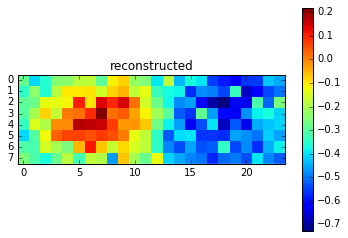

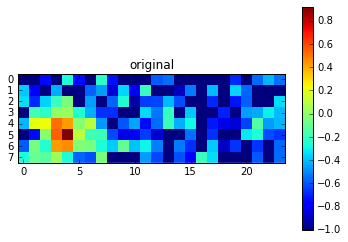

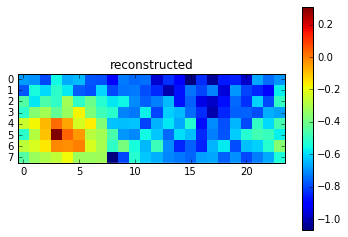

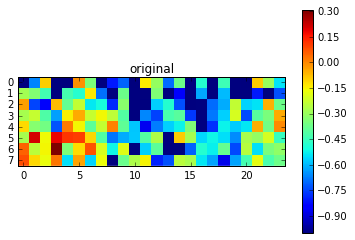

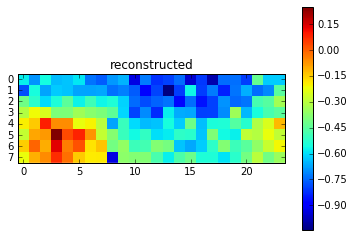

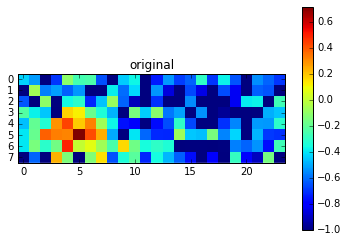

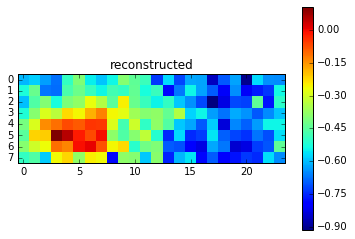

Epoch 932 of 1000 took 0.256s
	training los:		0.0451
	training acc:		4.5103 %
  validation loss:		0.077957
  validation accuracy:		7.80 %
Epoch 933 of 1000 took 0.240s
	training los:		0.0451
	training acc:		4.5300 %
  validation loss:		0.077717
  validation accuracy:		7.77 %
Epoch 934 of 1000 took 0.221s
	training los:		0.0452
	training acc:		4.4989 %
  validation loss:		0.077578
  validation accuracy:		7.76 %
Epoch 935 of 1000 took 0.222s
	training los:		0.0449
	training acc:		4.5047 %
  validation loss:		0.077711
  validation accuracy:		7.77 %
Epoch 936 of 1000 took 0.220s
	training los:		0.0449
	training acc:		4.4919 %
  validation loss:		0.077823
  validation accuracy:		7.78 %
Epoch 937 of 1000 took 0.249s
	training los:		0.0451
	training acc:		4.4631 %
  validation loss:		0.077570
  validation accuracy:		7.76 %
Epoch 938 of 1000 took 0.220s
	training los:		0.0452
	training acc:		4.4816 %
  validation loss:		0.077976
  validation accuracy:		7.80 %
Epoch 939 of 1000 took 0.220s
	tra

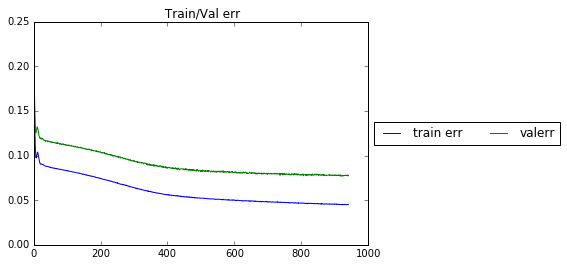

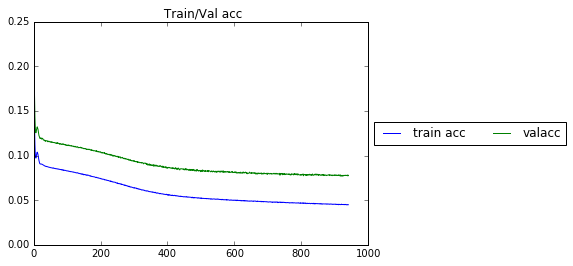

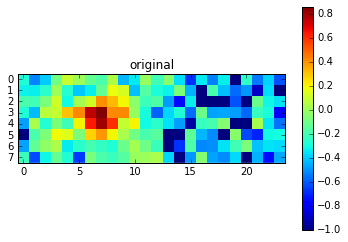

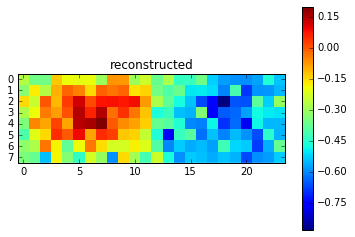

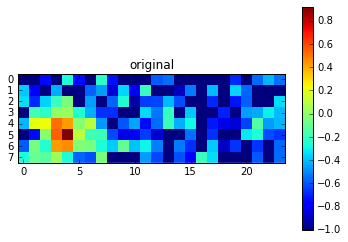

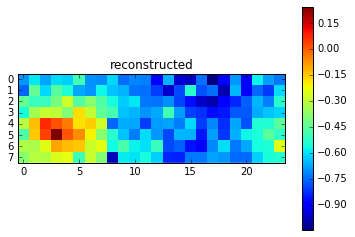

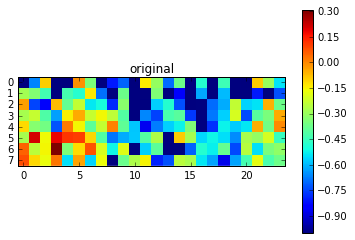

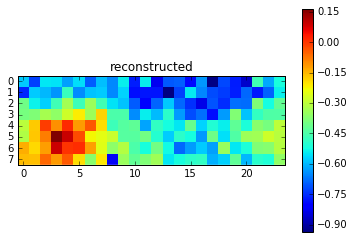

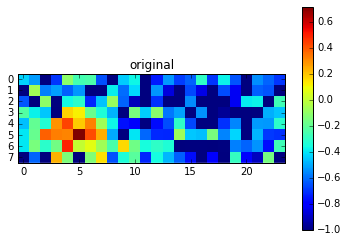

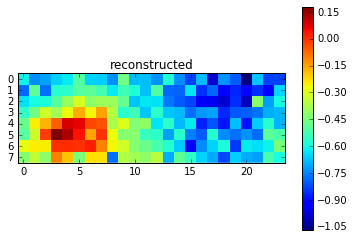

Epoch 942 of 1000 took 0.290s
	training los:		0.0452
	training acc:		4.4701 %
  validation loss:		0.077976
  validation accuracy:		7.80 %
Epoch 943 of 1000 took 0.459s
	training los:		0.0450
	training acc:		4.4916 %
  validation loss:		0.077357
  validation accuracy:		7.74 %
Epoch 944 of 1000 took 0.250s
	training los:		0.0452
	training acc:		4.4987 %
  validation loss:		0.077815
  validation accuracy:		7.78 %
Epoch 945 of 1000 took 0.267s
	training los:		0.0450
	training acc:		4.5039 %
  validation loss:		0.077484
  validation accuracy:		7.75 %
Epoch 946 of 1000 took 0.263s
	training los:		0.0448
	training acc:		4.5063 %
  validation loss:		0.077045
  validation accuracy:		7.70 %
Epoch 947 of 1000 took 0.219s
	training los:		0.0448
	training acc:		4.4822 %
  validation loss:		0.076930
  validation accuracy:		7.69 %
Epoch 948 of 1000 took 0.218s
	training los:		0.0451
	training acc:		4.4985 %
  validation loss:		0.076701
  validation accuracy:		7.67 %
Epoch 949 of 1000 took 0.218s
	tra

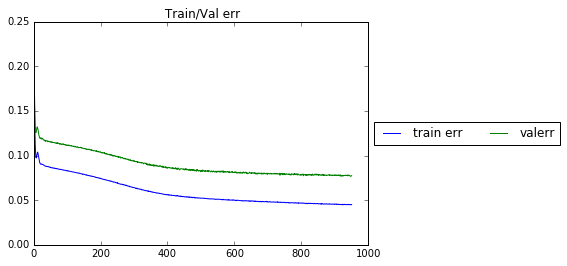

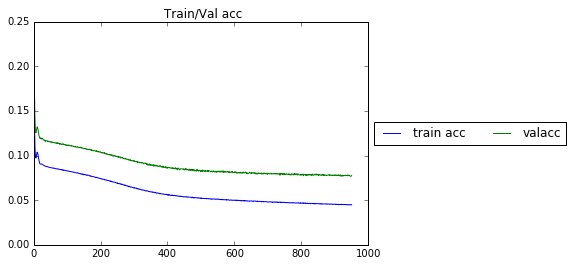

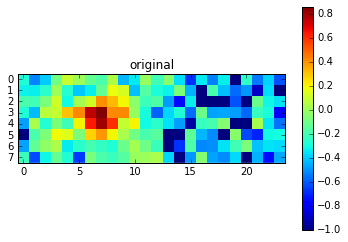

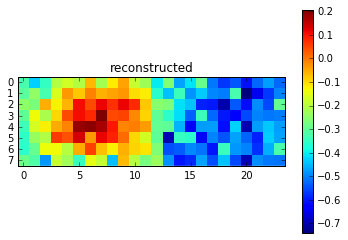

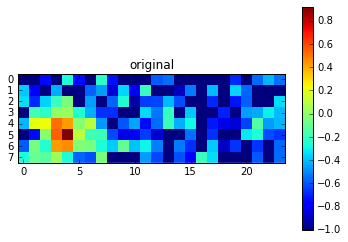

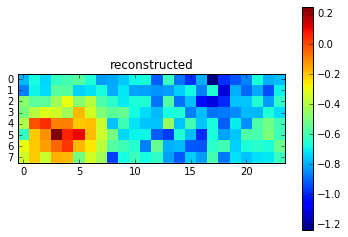

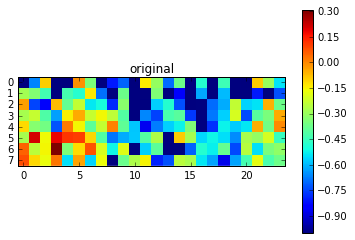

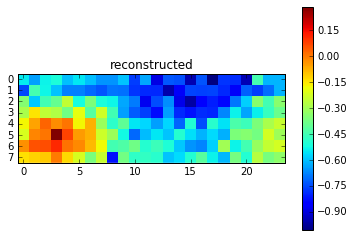

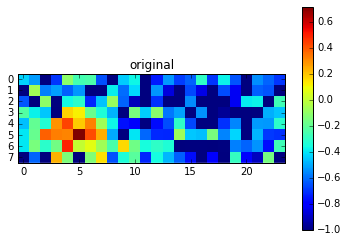

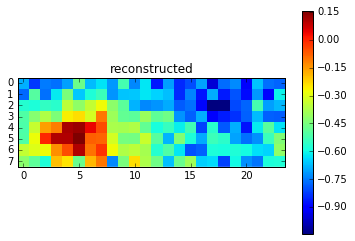

Epoch 952 of 1000 took 0.308s
	training los:		0.0448
	training acc:		4.4655 %
  validation loss:		0.077678
  validation accuracy:		7.77 %
Epoch 953 of 1000 took 0.251s
	training los:		0.0450
	training acc:		4.4868 %
  validation loss:		0.077028
  validation accuracy:		7.70 %
Epoch 954 of 1000 took 0.240s
	training los:		0.0447
	training acc:		4.4910 %
  validation loss:		0.077278
  validation accuracy:		7.73 %
Epoch 955 of 1000 took 0.218s
	training los:		0.0448
	training acc:		4.4713 %
  validation loss:		0.078023
  validation accuracy:		7.80 %
Epoch 956 of 1000 took 0.218s
	training los:		0.0447
	training acc:		4.4592 %
  validation loss:		0.077243
  validation accuracy:		7.72 %
Epoch 957 of 1000 took 0.219s
	training los:		0.0447
	training acc:		4.4577 %
  validation loss:		0.077340
  validation accuracy:		7.73 %
Epoch 958 of 1000 took 0.232s
	training los:		0.0448
	training acc:		4.4824 %
  validation loss:		0.078466
  validation accuracy:		7.85 %
Epoch 959 of 1000 took 0.218s
	tra

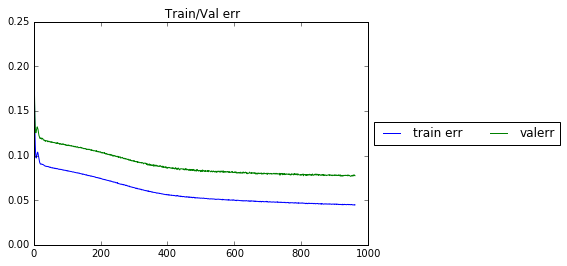

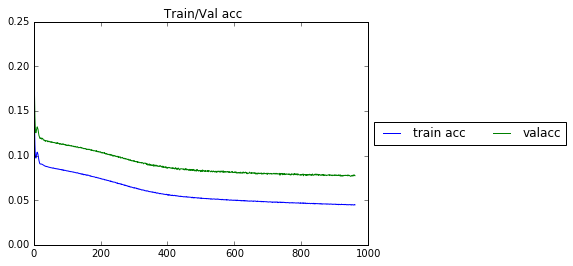

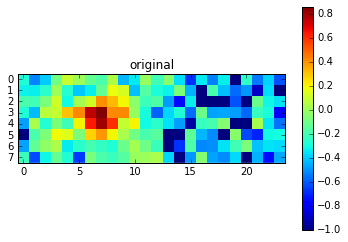

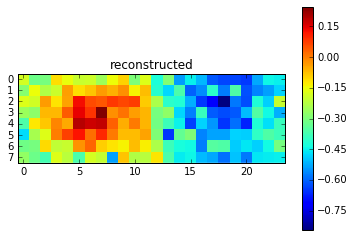

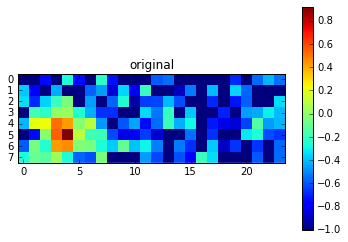

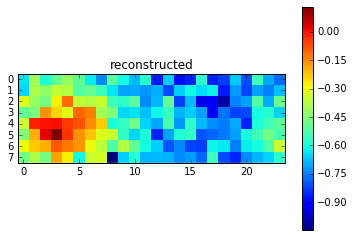

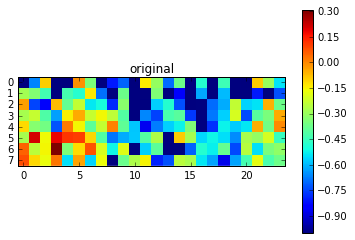

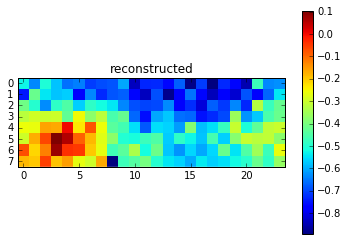

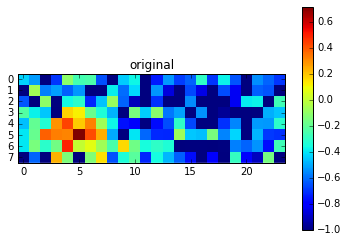

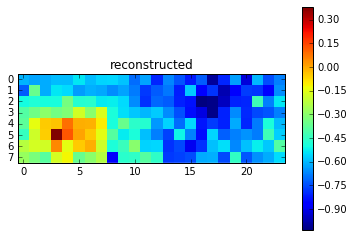

Epoch 962 of 1000 took 0.258s
	training los:		0.0444
	training acc:		4.4500 %
  validation loss:		0.077054
  validation accuracy:		7.71 %
Epoch 963 of 1000 took 0.224s
	training los:		0.0447
	training acc:		4.4986 %
  validation loss:		0.077253
  validation accuracy:		7.73 %
Epoch 964 of 1000 took 0.223s
	training los:		0.0446
	training acc:		4.4605 %
  validation loss:		0.077388
  validation accuracy:		7.74 %
Epoch 965 of 1000 took 0.223s
	training los:		0.0446
	training acc:		4.4570 %
  validation loss:		0.077707
  validation accuracy:		7.77 %
Epoch 966 of 1000 took 0.223s
	training los:		0.0445
	training acc:		4.4825 %
  validation loss:		0.077718
  validation accuracy:		7.77 %
Epoch 967 of 1000 took 0.224s
	training los:		0.0446
	training acc:		4.4449 %
  validation loss:		0.077354
  validation accuracy:		7.74 %
Epoch 968 of 1000 took 0.223s
	training los:		0.0446
	training acc:		4.4502 %
  validation loss:		0.077356
  validation accuracy:		7.74 %
Epoch 969 of 1000 took 0.223s
	tra

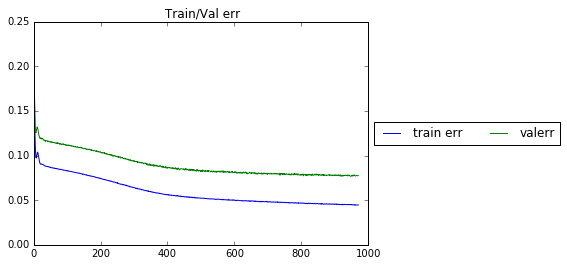

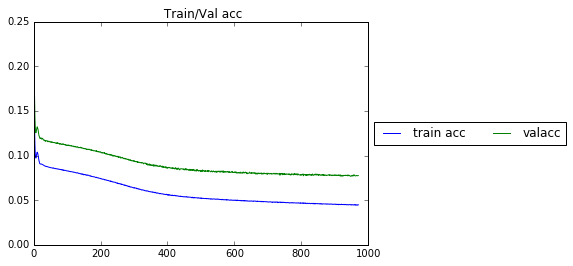

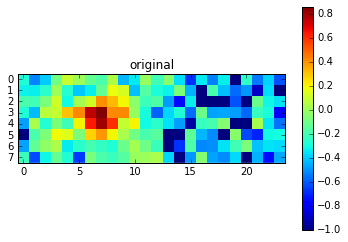

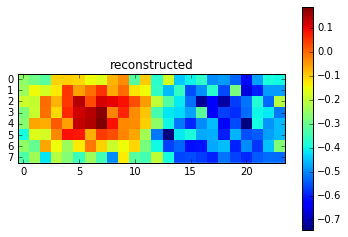

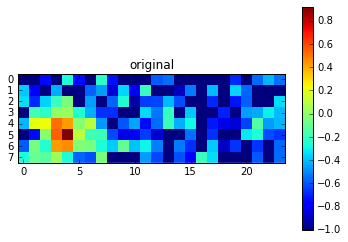

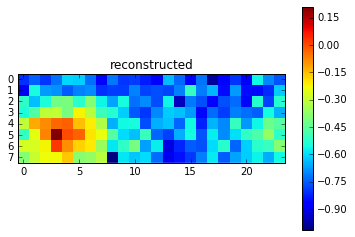

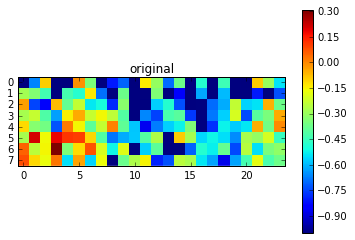

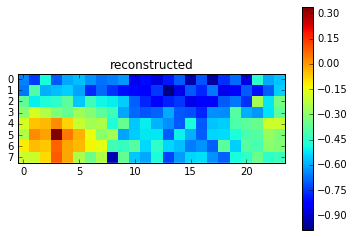

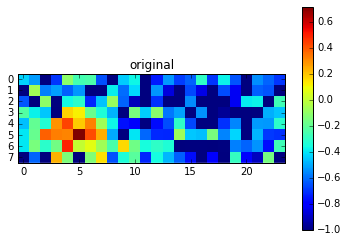

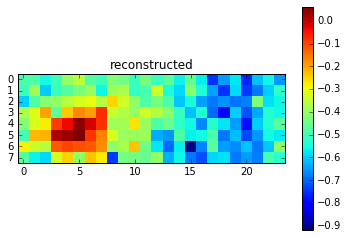

Epoch 972 of 1000 took 0.285s
	training los:		0.0448
	training acc:		4.4295 %
  validation loss:		0.077469
  validation accuracy:		7.75 %
Epoch 973 of 1000 took 0.256s
	training los:		0.0448
	training acc:		4.4413 %
  validation loss:		0.077015
  validation accuracy:		7.70 %
Epoch 974 of 1000 took 0.252s
	training los:		0.0447
	training acc:		4.4656 %
  validation loss:		0.077247
  validation accuracy:		7.72 %
Epoch 975 of 1000 took 0.225s
	training los:		0.0446
	training acc:		4.4774 %
  validation loss:		0.077174
  validation accuracy:		7.72 %
Epoch 976 of 1000 took 0.220s
	training los:		0.0448
	training acc:		4.4332 %
  validation loss:		0.076845
  validation accuracy:		7.68 %
Epoch 977 of 1000 took 0.226s
	training los:		0.0445
	training acc:		4.4373 %
  validation loss:		0.077968
  validation accuracy:		7.80 %
Epoch 978 of 1000 took 0.221s
	training los:		0.0443
	training acc:		4.4317 %
  validation loss:		0.077622
  validation accuracy:		7.76 %
Epoch 979 of 1000 took 0.223s
	tra

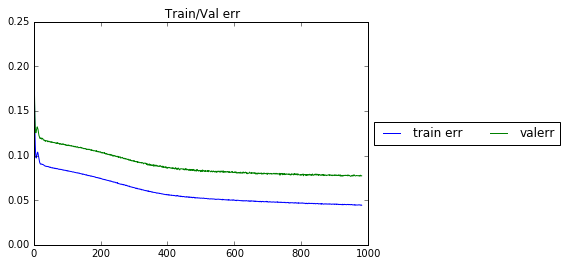

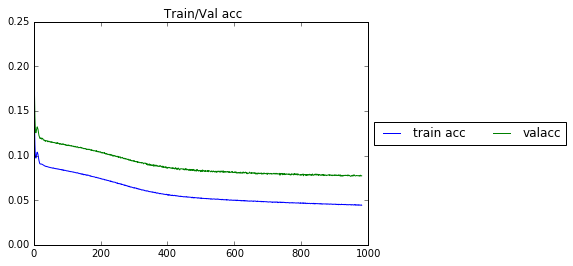

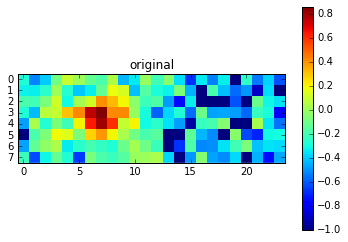

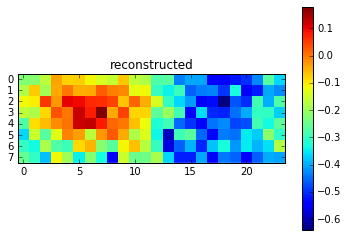

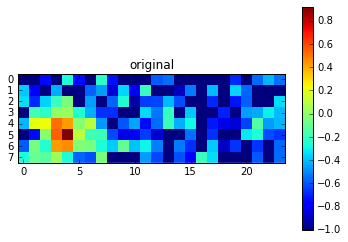

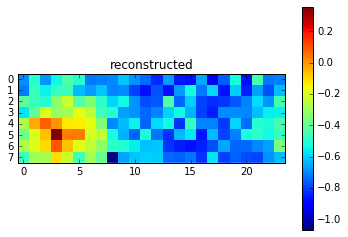

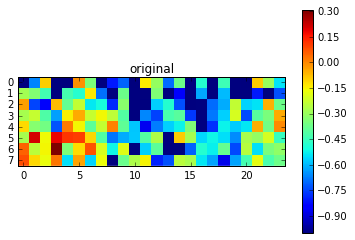

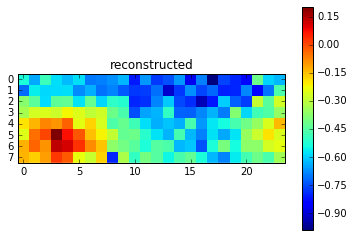

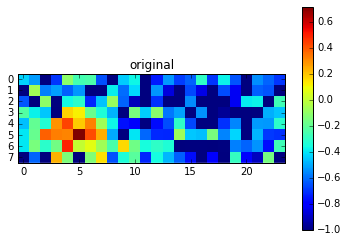

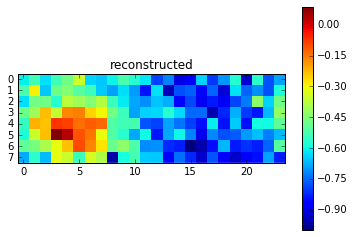

Epoch 982 of 1000 took 0.295s
	training los:		0.0446
	training acc:		4.4530 %
  validation loss:		0.077388
  validation accuracy:		7.74 %
Epoch 983 of 1000 took 0.230s
	training los:		0.0443
	training acc:		4.4633 %
  validation loss:		0.076726
  validation accuracy:		7.67 %
Epoch 984 of 1000 took 0.224s
	training los:		0.0443
	training acc:		4.4276 %
  validation loss:		0.078186
  validation accuracy:		7.82 %
Epoch 985 of 1000 took 0.255s
	training los:		0.0446
	training acc:		4.4104 %
  validation loss:		0.076428
  validation accuracy:		7.64 %
Epoch 986 of 1000 took 0.230s
	training los:		0.0445
	training acc:		4.4400 %
  validation loss:		0.077420
  validation accuracy:		7.74 %
Epoch 987 of 1000 took 0.224s
	training los:		0.0444
	training acc:		4.4307 %
  validation loss:		0.077384
  validation accuracy:		7.74 %
Epoch 988 of 1000 took 0.244s
	training los:		0.0445
	training acc:		4.4241 %
  validation loss:		0.077286
  validation accuracy:		7.73 %
Epoch 989 of 1000 took 0.226s
	tra

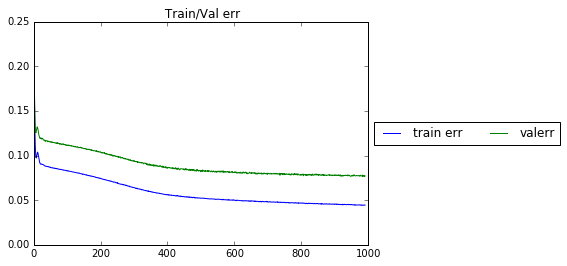

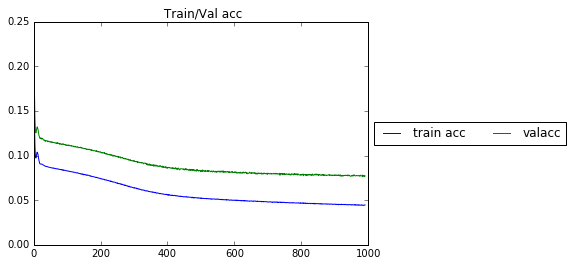

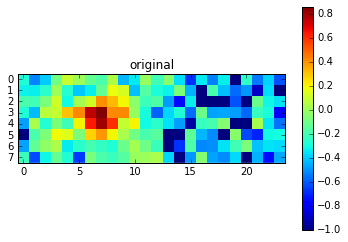

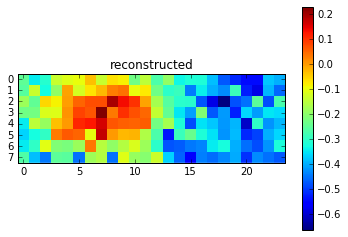

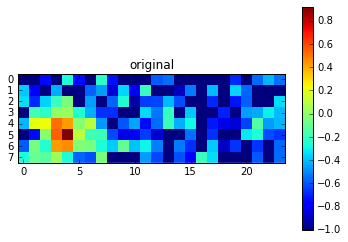

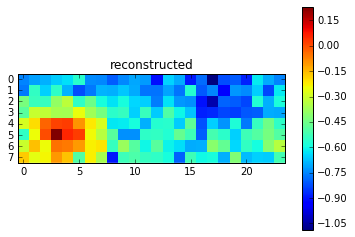

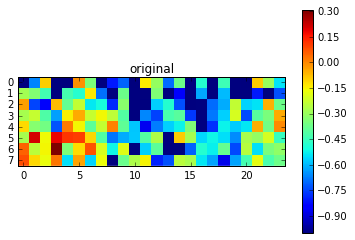

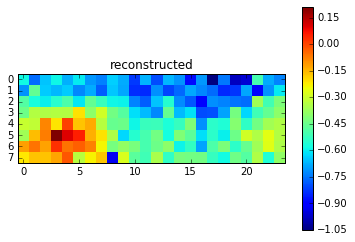

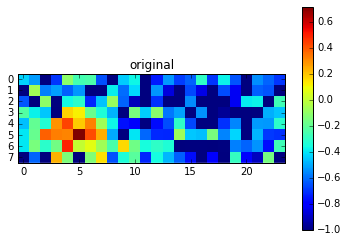

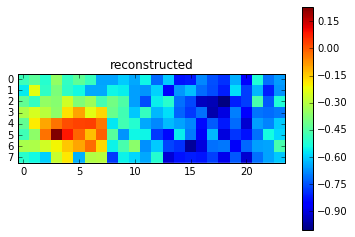

Epoch 992 of 1000 took 0.237s
	training los:		0.0442
	training acc:		4.4703 %
  validation loss:		0.077158
  validation accuracy:		7.72 %
Epoch 993 of 1000 took 0.218s
	training los:		0.0443
	training acc:		4.4118 %
  validation loss:		0.077116
  validation accuracy:		7.71 %
Epoch 994 of 1000 took 0.217s
	training los:		0.0444
	training acc:		4.4646 %
  validation loss:		0.077259
  validation accuracy:		7.73 %
Epoch 995 of 1000 took 0.219s
	training los:		0.0442
	training acc:		4.4327 %
  validation loss:		0.076984
  validation accuracy:		7.70 %
Epoch 996 of 1000 took 0.217s
	training los:		0.0444
	training acc:		4.4153 %
  validation loss:		0.076962
  validation accuracy:		7.70 %
Epoch 997 of 1000 took 0.217s
	training los:		0.0445
	training acc:		4.4104 %
  validation loss:		0.077286
  validation accuracy:		7.73 %
Epoch 998 of 1000 took 0.219s
	training los:		0.0442
	training acc:		4.4437 %
  validation loss:		0.077172
  validation accuracy:		7.72 %
Epoch 999 of 1000 took 0.219s
	tra

In [6]:
dca.fit(x_train,x_train,x_val,x_val)

In [1]:
rec= dca.predict(x_train)

NameError: name 'dca' is not defined

In [ ]:
hlayer = dca.extract_hidden_layer(x_train)

In [7]:
hyparam_dict={}

train((x_train, x_train, x_val, x_val, x_test, x_test), network_kwargs=hyparam_dict)